# Advanced Lane Finding Project

# 1. Compute Camera Calibration using chessboard images

Image distortion occurs when a camera looks at 3D objects in the real world and transforms them into a 2D image; this transformation isn’t perfect. Distortion actually changes what the shape and size of these 3D objects appear to be. So, the first step in analyzing camera images, is to undo this distortion so that it we can get correct and useful information out of them

I prepare "object points", which will be the 3D coordinates of the chessboard corners in the world. Here the given chessboard images has fixed on the 2D(9, 6) plane at z=0, such that the object points are the same for each calibration image. Thus, objp is just a replicated array of coordinates, and objpoints will be appended with a copy of it every time I successfully detect all chessboard corners in a test image. imgpoints will be appended with the (x, y) pixel position of each of the corners in the image plane with each successful chessboard detection.

I then used the output objpoints and imgpoints to compute the camera calibration and distortion coefficients using the cv2.calibrateCamera() function. I applied this distortion correction to the test image using the cv2.undistort() function and obtained this result:

### Compute Object and Image points

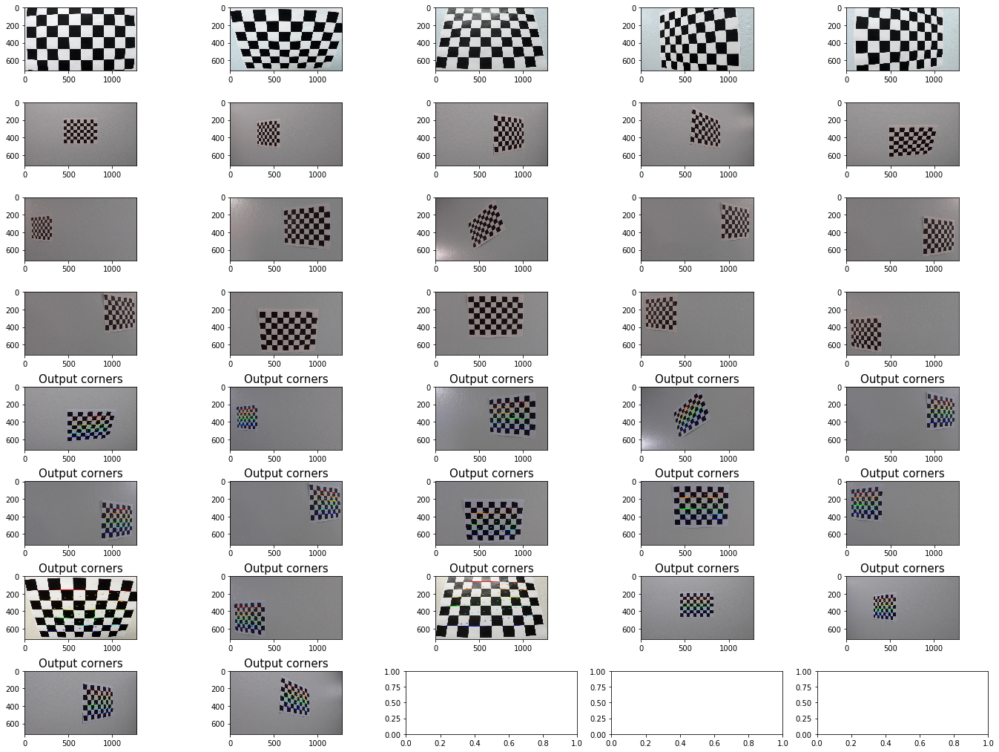

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip
#%matplotlib qt
%matplotlib inline

f,axes= plt.subplots(8,5, figsize=(24,18))
f.subplots_adjust(hspace=0.5)
row=0
col=0
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.
rgb_imgshow = []


# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
total_no_of_images = len(images)

'''
Input image display

'''   
for i in range (total_no_of_images):
    image= cv2.imread("./camera_cal/calibration"+str(i+1)+".jpg")
    axes[row,col].imshow(image)
    #axes.set_title('InputImage', fontsize=50)
    col+=1
    if(col==5):
        col=0
        row+=1

i=0   
j=0
# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #cv2.imshow('Original image',fname)
    #cv2.waitkey(1000)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        
        rgb_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[row,col].imshow(rgb_img)
        axes[row,col].set_title('Output corners', fontsize = 15)
        col+=1
        if(col==5):
            col=0
            row+=1
        #rgb_imgshow.append(rgb_img)
        #plt.imshow(rgb_img)
        #plt.title("Output Corners"+str(i+1))
        #plt.show()
        i = i+1
        
        #axes.imshow(img)
        #cv2.imshow('img',img)
        #cv2.waitKey(500)

cv2.destroyAllWindows()


### Camera Calibration

Text(0.5,1,'Undistorted Image')

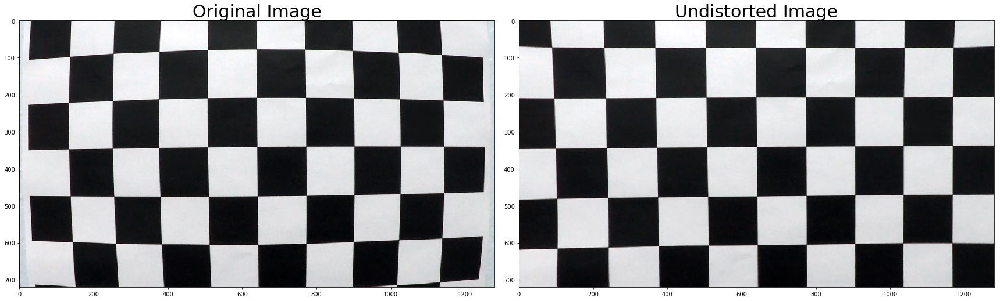

In [2]:
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Find the Camera calibration Once given object points, image points(derived 
#above line 1-32) and the shape of the grayscale image:
ret, mtx, dist, rvesc, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

# Above function return distortion coffecient(dist), cameera matrix (mtx)
# and rotation and translation vector in real world and these information will be used 
# in section bellow to correct the distortion of an image
undistort = cv2.undistort(img, mtx, dist, None, mtx)


# Visualize the undistortion on a calibration image

f, (ax1, ax2) = plt.subplots(1,2, figsize=(24,9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize = 30)

ax2.imshow(undistort)
ax2.set_title('Undistorted Image', fontsize = 30)

### Undistortion

Distortion correction on test images
720
1280
720
1280
720
1280
720
1280
720
1280
720
1280
720
1280
7


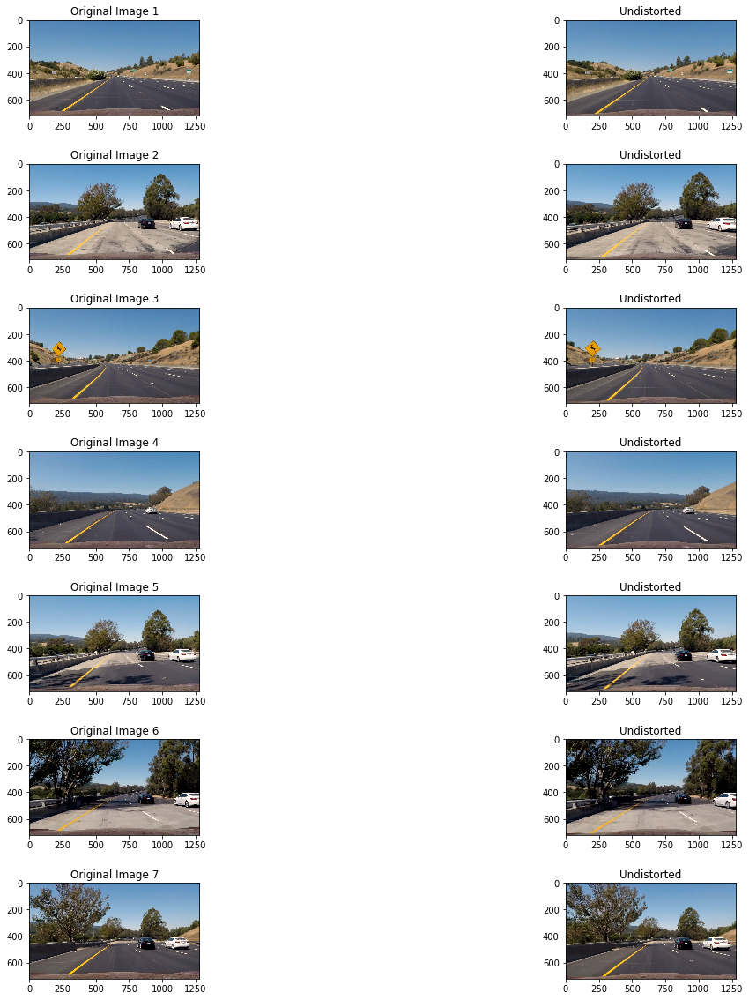

In [3]:
'''
img_test1 = cv2.imread("./Challenge_img/challenge_video_001.jpg")
img_test2 = cv2.imread("./Challenge_img/challenge_video_002.jpg")
img_test3 = cv2.imread("./Challenge_img/challenge_video_003.jpg")
img_test4 = cv2.imread("./Challenge_img/challenge_video_004.jpg")
img_test5 = cv2.imread("./Challenge_img/challenge_video_005.jpg")
img_test6 = cv2.imread("./Challenge_img/challenge_video_006.jpg")
img_test7 = cv2.imread("./Challenge_img/challenge_video_007.jpg")
'''
img_test1 = cv2.imread("./test_images/straight_lines1.jpg")
img_test2 = cv2.imread("./test_images/test1.jpg")
img_test3 = cv2.imread("./test_images/test2.jpg")
img_test4 = cv2.imread("./test_images/test3.jpg")
img_test5 = cv2.imread("./test_images/test4.jpg")
img_test6 = cv2.imread("./test_images/test5.jpg")
img_test7 = cv2.imread("./test_images/test6.jpg")

undistorted_imgs = []
test_images=[img_test1,img_test2,img_test3,img_test4,img_test5,img_test6,img_test7]
row=0
f,axes= plt.subplots(len(test_images),2, figsize=(20,20))
f.subplots_adjust(hspace=0.5)
print("Distortion correction on test images")
def undistort(img):
    return cv2.undistort(img,mtx,dist, None, mtx)

for image in test_images:
    image= cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
    y=image.shape[0]
    x=image.shape[1]
    print(y)
    print(x)
    axes[row,0].set_title('Original Image '+str(row+1))
    axes[row,0].imshow(image)
    undistorted_image= undistort(image)
    undistorted_imgs.append(undistorted_image)
    axes[row,1].imshow(undistorted_image)
    axes[row,1].set_title('Undistorted')
    row+=1
print(len(undistorted_imgs))

### Perspective Transform

In [4]:
'''
warper - Transform the perspective of a given image using the source and destination points.
'''
def warper(img, src, dst):

    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    
    #Transform matrix
    M = cv2.getPerspectiveTransform(src, dst)

    #Inverse transform matrix
    Minv = cv2.getPerspectiveTransform(dst, src)

    # keep same size as input image
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)

    return warped, M, Minv

The warper() function takes as inputs an image (img), as well as source (src) and destination (dst) points. I chose the hardcode the source and destination points in the following manner:

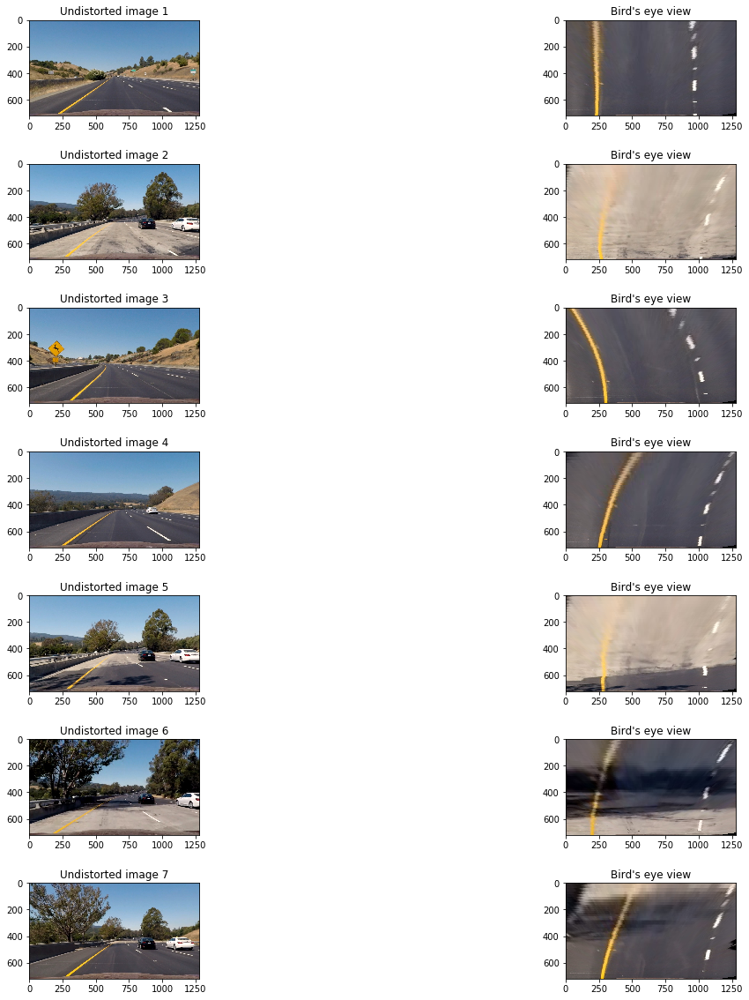

In [5]:

Warped_images = []

offset=200
height, width= img_test1.shape[0], img_test1.shape[1]
src=np.float32([(593,450),(700,450),(1200,700),(200,700)])    #top_left, top_right, bottom_right,bottom_left
dst=np.float32([(offset,0),(width-offset,0),(width-offset,height),(offset,height)]) #top_left, top_right,bottom_right,bottom_left
'''

src = np.float32(
    [[(img_size[0] / 2) - 80, img_size[1] / 2 + 120], # top left
    [((img_size[0] / 4) - 75), img_size[1]],         # bottom left
    [(img_size[0] ) - 115, img_size[1]],             # bottom right
    [(img_size[0] / 2 + 120), img_size[1] / 2 + 120]] # top right
    )
dst = np.float32(
    [[(img_size[0] / 4), 0],
    [(img_size[0] / 4), img_size[1]],
    [(img_size[0] * 3 / 4), img_size[1]],
    [(img_size[0] * 3 / 4), 0]])
'''
f,axes= plt.subplots(len(undistorted_imgs),2, figsize=(20,20))
#f.tight_layout()
f.subplots_adjust(hspace=0.5)
row=0
#Unwarped_images=[]

for image in undistorted_imgs:
    warp_img, M, Minv = warper(image, src, dst)
    Warped_images.append(warp_img)
    y=image.shape[0]
    x=image.shape[1]
    
    # Draw src points on undistorted image
    '''
    pts = np.array(src, np.int32)
    pts = pts.reshape((-1,1,2))
    cv2.polylines(image,[pts],True,(255,0,0), 3)
    
    # Draw dst points on warp image
    pts = np.array(dst, np.int32)
    pts = pts.reshape((-1,1,2))
    cv2.polylines(warp_img,[pts],True,(255,0,0), 3)
    '''
    axes[row,0].imshow(image)
    axes[row,0].set_title('Undistorted image '+str(row+1))
    axes[row,1].imshow(warp_img)
    axes[row,1].set_title("Bird's eye view")
    row+=1 


### Experiment on various color spaces

4


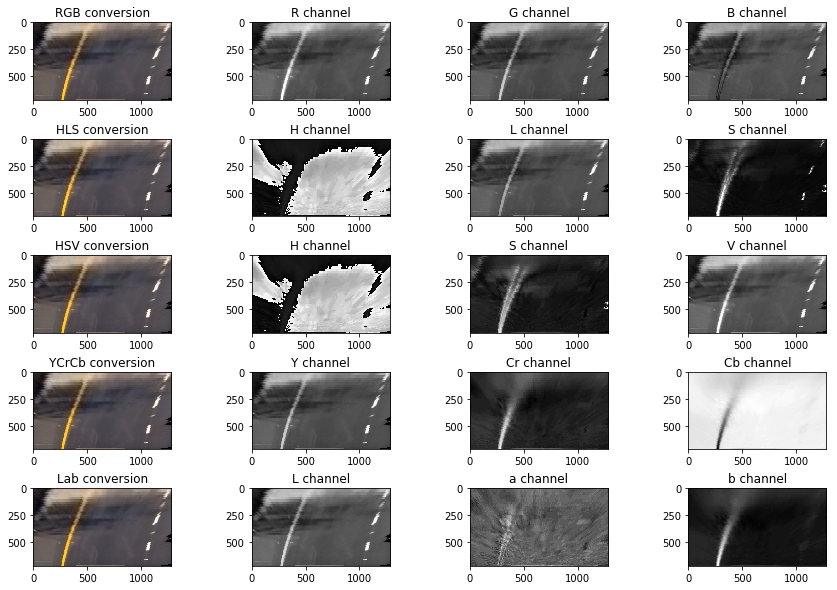

In [6]:
row=0
undistorted_unwarped_image=Warped_images[6] ##  test6.jpg : This image has dark and bright portions and will be good to observe
titles=[['R','G','B'],['H','L','S'],['H','S','V'],['Y','Cr','Cb'],['L','a','b']]
color_spaces=[cv2.COLOR_RGB2HLS,cv2.COLOR_RGB2HSV, cv2.COLOR_RGB2YCrCb, cv2.COLOR_RGB2Lab]
print(len(color_spaces))
f,axes= plt.subplots(len(color_spaces)+1,4, figsize=(15,10))
f.subplots_adjust(hspace =0.5)
colorspace= None
for index in range(len(color_spaces)+1):
    if(index==0):
        colorspace= undistorted_unwarped_image
    else:
        colorspace= cv2.cvtColor(undistorted_unwarped_image,color_spaces[index-1])
    axes[index,0].imshow(undistorted_unwarped_image)
    axes[index,0].set_title(''.join(titles[index]) +' conversion')
    for channel in range(3):
        this_channel= colorspace[:,:,channel]
        axes[index,channel+1].imshow(this_channel,cmap='gray')
        axes[index,channel+1].set_title(titles[index][channel]+' channel')

Out of the all the channels visualized above, R channel from RGB, S channel from HSV or HLS, Y channel from YCrCb and L channel from Lab colorspace looks promising and are able to identify the lane lines easily.


In [7]:
def channel_threshold(img,thresh):
    img = img*(255/np.max(img))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(img)
    binary_output[(img > thresh[0]) & (img <= thresh[1])] = 1
    return binary_output

In [8]:
def Custom_channel(img):
    
    imgY=cv2.cvtColor(img,cv2.COLOR_RGB2YCrCb)[:,:,0] # Y channel
    imgCr=cv2.cvtColor(img,cv2.COLOR_RGB2YCrCb)[:,:,1] #Cr channel
    imgHL_S=cv2.cvtColor(img,cv2.COLOR_RGB2HLS)[:,:,2] #S channel
    imgLab_L=cv2.cvtColor(img,cv2.COLOR_RGB2Lab)[:,:,0] #L channel
    return imgY, imgCr, imgHL_S, imgLab_L

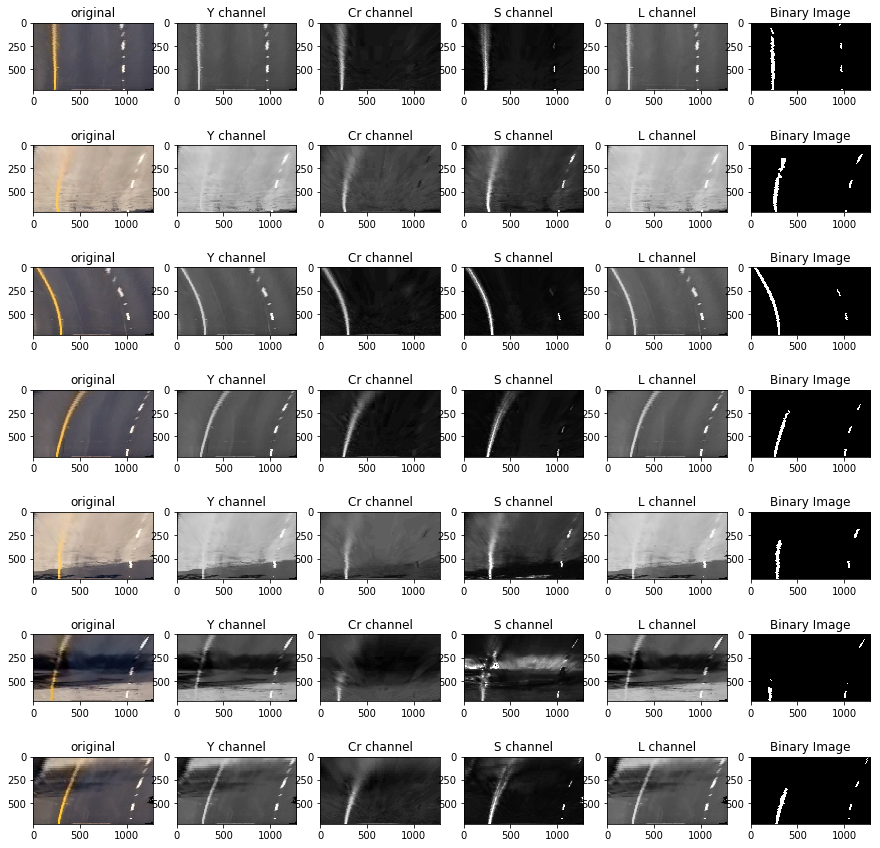

In [9]:
f,axes= plt.subplots(len(Warped_images),6, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0

for image in Warped_images:
    imgY, imgCr, imgHL_S, imgLab_L= Custom_channel(image)
    axes[row,0].imshow(image)
    axes[row,0].set_title('original')
    axes[row,1].imshow(imgY, cmap='gray')
    axes[row,1].set_title('Y channel')
    axes[row,2].imshow(imgCr, cmap='gray')
    axes[row,2].set_title('Cr channel')
    axes[row,3].imshow(imgHL_S, cmap='gray')
    axes[row,3].set_title('S channel')
    axes[row,4].imshow(imgLab_L, cmap='gray')
    axes[row,4].set_title('L channel')
    Ybinary= channel_threshold(imgY,(220,255))
    Crbinary= channel_threshold(imgCr,(220,255))
    HL_Sbinary= channel_threshold(imgHL_S,(220,255))
    Lab_Lbinary= channel_threshold(imgLab_L,(220,255))
    combinedImage= np.zeros_like(Ybinary)
    combinedImage[(Crbinary==1)|(Ybinary==1)|((Lab_Lbinary==1)&(HL_Sbinary==1))]=1
    axes[row,5].imshow(combinedImage, cmap='gray')
    axes[row,5].set_title('Binary Image')
    row+=1

### Sobel X and Y

In [10]:
def sobel_image(img, orient='x', thresh_min=0, thresh_max=255, convert=True):
    gray= img
    if(convert):
        gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobel=None
    if(orient=='x'):
        sobel= cv2.Sobel(gray, cv2.CV_64F, 1,0)
    else:
        sobel= cv2.Sobel(gray, cv2.CV_64F, 0,1)
    
    sobel_abs= np.absolute(sobel)
    sobel_8bit= np.uint8(255* sobel_abs/np.max(sobel_abs))
    binary_output= np.zeros_like(sobel_8bit) 
    binary_output[(sobel_8bit>=thresh_min) & (thresh_max>=sobel_8bit)]=1
    
    return binary_output

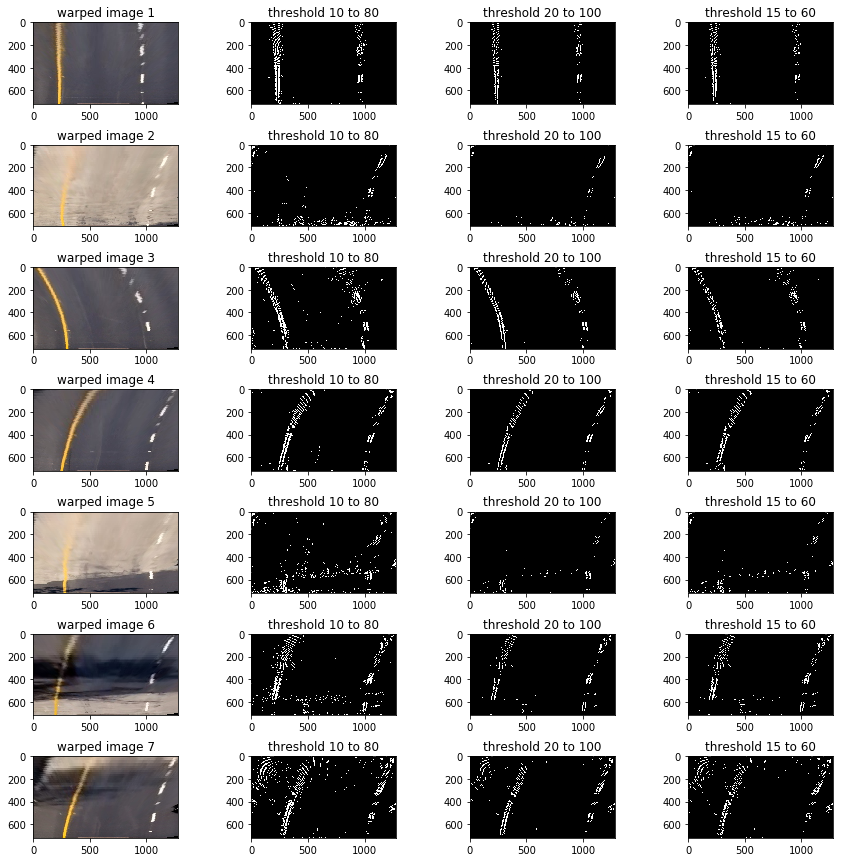

In [11]:
threshVal= [(10,80),(20,100),(15,60)]

f,axes= plt.subplots(len(Warped_images),4, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0
for image in Warped_images:
    
    axes[row,0].imshow(image)
    axes[row,0].set_title('warped image '+str(row+1))
    #image= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]
    sobel_applied_image1= sobel_image(image, 'x', threshVal[0][0], threshVal[0][1], True)
    axes[row,1].imshow(sobel_applied_image1,cmap='gray')
    axes[row,1].set_title('threshold '+str(threshVal[0][0])+' to '+str(threshVal[0][1]))
    sobel_applied_image2= sobel_image(image, 'x', threshVal[1][0], threshVal[1][1], True)
    axes[row,2].imshow(sobel_applied_image2,cmap='gray')
    axes[row,2].set_title('threshold '+str(threshVal[1][0])+' to '+str(threshVal[1][1]))
    sobel_applied_image3= sobel_image(image, 'x', threshVal[2][0], threshVal[2][1], True)
    axes[row,3].imshow(sobel_applied_image3,cmap='gray')
    axes[row,3].set_title('threshold '+str(threshVal[2][0])+' to '+str(threshVal[2][1]))
    row+=1


In image 2, 5 and 6, the left lane line is completely getting misidentified. Sobel is identifying road edge as the lane line

### Sobel Gradient

In [12]:
def sobel_gradient_image(img, thresh=(0, np.pi/2), convert=True):
    gray= img
    if(convert):
        gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    sobelx= cv2.Sobel(gray, cv2.CV_64F, 1,0, ksize=15)
    sobely= cv2.Sobel(gray, cv2.CV_64F, 0,1, ksize=15)
    
    abs_sobelx= np.absolute(sobelx)
    abs_sobely= np.absolute(sobely)
    
    grad= np.arctan2(abs_sobely, abs_sobelx)
    
    binary_output=np.zeros_like(grad)
    binary_output[(grad>thresh[0])&(grad<thresh[1])]=1
    return binary_output

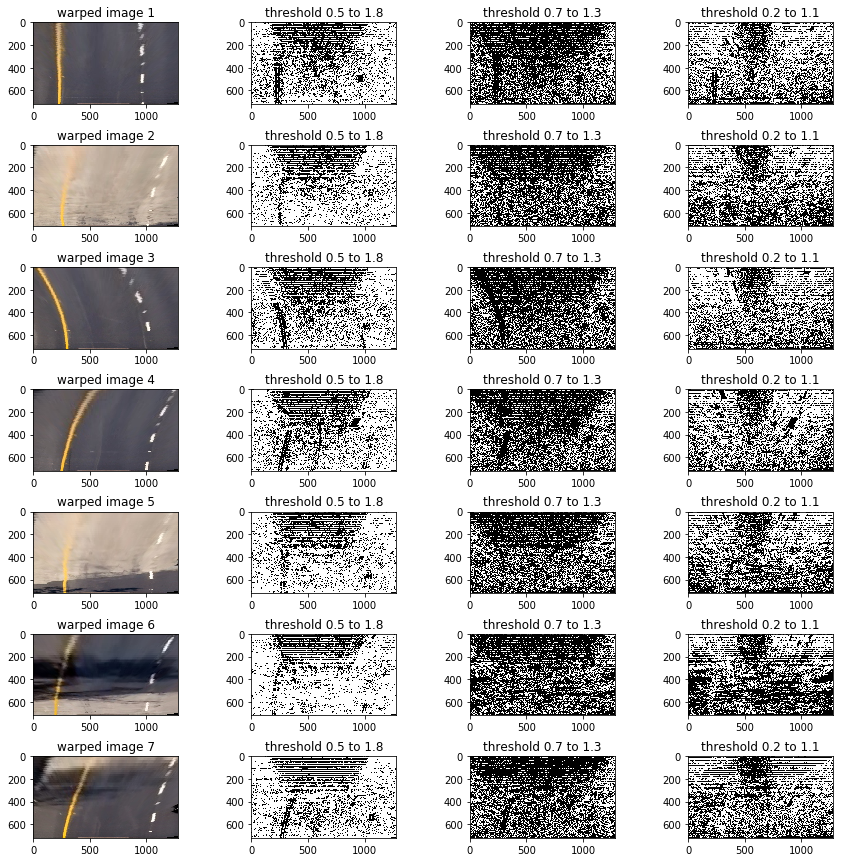

In [13]:
threshGrad= [(0.5,1.8),(0.7,1.3),(0.2,1.1)]

f,axes= plt.subplots(len(Warped_images),4, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0
convert=True
for image in Warped_images:
    
    axes[row,0].imshow(image)
    axes[row,0].set_title('warped image '+str(row+1))
#     image= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]
#     convert=False
    sobel_grd_output= sobel_gradient_image(image, threshGrad[0], convert)
    axes[row,1].imshow(sobel_grd_output,cmap='gray')
    axes[row,1].set_title('threshold '+str(threshGrad[0][0])+' to '+str(threshGrad[0][1]))
    sobel_grd_output_2= sobel_gradient_image(image,  threshGrad[1], convert)
    axes[row,2].imshow(sobel_grd_output_2,cmap='gray')
    axes[row,2].set_title('threshold '+str(threshGrad[1][0])+' to '+str(threshGrad[1][1]))
    sobel_grd_output_3= sobel_gradient_image(image,  threshGrad[2], convert)
    axes[row,3].imshow(sobel_grd_output_3,cmap='gray')
    axes[row,3].set_title('threshold '+str(threshGrad[2][0])+' to '+str(threshGrad[2][1]))
    row+=1

### Combine Sobel with Channels

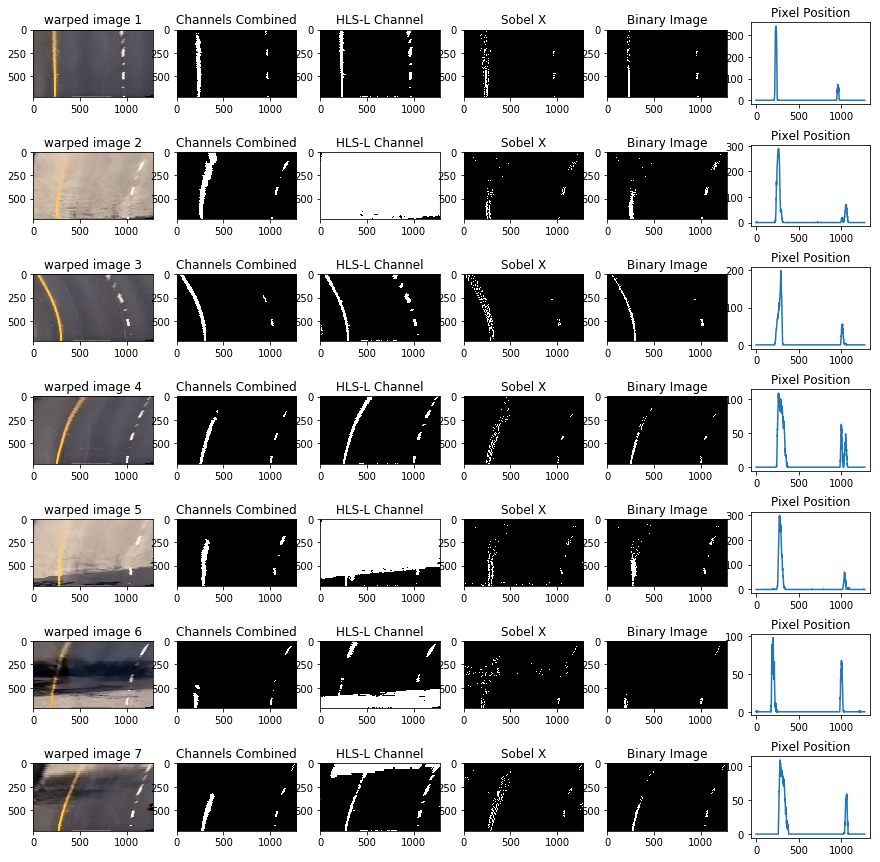

In [25]:
f,axes= plt.subplots(len(Warped_images),6, figsize=(15,15))
f.subplots_adjust(hspace =0.5)
row=0
convert=True
FinalBinary_Image=[]
for image in Warped_images:
    
    axes[row,0].imshow(image)
    axes[row,0].set_title('warped image '+str(row+1))
    
    #image= cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)[:,:,1]
    imgY, imgCr, imgHL_S, imgLab_L= Custom_channel(image)
    
    Ybinary= channel_threshold(imgY,(215,255))
    Crbinary= channel_threshold(imgCr,(215,255))
    Lbinary= channel_threshold(imgLab_L,(215,255))
    Sbinary= channel_threshold(imgHL_S,(200,255))
    combined1 = np.zeros_like(imgY)
    combined1[(Crbinary==1)|(Ybinary==1)|((Lbinary==1)&(Sbinary==1))]=1
    axes[row,1].imshow(combined1,cmap='gray')
    axes[row,1].set_title('Channels Combined')
    
    l_channel= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 120) & (l_channel <= 255)] = 1
    axes[row,2].imshow(l_binary,cmap='gray')
    axes[row,2].set_title('HLS-L Channel')
    image_S_channel= cv2.cvtColor(image, cv2.COLOR_RGB2HLS)[:,:,2]
    convert=False
    
    sobelx_image= sobel_image(image_S_channel,'x', 15,60, convert)
    axes[row,3].imshow(sobelx_image,cmap='gray')
    axes[row,3].set_title('Sobel X')
    
    
    combined_YCrSL = np.zeros_like(sobelx_image)
    #combined_YCrSL[((Crbinary==1)|(Ybinary==1)|((Lbinary==1)& (Sbinary == 1) )|(sobelx_image==1))& (l_binary == 1)]=1
    combined_YCrSL[((Sbinary == 1) | (sobelx_image == 1)) & (l_binary == 1) ] = 1
    axes[row,4].imshow(combined_YCrSL,cmap='gray')
    axes[row,4].set_title('Binary Image')
    FinalBinary_Image.append(combined_YCrSL)
    histogram = np.sum(combined_YCrSL[combined_YCrSL.shape[0]//2:,:], axis=0)
    axes[row,5].plot(histogram)
    axes[row,5].set_title('Pixel Position')  
    

    
    row+=1

### Finding Line on detected lanes and plotting windows

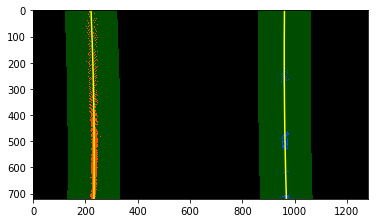

In [26]:
def locate_lines(binary_warped, nwindows = 9, margin = 100, minpix = 50):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[int(binary_warped.shape[0]/2):,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy

def locate_line_further(left_fit, right_fit, binary_warped):
    
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 50
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) 
                      & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) 
                       & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
     
    return left_fit, right_fit

def visulizeLanes(left_fit, right_fit, left_lane_inds, right_lane_inds, binary_warped, nonzerox, nonzeroy, margin = 100):
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                  ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                  ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    plt.imshow(result)
    plt.plot(left_fitx, ploty, color='yellow')
    plt.plot(right_fitx, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)
    

warped_img = FinalBinary_Image[0]
    
left_fit, right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy = locate_lines(warped_img) 
visulizeLanes(left_fit, right_fit, left_lane_inds, right_lane_inds, warped_img, nonzerox, nonzeroy, margin = 100)
    

### Radius of Curvature

In [27]:
#Radius of Curvature
def radius_curvature(binary_warped, left_fit, right_fit):
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    y_eval = np.max(ploty)
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    
    # Calculate the new radii of curvature
    left_curvature =  ((1 + (2*left_fit_cr[0] *y_eval*ym_per_pix + left_fit_cr[1])**2) **1.5) / np.absolute(2*left_fit_cr[0])
    right_curvature = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Calculate vehicle center
    #left_lane and right lane bottom in pixels
    left_lane_bottom = (left_fit[0]*y_eval)**2 + left_fit[0]*y_eval + left_fit[2]
    right_lane_bottom = (right_fit[0]*y_eval)**2 + right_fit[0]*y_eval + right_fit[2]
    
    # Lane center as mid of left and right lane bottom                        
    lane_center = (left_lane_bottom + right_lane_bottom)/2.
    center_image = 640
    center = (lane_center - center_image)*xm_per_pix #Convert to meters
    position = "left" if center < 0 else "right"
    center = "Vehicle is {:.2f}m {}".format(center, position)
    
    # Now our radius of curvature is in meters
    return left_curvature, right_curvature, center 

In [28]:
left_curvature, right_curvature, center = radius_curvature(warped_img, left_fit, right_fit)

### Final Image

In [29]:
def draw_on_image(dist, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, show_values = False):
    ploty = np.linspace(0, warped_img.shape[0]-1, warped_img.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y,x = warped_img.shape
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    Minv = np.linalg.inv(M)
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (x,y)) 
    # Combine the result with the original image
    result = cv2.addWeighted(dist, 1, newwarp, 0.3, 0)
    
    cv2.putText(result, 'Left curvature: {:.0f} m'.format(left_curvature), (50, 50), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, 'Right curvature: {:.0f} m'.format(right_curvature), (50, 100), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    cv2.putText(result, '{}'.format(center), (50, 150), cv2.FONT_HERSHEY_DUPLEX, 1, (255, 255, 255), 2)
    if show_values == True:
        fig, ax = plt.subplots(figsize=(20, 10))
        ax.imshow(result)
        
    return result

array([[[174, 191, 209],
        [133, 154, 175],
        [118, 144, 171],
        ...,
        [ 32,  72,  98],
        [  6,  41,  61],
        [ 12,  45,  62]],

       [[131, 152, 173],
        [117, 141, 165],
        [100, 127, 157],
        ...,
        [ 75, 119, 148],
        [ 47,  85, 108],
        [  2,  37,  57]],

       [[116, 143, 170],
        [101, 130, 160],
        [ 91, 124, 159],
        ...,
        [ 82, 128, 162],
        [ 76, 120, 149],
        [ 33,  75, 100]],

       ...,

       [[128, 117, 115],
        [100,  89,  87],
        [ 95,  81,  80],
        ...,
        [ 85,  70,  67],
        [101,  85,  85],
        [133, 117, 117]],

       [[147, 135, 135],
        [121, 110, 108],
        [102,  91,  89],
        ...,
        [ 91,  76,  73],
        [125, 109, 109],
        [149, 135, 134]],

       [[189, 177, 177],
        [144, 132, 132],
        [129, 118, 116],
        ...,
        [127, 112, 109],
        [146, 132, 131],
        [191, 177, 176]]

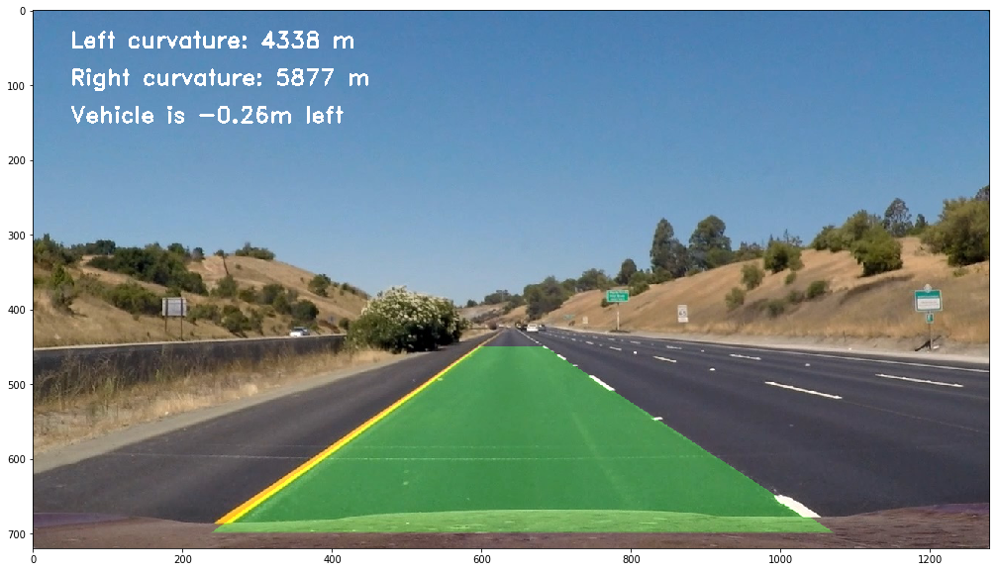

In [30]:
img = cv2.cvtColor(img_test1, cv2.COLOR_BGR2RGB)
draw_on_image(img, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, True)

### Creating pipleline video

In [31]:
def is_lane_valid(left_fit, right_fit):
    
    #Check if left and right fit returned a value
    if len(left_fit) ==0 or len(right_fit) == 0:
        status = False

    else:
        #Check distance b/w lines
        ploty = np.linspace(0, 20, num=10 )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        delta_lines = np.mean(right_fitx - left_fitx)

        if delta_lines >= 150 and delta_lines <=430: 
            status = True
        else:
            status = False
        
        # Calculate slope of left and right lanes at midpoint of y (i.e. 360)
        left = 2*left_fit[0]*360+left_fit[1]
        right = 2*right_fit[0]*360+right_fit[1]
        delta_slope_mid =  np.abs(left-right)

        #Check if lines are parallel at the middle
        if delta_slope_mid <= 0.6:
            status = True
        else:
            status = False
            
    return status

[-4.58230749e-04  6.71276511e-01  5.38675599e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]
[ 1.68958225e-04 -4.37426809e-01  4.79809232e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]
[ 5.56125405e-04 -6.77423693e-01  4.87482002e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]
[ 2.02374994e-02 -2.65678560e+01  8.94694242e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]
[ 1.89415396e-04 -4.68888357e-01  5.10127274e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


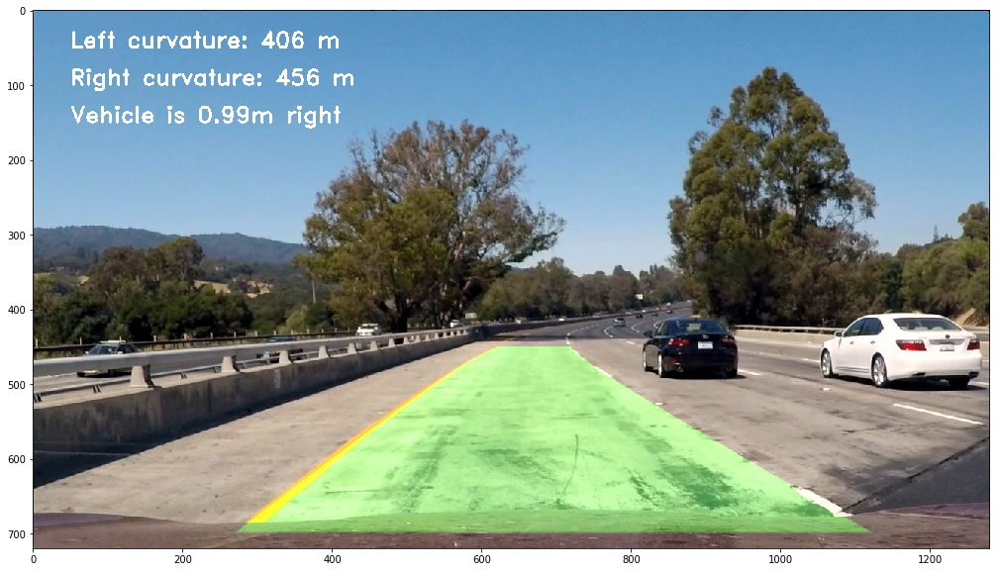

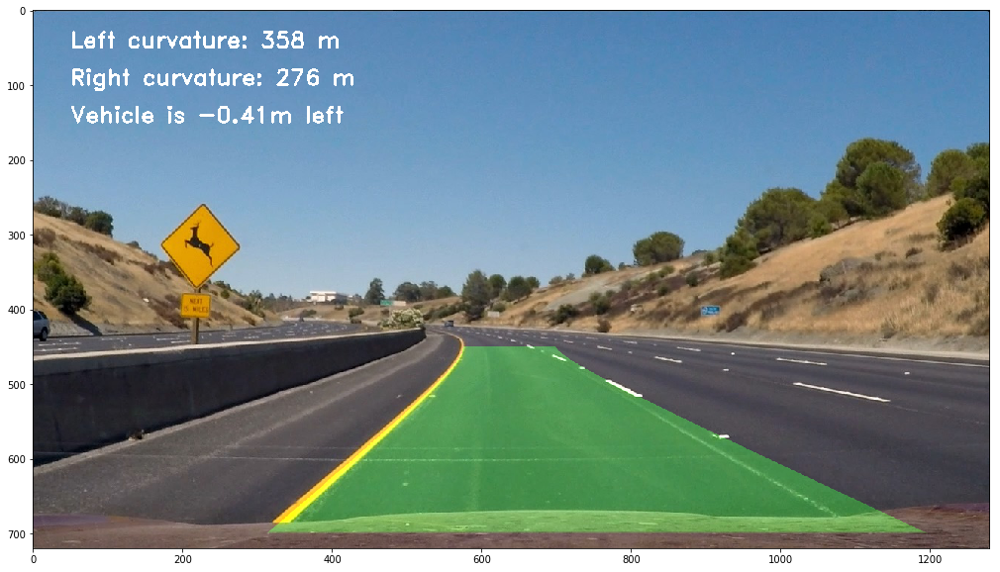

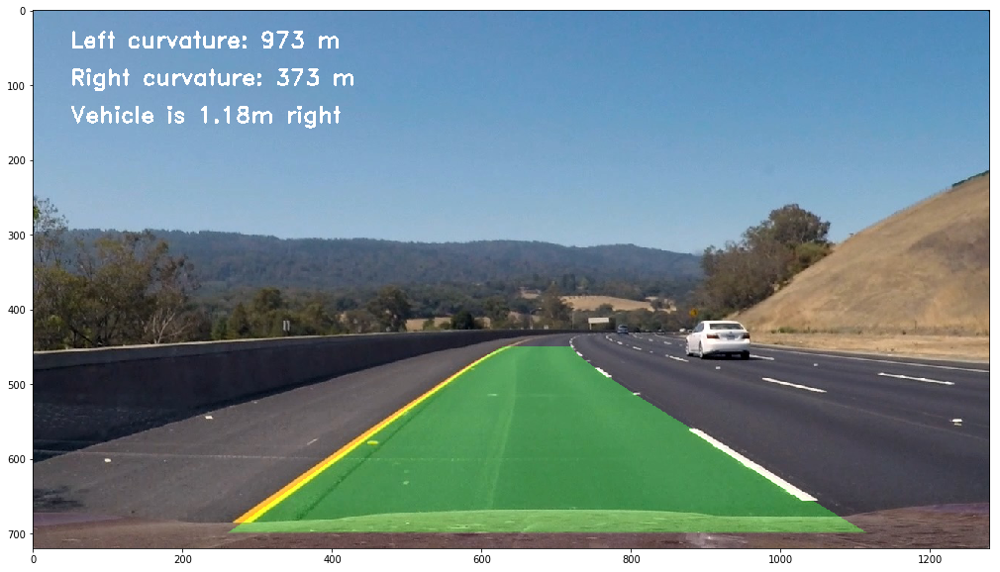

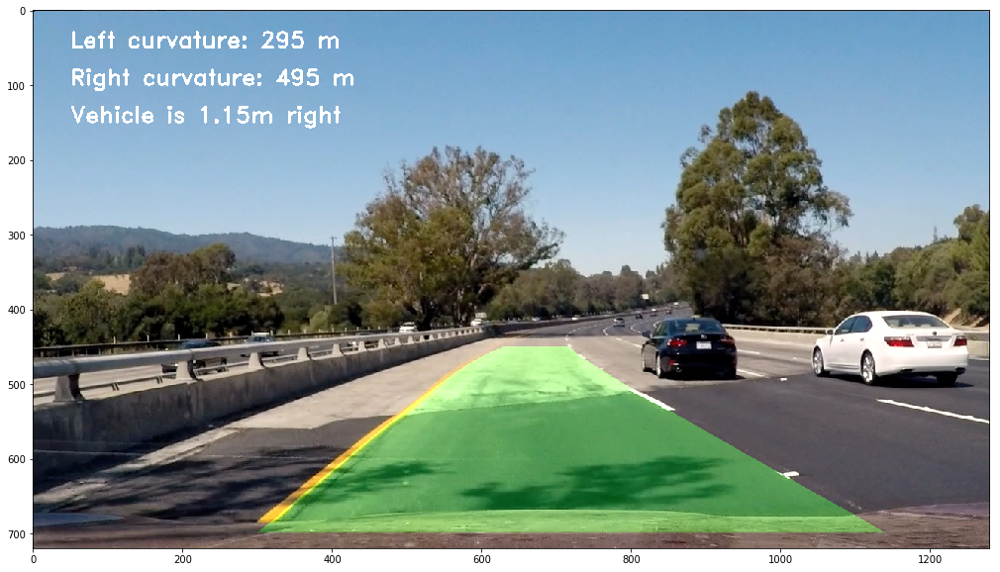

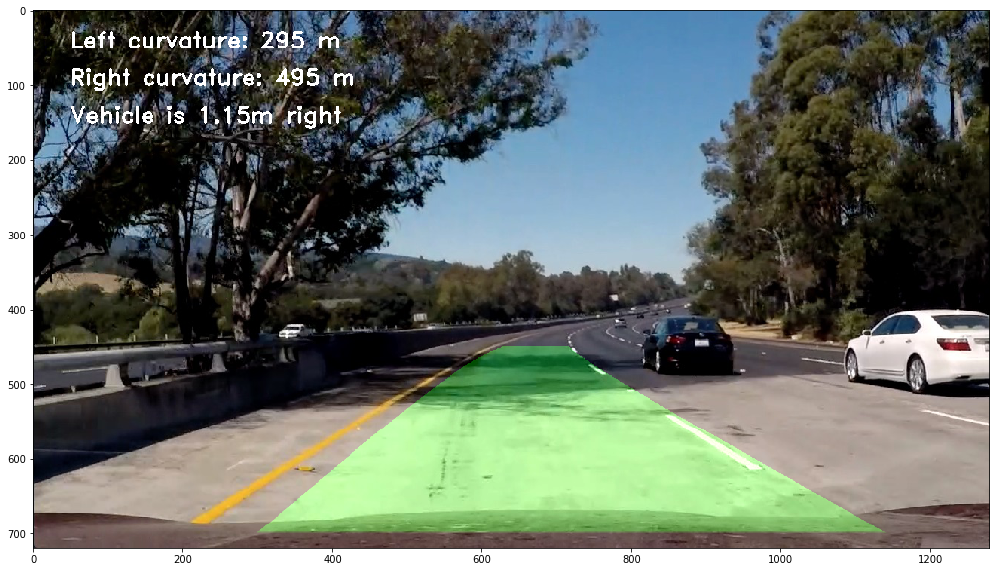

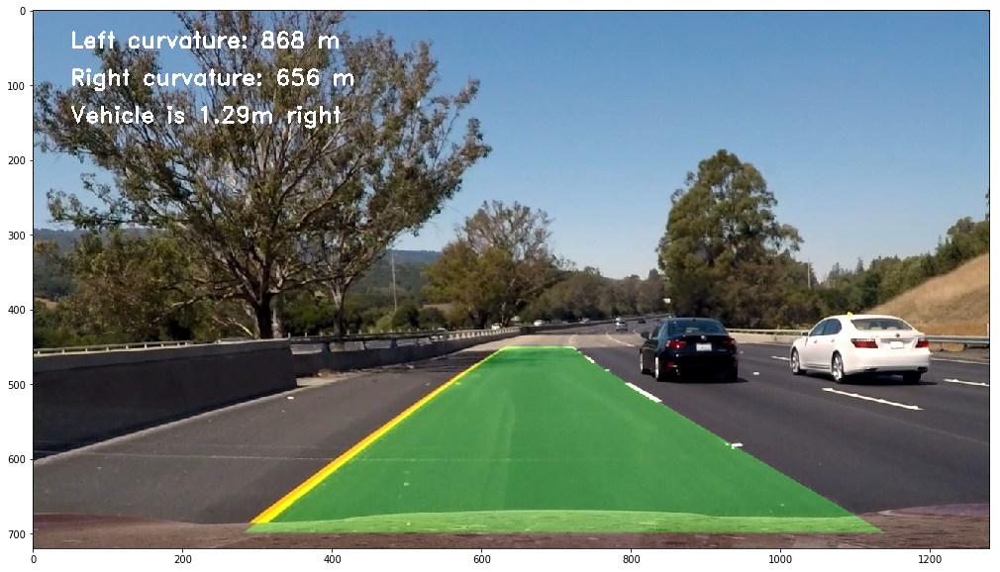

In [42]:
# Define a class to receive the characteristics of each line detection
class Lane():
    def __init__(self):
        self.last_left = None
        self.last_right = None
        self.left_fit = None
        self.right_fit = None
        self.counter = 0
        self.reset_counter = 0
        
lane = Lane()

def find_lanes(img):
    #img = undistort(img, mtx, dist)
    #combined_binary = combined_s_gradient_thresholds(img)
    #warped_img, M = transform_image(combined_binary, nx, ny) 
    undist_img = undistort(img)

    # Do a perspective Transform
    warp_img, M, Minv = warper(undist_img, src, dst)
   
    imgY, imgCr, imgHL_S, imgLab_L= Custom_channel(warp_img)
    
    Ybinary= channel_threshold(imgY,(215,255))
    Crbinary= channel_threshold(imgCr,(215,255))
    Lbinary= channel_threshold(imgLab_L,(215,255))
    Sbinary= channel_threshold(imgHL_S,(200,255))
    combined1 = np.zeros_like(imgY)
    combined1[(Crbinary==1)|(Ybinary==1)|((Lbinary==1)&(Sbinary==1))]=1
    #axes.imshow(combined1,cmap='gray')
    #axes.set_title('Channels Combined')
    
    l_channel= cv2.cvtColor(warp_img, cv2.COLOR_RGB2HLS)[:,:,1]
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= 120) & (l_channel <= 255)] = 1
    #axes[0,1].imshow(l_binary,cmap='gray')
    #axes[0,1].set_title('HLS-L Channel')
    image_S_channel= cv2.cvtColor(warp_img, cv2.COLOR_RGB2HLS)[:,:,2]
    convert=False
    
    sobelx_image= sobel_image(image_S_channel,'x', 15,60, convert)
    #axes[0,2].imshow(sobelx_image,cmap='gray')
    #axes[0,2].set_title('Sobel X')
    
    
    combined_YCrSL = np.zeros_like(sobelx_image)
    #combined_YCrSL[((Crbinary==1)|(Ybinary==1)|((Lbinary==1)& (Sbinary == 1) )|(sobelx_image==1))& (l_binary == 1)]=1
    combined_YCrSL[((Sbinary == 1) | (sobelx_image == 1)) & (l_binary == 1) ] = 1
    
    if lane.counter == 0:
        lane.left_fit, lane.right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy = locate_lines(combined_YCrSL)
    else:
        lane.left_fit, lane.right_fit  = locate_line_further(lane.left_fit, lane.right_fit, combined_YCrSL)
        print(lane.left_fit)
        print("-----------")
        print(right_fit)
    
    #Sanity check
    status = is_lane_valid(lane.left_fit, lane.right_fit)
    
    if status == True:        
        lane.last_left, lane.last_right = lane.left_fit, lane.right_fit        
        lane.counter += 1
        lane.reset_counter = 0
    else:
        #Reset
        if lane.reset_counter > 4:
            lane.left_fit, lane.right_fit,left_lane_inds, right_lane_inds, nonzerox, nonzeroy = locate_lines(combined_YCrSL)
            
            print(lane.left_fit)
            lane.reset_counter = 0
        else:
            lane.left_fit, lane.right_fit = lane.last_left, lane.last_right

        lane.reset_counter += 1
    
    return combined_YCrSL, lane.left_fit, lane.right_fit, M


def pipeline(img, show_values=False):
    warped_img, left_fit, right_fit, M = find_lanes(img)

    left_curvature, right_curvature, center = radius_curvature(warped_img, left_fit, right_fit)
    
    return draw_on_image(img, warped_img, left_fit, right_fit, M, left_curvature, right_curvature, center, show_values)
    
#images = ['challenge_video_002.jpg', 'challenge_video_003.jpg','challenge_video_004.jpg', 'challenge_video_005.jpg', 'challenge_video_006.jpg', 'challenge_video_007.jpg']
images = ['test1.jpg', 'test2.jpg','test3.jpg', 'test4.jpg', 'test5.jpg', 'test6.jpg']

for fname in images:
    img = cv2.imread('test_images/'+fname)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    pipeline(img, True)


In [43]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [44]:
lane = Lane()
def process_image(img):
    return pipeline(img)

white_output = 'project_video_Output.mp4'
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

[MoviePy] >>>> Building video project_video_Output.mp4
[MoviePy] Writing video project_video_Output.mp4


  0%|                                                 | 0/1261 [00:00<?, ?it/s]

[-4.70321570e-04  6.83994652e-01  4.53293785e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|                                         | 1/1261 [00:00<03:53,  5.40it/s]

[-4.68943709e-04  6.85498044e-01  4.51880825e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|                                         | 2/1261 [00:00<04:01,  5.22it/s]

[-4.65664612e-04  6.86581635e-01  4.43973454e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|                                         | 3/1261 [00:00<04:06,  5.11it/s]

[-4.73120834e-04  6.96313840e-01  4.21714842e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|▏                                        | 4/1261 [00:00<04:09,  5.03it/s]

[-4.60448414e-04  6.90177497e-01  4.15683762e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|▏                                        | 5/1261 [00:00<04:04,  5.14it/s]

[-4.53144754e-04  6.89089340e-01  4.07992811e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|▏                                        | 6/1261 [00:01<04:10,  5.02it/s]

[-4.24903941e-04  6.69865909e-01  4.17076270e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▏                                        | 7/1261 [00:01<04:12,  4.98it/s]

[-4.38379799e-04  6.90371536e-01  3.62063937e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▎                                        | 8/1261 [00:01<04:12,  4.95it/s]

[-4.07751692e-04  6.68788178e-01  3.61335056e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▎                                        | 9/1261 [00:01<04:15,  4.89it/s]

[-3.92736454e-04  6.60770372e-01  3.39850204e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▎                                       | 10/1261 [00:02<04:13,  4.94it/s]

[-4.02343341e-04  6.73165610e-01  3.04335951e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▎                                       | 11/1261 [00:02<04:16,  4.88it/s]

[-3.55698445e-04  6.43388064e-01  2.65776246e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▍                                       | 12/1261 [00:02<04:25,  4.71it/s]

[-3.48178676e-04  6.39117954e-01  2.62254044e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▍                                       | 13/1261 [00:02<04:34,  4.54it/s]

[-3.41533339e-04  6.35540164e-01  2.52380581e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▍                                       | 14/1261 [00:02<04:43,  4.40it/s]

[-3.66882863e-04  6.55117834e-01  2.41186994e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▍                                       | 15/1261 [00:03<04:50,  4.29it/s]

[-3.74492858e-04  6.57247073e-01  2.61478630e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▌                                       | 16/1261 [00:03<04:46,  4.35it/s]

[-3.82110197e-04  6.64158809e-01  2.33932943e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▌                                       | 17/1261 [00:03<04:33,  4.55it/s]

[-3.95106901e-04  6.75035062e-01  2.12568047e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▌                                       | 18/1261 [00:03<04:34,  4.53it/s]

[-3.79931931e-04  6.63979996e-01  1.99421169e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▌                                       | 19/1261 [00:04<04:32,  4.55it/s]

[-3.66674381e-04  6.53851190e-01  1.87926714e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▋                                       | 20/1261 [00:04<04:40,  4.42it/s]

[-3.52139420e-04  6.43383115e-01  1.72480902e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▋                                       | 21/1261 [00:04<04:50,  4.27it/s]

[-3.30765424e-04  6.26182479e-01  1.64514682e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▋                                       | 22/1261 [00:04<04:39,  4.43it/s]

[-3.17164893e-04  6.11541898e-01  1.71208260e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▋                                       | 23/1261 [00:04<04:47,  4.31it/s]

[-3.61629389e-04  6.42972153e-01  1.45590574e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▊                                       | 24/1261 [00:05<04:37,  4.46it/s]

[-3.99640044e-04  6.69702765e-01  1.21768502e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▊                                       | 25/1261 [00:05<04:22,  4.71it/s]

[-3.91086703e-04  6.61302161e-01  1.10548698e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▊                                       | 26/1261 [00:05<04:08,  4.96it/s]

[-3.98511691e-04  6.63836651e-01  1.12348452e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▊                                       | 27/1261 [00:05<03:54,  5.26it/s]

[-3.87111768e-04  6.52277241e-01  1.06549488e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▉                                       | 28/1261 [00:05<03:50,  5.36it/s]

[-4.12319236e-04  6.68650758e-01  1.15060017e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▉                                       | 29/1261 [00:06<03:40,  5.58it/s]

[-4.69302528e-04  7.12876009e-01  7.17649009e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▉                                       | 30/1261 [00:06<03:35,  5.71it/s]

[-5.33084051e-04  7.67159664e-01  5.31962965e-01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▉                                       | 31/1261 [00:06<03:32,  5.79it/s]

[-5.78165169e-04  8.04280994e-01 -2.13654072e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█                                       | 32/1261 [00:06<03:28,  5.90it/s]

[-5.70885421e-04  7.98851909e-01 -2.78980282e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█                                       | 33/1261 [00:06<03:25,  5.97it/s]

[-5.78891588e-04  8.08979747e-01 -3.81638260e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█                                       | 34/1261 [00:06<03:22,  6.05it/s]

[-5.84296239e-04  8.16598793e-01 -4.87110752e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█                                       | 35/1261 [00:07<03:21,  6.10it/s]

[-6.00065285e-04  8.35557739e-01 -7.91762554e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▏                                      | 36/1261 [00:07<03:19,  6.14it/s]

[-6.14639148e-04  8.53557603e-01 -1.16633684e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▏                                      | 37/1261 [00:07<03:19,  6.13it/s]

[-6.22774253e-04  8.66780720e-01 -1.49503913e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▏                                      | 38/1261 [00:07<03:19,  6.14it/s]

[-6.30534471e-04  8.77196145e-01 -1.70513866e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▏                                      | 39/1261 [00:07<03:19,  6.14it/s]

[-6.16761811e-04  8.71484833e-01 -1.90792529e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▎                                      | 40/1261 [00:07<03:20,  6.10it/s]

[-6.05127030e-04  8.66270057e-01 -1.97171874e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▎                                      | 41/1261 [00:08<03:21,  6.07it/s]

[-6.01341191e-04  8.70395536e-01 -2.30418873e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▎                                      | 42/1261 [00:08<03:19,  6.11it/s]

[-5.72040228e-04  8.51044512e-01 -2.23153508e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▎                                      | 43/1261 [00:08<03:29,  5.82it/s]

[-5.34131884e-04  8.20238187e-01 -1.91232705e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▍                                      | 44/1261 [00:08<03:33,  5.70it/s]

[-5.10697903e-04  8.05939506e-01 -1.95850423e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▍                                      | 45/1261 [00:08<03:28,  5.83it/s]

[-4.94191713e-04  7.94775338e-01 -1.94806494e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▍                                      | 46/1261 [00:08<03:25,  5.92it/s]

[-4.65968039e-04  7.73561633e-01 -1.84758352e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▍                                      | 47/1261 [00:09<03:28,  5.82it/s]

[-4.46954707e-04  7.57658685e-01 -1.58028770e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▌                                      | 48/1261 [00:09<03:30,  5.77it/s]

[-4.10946887e-04  7.31254230e-01 -1.52623547e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▌                                      | 49/1261 [00:09<03:32,  5.71it/s]

[-4.16938144e-04  7.41016540e-01 -1.89566873e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▌                                      | 50/1261 [00:09<03:29,  5.79it/s]

[-3.96629801e-04  7.24342467e-01 -1.71495599e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▌                                      | 51/1261 [00:09<03:28,  5.82it/s]

[-3.84866882e-04  7.09729558e-01 -1.22197562e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▋                                      | 52/1261 [00:09<03:26,  5.86it/s]

[-3.77941162e-04  7.02338467e-01 -1.05769878e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▋                                      | 53/1261 [00:10<03:29,  5.76it/s]

[-3.66183078e-04  6.88755897e-01 -7.53923703e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▋                                      | 54/1261 [00:10<03:29,  5.75it/s]

[-3.61345772e-04  6.85504212e-01 -8.99590698e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▋                                      | 55/1261 [00:10<03:34,  5.63it/s]

[-3.43540679e-04  6.66284192e-01 -5.62381520e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▊                                      | 56/1261 [00:10<03:31,  5.69it/s]

[-3.40854967e-04  6.61118415e-01 -4.14369743e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▊                                      | 57/1261 [00:10<03:31,  5.70it/s]

[-3.44770248e-04  6.57300024e-01 -1.46283016e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▊                                      | 58/1261 [00:10<03:28,  5.78it/s]

[-3.75303518e-04  6.75040455e-01  4.93298356e-01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▊                                      | 59/1261 [00:11<03:26,  5.83it/s]

[-3.78039518e-04  6.68839963e-01  5.92254795e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▉                                      | 60/1261 [00:11<03:25,  5.86it/s]

[-3.94842786e-04  6.76071602e-01  7.77286120e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▉                                      | 61/1261 [00:11<03:29,  5.73it/s]

[-3.95158989e-04  6.67291938e-01  1.30146949e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▉                                      | 62/1261 [00:11<03:26,  5.82it/s]

[-3.93812146e-04  6.61905332e-01  1.39305703e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▉                                      | 63/1261 [00:11<03:29,  5.72it/s]

[-4.05873530e-04  6.64449947e-01  1.71541457e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██                                      | 64/1261 [00:12<03:27,  5.76it/s]

[-3.92675458e-04  6.49394600e-01  1.92112324e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██                                      | 65/1261 [00:12<03:27,  5.76it/s]

[-4.05460783e-04  6.52567237e-01  2.24103556e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██                                      | 66/1261 [00:12<03:27,  5.77it/s]

[-3.93137064e-04  6.38812520e-01  2.51394110e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██▏                                     | 67/1261 [00:12<03:27,  5.75it/s]

[-3.85049437e-04  6.28876756e-01  2.59946540e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██▏                                     | 68/1261 [00:12<03:27,  5.75it/s]

[-3.93973990e-04  6.31087141e-01  2.87393727e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██▏                                     | 69/1261 [00:12<03:26,  5.78it/s]

[-3.60568078e-04  6.03201683e-01  3.09592952e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▏                                     | 70/1261 [00:13<03:23,  5.84it/s]

[-3.58466510e-04  5.99604113e-01  3.26392925e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▎                                     | 71/1261 [00:13<03:25,  5.78it/s]

[-3.40110163e-04  5.86606232e-01  3.19774119e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▎                                     | 72/1261 [00:13<03:26,  5.76it/s]

[-3.35461528e-04  5.84508283e-01  3.02069047e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▎                                     | 73/1261 [00:13<03:26,  5.77it/s]

[-3.25157811e-04  5.76046109e-01  3.09954202e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▎                                     | 74/1261 [00:13<03:27,  5.72it/s]

[-3.01060901e-04  5.57344398e-01  3.07883870e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▍                                     | 75/1261 [00:13<03:24,  5.81it/s]

[-3.05465627e-04  5.58202646e-01  3.18670348e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▍                                     | 76/1261 [00:14<03:24,  5.80it/s]

[-2.62001194e-04  5.25590668e-01  3.11516022e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▍                                     | 77/1261 [00:14<03:25,  5.76it/s]

[-2.46484294e-04  5.13442304e-01  3.06454610e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▍                                     | 78/1261 [00:14<03:31,  5.58it/s]

[-2.40453388e-04  5.05312912e-01  3.05787435e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▌                                     | 79/1261 [00:14<03:28,  5.68it/s]

[-2.60185442e-04  5.16231959e-01  2.96916409e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▌                                     | 80/1261 [00:14<03:31,  5.58it/s]

[-2.81543864e-04  5.26094359e-01  3.09614962e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▌                                     | 81/1261 [00:14<03:27,  5.68it/s]

[-2.89270863e-04  5.28962744e-01  2.96268528e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▌                                     | 82/1261 [00:15<03:25,  5.73it/s]

[-3.00744874e-04  5.32203176e-01  3.04134406e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▋                                     | 83/1261 [00:15<03:23,  5.78it/s]

[-2.84855558e-04  5.22748666e-01  2.56802648e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▋                                     | 84/1261 [00:15<03:25,  5.74it/s]

[-3.04283924e-04  5.33411193e-01  2.60417264e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▋                                     | 85/1261 [00:15<03:29,  5.62it/s]

[-3.38834984e-04  5.57822569e-01  2.44768800e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▋                                     | 86/1261 [00:15<03:32,  5.52it/s]

[-3.90089404e-04  5.86723126e-01  3.08029707e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▊                                     | 87/1261 [00:16<03:30,  5.59it/s]

[-4.26228892e-04  6.11322272e-01  3.25544798e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▊                                     | 88/1261 [00:16<03:26,  5.69it/s]

[-4.54375138e-04  6.29781732e-01  3.38383715e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▊                                     | 89/1261 [00:16<03:22,  5.78it/s]

[-4.93699606e-04  6.60353227e-01  3.45915018e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▊                                     | 90/1261 [00:16<03:25,  5.70it/s]

[-4.81456078e-04  6.51308390e-01  3.47339457e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▉                                     | 91/1261 [00:16<03:26,  5.66it/s]

[-4.74535689e-04  6.49268782e-01  3.39745352e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▉                                     | 92/1261 [00:16<03:24,  5.73it/s]

[-4.96192594e-04  6.66246390e-01  3.42076787e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▉                                     | 93/1261 [00:17<03:20,  5.81it/s]

[-5.04706331e-04  6.75198154e-01  3.38069616e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▉                                     | 94/1261 [00:17<03:21,  5.79it/s]

[-4.87758139e-04  6.63088297e-01  3.39111881e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███                                     | 95/1261 [00:17<03:21,  5.79it/s]

[-4.97213990e-04  6.73552753e-01  3.16313191e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███                                     | 96/1261 [00:17<03:19,  5.84it/s]

[-4.91373830e-04  6.73068683e-01  3.09960094e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███                                     | 97/1261 [00:17<03:17,  5.89it/s]

[-4.68605700e-04  6.57710009e-01  3.05077780e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███                                     | 98/1261 [00:17<03:20,  5.80it/s]

[-4.73375817e-04  6.61542142e-01  3.19273300e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▏                                    | 99/1261 [00:18<03:18,  5.84it/s]

[-4.57553089e-04  6.50535877e-01  3.26260159e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███                                    | 100/1261 [00:18<03:16,  5.91it/s]

[-4.67539682e-04  6.62453681e-01  3.04542746e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███                                    | 101/1261 [00:18<03:17,  5.89it/s]

[-4.81453767e-04  6.74805057e-01  2.99927232e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▏                                   | 102/1261 [00:18<03:18,  5.82it/s]

[-4.79542984e-04  6.74394893e-01  2.98781742e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▏                                   | 103/1261 [00:18<03:18,  5.84it/s]

[-4.85427990e-04  6.80205420e-01  2.99555587e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▏                                   | 104/1261 [00:18<03:18,  5.84it/s]

[-4.61188688e-04  6.63068574e-01  2.97015086e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▏                                   | 105/1261 [00:19<03:24,  5.66it/s]

[-4.57771272e-04  6.60583190e-01  2.93684481e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▎                                   | 106/1261 [00:19<03:24,  5.64it/s]

[-4.47401120e-04  6.53069267e-01  2.95910075e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▎                                   | 107/1261 [00:19<03:28,  5.53it/s]

[-4.88086578e-04  6.87356394e-01  2.75991693e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▎                                   | 108/1261 [00:19<03:31,  5.46it/s]

[-4.92599708e-04  6.92157571e-01  2.68688948e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▎                                   | 109/1261 [00:19<03:33,  5.40it/s]

[-5.01096946e-04  6.99436290e-01  2.61151940e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▍                                   | 110/1261 [00:20<03:32,  5.43it/s]

[-5.13635502e-04  7.10926486e-01  2.52728264e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▍                                   | 111/1261 [00:20<03:34,  5.37it/s]

[-4.87486345e-04  6.92287517e-01  2.46756323e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▍                                   | 112/1261 [00:20<03:37,  5.28it/s]

[-5.09946400e-04  7.11091500e-01  2.44637938e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▍                                   | 113/1261 [00:20<03:38,  5.26it/s]

[-5.20920323e-04  7.21041370e-01  2.41991032e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▌                                   | 114/1261 [00:20<03:39,  5.23it/s]

[-5.45011537e-04  7.44005396e-01  2.20556472e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▌                                   | 115/1261 [00:21<03:42,  5.14it/s]

[-5.52839215e-04  7.52497903e-01  2.11457607e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▌                                   | 116/1261 [00:21<03:40,  5.19it/s]

[-5.44760935e-04  7.48740869e-01  2.04120823e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▌                                   | 117/1261 [00:21<03:39,  5.21it/s]

[-5.48707037e-04  7.54563813e-01  1.92688231e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▋                                   | 118/1261 [00:21<03:35,  5.31it/s]

[-5.50157525e-04  7.59125737e-01  1.79204137e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▋                                   | 119/1261 [00:21<03:44,  5.09it/s]

[-5.76631193e-04  7.85839220e-01  1.45310941e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▋                                   | 120/1261 [00:22<03:41,  5.16it/s]

[-5.53417965e-04  7.70097192e-01  1.58427294e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▋                                   | 121/1261 [00:22<03:36,  5.26it/s]

[-5.52531229e-04  7.72301213e-01  1.56535829e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▊                                   | 122/1261 [00:22<03:34,  5.32it/s]

[-5.64453721e-04  7.84349549e-01  1.47136547e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▊                                   | 123/1261 [00:22<03:31,  5.37it/s]

[-5.72348274e-04  7.96035874e-01  1.20334300e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▊                                   | 124/1261 [00:22<03:31,  5.37it/s]

[-5.71449213e-04  7.96454807e-01  1.25094898e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▊                                   | 125/1261 [00:22<03:29,  5.43it/s]

[-5.39596117e-04  7.72899631e-01  1.30810913e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▉                                   | 126/1261 [00:23<03:29,  5.41it/s]

[-5.29761216e-04  7.66245004e-01  1.45978682e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▉                                   | 127/1261 [00:23<03:31,  5.35it/s]

[-5.07991998e-04  7.51105711e-01  1.53423777e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▉                                   | 128/1261 [00:23<03:32,  5.34it/s]

[-5.36190270e-04  7.77535015e-01  1.26392639e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▉                                   | 129/1261 [00:23<03:28,  5.43it/s]

[-4.97487044e-04  7.43507966e-01  1.80565209e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|████                                   | 130/1261 [00:23<03:27,  5.44it/s]

[-4.95199555e-04  7.42652502e-01  1.82196079e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|████                                   | 131/1261 [00:24<03:29,  5.40it/s]

[-4.92538507e-04  7.41212905e-01  2.01923461e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|████                                   | 132/1261 [00:24<03:31,  5.34it/s]

[-4.79824374e-04  7.30286331e-01  2.22090606e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████                                   | 133/1261 [00:24<03:26,  5.46it/s]

[-4.74670159e-04  7.26637261e-01  2.42317877e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▏                                  | 134/1261 [00:24<03:24,  5.51it/s]

[-4.43298241e-04  6.99106999e-01  2.94077058e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▏                                  | 135/1261 [00:24<03:21,  5.58it/s]

[-4.34889620e-04  6.92640177e-01  3.02278235e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▏                                  | 136/1261 [00:24<03:17,  5.71it/s]

[-4.19734729e-04  6.77724566e-01  3.25708556e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▏                                  | 137/1261 [00:25<03:16,  5.72it/s]

[-3.91762714e-04  6.51424971e-01  3.58910236e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▎                                  | 138/1261 [00:25<03:16,  5.71it/s]

[-3.77901839e-04  6.36163011e-01  3.89186804e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▎                                  | 139/1261 [00:25<03:19,  5.63it/s]

[-3.50183917e-04  6.12311755e-01  4.01382698e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▎                                  | 140/1261 [00:25<03:16,  5.70it/s]

[-3.55679076e-04  6.12815018e-01  4.13345308e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▎                                  | 141/1261 [00:25<03:19,  5.62it/s]

[-3.52793954e-04  6.07145508e-01  4.33422981e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▍                                  | 142/1261 [00:25<03:16,  5.71it/s]

[-3.78053116e-04  6.22343255e-01  4.46494071e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▍                                  | 143/1261 [00:26<03:23,  5.50it/s]

[-3.76008325e-04  6.17442621e-01  4.60585941e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▍                                  | 144/1261 [00:26<03:22,  5.53it/s]

[-3.71722495e-04  6.10665155e-01  4.77492164e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▍                                  | 145/1261 [00:26<03:23,  5.49it/s]

[-3.92104766e-04  6.23260492e-01  4.88903898e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▌                                  | 146/1261 [00:26<03:18,  5.63it/s]

[-3.84283276e-04  6.15351008e-01  5.04589434e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▌                                  | 147/1261 [00:26<03:19,  5.58it/s]

[-4.32987306e-04  6.51633564e-01  5.07720612e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▌                                  | 148/1261 [00:27<03:16,  5.68it/s]

[-4.36671208e-04  6.52483328e-01  5.19299086e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▌                                  | 149/1261 [00:27<03:16,  5.67it/s]

[-4.17424356e-04  6.38972782e-01  5.14287924e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▋                                  | 150/1261 [00:27<03:13,  5.74it/s]

[-4.07484862e-04  6.30587698e-01  5.13477325e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▋                                  | 151/1261 [00:27<03:16,  5.64it/s]

[-3.88920332e-04  6.15109157e-01  5.14410869e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▋                                  | 152/1261 [00:27<03:11,  5.79it/s]

[-4.07489575e-04  6.29066875e-01  5.07172805e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▋                                  | 153/1261 [00:27<03:11,  5.79it/s]

[-3.87662995e-04  6.17428050e-01  4.74765181e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▊                                  | 154/1261 [00:28<03:08,  5.88it/s]

[-3.78447796e-04  6.12048207e-01  4.48209571e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▊                                  | 155/1261 [00:28<03:11,  5.77it/s]

[-3.92019528e-04  6.25296707e-01  4.07186000e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▊                                  | 156/1261 [00:28<03:10,  5.79it/s]

[-4.00557000e-04  6.35875944e-01  3.62527290e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▊                                  | 157/1261 [00:28<03:09,  5.83it/s]

[-4.27782807e-04  6.55994208e-01  3.49008297e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|████▉                                  | 158/1261 [00:28<03:10,  5.78it/s]

[-4.23378200e-04  6.54663903e-01  3.15425586e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|████▉                                  | 159/1261 [00:28<03:11,  5.76it/s]

[-4.46901200e-04  6.77211929e-01  2.60803577e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|████▉                                  | 160/1261 [00:29<03:12,  5.72it/s]

[-4.34016494e-04  6.74160548e-01  2.07203781e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|████▉                                  | 161/1261 [00:29<03:10,  5.79it/s]

[-4.32767675e-04  6.79077081e-01  1.58306478e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████                                  | 162/1261 [00:29<03:12,  5.70it/s]

[-4.19014432e-04  6.70879607e-01  1.37821864e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████                                  | 163/1261 [00:29<03:10,  5.75it/s]

[-4.37302511e-04  6.87890028e-01  1.11957389e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████                                  | 164/1261 [00:29<03:08,  5.83it/s]

[-4.61677502e-04  7.07391938e-01  9.78014939e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████                                  | 165/1261 [00:30<03:16,  5.59it/s]

[-4.68014758e-04  7.19598551e-01  3.29049452e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▏                                 | 166/1261 [00:30<03:31,  5.19it/s]

[-4.87645018e-04  7.35900914e-01  1.62491582e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▏                                 | 167/1261 [00:30<03:51,  4.72it/s]

[-4.35399710e-04  6.95358194e-01  3.77355392e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▏                                 | 168/1261 [00:30<03:42,  4.91it/s]

[-4.15939749e-04  6.84525456e-01  1.05471268e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▏                                 | 169/1261 [00:30<03:37,  5.02it/s]

[-3.94378321e-04  6.68565297e-01 -6.89554524e-01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▎                                 | 170/1261 [00:31<03:35,  5.07it/s]

[-4.05666009e-04  6.82772329e-01 -6.31222091e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▎                                 | 171/1261 [00:31<03:26,  5.28it/s]

[-4.01572875e-04  6.78241187e-01 -6.34163719e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▎                                 | 172/1261 [00:31<03:27,  5.24it/s]

[-4.15401452e-04  6.86998649e-01 -6.83159243e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▎                                 | 173/1261 [00:31<03:23,  5.35it/s]

[-4.61293317e-04  7.26282715e-01 -1.24720099e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▍                                 | 174/1261 [00:31<03:44,  4.84it/s]

[-4.78859890e-04  7.41005091e-01 -1.44316798e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▍                                 | 175/1261 [00:32<03:37,  5.00it/s]

[-4.89940115e-04  7.50434417e-01 -1.68600894e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▍                                 | 176/1261 [00:32<03:32,  5.10it/s]

[-4.46818883e-04  7.15488299e-01 -1.53429762e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▍                                 | 177/1261 [00:32<03:30,  5.14it/s]

[-4.50308628e-04  7.17197034e-01 -1.59778575e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▌                                 | 178/1261 [00:32<03:24,  5.28it/s]

[-4.60519019e-04  7.24305591e-01 -1.68195748e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▌                                 | 179/1261 [00:32<03:23,  5.31it/s]

[-4.64208135e-04  7.22716923e-01 -1.57030811e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▌                                 | 180/1261 [00:32<03:23,  5.31it/s]

[-5.22886437e-04  7.66718883e-01 -1.85561004e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▌                                 | 181/1261 [00:33<03:23,  5.32it/s]

[-5.12021709e-04  7.53386431e-01 -1.65312414e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▋                                 | 182/1261 [00:33<03:20,  5.39it/s]

[-5.60564684e-04  7.89231589e-01 -1.80781835e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▋                                 | 183/1261 [00:33<03:21,  5.35it/s]

[-6.01423737e-04  8.22245734e-01 -2.07190546e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▋                                 | 184/1261 [00:33<03:17,  5.45it/s]

[-6.23809644e-04  8.38922840e-01 -2.07845157e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▋                                 | 185/1261 [00:33<03:20,  5.37it/s]

[-6.98194105e-04  9.02865607e-01 -2.63585367e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▊                                 | 186/1261 [00:34<03:29,  5.13it/s]

[-6.98434312e-04  9.06936540e-01 -2.74380682e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▊                                 | 187/1261 [00:34<03:40,  4.86it/s]

[-7.15659826e-04  9.25576669e-01 -2.92863318e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▊                                 | 188/1261 [00:34<03:32,  5.04it/s]

[-7.06123437e-04  9.21285429e-01 -2.86972825e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▊                                 | 189/1261 [00:34<03:42,  4.83it/s]

[-7.02725475e-04  9.24566436e-01 -2.99882708e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▉                                 | 190/1261 [00:34<03:50,  4.65it/s]

[-7.06396437e-04  9.32600058e-01 -3.02274843e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▉                                 | 191/1261 [00:35<03:50,  4.64it/s]

[-6.80640185e-04  9.15709704e-01 -2.92729551e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▉                                 | 192/1261 [00:35<03:36,  4.94it/s]

[-6.69504821e-04  9.12055616e-01 -2.80873471e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|█████▉                                 | 193/1261 [00:35<03:30,  5.08it/s]

[-6.40336396e-04  8.87741197e-01 -2.33172542e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|██████                                 | 194/1261 [00:35<03:26,  5.18it/s]

[-6.35531337e-04  8.86442852e-01 -2.43165738e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|██████                                 | 195/1261 [00:35<03:19,  5.35it/s]

[-5.47002686e-04  8.10653558e-01 -1.66362820e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████                                 | 196/1261 [00:36<03:12,  5.54it/s]

[-4.84748605e-04  7.59485435e-01 -1.41896463e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████                                 | 197/1261 [00:36<03:08,  5.64it/s]

[-4.27857661e-04  7.17288200e-01 -1.56895758e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████                                 | 198/1261 [00:36<03:05,  5.72it/s]

[-3.75845996e-04  6.78811180e-01 -1.71265688e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▏                                | 199/1261 [00:36<03:07,  5.66it/s]

[-3.77480223e-04  6.80362380e-01 -1.81491572e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▏                                | 200/1261 [00:36<03:12,  5.51it/s]

[-3.66554855e-04  6.70422287e-01 -1.92318097e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▏                                | 201/1261 [00:36<03:11,  5.55it/s]

[-4.02863816e-04  6.94569701e-01 -2.00724140e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▏                                | 202/1261 [00:37<03:07,  5.63it/s]

[-4.19875875e-04  7.03786183e-01 -1.87951367e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▎                                | 203/1261 [00:37<03:07,  5.65it/s]

[-4.25446736e-04  7.07528944e-01 -2.03675634e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▎                                | 204/1261 [00:37<03:08,  5.62it/s]

[-4.52646333e-04  7.26072217e-01 -1.94493972e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▎                                | 205/1261 [00:37<03:08,  5.60it/s]

[-4.72848016e-04  7.43518011e-01 -2.12125487e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▎                                | 206/1261 [00:37<03:07,  5.63it/s]

[-5.22322115e-04  7.82435320e-01 -2.20476081e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▍                                | 207/1261 [00:38<03:09,  5.57it/s]

[-5.36592201e-04  7.92887382e-01 -2.08345339e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▍                                | 208/1261 [00:38<03:05,  5.66it/s]

[-5.26284752e-04  7.88765770e-01 -2.32296664e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▍                                | 209/1261 [00:38<03:05,  5.66it/s]

[-5.12080079e-04  7.78129725e-01 -2.36422031e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▍                                | 210/1261 [00:38<03:04,  5.69it/s]

[-4.75332830e-04  7.50192882e-01 -2.33551754e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▌                                | 211/1261 [00:38<03:07,  5.60it/s]

[-4.83337192e-04  7.57570895e-01 -2.40870244e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▌                                | 212/1261 [00:38<03:09,  5.54it/s]

[-4.82472711e-04  7.59190074e-01 -2.61972822e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▌                                | 213/1261 [00:39<03:15,  5.37it/s]

[-5.01318664e-04  7.77135966e-01 -2.99592287e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▌                                | 214/1261 [00:39<03:16,  5.34it/s]

[-5.01038797e-04  7.77328699e-01 -3.08238586e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▋                                | 215/1261 [00:39<03:19,  5.25it/s]

[-5.13783454e-04  7.91567697e-01 -3.58913954e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▋                                | 216/1261 [00:39<03:24,  5.11it/s]

[-5.13289190e-04  7.92341267e-01 -3.67033230e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▋                                | 217/1261 [00:39<03:27,  5.03it/s]

[-4.85741512e-04  7.74164480e-01 -3.84976174e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▋                                | 218/1261 [00:40<03:24,  5.09it/s]

[-4.91673750e-04  7.80401545e-01 -3.84734567e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▊                                | 219/1261 [00:40<03:24,  5.09it/s]

[-4.52542543e-04  7.53371061e-01 -3.95813516e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▊                                | 220/1261 [00:40<03:20,  5.19it/s]

[-4.39538757e-04  7.46364315e-01 -4.01538895e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|██████▊                                | 221/1261 [00:40<03:24,  5.09it/s]

[-4.25463707e-04  7.34364871e-01 -3.85278704e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|██████▊                                | 222/1261 [00:40<03:23,  5.10it/s]

[-3.99907172e-04  7.12544698e-01 -3.55448870e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|██████▉                                | 223/1261 [00:41<03:32,  4.89it/s]

[-4.12495306e-04  7.18443418e-01 -3.20546368e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|██████▉                                | 224/1261 [00:41<03:32,  4.89it/s]

[-4.03699583e-04  7.11254428e-01 -3.28300996e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|██████▉                                | 225/1261 [00:41<03:36,  4.79it/s]

[-4.15910594e-04  7.14998344e-01 -2.96842825e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|██████▉                                | 226/1261 [00:41<03:35,  4.81it/s]

[-3.94972052e-04  6.96375457e-01 -2.83424663e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████                                | 227/1261 [00:41<03:35,  4.80it/s]

[-3.77742527e-04  6.82080895e-01 -2.85596638e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████                                | 228/1261 [00:42<03:38,  4.72it/s]

[-3.78720554e-04  6.81738345e-01 -2.94037028e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████                                | 229/1261 [00:42<03:43,  4.62it/s]

[-3.49948628e-04  6.59610228e-01 -3.04133955e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████                                | 230/1261 [00:42<03:43,  4.62it/s]

[-3.54133557e-04  6.60669923e-01 -2.99544270e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▏                               | 231/1261 [00:42<03:52,  4.44it/s]

[-3.25129463e-04  6.38306717e-01 -3.11212963e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▏                               | 232/1261 [00:43<03:52,  4.42it/s]

[-3.21649232e-04  6.32581629e-01 -3.05745526e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▏                               | 233/1261 [00:43<04:09,  4.12it/s]

[-3.39819384e-04  6.47120014e-01 -3.41870557e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▏                               | 234/1261 [00:43<04:09,  4.12it/s]

[-3.36666564e-04  6.41129633e-01 -3.40119088e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▎                               | 235/1261 [00:43<04:02,  4.23it/s]

[-3.84318061e-04  6.75163072e-01 -3.50446271e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▎                               | 236/1261 [00:44<03:50,  4.44it/s]

[-3.86013323e-04  6.77466276e-01 -3.74587660e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▎                               | 237/1261 [00:44<03:37,  4.70it/s]

[-3.98102769e-04  6.83927703e-01 -3.66827782e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▎                               | 238/1261 [00:44<03:27,  4.93it/s]

[-4.13150044e-04  6.90884766e-01 -3.56505352e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▍                               | 239/1261 [00:44<03:21,  5.08it/s]

[-4.15391963e-04  6.90824796e-01 -3.61867895e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▍                               | 240/1261 [00:44<03:12,  5.29it/s]

[-4.19735132e-04  6.90269040e-01 -3.49037543e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▍                               | 241/1261 [00:44<03:07,  5.45it/s]

[-4.00706270e-04  6.74367613e-01 -3.60599771e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▍                               | 242/1261 [00:45<03:03,  5.55it/s]

[-4.38413559e-04  7.01318152e-01 -3.60065530e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▌                               | 243/1261 [00:45<03:00,  5.65it/s]

[-4.26305077e-04  6.88830348e-01 -3.45759934e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▌                               | 244/1261 [00:45<03:02,  5.58it/s]

[-4.57366556e-04  7.07864624e-01 -3.31711403e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▌                               | 245/1261 [00:45<02:58,  5.71it/s]

[-4.62498031e-04  7.10688727e-01 -3.27713035e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▌                               | 246/1261 [00:45<02:57,  5.71it/s]

[-4.46989481e-04  6.96153972e-01 -3.15064414e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▋                               | 247/1261 [00:45<02:56,  5.73it/s]

[-4.70037532e-04  7.12249246e-01 -2.98097471e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▋                               | 248/1261 [00:46<03:01,  5.59it/s]

[-4.41606301e-04  6.90216685e-01 -2.90296618e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▋                               | 249/1261 [00:46<02:59,  5.63it/s]

[-4.49064926e-04  6.93160692e-01 -2.72923781e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▋                               | 250/1261 [00:46<02:59,  5.63it/s]

[-4.34091984e-04  6.80285428e-01 -2.66258862e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▊                               | 251/1261 [00:46<02:54,  5.79it/s]

[-4.16807402e-04  6.63925321e-01 -2.35614917e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▊                               | 252/1261 [00:46<03:01,  5.56it/s]

[-4.13064203e-04  6.53925564e-01 -1.86891801e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▊                               | 253/1261 [00:47<02:56,  5.70it/s]

[-3.96804467e-04  6.40113350e-01 -1.76525074e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▊                               | 254/1261 [00:47<02:56,  5.70it/s]

[-4.13877463e-04  6.47487895e-01 -1.28870999e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▉                               | 255/1261 [00:47<02:54,  5.78it/s]

[-4.09529429e-04  6.39978116e-01 -1.01846312e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▉                               | 256/1261 [00:47<02:57,  5.67it/s]

[-4.34722827e-04  6.52902480e-01 -6.61933287e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▉                               | 257/1261 [00:47<02:54,  5.74it/s]

[-4.32276575e-04  6.41982731e-01  7.22727008e-01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|███████▉                               | 258/1261 [00:47<02:54,  5.75it/s]

[-4.24785602e-04  6.33728801e-01  2.90652478e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████                               | 259/1261 [00:48<02:51,  5.84it/s]

[-4.29308537e-04  6.30237572e-01  9.75030880e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████                               | 260/1261 [00:48<02:52,  5.80it/s]

[-4.05045084e-04  6.12482182e-01  9.98882461e+00]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████                               | 261/1261 [00:48<02:52,  5.81it/s]

[-4.09851698e-04  6.08988909e-01  1.58457929e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████                               | 262/1261 [00:48<02:51,  5.82it/s]

[-3.99174490e-04  5.96090233e-01  1.99166463e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▏                              | 263/1261 [00:48<02:50,  5.86it/s]

[-3.92004189e-04  5.84458153e-01  2.36393307e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▏                              | 264/1261 [00:48<02:55,  5.68it/s]

[-3.87148698e-04  5.76935489e-01  2.61875077e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▏                              | 265/1261 [00:49<02:53,  5.74it/s]

[-3.70228482e-04  5.63713667e-01  2.53064605e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▏                              | 266/1261 [00:49<03:21,  4.94it/s]

[-3.85337269e-04  5.68536110e-01  3.02288201e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▎                              | 267/1261 [00:49<03:30,  4.71it/s]

[-3.75806975e-04  5.58906236e-01  3.18347949e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▎                              | 268/1261 [00:49<03:23,  4.87it/s]

[-3.59120920e-04  5.45553284e-01  3.18787742e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▎                              | 269/1261 [00:49<03:11,  5.17it/s]

[-3.67866478e-04  5.45815951e-01  3.57915087e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▎                              | 270/1261 [00:50<03:08,  5.25it/s]

[-3.52422338e-04  5.27197168e-01  4.30998822e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▍                              | 271/1261 [00:50<03:02,  5.42it/s]

[-3.75196442e-04  5.37171306e-01  5.04290841e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▍                              | 272/1261 [00:50<03:01,  5.45it/s]

[-3.59498712e-04  5.20318649e-01  5.60909485e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▍                              | 273/1261 [00:50<02:56,  5.59it/s]

[-3.66887188e-04  5.16395811e-01  6.49590169e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▍                              | 274/1261 [00:50<02:59,  5.50it/s]

[-3.48876343e-04  5.01959171e-01  6.72337364e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▌                              | 275/1261 [00:51<02:54,  5.66it/s]

[-3.31968485e-04  4.91244609e-01  6.65570168e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▌                              | 276/1261 [00:51<02:54,  5.64it/s]

[-3.25031874e-04  4.82150773e-01  6.98576165e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▌                              | 277/1261 [00:51<02:52,  5.70it/s]

[-3.10005431e-04  4.69965915e-01  7.11451710e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▌                              | 278/1261 [00:51<02:51,  5.73it/s]

[-3.08498645e-04  4.59927145e-01  8.00172311e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▋                              | 279/1261 [00:51<02:50,  5.75it/s]

[-3.05341010e-04  4.53329772e-01  8.41597207e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▋                              | 280/1261 [00:51<02:55,  5.60it/s]

[-2.97816908e-04  4.43769541e-01  8.84673603e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▋                              | 281/1261 [00:52<02:51,  5.71it/s]

[-2.83049592e-04  4.21792702e-01  9.90361697e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▋                              | 282/1261 [00:52<02:50,  5.74it/s]

[-2.66151789e-04  4.09281044e-01  1.00058824e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▊                              | 283/1261 [00:52<02:50,  5.75it/s]

[-2.66928463e-04  4.04980500e-01  1.05468979e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|████████▊                              | 284/1261 [00:52<02:49,  5.76it/s]

[-2.44405194e-04  3.86171464e-01  1.08828243e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|████████▊                              | 285/1261 [00:52<02:48,  5.78it/s]

[-2.25572216e-04  3.69650362e-01  1.10933456e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|████████▊                              | 286/1261 [00:52<02:46,  5.85it/s]

[-2.34855785e-04  3.69565394e-01  1.15696459e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|████████▉                              | 287/1261 [00:53<02:46,  5.84it/s]

[-2.20579063e-04  3.54974577e-01  1.18900507e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|████████▉                              | 288/1261 [00:53<02:47,  5.82it/s]

[-2.25350203e-04  3.45079463e-01  1.31037254e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|████████▉                              | 289/1261 [00:53<02:48,  5.78it/s]

[-2.00777127e-04  3.18807533e-01  1.37735573e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|████████▉                              | 290/1261 [00:53<02:47,  5.81it/s]

[-2.17700366e-04  3.22627030e-01  1.45521762e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████                              | 291/1261 [00:53<02:47,  5.79it/s]

[-2.13055119e-04  3.11836529e-01  1.52371685e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████                              | 292/1261 [00:53<02:46,  5.81it/s]

[-2.12861156e-04  3.10870805e-01  1.53374319e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████                              | 293/1261 [00:54<02:53,  5.58it/s]

[-1.96976569e-04  2.93000340e-01  1.60010230e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████                              | 294/1261 [00:54<02:51,  5.64it/s]

[-1.99769682e-04  3.00455780e-01  1.56509028e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████                              | 295/1261 [00:54<02:48,  5.73it/s]

[-1.76256480e-04  2.74873732e-01  1.64576325e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████▏                             | 296/1261 [00:54<02:51,  5.62it/s]

[-1.72040258e-04  2.75586554e-01  1.61465128e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▏                             | 297/1261 [00:54<02:49,  5.70it/s]

[-1.72622343e-04  2.79749943e-01  1.58300311e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▏                             | 298/1261 [00:55<02:48,  5.73it/s]

[-1.59378575e-04  2.70199681e-01  1.58238782e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▏                             | 299/1261 [00:55<02:46,  5.79it/s]

[-1.45704259e-04  2.62629392e-01  1.55857409e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▎                             | 300/1261 [00:55<02:50,  5.65it/s]

[-1.36925827e-04  2.52696653e-01  1.58820204e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▎                             | 301/1261 [00:55<02:54,  5.49it/s]

[-1.26462616e-04  2.54500625e-01  1.50693206e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▎                             | 302/1261 [00:55<02:52,  5.56it/s]

[-1.29492537e-04  2.54629548e-01  1.51525028e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▎                             | 303/1261 [00:55<02:49,  5.66it/s]

[-1.24140828e-04  2.46914711e-01  1.54348834e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▍                             | 304/1261 [00:56<02:49,  5.65it/s]

[-1.05871083e-04  2.33613414e-01  1.54257583e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▍                             | 305/1261 [00:56<02:47,  5.70it/s]

[-9.53559656e-05  2.04539515e-01  1.71346027e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▍                             | 306/1261 [00:56<02:50,  5.61it/s]

[-7.27051063e-05  1.92456607e-01  1.68873130e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▍                             | 307/1261 [00:56<03:04,  5.16it/s]

[-7.12395543e-05  1.66883082e-01  1.89535592e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▌                             | 308/1261 [00:56<03:07,  5.09it/s]

[-4.58356955e-05  1.38522995e-01  1.97603121e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▌                             | 309/1261 [00:57<03:13,  4.92it/s]

[-3.98452885e-05  1.21817312e-01  2.07489180e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▌                             | 310/1261 [00:57<03:05,  5.12it/s]

[-3.51564023e-05  1.03496669e-01  2.19758968e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▌                             | 311/1261 [00:57<03:06,  5.10it/s]

[-2.23100182e-05  8.39667213e-02  2.27520444e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▋                             | 312/1261 [00:57<03:01,  5.22it/s]

[-1.63546987e-05  5.44202320e-02  2.47799771e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▋                             | 313/1261 [00:57<03:02,  5.19it/s]

[-1.49205212e-05  5.36290372e-02  2.47611713e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▋                             | 314/1261 [00:58<02:59,  5.29it/s]

[-4.82297349e-06  4.26377429e-02  2.51009921e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▋                             | 315/1261 [00:58<03:00,  5.24it/s]

[1.09571013e-05 2.95711640e-02 2.52302611e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▊                             | 316/1261 [00:58<02:58,  5.30it/s]

[8.40354597e-06 3.43997968e-02 2.50216217e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▊                             | 317/1261 [00:58<03:01,  5.21it/s]

[1.20618506e-05 9.18301549e-03 2.67745749e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▊                             | 318/1261 [00:58<02:58,  5.29it/s]

[2.03176646e-05 4.56056002e-03 2.66979230e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▊                             | 319/1261 [00:59<03:01,  5.18it/s]

[ 1.99683145e-05 -8.98357640e-03  2.77862642e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▉                             | 320/1261 [00:59<03:00,  5.21it/s]

[ 3.55689520e-05 -1.89689410e-02  2.77491059e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▉                             | 321/1261 [00:59<02:58,  5.28it/s]

[ 4.17645785e-05 -2.79672818e-02  2.80450752e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|█████████▉                             | 322/1261 [00:59<03:02,  5.15it/s]

[ 3.44512429e-05 -2.21659717e-02  2.80308456e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|█████████▉                             | 323/1261 [00:59<03:49,  4.08it/s]

[ 3.44535390e-05 -1.03081939e-02  2.70122867e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████                             | 324/1261 [01:00<04:26,  3.51it/s]

[ 4.68822756e-05 -3.24603317e-02  2.79914384e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████                             | 325/1261 [01:00<04:44,  3.30it/s]

[ 3.79354796e-05 -2.74203624e-02  2.79789111e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████                             | 326/1261 [01:00<04:22,  3.56it/s]

[ 3.14981496e-05 -1.85362968e-02  2.74357769e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████                             | 327/1261 [01:01<04:00,  3.88it/s]

[ 2.75145608e-05 -1.67023805e-02  2.74066522e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▏                            | 328/1261 [01:01<03:43,  4.18it/s]

[ 3.67078719e-05 -1.12179793e-02  2.63454146e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▏                            | 329/1261 [01:01<03:32,  4.38it/s]

[ 3.64102397e-05 -2.37477240e-02  2.73702605e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▏                            | 330/1261 [01:01<03:26,  4.51it/s]

[ 4.02223002e-05 -3.89472415e-02  2.82610994e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▏                            | 331/1261 [01:01<03:19,  4.66it/s]

[ 4.42126512e-05 -6.57011174e-02  3.01817431e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▎                            | 332/1261 [01:02<03:17,  4.70it/s]

[ 3.56515965e-05 -6.49808323e-02  3.05663502e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▎                            | 333/1261 [01:02<03:13,  4.79it/s]

[ 3.55042420e-05 -6.31829451e-02  3.04492625e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▎                            | 334/1261 [01:02<03:11,  4.83it/s]

[ 3.20068228e-05 -5.83754239e-02  3.03245914e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▎                            | 335/1261 [01:02<03:12,  4.81it/s]

[ 3.44732044e-05 -3.50224021e-02  2.84559266e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▍                            | 336/1261 [01:03<03:25,  4.51it/s]

[ 2.14440857e-05 -2.51862637e-02  2.83455427e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▍                            | 337/1261 [01:03<03:48,  4.05it/s]

[ 3.24023029e-05 -3.52227665e-02  2.85596881e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▍                            | 338/1261 [01:03<03:49,  4.02it/s]

[ 2.99988755e-05 -3.66332653e-02  2.87794509e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▍                            | 339/1261 [01:03<03:30,  4.39it/s]

[ 2.37186979e-05 -4.51721402e-02  2.98173663e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▌                            | 340/1261 [01:03<03:18,  4.64it/s]

[ 1.37703759e-05 -3.45931321e-02  2.96343653e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▌                            | 341/1261 [01:04<03:14,  4.74it/s]

[ 1.03956739e-05 -4.73622546e-02  3.09350197e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▌                            | 342/1261 [01:04<03:15,  4.71it/s]

[ 1.96251577e-06 -2.77407088e-02  2.98546290e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▌                            | 343/1261 [01:04<03:06,  4.91it/s]

[ 9.09845280e-06 -2.30223342e-02  2.91785266e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▋                            | 344/1261 [01:04<02:59,  5.10it/s]

[-5.07521797e-06 -2.06443664e-03  2.83486055e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▋                            | 345/1261 [01:04<02:53,  5.29it/s]

[-8.36830279e-06  1.13172467e-02  2.74559921e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▋                            | 346/1261 [01:05<02:47,  5.47it/s]

[-1.51429828e-05  1.11927742e-02  2.79293238e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▋                            | 347/1261 [01:05<02:42,  5.64it/s]

[-1.89001689e-05  2.62782419e-02  2.69749595e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▊                            | 348/1261 [01:05<02:42,  5.63it/s]

[-3.39662138e-05  3.22727202e-02  2.72863075e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▊                            | 349/1261 [01:05<02:41,  5.66it/s]

[-3.81687389e-05  4.15980315e-02  2.66711407e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▊                            | 350/1261 [01:05<02:39,  5.71it/s]

[-3.06750362e-05  2.89296107e-02  2.71688485e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▊                            | 351/1261 [01:05<02:49,  5.38it/s]

[-4.61990211e-05  4.30422405e-02  2.68586172e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▉                            | 352/1261 [01:06<02:48,  5.38it/s]

[-6.52078043e-05  7.02229060e-02  2.56571260e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▉                            | 353/1261 [01:06<02:43,  5.54it/s]

[-4.39322326e-05  4.46469824e-02  2.65180832e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▉                            | 354/1261 [01:06<02:45,  5.47it/s]

[-3.48161867e-05  3.87912793e-02  2.64305790e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|██████████▉                            | 355/1261 [01:06<02:42,  5.58it/s]

[-3.46738169e-05  3.51900261e-02  2.67175489e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████                            | 356/1261 [01:06<02:58,  5.06it/s]

[ 7.71651953e-06 -1.46996604e-02  2.84915112e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████                            | 357/1261 [01:07<02:57,  5.10it/s]

[ 3.11626328e-05 -2.80963794e-02  2.83907839e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████                            | 358/1261 [01:07<02:51,  5.28it/s]

[ 5.80209949e-05 -6.28716656e-02  2.98106653e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████                            | 359/1261 [01:07<02:45,  5.46it/s]

[ 8.65519671e-05 -8.29884193e-02  2.99012573e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▏                           | 360/1261 [01:07<02:43,  5.53it/s]

[ 1.15963956e-04 -1.07837647e-01  3.03684473e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▏                           | 361/1261 [01:07<02:36,  5.75it/s]

[ 1.32996903e-04 -1.32556300e-01  3.14150764e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▏                           | 362/1261 [01:07<02:44,  5.45it/s]

[ 1.52274156e-04 -1.43597674e-01  3.14179362e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▏                           | 363/1261 [01:08<02:41,  5.56it/s]

[ 1.68603459e-04 -1.81576983e-01  3.34687290e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▎                           | 364/1261 [01:08<02:43,  5.47it/s]

[ 1.87651734e-04 -1.91795508e-01  3.32724465e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▎                           | 365/1261 [01:08<02:39,  5.62it/s]

[ 1.90432612e-04 -1.96544948e-01  3.34746334e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▎                           | 366/1261 [01:08<02:38,  5.64it/s]

[ 1.97046192e-04 -2.00852608e-01  3.32956300e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▎                           | 367/1261 [01:08<02:36,  5.72it/s]

[ 2.09238637e-04 -2.07223758e-01  3.30113058e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▍                           | 368/1261 [01:09<02:39,  5.60it/s]

[ 1.91333319e-04 -2.07984685e-01  3.38475385e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▍                           | 369/1261 [01:09<02:38,  5.63it/s]

[ 1.79060826e-04 -1.91501133e-01  3.30261433e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▍                           | 370/1261 [01:09<02:40,  5.54it/s]

[ 1.62586663e-04 -1.83237660e-01  3.30313052e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▍                           | 371/1261 [01:09<02:42,  5.47it/s]

[ 1.48643964e-04 -1.67150700e-01  3.22122873e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▌                           | 372/1261 [01:09<02:44,  5.41it/s]

[ 1.29580113e-04 -1.49869597e-01  3.16405678e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▌                           | 373/1261 [01:10<03:04,  4.81it/s]

[ 1.01343578e-04 -1.38009357e-01  3.19718262e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▌                           | 374/1261 [01:10<03:01,  4.89it/s]

[ 6.59704435e-05 -1.14309106e-01  3.18355718e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▌                           | 375/1261 [01:10<02:58,  4.95it/s]

[ 4.23351444e-05 -1.16630170e-01  3.31647210e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▋                           | 376/1261 [01:10<02:57,  4.99it/s]

[-8.28782104e-06 -6.97574325e-02  3.21517761e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▋                           | 377/1261 [01:10<03:05,  4.78it/s]

[-2.44418770e-05 -5.79823176e-02  3.21347591e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▋                           | 378/1261 [01:11<03:10,  4.65it/s]

[-3.51230667e-05 -3.95131971e-02  3.12788462e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▋                           | 379/1261 [01:11<03:07,  4.70it/s]

[-4.99712852e-05 -1.74415941e-02  3.04896858e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▊                           | 380/1261 [01:11<03:23,  4.32it/s]

[-6.21366447e-05  3.83982951e-03  2.95973998e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▊                           | 381/1261 [01:11<03:19,  4.40it/s]

[-5.99259269e-05  5.26806167e-03  2.94344375e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▊                           | 382/1261 [01:12<03:21,  4.36it/s]

[-8.08340055e-05  2.24717369e-02  2.93637305e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▊                           | 383/1261 [01:12<03:19,  4.39it/s]

[-7.57944943e-05  2.15268306e-02  2.93088418e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▉                           | 384/1261 [01:12<03:10,  4.60it/s]

[-8.32650478e-05  3.62365442e-02  2.87188308e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|███████████▉                           | 385/1261 [01:12<02:59,  4.88it/s]

[-7.66463087e-05  4.05305795e-02  2.80732532e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|███████████▉                           | 386/1261 [01:12<02:54,  5.02it/s]

[-6.58338846e-05  4.68234601e-02  2.70827227e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|███████████▉                           | 387/1261 [01:13<03:01,  4.82it/s]

[-5.54100877e-05  3.74327578e-02  2.74058061e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████                           | 388/1261 [01:13<03:14,  4.48it/s]

[-5.49184808e-05  4.94577642e-02  2.65003557e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████                           | 389/1261 [01:13<03:26,  4.22it/s]

[-4.27318990e-05  5.17904039e-02  2.57551715e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████                           | 390/1261 [01:13<03:15,  4.46it/s]

[-4.33030333e-05  5.51591571e-02  2.54970361e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████                           | 391/1261 [01:13<03:08,  4.61it/s]

[-4.02342681e-05  6.40318665e-02  2.46720405e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████                           | 392/1261 [01:14<03:00,  4.81it/s]

[-3.06688774e-05  5.13890229e-02  2.52899759e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▏                          | 393/1261 [01:14<03:03,  4.73it/s]

[-3.49874020e-05  6.59005444e-02  2.43321964e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▏                          | 394/1261 [01:14<02:58,  4.85it/s]

[-2.98847087e-05  6.10594075e-02  2.44166573e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▏                          | 395/1261 [01:14<02:52,  5.03it/s]

[-2.91026390e-05  6.26596186e-02  2.41587720e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▏                          | 396/1261 [01:14<02:46,  5.19it/s]

[-2.98275194e-05  7.06004040e-02  2.34920150e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▎                          | 397/1261 [01:15<02:44,  5.25it/s]

[-2.63468863e-05  6.94490043e-02  2.33520327e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▎                          | 398/1261 [01:15<02:37,  5.48it/s]

[-2.59565742e-05  7.24502904e-02  2.29754961e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▎                          | 399/1261 [01:15<02:39,  5.41it/s]

[-2.80122301e-05  7.13354276e-02  2.31547233e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▎                          | 400/1261 [01:15<02:33,  5.59it/s]

[-9.07322131e-06  5.72713483e-02  2.31782235e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▍                          | 401/1261 [01:15<02:32,  5.64it/s]

[-3.28485853e-06  5.39479046e-02  2.30873475e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▍                          | 402/1261 [01:15<02:29,  5.73it/s]

[5.40445150e-06 4.20955759e-02 2.35784659e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▍                          | 403/1261 [01:16<02:39,  5.37it/s]

[2.18836699e-05 3.63927440e-02 2.30824150e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▍                          | 404/1261 [01:16<02:33,  5.58it/s]

[1.97768036e-05 2.95706076e-02 2.36495573e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▌                          | 405/1261 [01:16<02:29,  5.71it/s]

[2.31535101e-05 3.43990169e-02 2.29895450e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▌                          | 406/1261 [01:16<02:29,  5.72it/s]

[2.55626721e-05 3.58402359e-02 2.26326199e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▌                          | 407/1261 [01:16<02:38,  5.38it/s]

[2.36548726e-05 3.59281763e-02 2.26159914e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▌                          | 408/1261 [01:17<02:40,  5.33it/s]

[1.90294448e-05 4.11650810e-02 2.23428862e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▋                          | 409/1261 [01:17<02:34,  5.50it/s]

[6.76904700e-06 4.43525630e-02 2.26430953e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▋                          | 410/1261 [01:17<02:36,  5.46it/s]

[2.74297917e-06 4.72437756e-02 2.24242183e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▋                          | 411/1261 [01:17<02:32,  5.59it/s]

[-9.81241412e-06  5.70166737e-02  2.22466705e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▋                          | 412/1261 [01:17<02:30,  5.65it/s]

[-2.27869771e-05  6.59778233e-02  2.21033297e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▊                          | 413/1261 [01:17<02:29,  5.66it/s]

[-3.08350529e-05  7.05579442e-02  2.20918905e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▊                          | 414/1261 [01:18<02:29,  5.65it/s]

[-3.83432625e-05  6.04706246e-02  2.31679339e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▊                          | 415/1261 [01:18<02:31,  5.58it/s]

[-4.62291722e-05  8.14734929e-02  2.18215579e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▊                          | 416/1261 [01:18<02:34,  5.46it/s]

[-5.79858744e-05  8.28241230e-02  2.22293561e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▉                          | 417/1261 [01:18<02:30,  5.62it/s]

[-6.08583545e-05  9.15434911e-02  2.16896886e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▉                          | 418/1261 [01:18<02:31,  5.56it/s]

[-6.36129587e-05  9.88850490e-02  2.12354624e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▉                          | 419/1261 [01:19<02:28,  5.67it/s]

[-6.96216066e-05  9.73640030e-02  2.18007349e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|████████████▉                          | 420/1261 [01:19<02:44,  5.12it/s]

[-7.09898532e-05  1.00352226e-01  2.16126146e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|█████████████                          | 421/1261 [01:19<02:53,  4.85it/s]

[-6.22680324e-05  8.25717345e-02  2.25808166e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|█████████████                          | 422/1261 [01:19<02:55,  4.77it/s]

[-6.16827059e-05  8.92991698e-02  2.18931364e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████                          | 423/1261 [01:19<02:48,  4.98it/s]

[-5.59425962e-05  8.88542519e-02  2.15646030e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████                          | 424/1261 [01:20<02:43,  5.12it/s]

[-5.54427124e-05  9.22677211e-02  2.12919043e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▏                         | 425/1261 [01:20<02:38,  5.26it/s]

[-3.83049361e-05  9.30012856e-02  2.02100647e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▏                         | 426/1261 [01:20<02:37,  5.30it/s]

[-3.12789528e-05  8.33858729e-02  2.05982357e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▏                         | 427/1261 [01:20<02:32,  5.47it/s]

[-3.41829750e-05  8.54453946e-02  2.04873855e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▏                         | 428/1261 [01:20<02:36,  5.31it/s]

[-1.87552053e-05  6.73085274e-02  2.10316427e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▎                         | 429/1261 [01:20<02:32,  5.47it/s]

[-6.79210113e-06  5.62605470e-02  2.11378294e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▎                         | 430/1261 [01:21<02:30,  5.51it/s]

[1.38550008e-05 5.12063991e-02 2.03230155e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▎                         | 431/1261 [01:21<02:44,  5.06it/s]

[2.96515310e-05 3.34567799e-02 2.07917177e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▎                         | 432/1261 [01:21<03:00,  4.58it/s]

[3.23582153e-05 4.39975416e-02 1.96178775e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▍                         | 433/1261 [01:21<02:53,  4.77it/s]

[4.55315424e-05 2.09659078e-02 2.05771171e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▍                         | 434/1261 [01:22<02:48,  4.92it/s]

[5.41499368e-05 1.09271533e-02 2.08024194e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▍                         | 435/1261 [01:22<02:48,  4.90it/s]

[ 6.69801950e-05 -1.36266758e-02  2.18570243e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▍                         | 436/1261 [01:22<02:55,  4.71it/s]

[ 7.65621616e-05 -4.06391791e-02  2.34138534e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▌                         | 437/1261 [01:22<02:49,  4.85it/s]

[ 9.12036781e-05 -4.38899652e-02  2.27600394e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▌                         | 438/1261 [01:22<02:42,  5.07it/s]

[ 1.01313419e-04 -7.65364461e-02  2.46701074e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▌                         | 439/1261 [01:23<02:41,  5.11it/s]

[ 9.60646057e-05 -9.10512540e-02  2.59894100e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▌                         | 440/1261 [01:23<02:33,  5.33it/s]

[ 1.10759979e-04 -9.81818911e-02  2.56644527e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▋                         | 441/1261 [01:23<02:35,  5.29it/s]

[ 1.00131536e-04 -8.88465156e-02  2.53954204e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▋                         | 442/1261 [01:23<02:33,  5.32it/s]

[ 1.05758373e-04 -6.86463321e-02  2.33076006e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▋                         | 443/1261 [01:23<02:29,  5.48it/s]

[ 1.04473604e-04 -7.58495929e-02  2.37317675e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▋                         | 444/1261 [01:23<02:29,  5.46it/s]

[ 1.05893140e-04 -7.28843115e-02  2.31910457e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▊                         | 445/1261 [01:24<02:26,  5.57it/s]

[ 9.39809198e-05 -7.50800756e-02  2.37837779e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▊                         | 446/1261 [01:24<02:23,  5.70it/s]

[ 8.57565602e-05 -8.70349423e-02  2.50521528e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▊                         | 447/1261 [01:24<02:25,  5.59it/s]

[ 8.37486968e-05 -8.64940409e-02  2.49536391e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|█████████████▊                         | 448/1261 [01:24<02:30,  5.40it/s]

[ 7.37897956e-05 -9.38798288e-02  2.59130887e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|█████████████▉                         | 449/1261 [01:24<02:39,  5.09it/s]

[ 6.43898477e-05 -8.66120502e-02  2.56985249e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|█████████████▉                         | 450/1261 [01:25<02:57,  4.57it/s]

[ 4.55758697e-05 -7.56787194e-02  2.57578211e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|█████████████▉                         | 451/1261 [01:25<03:37,  3.73it/s]

[ 4.24649656e-05 -7.33147978e-02  2.57246796e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|█████████████▉                         | 452/1261 [01:25<03:33,  3.79it/s]

[ 3.22413122e-05 -6.07610635e-02  2.51979694e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████                         | 453/1261 [01:25<03:15,  4.13it/s]

[ 1.24937671e-05 -5.66755279e-02  2.61098879e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████                         | 454/1261 [01:26<03:05,  4.34it/s]

[-1.32603712e-05 -3.80376453e-02  2.60224623e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████                         | 455/1261 [01:26<02:56,  4.58it/s]

[-1.91545885e-05 -3.58681592e-02  2.61879430e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████                         | 456/1261 [01:26<02:51,  4.70it/s]

[-3.19086456e-05 -2.55268634e-02  2.62735953e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▏                        | 457/1261 [01:26<02:45,  4.84it/s]

[-4.11789903e-05 -1.63224606e-02  2.61648637e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▏                        | 458/1261 [01:26<02:43,  4.93it/s]

[-4.92899950e-05 -2.27995991e-02  2.72774967e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▏                        | 459/1261 [01:27<02:43,  4.92it/s]

[-5.78258849e-05 -6.74176208e-03  2.65437235e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▏                        | 460/1261 [01:27<02:37,  5.07it/s]

[-5.74321259e-05 -3.78557383e-03  2.64210956e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▎                        | 461/1261 [01:27<02:38,  5.05it/s]

[-6.16757361e-05  1.06607090e-02  2.55118961e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▎                        | 462/1261 [01:27<02:34,  5.17it/s]

[-7.50007788e-05  3.60810460e-02  2.42738359e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▎                        | 463/1261 [01:27<02:36,  5.09it/s]

[-7.52155782e-05  2.29640926e-02  2.54757286e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▎                        | 464/1261 [01:28<02:33,  5.19it/s]

[-7.13555452e-05  2.26590874e-02  2.53774098e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▍                        | 465/1261 [01:28<02:34,  5.15it/s]

[-7.32832357e-05  1.59504296e-02  2.61120111e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▍                        | 466/1261 [01:28<02:33,  5.19it/s]

[-6.45801510e-05  1.42098554e-02  2.58649587e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▍                        | 467/1261 [01:28<02:33,  5.17it/s]

[-5.85262457e-05  1.32257157e-02  2.57786968e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▍                        | 468/1261 [01:28<02:28,  5.34it/s]

[-6.18199608e-05  1.97901952e-02  2.55944734e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▌                        | 469/1261 [01:29<02:30,  5.25it/s]

[-5.58385564e-05  3.69523674e-02  2.40264590e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▌                        | 470/1261 [01:29<02:33,  5.14it/s]

[-3.69669051e-05  9.86408688e-03  2.52083368e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▌                        | 471/1261 [01:29<02:46,  4.73it/s]

[-2.91814676e-05  1.35559335e-02  2.46480915e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▌                        | 472/1261 [01:29<02:44,  4.79it/s]

[-1.00634403e-05  1.58819536e-03  2.47400781e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▋                        | 473/1261 [01:29<02:46,  4.73it/s]

[ 1.85331927e-05 -2.75702443e-02  2.56145583e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▋                        | 474/1261 [01:30<02:41,  4.86it/s]

[ 1.83152424e-05 -4.62721156e-03  2.39066299e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▋                        | 475/1261 [01:30<02:48,  4.66it/s]

[ 2.20137054e-05 -1.20144085e-02  2.43392409e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▋                        | 476/1261 [01:30<02:49,  4.63it/s]

[ 3.70419144e-05 -1.34906906e-02  2.36313342e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▊                        | 477/1261 [01:30<02:46,  4.72it/s]

[ 5.21616689e-05 -2.08487218e-02  2.34268644e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▊                        | 478/1261 [01:30<02:41,  4.84it/s]

[ 5.81414215e-05 -2.22843211e-02  2.32194539e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▊                        | 479/1261 [01:31<02:40,  4.88it/s]

[ 6.70828089e-05 -2.20666090e-02  2.25979870e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▊                        | 480/1261 [01:31<02:37,  4.96it/s]

[ 6.65047957e-05 -3.40273371e-02  2.34795358e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▉                        | 481/1261 [01:31<02:38,  4.91it/s]

[ 6.34349714e-05 -2.44389259e-02  2.26445784e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▉                        | 482/1261 [01:31<02:35,  5.02it/s]

[ 5.75137300e-05 -1.56515683e-02  2.21342734e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▉                        | 483/1261 [01:32<02:41,  4.80it/s]

[ 4.54560712e-05 -1.77032141e-02  2.28831834e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|██████████████▉                        | 484/1261 [01:32<02:41,  4.83it/s]

[ 4.37188124e-05 -2.15987418e-02  2.31162307e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|███████████████                        | 485/1261 [01:32<02:51,  4.52it/s]

[ 3.56805504e-05 -3.16868851e-02  2.43311283e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████                        | 486/1261 [01:32<02:46,  4.65it/s]

[ 3.25061123e-05 -3.37699142e-02  2.46522268e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████                        | 487/1261 [01:32<02:51,  4.51it/s]

[ 1.91030354e-05 -3.89791764e-02  2.57972796e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████                        | 488/1261 [01:33<02:50,  4.54it/s]

[ 2.28559906e-05 -5.05851458e-02  2.65785964e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████                        | 489/1261 [01:33<02:50,  4.53it/s]

[ 2.38701156e-05 -5.15133009e-02  2.65735007e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▏                       | 490/1261 [01:33<02:59,  4.30it/s]

[ 2.21235050e-05 -5.28867013e-02  2.68880734e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▏                       | 491/1261 [01:33<02:59,  4.29it/s]

[ 2.40066476e-05 -3.99120043e-02  2.58378979e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▏                       | 492/1261 [01:34<02:57,  4.32it/s]

[ 7.18677584e-06 -2.35137463e-02  2.54715259e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▏                       | 493/1261 [01:34<03:05,  4.14it/s]

[ 1.25076688e-05 -1.38682157e-02  2.44258975e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▎                       | 494/1261 [01:34<02:59,  4.27it/s]

[ 4.31544515e-06 -1.17835971e-03  2.38478574e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▎                       | 495/1261 [01:34<02:54,  4.39it/s]

[ 9.98608612e-06 -9.48201798e-03  2.41908860e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▎                       | 496/1261 [01:34<02:44,  4.66it/s]

[ 1.85935391e-06 -5.59426854e-04  2.39528092e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▎                       | 497/1261 [01:35<02:38,  4.82it/s]

[ 1.76640845e-05 -2.22273029e-02  2.48426887e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▍                       | 498/1261 [01:35<02:29,  5.10it/s]

[8.89525296e-07 2.84627446e-03 2.36898078e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▍                       | 499/1261 [01:35<02:29,  5.08it/s]

[-7.36436780e-06  2.53086444e-02  2.23289535e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▍                       | 500/1261 [01:35<02:23,  5.30it/s]

[1.83318167e-06 3.01529337e-02 2.15375838e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▍                       | 501/1261 [01:35<02:19,  5.44it/s]

[-5.64187469e-06  5.40059063e-02  2.01434620e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▌                       | 502/1261 [01:36<02:16,  5.56it/s]

[-6.80433946e-07  3.40720365e-02  2.15376585e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▌                       | 503/1261 [01:36<02:13,  5.66it/s]

[-2.74926538e-06  3.87318611e-02  2.13333900e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▌                       | 504/1261 [01:36<02:19,  5.42it/s]

[-7.20504712e-06  4.06166530e-02  2.13665577e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▌                       | 505/1261 [01:36<02:15,  5.56it/s]

[-8.38481205e-06  4.08260293e-02  2.14490412e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▋                       | 506/1261 [01:36<02:18,  5.47it/s]

[-1.30225977e-05  5.39938082e-02  2.06362975e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▋                       | 507/1261 [01:36<02:14,  5.60it/s]

[-7.61119190e-06  4.58923930e-02  2.09955213e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▋                       | 508/1261 [01:37<02:14,  5.61it/s]

[-3.78422207e-06  4.93041035e-02  2.04403320e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▋                       | 509/1261 [01:37<02:11,  5.73it/s]

[-2.40135240e-05  6.75105300e-02  2.01563294e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▊                       | 510/1261 [01:37<02:13,  5.63it/s]

[-1.14595269e-05  5.67117002e-02  2.03412756e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|███████████████▊                       | 511/1261 [01:37<02:10,  5.73it/s]

[7.89458404e-07 4.32901585e-02 2.07776422e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|███████████████▊                       | 512/1261 [01:37<02:10,  5.72it/s]

[2.49836459e-05 6.39088083e-03 2.24578562e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|███████████████▊                       | 513/1261 [01:37<02:09,  5.77it/s]

[2.67798477e-05 1.47614291e-02 2.17399342e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|███████████████▉                       | 514/1261 [01:38<02:10,  5.74it/s]

[1.62378082e-05 2.20856110e-02 2.17348811e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|███████████████▉                       | 515/1261 [01:38<02:10,  5.71it/s]

[2.36803713e-05 2.35251464e-02 2.11712658e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|███████████████▉                       | 516/1261 [01:38<02:12,  5.64it/s]

[2.79232742e-05 2.64978099e-02 2.06763721e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|███████████████▉                       | 517/1261 [01:38<02:09,  5.74it/s]

[2.70610819e-05 2.22493298e-02 2.10418694e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████                       | 518/1261 [01:38<02:10,  5.71it/s]

[5.23120797e-05 1.08558069e-03 2.12782702e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████                       | 519/1261 [01:39<02:09,  5.72it/s]

[3.75218767e-05 7.24644333e-04 2.21585192e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████                       | 520/1261 [01:39<02:09,  5.70it/s]

[1.55686060e-05 1.63115709e-02 2.21024281e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████                       | 521/1261 [01:39<02:09,  5.73it/s]

[1.49423634e-05 1.14653247e-02 2.24841748e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████▏                      | 522/1261 [01:39<02:09,  5.71it/s]

[ 2.16232393e-05 -5.12423288e-03  2.33894812e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████▏                      | 523/1261 [01:39<02:06,  5.84it/s]

[ 2.09966126e-05 -1.84070586e-02  2.44010756e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▏                      | 524/1261 [01:39<02:07,  5.77it/s]

[ 5.70836282e-06 -1.80841229e-02  2.51543332e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▏                      | 525/1261 [01:40<02:25,  5.05it/s]

[ 1.01582291e-05 -6.68240636e-03  2.39122833e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▎                      | 526/1261 [01:40<02:27,  4.99it/s]

[-5.92026070e-06  1.93342111e-02  2.27549494e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▎                      | 527/1261 [01:40<02:23,  5.10it/s]

[-1.01536806e-05  4.27294328e-02  2.12003356e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▎                      | 528/1261 [01:40<02:18,  5.28it/s]

[-5.37516322e-05  7.51763688e-02  2.10491791e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▎                      | 529/1261 [01:40<02:13,  5.48it/s]

[-4.87951853e-05  4.91070689e-02  2.29540249e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▍                      | 530/1261 [01:41<02:11,  5.54it/s]

[-1.11164878e-04  1.03484605e-01  2.23287816e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▍                      | 531/1261 [01:41<02:10,  5.59it/s]

[-2.47346995e-04  2.26662416e-01  2.05649743e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▍                      | 532/1261 [01:41<02:17,  5.30it/s]

[-2.45222664e-04  2.21564286e-01  2.08626016e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▍                      | 533/1261 [01:41<02:16,  5.32it/s]

[-4.24513308e-05  1.77835737e-02  2.55723701e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▌                      | 534/1261 [01:41<02:13,  5.45it/s]

[-4.15302042e-05  3.41338596e-02  2.43659757e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▌                      | 535/1261 [01:41<02:10,  5.56it/s]

[-4.10338542e-05  5.24679370e-02  2.30205265e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▌                      | 536/1261 [01:42<02:11,  5.50it/s]

[-2.21214364e-04  2.49748194e-01  1.78215588e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▌                      | 537/1261 [01:42<02:07,  5.69it/s]

[-1.95469997e-04  2.40305586e-01  1.72516639e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▋                      | 538/1261 [01:42<02:10,  5.55it/s]

[-1.29804334e-04  1.63576575e-01  1.96500183e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▋                      | 539/1261 [01:42<02:08,  5.63it/s]

[-1.22366379e-04  1.52055345e-01  2.00027064e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▋                      | 540/1261 [01:42<02:07,  5.64it/s]

[-6.95143010e-05  8.50142702e-02  2.22392106e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▋                      | 541/1261 [01:43<02:05,  5.73it/s]

[-1.35330679e-05  1.95110729e-02  2.42012249e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▊                      | 542/1261 [01:43<02:06,  5.68it/s]

[ 2.60980211e-05 -2.56240837e-02  2.54039244e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▊                      | 543/1261 [01:43<02:08,  5.58it/s]

[-2.50382066e-05  3.07461632e-02  2.40915839e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▊                      | 544/1261 [01:43<02:07,  5.61it/s]

[1.01502863e-05 3.23446191e-03 2.42916720e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▊                      | 545/1261 [01:43<02:06,  5.66it/s]

[ 7.43243073e-05 -6.35605011e-02  2.59662807e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▉                      | 546/1261 [01:43<02:06,  5.65it/s]

[ 5.60294309e-05 -3.48918957e-02  2.48748779e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▉                      | 547/1261 [01:44<02:05,  5.71it/s]

[ 1.13523384e-04 -8.44740252e-02  2.57875850e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|████████████████▉                      | 548/1261 [01:44<02:03,  5.78it/s]

[1.63764542e-05 2.64116707e-02 2.25891645e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|████████████████▉                      | 549/1261 [01:44<02:07,  5.58it/s]

[-1.53511268e-04  2.36057769e-01  1.56252967e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████                      | 550/1261 [01:44<02:06,  5.63it/s]

[-2.38335589e-04  3.23376242e-01  1.34195606e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████                      | 551/1261 [01:44<02:06,  5.63it/s]

[-2.22260560e-04  3.20680027e-01  1.28004468e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████                      | 552/1261 [01:44<02:04,  5.68it/s]

[-2.73708690e-04  3.62288513e-01  1.22312547e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████                      | 553/1261 [01:45<02:08,  5.49it/s]

[-2.53288736e-04  3.36376985e-01  1.29293294e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▏                     | 554/1261 [01:45<02:05,  5.62it/s]

[-1.75406740e-04  2.69444931e-01  1.41745056e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▏                     | 555/1261 [01:45<02:06,  5.58it/s]

[-2.68827327e-04  3.47921370e-01  1.32902420e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▏                     | 556/1261 [01:45<02:04,  5.65it/s]

[-2.81584261e-04  3.59647273e-01  1.31355409e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▏                     | 557/1261 [01:45<02:05,  5.61it/s]

[-2.79918651e-04  3.50588599e-01  1.32629809e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▎                     | 558/1261 [01:46<02:05,  5.58it/s]

[-1.11352683e-04  1.99821140e-01  1.51003435e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▎                     | 559/1261 [01:46<02:07,  5.51it/s]

[ 1.13815242e-04 -3.15501918e-03  1.75263779e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▎                     | 560/1261 [01:46<02:06,  5.56it/s]

[ 2.16751666e-04 -7.94713569e-02  1.74935652e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▎                     | 561/1261 [01:46<02:09,  5.40it/s]

[ 1.93016049e-04 -2.41935999e-02  1.43543511e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▍                     | 562/1261 [01:46<02:06,  5.51it/s]

[-2.31359709e-04  3.94801614e-01  5.85976689e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▍                     | 563/1261 [01:46<02:09,  5.40it/s]

[-3.65820039e-04  4.97369121e-01  5.84259658e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▍                     | 564/1261 [01:47<02:09,  5.38it/s]

[-4.39764106e-04  5.43894879e-01  6.55280624e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▍                     | 565/1261 [01:47<02:12,  5.27it/s]

[-3.72931256e-04  4.39547727e-01  1.12432155e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▌                     | 566/1261 [01:47<02:11,  5.30it/s]

[-3.17011834e-04  3.51536456e-01  1.48845355e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▌                     | 567/1261 [01:47<02:08,  5.40it/s]

[-2.57371510e-04  2.91457930e-01  1.65490665e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▌                     | 568/1261 [01:47<02:05,  5.54it/s]

[-1.74091078e-04  2.15919887e-01  1.76161301e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▌                     | 569/1261 [01:48<02:05,  5.52it/s]

[-9.55672899e-05  1.30925767e-01  1.97881757e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▋                     | 570/1261 [01:48<02:03,  5.62it/s]

[-3.52656404e-05  7.94852290e-02  2.01632542e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▋                     | 571/1261 [01:48<02:02,  5.64it/s]

[ 6.74482255e-05 -2.53966209e-02  2.27909953e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▋                     | 572/1261 [01:48<02:02,  5.61it/s]

[ 1.05812756e-04 -6.19224631e-02  2.32692818e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▋                     | 573/1261 [01:48<02:07,  5.40it/s]

[3.58170007e-05 1.76899821e-02 2.13319072e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▊                     | 574/1261 [01:48<02:03,  5.56it/s]

[-1.42580156e-04  2.15878417e-01  1.61147473e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▊                     | 575/1261 [01:49<02:05,  5.48it/s]

[-1.53667374e-04  2.08205666e-01  1.72559666e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▊                     | 576/1261 [01:49<02:03,  5.54it/s]

[-1.64853984e-04  2.02990873e-01  1.81484762e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▊                     | 577/1261 [01:49<02:03,  5.55it/s]

[-2.51998713e-04  2.87771587e-01  1.64720997e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▉                     | 578/1261 [01:49<02:01,  5.62it/s]

[-1.87815586e-04  2.14671851e-01  1.86289747e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▉                     | 579/1261 [01:49<02:01,  5.60it/s]

[-2.05734410e-04  2.42589217e-01  1.76110682e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▉                     | 580/1261 [01:50<02:01,  5.63it/s]

[-9.67475953e-05  1.15601073e-01  2.11785150e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|█████████████████▉                     | 581/1261 [01:50<02:01,  5.60it/s]

[ 3.54306809e-05 -3.82090480e-02  2.54203867e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████                     | 582/1261 [01:50<01:59,  5.68it/s]

[-1.74664898e-04  2.15400607e-01  1.78103871e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████                     | 583/1261 [01:50<02:01,  5.57it/s]

[-3.00443065e-04  3.36375339e-01  1.55158721e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████                     | 584/1261 [01:50<02:01,  5.57it/s]

[-1.56147073e-04  1.93188654e-01  1.81996335e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████                     | 585/1261 [01:50<01:58,  5.69it/s]

[-2.53718115e-04  3.01366571e-01  1.57746384e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████                     | 586/1261 [01:51<01:57,  5.73it/s]

[-2.46442530e-04  2.90451357e-01  1.59973501e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▏                    | 587/1261 [01:51<01:57,  5.73it/s]

[-2.34164616e-04  2.75072937e-01  1.66841501e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▏                    | 588/1261 [01:51<02:04,  5.42it/s]

[-2.76605170e-04  3.31438682e-01  1.46897719e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▏                    | 589/1261 [01:51<02:03,  5.45it/s]

[-1.98567598e-04  2.68124162e-01  1.51487025e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▏                    | 590/1261 [01:51<02:02,  5.50it/s]

[-9.94460943e-05  1.78416045e-01  1.63165830e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▎                    | 591/1261 [01:52<02:00,  5.58it/s]

[-1.00762057e-04  1.84686091e-01  1.59675377e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▎                    | 592/1261 [01:52<01:58,  5.65it/s]

[-5.46767932e-05  1.38705501e-01  1.67308156e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▎                    | 593/1261 [01:52<01:57,  5.67it/s]

[-3.01532427e-05  1.02336305e-01  1.77066393e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▎                    | 594/1261 [01:52<01:56,  5.70it/s]

[ 1.07190755e-04 -5.26308088e-02  2.20082834e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▍                    | 595/1261 [01:52<01:58,  5.64it/s]

[ 1.16024221e-04 -6.06446847e-02  2.18925302e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▍                    | 596/1261 [01:52<01:57,  5.65it/s]

[ 1.85872587e-04 -1.24919625e-01  2.29434841e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▍                    | 597/1261 [01:53<01:55,  5.75it/s]

[ 2.34151635e-04 -1.79281193e-01  2.41386417e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▍                    | 598/1261 [01:53<01:54,  5.78it/s]

[ 2.26014162e-04 -1.68771484e-01  2.36258960e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▌                    | 599/1261 [01:53<01:57,  5.62it/s]

[ 1.72080095e-04 -1.05055795e-01  2.16385300e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▌                    | 600/1261 [01:53<01:59,  5.55it/s]

[ 1.32130977e-04 -5.52933494e-02  1.95875185e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▌                    | 601/1261 [01:53<01:58,  5.57it/s]

[ 1.59391579e-04 -7.27012960e-02  1.93133165e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▌                    | 602/1261 [01:53<01:58,  5.55it/s]

[ 1.66611711e-04 -8.12972457e-02  1.94781306e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▋                    | 603/1261 [01:54<01:59,  5.53it/s]

[ 1.54841312e-04 -7.64940721e-02  1.95187565e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▋                    | 604/1261 [01:54<01:58,  5.53it/s]

[ 9.60197103e-05 -3.86418628e-02  1.97787274e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▋                    | 605/1261 [01:54<01:55,  5.66it/s]

[1.31623168e-05 1.09576771e-02 2.03651951e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▋                    | 606/1261 [01:54<01:55,  5.66it/s]

[ 6.39957188e-05 -7.45214636e-02  2.38414516e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▊                    | 607/1261 [01:54<01:53,  5.76it/s]

[ 1.02029016e-04 -1.05835694e-01  2.37776246e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▊                    | 608/1261 [01:55<01:54,  5.71it/s]

[ 2.43796008e-04 -2.68378269e-01  2.79546400e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▊                    | 609/1261 [01:55<01:53,  5.72it/s]

[ 3.39884800e-04 -3.63434727e-01  2.98870073e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▊                    | 610/1261 [01:55<01:56,  5.61it/s]

[ 4.28072658e-04 -4.52960235e-01  3.16821261e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|██████████████████▉                    | 611/1261 [01:55<01:57,  5.54it/s]

[ 4.94847421e-04 -5.40542877e-01  3.48563605e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|██████████████████▉                    | 612/1261 [01:55<01:59,  5.43it/s]

[ 4.99778951e-04 -5.58516549e-01  3.57267921e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|██████████████████▉                    | 613/1261 [01:55<02:01,  5.33it/s]

[ 6.03255369e-04 -6.89658234e-01  3.96655571e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|██████████████████▉                    | 614/1261 [01:56<01:58,  5.44it/s]

[ 6.32552224e-04 -7.21109247e-01  4.03162468e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████                    | 615/1261 [01:56<01:56,  5.54it/s]

[ 6.52053746e-04 -7.75724941e-01  4.30629570e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████                    | 616/1261 [01:56<01:55,  5.58it/s]

[ 6.63633405e-04 -8.22819215e-01  4.58445211e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████                    | 617/1261 [01:56<01:56,  5.55it/s]

[ 6.85601441e-04 -8.54726660e-01  4.70674197e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████                    | 618/1261 [01:56<01:56,  5.52it/s]

[ 6.90700770e-04 -9.28855733e-01  5.18436475e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▏                   | 619/1261 [01:57<01:54,  5.63it/s]

[ 6.50605066e-04 -8.90112749e-01  5.09108723e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▏                   | 620/1261 [01:57<01:53,  5.66it/s]

[ 5.82740054e-04 -8.57534541e-01  5.16810111e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▏                   | 621/1261 [01:57<01:54,  5.61it/s]

[ 5.93326696e-04 -8.65476397e-01  5.16342621e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▏                   | 622/1261 [01:57<01:54,  5.57it/s]

[ 5.77080427e-04 -8.49361326e-01  5.17412945e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▎                   | 623/1261 [01:57<01:54,  5.57it/s]

[ 5.83868915e-04 -8.67964098e-01  5.29015704e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▎                   | 624/1261 [01:57<01:52,  5.68it/s]

[ 6.52720974e-04 -1.01788554e+00  6.09709726e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▎                   | 625/1261 [01:58<01:52,  5.66it/s]

[ 6.70600778e-04 -1.05640252e+00  6.32067862e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▎                   | 626/1261 [01:58<01:51,  5.68it/s]

[ 6.29466253e-04 -1.01718381e+00  6.26253915e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▍                   | 627/1261 [01:58<01:50,  5.74it/s]

[ 6.22511919e-04 -1.06291628e+00  6.66961266e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▍                   | 628/1261 [01:58<01:49,  5.77it/s]

[ 5.60436881e-04 -9.88166694e-01  6.43450785e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▍                   | 629/1261 [01:58<01:50,  5.71it/s]

[ 5.84610296e-04 -9.40413149e-01  5.94510463e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▍                   | 630/1261 [01:58<01:52,  5.63it/s]

[ 4.92629081e-04 -7.98154504e-01  5.33114903e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▌                   | 631/1261 [01:59<01:52,  5.60it/s]

[ 3.92014800e-04 -6.57555267e-01  4.79336787e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▌                   | 632/1261 [01:59<01:51,  5.62it/s]

[ 3.49762238e-04 -6.18781923e-01  4.70342289e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▌                   | 633/1261 [01:59<01:59,  5.26it/s]

[ 3.52858619e-04 -6.53258606e-01  4.95799793e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▌                   | 634/1261 [01:59<01:55,  5.45it/s]

[ 3.57996222e-04 -7.09415554e-01  5.38302644e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▋                   | 635/1261 [01:59<01:52,  5.54it/s]

[ 3.80221115e-04 -7.84704201e-01  5.87915983e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▋                   | 636/1261 [02:00<01:53,  5.48it/s]

[ 4.40061057e-04 -9.07362896e-01  6.54154681e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▋                   | 637/1261 [02:00<01:52,  5.57it/s]

[ 4.55602233e-04 -9.21263920e-01  6.61037230e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▋                   | 638/1261 [02:00<01:50,  5.63it/s]

[ 3.90025732e-04 -8.16193011e-01  6.19779559e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▊                   | 639/1261 [02:00<01:49,  5.67it/s]

[ 3.83104994e-04 -7.55362095e-01  5.78534175e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▊                   | 640/1261 [02:00<01:49,  5.69it/s]

[ 3.60508766e-04 -6.69014501e-01  5.27447353e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▊                   | 641/1261 [02:00<01:49,  5.65it/s]

[ 2.77777097e-04 -5.65152032e-01  4.94842865e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▊                   | 642/1261 [02:01<01:53,  5.45it/s]

[ 2.22085380e-04 -5.22071044e-01  4.94596221e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▉                   | 643/1261 [02:01<01:52,  5.47it/s]

[ 2.46666698e-04 -5.64163969e-01  5.17532899e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▉                   | 644/1261 [02:01<01:49,  5.62it/s]

[ 2.86731914e-04 -6.09616599e-01  5.33841697e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▉                   | 645/1261 [02:01<01:48,  5.69it/s]

[ 3.18590368e-04 -6.59598433e-01  5.57814652e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|███████████████████▉                   | 646/1261 [02:01<01:49,  5.64it/s]

[ 2.98980582e-04 -6.32619498e-01  5.49258702e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████                   | 647/1261 [02:01<01:47,  5.69it/s]

[ 2.85010144e-04 -6.04194298e-01  5.37847124e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████                   | 648/1261 [02:02<01:46,  5.77it/s]

[ 3.04339882e-04 -6.17593748e-01  5.39863140e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████                   | 649/1261 [02:02<01:46,  5.76it/s]

[ 3.32496963e-04 -6.24314660e-01  5.31851288e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████                   | 650/1261 [02:02<01:46,  5.74it/s]

[ 3.27404023e-04 -6.14506129e-01  5.29018530e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▏                  | 651/1261 [02:02<01:49,  5.57it/s]

[ 3.88371189e-04 -6.67731229e-01  5.39031015e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▏                  | 652/1261 [02:02<01:47,  5.65it/s]

[ 3.75232221e-04 -6.56822353e-01  5.39674993e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▏                  | 653/1261 [02:03<01:47,  5.66it/s]

[ 4.18761876e-04 -6.92348362e-01  5.46560041e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▏                  | 654/1261 [02:03<01:46,  5.72it/s]

[ 3.88438032e-04 -6.60273462e-01  5.40279561e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▎                  | 655/1261 [02:03<01:46,  5.70it/s]

[ 4.21309387e-04 -6.85056886e-01  5.43726710e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▎                  | 656/1261 [02:03<01:45,  5.71it/s]

[ 4.54000754e-04 -7.16979061e-01  5.51788484e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▎                  | 657/1261 [02:03<01:45,  5.75it/s]

[ 4.78459336e-04 -7.52014475e-01  5.66100693e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▎                  | 658/1261 [02:03<01:44,  5.78it/s]

[ 4.83440217e-04 -7.44499875e-01  5.57643050e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▍                  | 659/1261 [02:04<01:45,  5.73it/s]

[ 5.10042089e-04 -7.78427196e-01  5.68643117e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▍                  | 660/1261 [02:04<01:43,  5.78it/s]

[ 4.65668761e-04 -7.18288138e-01  5.47066619e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▍                  | 661/1261 [02:04<01:45,  5.69it/s]

[ 4.38332948e-04 -6.81039957e-01  5.32465959e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▍                  | 662/1261 [02:04<01:44,  5.75it/s]

[ 4.45492660e-04 -6.90261378e-01  5.34726153e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▌                  | 663/1261 [02:04<01:43,  5.80it/s]

[ 4.26154131e-04 -6.72855164e-01  5.30840194e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▌                  | 664/1261 [02:04<01:41,  5.86it/s]

[ 4.26383070e-04 -6.82368173e-01  5.37853940e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▌                  | 665/1261 [02:05<01:42,  5.82it/s]

[ 4.11933624e-04 -6.81812266e-01  5.44247750e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▌                  | 666/1261 [02:05<01:43,  5.75it/s]

[ 4.01840881e-04 -6.78948933e-01  5.47478922e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▋                  | 667/1261 [02:05<01:47,  5.51it/s]

[ 3.85436211e-04 -6.54294079e-01  5.36812980e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▋                  | 668/1261 [02:05<01:47,  5.54it/s]

[ 3.34414576e-04 -6.01549666e-01  5.23274325e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▋                  | 669/1261 [02:05<01:44,  5.64it/s]

[ 3.37720160e-04 -6.00260463e-01  5.21077423e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▋                  | 670/1261 [02:06<01:44,  5.64it/s]

[ 3.33018696e-04 -5.94905814e-01  5.19386986e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▊                  | 671/1261 [02:06<01:46,  5.54it/s]

[ 3.52212464e-04 -6.27142305e-01  5.34321507e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▊                  | 672/1261 [02:06<01:46,  5.51it/s]

[ 2.82118124e-04 -5.51029458e-01  5.13993897e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▊                  | 673/1261 [02:06<01:46,  5.54it/s]

[ 3.01344601e-04 -5.73343218e-01  5.21821734e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|████████████████████▊                  | 674/1261 [02:06<01:44,  5.64it/s]

[ 3.06114558e-04 -5.80638111e-01  5.25558015e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|████████████████████▉                  | 675/1261 [02:06<01:44,  5.61it/s]

[ 3.10459557e-04 -5.88772261e-01  5.30772106e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|████████████████████▉                  | 676/1261 [02:07<01:42,  5.71it/s]

[ 2.85775951e-04 -5.65484537e-01  5.26743603e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|████████████████████▉                  | 677/1261 [02:07<01:48,  5.40it/s]

[ 2.34383545e-04 -5.05839702e-01  5.09376946e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|████████████████████▉                  | 678/1261 [02:07<01:46,  5.47it/s]

[ 2.77041614e-04 -5.46782325e-01  5.20032433e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████                  | 679/1261 [02:07<01:44,  5.56it/s]

[ 2.47279244e-04 -5.10827310e-01  5.09307556e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████                  | 680/1261 [02:07<01:43,  5.63it/s]

[ 2.71953347e-04 -5.33522636e-01  5.14531677e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████                  | 681/1261 [02:08<01:44,  5.53it/s]

[ 2.79635495e-04 -5.33929281e-01  5.11992149e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████                  | 682/1261 [02:08<01:41,  5.70it/s]

[ 2.47619205e-04 -4.96157765e-01  5.01081398e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████                  | 683/1261 [02:08<01:41,  5.67it/s]

[ 2.98325869e-04 -5.37363713e-01  5.05909792e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▏                 | 684/1261 [02:08<01:40,  5.75it/s]

[ 3.21815454e-04 -5.57576716e-01  5.10167633e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▏                 | 685/1261 [02:08<01:40,  5.73it/s]

[ 3.16493695e-04 -5.57485753e-01  5.14108090e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▏                 | 686/1261 [02:08<01:40,  5.74it/s]

[ 3.14120899e-04 -5.52637393e-01  5.11772970e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▏                 | 687/1261 [02:09<01:41,  5.63it/s]

[ 3.70699598e-04 -5.97525578e-01  5.16760220e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▎                 | 688/1261 [02:09<01:39,  5.74it/s]

[ 3.52469496e-04 -5.58265735e-01  4.96546761e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▎                 | 689/1261 [02:09<01:39,  5.73it/s]

[ 3.77614580e-04 -5.87919151e-01  5.05728539e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▎                 | 690/1261 [02:09<01:38,  5.77it/s]

[ 4.18591332e-04 -6.30621248e-01  5.16229824e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▎                 | 691/1261 [02:09<01:37,  5.82it/s]

[ 3.88753723e-04 -6.08342648e-01  5.15110376e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▍                 | 692/1261 [02:09<01:37,  5.86it/s]

[ 4.02246281e-04 -6.20029110e-01  5.16671319e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▍                 | 693/1261 [02:10<01:36,  5.86it/s]

[ 4.27818781e-04 -6.46111753e-01  5.21801429e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▍                 | 694/1261 [02:10<01:38,  5.73it/s]

[ 4.72638437e-04 -6.92925940e-01  5.33196550e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▍                 | 695/1261 [02:10<01:46,  5.33it/s]

[ 4.84977305e-04 -7.04260149e-01  5.34779777e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▌                 | 696/1261 [02:10<01:45,  5.34it/s]

[ 4.64816199e-04 -6.93159258e-01  5.36782113e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▌                 | 697/1261 [02:10<01:41,  5.54it/s]

[ 5.03245164e-04 -7.41165081e-01  5.52149998e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▌                 | 698/1261 [02:11<01:39,  5.64it/s]

[ 5.38604526e-04 -7.86365914e-01  5.66760091e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▌                 | 699/1261 [02:11<01:38,  5.72it/s]

[ 5.23286221e-04 -7.83455916e-01  5.72254953e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▋                 | 700/1261 [02:11<01:38,  5.68it/s]

[ 5.48102017e-04 -8.16558742e-01  5.83425143e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▋                 | 701/1261 [02:11<01:37,  5.76it/s]

[ 5.15430968e-04 -7.77979866e-01  5.70311904e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▋                 | 702/1261 [02:11<01:37,  5.74it/s]

[ 4.96450442e-04 -7.64026064e-01  5.68374783e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▋                 | 703/1261 [02:11<01:36,  5.80it/s]

[ 4.83467724e-04 -7.56175943e-01  5.68322273e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▊                 | 704/1261 [02:12<01:37,  5.74it/s]

[ 4.78353532e-04 -7.62707758e-01  5.74380750e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▊                 | 705/1261 [02:12<01:35,  5.84it/s]

[ 4.18484019e-04 -6.96793714e-01  5.55509779e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▊                 | 706/1261 [02:12<01:37,  5.69it/s]

[ 4.38881499e-04 -7.17684128e-01  5.59467918e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▊                 | 707/1261 [02:12<01:36,  5.75it/s]

[ 4.28237097e-04 -7.06861432e-01  5.56414190e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▉                 | 708/1261 [02:12<01:37,  5.69it/s]

[ 4.26687751e-04 -7.11499186e-01  5.60637879e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▉                 | 709/1261 [02:12<01:34,  5.83it/s]

[ 4.07027053e-04 -6.94718246e-01  5.58174109e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▉                 | 710/1261 [02:13<01:34,  5.83it/s]

[ 4.17975859e-04 -7.02036269e-01  5.58797001e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|█████████████████████▉                 | 711/1261 [02:13<01:33,  5.91it/s]

[ 4.08523518e-04 -6.82237998e-01  5.48801280e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|██████████████████████                 | 712/1261 [02:13<01:34,  5.83it/s]

[ 3.95215937e-04 -6.65077037e-01  5.42748095e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████                 | 713/1261 [02:13<01:33,  5.89it/s]

[ 4.27834904e-04 -7.06263228e-01  5.57775217e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████                 | 714/1261 [02:13<01:33,  5.85it/s]

[ 4.20630224e-04 -7.12185065e-01  5.65746435e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████                 | 715/1261 [02:13<01:32,  5.89it/s]

[ 4.16083473e-04 -7.02611862e-01  5.62467903e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▏                | 716/1261 [02:14<01:32,  5.92it/s]

[ 4.25532678e-04 -7.04674056e-01  5.58875003e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▏                | 717/1261 [02:14<01:32,  5.89it/s]

[ 3.43407010e-04 -6.11363495e-01  5.32251811e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▏                | 718/1261 [02:14<01:33,  5.82it/s]

[ 3.64652577e-04 -6.38259723e-01  5.41665374e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▏                | 719/1261 [02:14<01:34,  5.76it/s]

[ 4.00682941e-04 -6.69847619e-01  5.47165289e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▎                | 720/1261 [02:14<01:33,  5.77it/s]

[ 3.73022047e-04 -6.43036540e-01  5.41830267e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▎                | 721/1261 [02:14<01:33,  5.79it/s]

[ 3.66739127e-04 -6.33611591e-01  5.38646305e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▎                | 722/1261 [02:15<01:32,  5.83it/s]

[ 3.74919395e-04 -6.44094060e-01  5.42974930e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▎                | 723/1261 [02:15<01:31,  5.85it/s]

[ 3.89285814e-04 -6.59440685e-01  5.47200551e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▍                | 724/1261 [02:15<01:31,  5.86it/s]

[ 3.37464019e-04 -5.92995117e-01  5.25313209e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▍                | 725/1261 [02:15<01:31,  5.84it/s]

[ 3.95985057e-04 -6.60492694e-01  5.46655390e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▍                | 726/1261 [02:15<01:31,  5.84it/s]

[ 3.99724943e-04 -6.71962197e-01  5.53456569e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▍                | 727/1261 [02:15<01:31,  5.84it/s]

[ 4.22519499e-04 -7.01028607e-01  5.64656270e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▌                | 728/1261 [02:16<01:32,  5.77it/s]

[ 4.57158150e-04 -7.42688623e-01  5.78125553e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▌                | 729/1261 [02:16<01:33,  5.71it/s]

[ 4.58684632e-04 -7.42629955e-01  5.78936565e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▌                | 730/1261 [02:16<01:35,  5.56it/s]

[ 4.85273659e-04 -7.79753789e-01  5.94115067e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▌                | 731/1261 [02:16<01:35,  5.56it/s]

[ 4.38684152e-04 -7.47446920e-01  5.94625660e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▋                | 732/1261 [02:16<01:33,  5.64it/s]

[ 4.68564992e-04 -7.91748223e-01  6.13220451e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▋                | 733/1261 [02:17<01:32,  5.69it/s]

[ 4.56092915e-04 -7.80853072e-01  6.11893428e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▋                | 734/1261 [02:17<01:31,  5.74it/s]

[ 4.43402309e-04 -7.65859123e-01  6.08004195e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▋                | 735/1261 [02:17<01:32,  5.69it/s]

[ 4.55916295e-04 -7.80917233e-01  6.13565303e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▊                | 736/1261 [02:17<01:30,  5.82it/s]

[ 4.51679758e-04 -7.76847740e-01  6.12854418e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|██████████████████████▊                | 737/1261 [02:17<01:30,  5.81it/s]

[ 4.51373033e-04 -7.85200913e-01  6.19768569e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|██████████████████████▊                | 738/1261 [02:17<01:29,  5.84it/s]

[ 4.47060080e-04 -7.72781018e-01  6.13731401e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|██████████████████████▊                | 739/1261 [02:18<01:28,  5.89it/s]

[ 4.26175939e-04 -7.63806720e-01  6.19115393e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|██████████████████████▉                | 740/1261 [02:18<01:29,  5.85it/s]

[ 4.14002700e-04 -7.53142005e-01  6.17988855e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|██████████████████████▉                | 741/1261 [02:18<01:29,  5.82it/s]

[ 4.27738940e-04 -7.75468096e-01  6.28755093e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|██████████████████████▉                | 742/1261 [02:18<01:30,  5.75it/s]

[ 4.30902335e-04 -7.76501812e-01  6.29337989e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|██████████████████████▉                | 743/1261 [02:18<01:29,  5.80it/s]

[ 4.37210000e-04 -7.87375134e-01  6.35098342e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████                | 744/1261 [02:18<01:31,  5.66it/s]

[ 3.77462398e-04 -7.19046477e-01  6.16458357e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████                | 745/1261 [02:19<01:29,  5.77it/s]

[ 3.94073492e-04 -7.30746523e-01  6.17512500e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████                | 746/1261 [02:19<01:29,  5.75it/s]

[ 4.04171780e-04 -7.33829038e-01  6.17220497e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████                | 747/1261 [02:19<01:28,  5.78it/s]

[ 3.82427925e-04 -7.03615653e-01  6.07336953e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▏               | 748/1261 [02:19<01:28,  5.82it/s]

[ 3.70708559e-04 -6.86100890e-01  6.01780916e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▏               | 749/1261 [02:19<01:27,  5.83it/s]

[ 3.33831045e-04 -6.52248956e-01  5.97123738e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▏               | 750/1261 [02:19<01:30,  5.67it/s]

[ 3.84062905e-04 -7.04457370e-01  6.11873249e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▏               | 751/1261 [02:20<01:28,  5.76it/s]

[ 3.78427620e-04 -6.92772228e-01  6.07684046e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▎               | 752/1261 [02:20<01:28,  5.74it/s]

[ 3.83211600e-04 -7.04035771e-01  6.15242597e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▎               | 753/1261 [02:20<01:27,  5.79it/s]

[ 3.94374718e-04 -7.31416192e-01  6.32088585e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▎               | 754/1261 [02:20<01:28,  5.70it/s]

[ 3.83688829e-04 -7.22547387e-01  6.33586167e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▎               | 755/1261 [02:20<01:28,  5.74it/s]

[ 3.81835840e-04 -7.08396660e-01  6.25797664e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▍               | 756/1261 [02:21<01:28,  5.71it/s]

[ 4.12575960e-04 -7.30907031e-01  6.29167926e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▍               | 757/1261 [02:21<01:27,  5.73it/s]

[ 3.40199394e-04 -6.47681606e-01  6.05473277e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▍               | 758/1261 [02:21<01:31,  5.51it/s]

[ 3.98018250e-04 -6.96780642e-01  6.14738064e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▍               | 759/1261 [02:21<01:28,  5.65it/s]

[ 3.99708667e-04 -6.94918998e-01  6.13745949e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▌               | 760/1261 [02:21<01:29,  5.62it/s]

[ 4.22520881e-04 -7.13312659e-01  6.16827853e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▌               | 761/1261 [02:21<01:28,  5.68it/s]

[ 4.61417209e-04 -7.37838874e-01  6.15912399e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▌               | 762/1261 [02:22<01:28,  5.64it/s]

[ 4.71735249e-04 -7.45038108e-01  6.16162870e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▌               | 763/1261 [02:22<01:26,  5.75it/s]

[ 4.25929598e-04 -6.90932177e-01  6.00041386e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▋               | 764/1261 [02:22<01:28,  5.60it/s]

[ 4.56002504e-04 -7.17832507e-01  6.04802602e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▋               | 765/1261 [02:22<01:27,  5.67it/s]

[ 4.79868951e-04 -7.51688162e-01  6.17556107e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▋               | 766/1261 [02:22<01:28,  5.61it/s]

[ 4.97798978e-04 -7.59353443e-01  6.14782886e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▋               | 767/1261 [02:22<01:26,  5.72it/s]

[ 4.96672106e-04 -7.65902184e-01  6.20123165e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▊               | 768/1261 [02:23<01:27,  5.64it/s]

[ 5.21605542e-04 -8.01266331e-01  6.34257546e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▊               | 769/1261 [02:23<01:26,  5.68it/s]

[ 5.23278862e-04 -8.07425537e-01  6.38404631e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▊               | 770/1261 [02:23<01:26,  5.68it/s]

[ 4.90542908e-04 -7.71477882e-01  6.28671246e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▊               | 771/1261 [02:23<01:25,  5.75it/s]

[ 4.86627121e-04 -7.54794835e-01  6.18033463e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▉               | 772/1261 [02:23<01:26,  5.63it/s]

[ 4.39767620e-04 -7.10434726e-01  6.06802623e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▉               | 773/1261 [02:24<01:25,  5.68it/s]

[ 4.32929145e-04 -7.04904055e-01  6.06079336e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▉               | 774/1261 [02:24<01:24,  5.75it/s]

[ 4.04158452e-04 -6.78362454e-01  6.00013516e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|███████████████████████▉               | 775/1261 [02:24<01:24,  5.76it/s]

[ 4.43008869e-04 -7.27147845e-01  6.16571266e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████               | 776/1261 [02:24<01:24,  5.75it/s]

[ 4.27548476e-04 -7.18368128e-01  6.17944011e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████               | 777/1261 [02:24<01:24,  5.71it/s]

[ 4.40369650e-04 -7.42954122e-01  6.29449439e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████               | 778/1261 [02:24<01:23,  5.76it/s]

[ 4.01412341e-04 -7.02909359e-01  6.20099207e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████               | 779/1261 [02:25<01:23,  5.78it/s]

[ 3.89910484e-04 -6.84366732e-01  6.13021633e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████               | 780/1261 [02:25<01:22,  5.81it/s]

[ 3.69724666e-04 -6.55068764e-01  6.02038839e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▏              | 781/1261 [02:25<01:23,  5.76it/s]

[ 3.40394514e-04 -6.04642547e-01  5.79090387e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▏              | 782/1261 [02:25<01:22,  5.81it/s]

[ 3.39954683e-04 -6.03332803e-01  5.78613657e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▏              | 783/1261 [02:25<01:23,  5.74it/s]

[ 3.28044055e-04 -5.78867834e-01  5.67199809e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▏              | 784/1261 [02:25<01:23,  5.70it/s]

[ 3.00380426e-04 -5.39784383e-01  5.52009201e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▎              | 785/1261 [02:26<01:26,  5.53it/s]

[ 2.98594642e-04 -5.43494808e-01  5.56218957e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▎              | 786/1261 [02:26<01:25,  5.57it/s]

[ 3.00525265e-04 -5.39636248e-01  5.52969436e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▎              | 787/1261 [02:26<01:24,  5.58it/s]

[ 3.07754848e-04 -5.50399596e-01  5.58035440e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▎              | 788/1261 [02:26<01:22,  5.71it/s]

[ 3.01506292e-04 -5.50520285e-01  5.62200653e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▍              | 789/1261 [02:26<01:24,  5.61it/s]

[ 2.86008127e-04 -5.37963750e-01  5.61372597e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▍              | 790/1261 [02:27<01:23,  5.66it/s]

[ 2.62890453e-04 -5.08111031e-01  5.52400185e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▍              | 791/1261 [02:27<01:23,  5.65it/s]

[ 2.52337998e-04 -4.87837244e-01  5.42854682e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▍              | 792/1261 [02:27<01:22,  5.66it/s]

[ 2.38300414e-04 -4.79598648e-01  5.44606531e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▌              | 793/1261 [02:27<01:23,  5.63it/s]

[ 2.40176931e-04 -4.76427743e-01  5.41464759e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▌              | 794/1261 [02:27<01:21,  5.72it/s]

[ 2.24689690e-04 -4.64184273e-01  5.40852877e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▌              | 795/1261 [02:27<01:21,  5.72it/s]

[ 2.37106376e-04 -4.75951123e-01  5.44974876e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▌              | 796/1261 [02:28<01:20,  5.78it/s]

[ 2.28624257e-04 -4.56359590e-01  5.34965308e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▋              | 797/1261 [02:28<01:19,  5.84it/s]

[ 2.33326935e-04 -4.53437366e-01  5.31266883e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▋              | 798/1261 [02:28<01:21,  5.70it/s]

[ 2.19887888e-04 -4.20444439e-01  5.13524778e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▋              | 799/1261 [02:28<01:19,  5.78it/s]

[ 2.47100748e-04 -4.29407933e-01  5.06820649e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|████████████████████████▋              | 800/1261 [02:28<01:20,  5.74it/s]

[ 2.37669721e-04 -4.08392625e-01  4.95763356e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▊              | 801/1261 [02:28<01:18,  5.83it/s]

[ 2.41582129e-04 -4.00853295e-01  4.87947427e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▊              | 802/1261 [02:29<01:19,  5.76it/s]

[ 2.44765990e-04 -4.00328043e-01  4.85449294e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▊              | 803/1261 [02:29<01:19,  5.79it/s]

[ 2.87437856e-04 -4.54540427e-01  5.04784496e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▊              | 804/1261 [02:29<01:19,  5.73it/s]

[ 3.27310396e-04 -5.01050792e-01  5.19971262e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▉              | 805/1261 [02:29<01:23,  5.46it/s]

[ 3.42813887e-04 -5.09134452e-01  5.18458697e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▉              | 806/1261 [02:29<01:25,  5.35it/s]

[ 3.61277461e-04 -5.18593303e-01  5.15899856e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▉              | 807/1261 [02:30<01:22,  5.49it/s]

[ 3.62334815e-04 -5.17549157e-01  5.15008690e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|████████████████████████▉              | 808/1261 [02:30<01:26,  5.25it/s]

[ 3.74466592e-04 -5.08988298e-01  5.02261064e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████              | 809/1261 [02:30<01:41,  4.46it/s]

[ 3.70695120e-04 -4.93448211e-01  4.90837104e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████              | 810/1261 [02:30<01:37,  4.61it/s]

[ 3.87005620e-04 -5.01552269e-01  4.86791467e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████              | 811/1261 [02:30<01:38,  4.56it/s]

[ 3.66928386e-04 -4.65075916e-01  4.67387409e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████              | 812/1261 [02:31<01:35,  4.70it/s]

[ 3.98340311e-04 -4.91653893e-01  4.68468070e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████▏             | 813/1261 [02:31<01:36,  4.66it/s]

[ 3.63704811e-04 -4.56333972e-01  4.56681666e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▏             | 814/1261 [02:31<01:36,  4.64it/s]

[ 3.60016550e-04 -4.60941411e-01  4.58269684e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▏             | 815/1261 [02:31<01:42,  4.36it/s]

[ 3.78946926e-04 -5.01843151e-01  4.76973135e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▏             | 816/1261 [02:32<01:38,  4.51it/s]

[ 3.88914200e-04 -5.37625577e-01  4.96209890e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▎             | 817/1261 [02:32<01:35,  4.65it/s]

[ 3.82260947e-04 -5.37660833e-01  4.97923779e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▎             | 818/1261 [02:32<01:33,  4.75it/s]

[ 3.82469835e-04 -5.27159412e-01  4.89190433e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▎             | 819/1261 [02:32<01:31,  4.83it/s]

[ 3.64955072e-04 -5.11987480e-01  4.84251686e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▎             | 820/1261 [02:32<01:34,  4.66it/s]

[ 3.55520114e-04 -4.92939454e-01  4.73327528e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▍             | 821/1261 [02:33<01:33,  4.70it/s]

[ 3.23620470e-04 -4.48812374e-01  4.53623994e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▍             | 822/1261 [02:33<01:32,  4.74it/s]

[ 3.02913392e-04 -4.30866750e-01  4.48009359e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▍             | 823/1261 [02:33<01:38,  4.43it/s]

[ 2.83802168e-04 -4.17218284e-01  4.45492501e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▍             | 824/1261 [02:33<01:35,  4.58it/s]

[ 3.01758713e-04 -4.45471666e-01  4.55009110e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▌             | 825/1261 [02:33<01:34,  4.64it/s]

[ 2.86096665e-04 -4.39128470e-01  4.57608915e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▌             | 826/1261 [02:34<01:32,  4.69it/s]

[ 3.28127625e-04 -4.84877248e-01  4.69512857e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▌             | 827/1261 [02:34<01:32,  4.68it/s]

[ 3.27770408e-04 -4.86842916e-01  4.70206324e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▌             | 828/1261 [02:34<01:32,  4.70it/s]

[ 3.50443922e-04 -5.10491886e-01  4.76074838e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▋             | 829/1261 [02:34<01:30,  4.75it/s]

[ 3.61510496e-04 -5.14943794e-01  4.72974222e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▋             | 830/1261 [02:35<01:34,  4.55it/s]

[ 3.38525801e-04 -4.84961247e-01  4.62499193e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▋             | 831/1261 [02:35<01:34,  4.54it/s]

[ 3.88360363e-04 -5.25766067e-01  4.66926391e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▋             | 832/1261 [02:35<01:34,  4.53it/s]

[ 4.11813210e-04 -5.48190067e-01  4.70472576e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▊             | 833/1261 [02:35<01:30,  4.75it/s]

[ 3.83181015e-04 -5.03031905e-01  4.49751923e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▊             | 834/1261 [02:35<01:26,  4.92it/s]

[ 4.06612062e-04 -5.24901435e-01  4.51152461e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▊             | 835/1261 [02:36<01:24,  5.05it/s]

[ 4.05961621e-04 -5.06219841e-01  4.35796934e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▊             | 836/1261 [02:36<01:25,  4.98it/s]

[ 3.97014313e-04 -4.85991681e-01  4.22329514e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▉             | 837/1261 [02:36<01:29,  4.75it/s]

[ 4.37667359e-04 -5.38499406e-01  4.37583553e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|█████████████████████████▉             | 838/1261 [02:36<01:30,  4.69it/s]

[ 4.29859943e-04 -5.36035156e-01  4.37384483e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|█████████████████████████▉             | 839/1261 [02:36<01:33,  4.49it/s]

[ 4.53216164e-04 -5.71792740e-01  4.48878736e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|█████████████████████████▉             | 840/1261 [02:37<01:28,  4.74it/s]

[ 4.51392701e-04 -5.66881540e-01  4.43376377e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████             | 841/1261 [02:37<01:24,  4.98it/s]

[ 4.43458084e-04 -5.40931884e-01  4.24933322e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████             | 842/1261 [02:37<01:21,  5.14it/s]

[ 4.36178518e-04 -5.36716400e-01  4.22057864e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████             | 843/1261 [02:37<01:18,  5.32it/s]

[ 4.22351957e-04 -5.18124989e-01  4.12011748e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████             | 844/1261 [02:37<01:16,  5.44it/s]

[ 4.23453194e-04 -5.27902417e-01  4.15609703e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▏            | 845/1261 [02:38<01:15,  5.53it/s]

[ 4.43186608e-04 -5.68839024e-01  4.33847408e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▏            | 846/1261 [02:38<01:14,  5.55it/s]

[ 3.87768660e-04 -5.24340941e-01  4.25447179e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▏            | 847/1261 [02:38<01:13,  5.67it/s]

[ 3.62200276e-04 -4.90895226e-01  4.11037734e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▏            | 848/1261 [02:38<01:12,  5.72it/s]

[ 3.44097228e-04 -4.83398017e-01  4.12372407e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▎            | 849/1261 [02:38<01:12,  5.69it/s]

[ 3.37722547e-04 -4.90641662e-01  4.19265833e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▎            | 850/1261 [02:38<01:13,  5.57it/s]

[ 3.12478305e-04 -4.79071424e-01  4.23037822e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▎            | 851/1261 [02:39<01:13,  5.61it/s]

[ 2.96225637e-04 -4.64701427e-01  4.19556397e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▎            | 852/1261 [02:39<01:13,  5.57it/s]

[ 3.04926264e-04 -4.92190350e-01  4.34571651e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▍            | 853/1261 [02:39<01:17,  5.25it/s]

[ 2.79068176e-04 -4.58813084e-01  4.22901078e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▍            | 854/1261 [02:39<01:15,  5.42it/s]

[ 2.66150339e-04 -4.45423367e-01  4.18724700e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▍            | 855/1261 [02:39<01:12,  5.59it/s]

[ 2.48133720e-04 -4.31002768e-01  4.18572411e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▍            | 856/1261 [02:40<01:12,  5.59it/s]

[ 2.57108455e-04 -4.39752337e-01  4.21041194e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▌            | 857/1261 [02:40<01:11,  5.66it/s]

[ 2.27841538e-04 -4.23332225e-01  4.23023327e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▌            | 858/1261 [02:40<01:12,  5.58it/s]

[ 2.42658327e-04 -4.39799383e-01  4.29342425e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▌            | 859/1261 [02:40<01:12,  5.52it/s]

[ 2.33354512e-04 -4.26339923e-01  4.24312767e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▌            | 860/1261 [02:40<01:14,  5.38it/s]

[ 2.49999985e-04 -4.41081477e-01  4.29213258e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▋            | 861/1261 [02:40<01:15,  5.33it/s]

[ 2.31561829e-04 -4.07202886e-01  4.14942201e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▋            | 862/1261 [02:41<01:15,  5.29it/s]

[ 2.67907877e-04 -4.35326977e-01  4.17934173e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|██████████████████████████▋            | 863/1261 [02:41<01:18,  5.07it/s]

[ 2.49595633e-04 -3.98651365e-01  4.01378545e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▋            | 864/1261 [02:41<01:18,  5.06it/s]

[ 2.36569641e-04 -3.71006725e-01  3.86689818e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▊            | 865/1261 [02:41<01:18,  5.02it/s]

[ 2.73340433e-04 -4.13599424e-01  4.00842218e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▊            | 866/1261 [02:41<01:17,  5.07it/s]

[ 2.76004616e-04 -3.96849276e-01  3.86796032e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▊            | 867/1261 [02:42<01:17,  5.06it/s]

[ 2.61823088e-04 -3.92611403e-01  3.89863297e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▊            | 868/1261 [02:42<01:18,  5.01it/s]

[ 2.83941775e-04 -4.23104427e-01  4.02240514e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▉            | 869/1261 [02:42<01:20,  4.90it/s]

[ 2.79914934e-04 -4.18826067e-01  3.99673261e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▉            | 870/1261 [02:42<01:20,  4.84it/s]

[ 2.84801203e-04 -4.28631231e-01  4.05251492e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▉            | 871/1261 [02:42<01:22,  4.74it/s]

[ 2.83593406e-04 -4.11621334e-01  3.92387736e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|██████████████████████████▉            | 872/1261 [02:43<01:22,  4.71it/s]

[ 3.02863792e-04 -4.31399639e-01  3.96955590e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████            | 873/1261 [02:43<01:21,  4.75it/s]

[ 2.88533892e-04 -4.06486597e-01  3.84991017e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████            | 874/1261 [02:43<01:24,  4.58it/s]

[ 3.27776362e-04 -4.47319619e-01  3.95380105e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████            | 875/1261 [02:43<01:24,  4.57it/s]

[ 3.49733657e-04 -4.86878771e-01  4.14155632e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████            | 876/1261 [02:44<01:23,  4.63it/s]

[ 3.44672672e-04 -4.67582866e-01  4.03223868e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████            | 877/1261 [02:44<01:27,  4.37it/s]

[ 3.51723989e-04 -4.74903821e-01  4.04139339e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▏           | 878/1261 [02:44<01:27,  4.40it/s]

[ 3.61541286e-04 -4.95581277e-01  4.14342233e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▏           | 879/1261 [02:44<01:28,  4.33it/s]

[ 3.35991841e-04 -4.75526677e-01  4.11494976e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▏           | 880/1261 [02:45<01:38,  3.88it/s]

[ 3.62362207e-04 -5.09233437e-01  4.22425917e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▏           | 881/1261 [02:45<01:35,  3.96it/s]

[ 3.33837352e-04 -4.70946669e-01  4.05691362e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▎           | 882/1261 [02:45<01:31,  4.13it/s]

[ 3.14589742e-04 -4.66299195e-01  4.10566119e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▎           | 883/1261 [02:45<01:26,  4.39it/s]

[ 2.94528412e-04 -4.63272537e-01  4.17891622e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▎           | 884/1261 [02:45<01:19,  4.77it/s]

[ 2.67874137e-04 -4.51688789e-01  4.22145068e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▎           | 885/1261 [02:46<01:15,  4.99it/s]

[ 2.69228186e-04 -4.76791272e-01  4.41466727e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▍           | 886/1261 [02:46<01:12,  5.16it/s]

[ 2.28060628e-04 -4.30766572e-01  4.29240931e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▍           | 887/1261 [02:46<01:10,  5.32it/s]

[ 2.20855466e-04 -4.34867658e-01  4.36330841e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▍           | 888/1261 [02:46<01:08,  5.46it/s]

[ 2.10128033e-04 -4.23930902e-01  4.35751455e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▍           | 889/1261 [02:46<01:06,  5.58it/s]

[ 1.73804166e-04 -3.75893118e-01  4.18051434e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▌           | 890/1261 [02:46<01:06,  5.56it/s]

[ 1.78233615e-04 -3.69726957e-01  4.12892835e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▌           | 891/1261 [02:47<01:05,  5.62it/s]

[ 1.52445466e-04 -3.34628176e-01  4.00554437e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▌           | 892/1261 [02:47<01:05,  5.67it/s]

[ 1.55392779e-04 -3.39834576e-01  4.04466667e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▌           | 893/1261 [02:47<01:04,  5.73it/s]

[ 1.81012584e-04 -3.63726492e-01  4.11673643e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▋           | 894/1261 [02:47<01:03,  5.76it/s]

[ 1.51632174e-04 -3.47914610e-01  4.16520943e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▋           | 895/1261 [02:47<01:03,  5.75it/s]

[ 1.57472240e-04 -3.54634423e-01  4.21942010e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▋           | 896/1261 [02:48<01:03,  5.75it/s]

[ 1.62370853e-04 -3.44433570e-01  4.14129140e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▋           | 897/1261 [02:48<01:03,  5.76it/s]

[ 1.74505493e-04 -3.50850642e-01  4.15094574e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▊           | 898/1261 [02:48<01:02,  5.84it/s]

[ 1.92595223e-04 -3.59595170e-01  4.13870531e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▊           | 899/1261 [02:48<01:02,  5.82it/s]

[ 2.07846505e-04 -3.81519426e-01  4.23939459e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▊           | 900/1261 [02:48<01:01,  5.83it/s]

[ 2.11749057e-04 -3.90835525e-01  4.31387064e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|███████████████████████████▊           | 901/1261 [02:48<01:03,  5.70it/s]

[ 2.05420994e-04 -3.69209744e-01  4.18831939e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|███████████████████████████▉           | 902/1261 [02:49<01:02,  5.77it/s]

[ 2.00305596e-04 -3.56405394e-01  4.12325529e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|███████████████████████████▉           | 903/1261 [02:49<01:03,  5.64it/s]

[ 2.37615065e-04 -3.76934830e-01  4.09187716e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|███████████████████████████▉           | 904/1261 [02:49<01:03,  5.66it/s]

[ 2.08276579e-04 -3.35538218e-01  3.93007027e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|███████████████████████████▉           | 905/1261 [02:49<01:02,  5.70it/s]

[ 2.27792769e-04 -3.55692090e-01  3.98272418e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████           | 906/1261 [02:49<01:01,  5.80it/s]

[ 2.65002514e-04 -3.80528873e-01  3.97217732e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████           | 907/1261 [02:49<01:01,  5.78it/s]

[ 2.88172749e-04 -4.16606674e-01  4.11889265e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████           | 908/1261 [02:50<01:01,  5.77it/s]

[ 3.11390718e-04 -4.36423813e-01  4.14958233e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████           | 909/1261 [02:50<01:02,  5.66it/s]

[ 3.37466727e-04 -4.78574193e-01  4.31679993e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▏          | 910/1261 [02:50<01:01,  5.74it/s]

[ 3.45134008e-04 -4.82149971e-01  4.30858349e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▏          | 911/1261 [02:50<01:02,  5.61it/s]

[ 3.57550312e-04 -4.81220493e-01  4.22594072e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▏          | 912/1261 [02:51<01:22,  4.22it/s]

[ 3.83001096e-04 -5.18901733e-01  4.37316709e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▏          | 913/1261 [02:51<01:20,  4.32it/s]

[ 3.90887313e-04 -5.25510329e-01  4.37678030e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▎          | 914/1261 [02:51<01:18,  4.44it/s]

[ 4.05796514e-04 -5.32034971e-01  4.33875785e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▎          | 915/1261 [02:51<01:14,  4.66it/s]

[ 4.05068507e-04 -5.38142385e-01  4.38336772e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▎          | 916/1261 [02:51<01:10,  4.86it/s]

[ 4.15850880e-04 -5.43072769e-01  4.34247858e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▎          | 917/1261 [02:52<01:08,  5.03it/s]

[ 4.31357886e-04 -5.69628970e-01  4.44171569e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▍          | 918/1261 [02:52<01:05,  5.28it/s]

[ 3.98950343e-04 -5.36611726e-01  4.33778066e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▍          | 919/1261 [02:52<01:03,  5.36it/s]

[ 3.72396548e-04 -5.29273607e-01  4.39436802e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▍          | 920/1261 [02:52<01:02,  5.47it/s]

[ 4.07113283e-04 -5.77126622e-01  4.55917957e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▍          | 921/1261 [02:52<01:05,  5.21it/s]

[ 3.77291257e-04 -5.53955153e-01  4.50954855e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▌          | 922/1261 [02:52<01:06,  5.11it/s]

[ 3.47773844e-04 -5.32946592e-01  4.49188274e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▌          | 923/1261 [02:53<01:05,  5.14it/s]

[ 3.28714169e-04 -5.16213079e-01  4.45230060e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▌          | 924/1261 [02:53<01:02,  5.37it/s]

[ 3.00426065e-04 -5.10225358e-01  4.54372640e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▌          | 925/1261 [02:53<01:04,  5.19it/s]

[ 2.97035710e-04 -5.15019619e-01  4.59428323e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|████████████████████████████▋          | 926/1261 [02:53<01:02,  5.33it/s]

[ 3.03377911e-04 -5.11071950e-01  4.52895955e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▋          | 927/1261 [02:53<01:01,  5.45it/s]

[ 2.97355850e-04 -5.08500598e-01  4.53189475e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▋          | 928/1261 [02:54<01:00,  5.52it/s]

[ 2.39950236e-04 -4.42629589e-01  4.33523382e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▋          | 929/1261 [02:54<00:58,  5.63it/s]

[ 2.69368788e-04 -4.81351233e-01  4.47429681e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▊          | 930/1261 [02:54<00:59,  5.59it/s]

[ 2.59810945e-04 -4.79918585e-01  4.51686659e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▊          | 931/1261 [02:54<00:58,  5.65it/s]

[ 2.28827388e-04 -4.49439795e-01  4.45220160e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▊          | 932/1261 [02:54<00:58,  5.58it/s]

[ 2.60416352e-04 -4.88384500e-01  4.60206741e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▊          | 933/1261 [02:54<00:59,  5.55it/s]

[ 2.31552281e-04 -4.45938573e-01  4.45630730e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▉          | 934/1261 [02:55<00:57,  5.66it/s]

[ 2.50622707e-04 -4.75913390e-01  4.59534124e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▉          | 935/1261 [02:55<00:57,  5.70it/s]

[ 3.21553279e-04 -5.42754550e-01  4.76343840e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▉          | 936/1261 [02:55<00:57,  5.65it/s]

[ 3.05082726e-04 -5.18424246e-01  4.68184247e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|████████████████████████████▉          | 937/1261 [02:55<00:56,  5.70it/s]

[ 3.45410022e-04 -5.65276341e-01  4.83490179e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|█████████████████████████████          | 938/1261 [02:55<00:55,  5.77it/s]

[ 3.59901217e-04 -5.71769351e-01  4.81794835e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|█████████████████████████████          | 939/1261 [02:55<00:55,  5.78it/s]

[ 3.57126234e-04 -5.71279378e-01  4.82956371e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████          | 940/1261 [02:56<00:56,  5.71it/s]

[ 3.88346387e-04 -5.99092554e-01  4.88527560e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████          | 941/1261 [02:56<00:56,  5.65it/s]

[ 3.91265174e-04 -5.97888937e-01  4.84917365e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▏         | 942/1261 [02:56<00:56,  5.68it/s]

[ 4.10125502e-04 -6.22342671e-01  4.94194900e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▏         | 943/1261 [02:56<00:56,  5.64it/s]

[ 4.00545015e-04 -5.91479169e-01  4.74304096e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▏         | 944/1261 [02:56<00:56,  5.64it/s]

[ 4.16994726e-04 -6.28106102e-01  4.92735785e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▏         | 945/1261 [02:57<00:55,  5.67it/s]

[ 3.91598445e-04 -6.01983364e-01  4.86619715e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▎         | 946/1261 [02:57<00:55,  5.64it/s]

[ 3.76934121e-04 -5.76806502e-01  4.74591828e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▎         | 947/1261 [02:57<00:56,  5.52it/s]

[ 3.91631672e-04 -6.11434500e-01  4.92781182e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▎         | 948/1261 [02:57<00:56,  5.51it/s]

[ 3.63406601e-04 -5.76314500e-01  4.80273983e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▎         | 949/1261 [02:57<00:55,  5.61it/s]

[ 3.47190231e-04 -5.65496073e-01  4.79751877e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▍         | 950/1261 [02:57<00:55,  5.59it/s]

[ 3.15879874e-04 -5.29844959e-01  4.68382293e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▍         | 951/1261 [02:58<00:55,  5.60it/s]

[ 2.89804467e-04 -4.87564568e-01  4.48498126e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▍         | 952/1261 [02:58<00:55,  5.61it/s]

[ 2.97802278e-04 -5.19158765e-01  4.67993828e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▍         | 953/1261 [02:58<00:55,  5.60it/s]

[ 2.71262879e-04 -4.81960481e-01  4.53357676e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▌         | 954/1261 [02:58<00:55,  5.56it/s]

[ 2.79463401e-04 -5.05723195e-01  4.66682400e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▌         | 955/1261 [02:58<00:54,  5.58it/s]

[ 2.67571063e-04 -5.07406417e-01  4.75797227e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▌         | 956/1261 [02:59<00:54,  5.58it/s]

[ 2.84477795e-04 -5.15764068e-01  4.74185133e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▌         | 957/1261 [02:59<00:53,  5.67it/s]

[ 2.91604994e-04 -5.38764508e-01  4.89747563e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▋         | 958/1261 [02:59<00:53,  5.62it/s]

[ 3.33559121e-04 -5.71533427e-01  4.94115480e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▋         | 959/1261 [02:59<00:53,  5.67it/s]

[ 3.33596685e-04 -5.92158586e-01  5.11469016e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▋         | 960/1261 [02:59<00:52,  5.75it/s]

[ 3.07225437e-04 -5.63197003e-01  5.06667221e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▋         | 961/1261 [02:59<00:52,  5.72it/s]

[ 2.95408036e-04 -5.47763865e-01  5.03106812e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▊         | 962/1261 [03:00<00:51,  5.80it/s]

[ 2.94849330e-04 -5.62216584e-01  5.15767859e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▊         | 963/1261 [03:00<00:51,  5.73it/s]

[ 2.27057738e-04 -4.79412051e-01  4.91705713e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|█████████████████████████████▊         | 964/1261 [03:00<00:51,  5.75it/s]

[ 2.17159702e-04 -4.80056148e-01  4.98472408e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|█████████████████████████████▊         | 965/1261 [03:00<00:52,  5.68it/s]

[ 1.78120590e-04 -4.41565139e-01  4.92974202e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|█████████████████████████████▉         | 966/1261 [03:00<00:51,  5.70it/s]

[ 2.68275967e-04 -5.35043350e-01  5.16569104e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|█████████████████████████████▉         | 967/1261 [03:00<00:52,  5.61it/s]

[ 2.07519872e-04 -4.73793882e-01  5.05186077e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|█████████████████████████████▉         | 968/1261 [03:01<00:51,  5.70it/s]

[ 1.89393799e-04 -4.39730594e-01  4.91411214e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|█████████████████████████████▉         | 969/1261 [03:01<00:51,  5.65it/s]

[ 2.24656545e-04 -4.61049892e-01  4.89617630e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████         | 970/1261 [03:01<00:51,  5.61it/s]

[ 2.39968119e-04 -4.69201411e-01  4.90026200e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████         | 971/1261 [03:01<00:51,  5.60it/s]

[ 1.86290386e-04 -4.07305864e-01  4.72193487e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████         | 972/1261 [03:01<00:51,  5.60it/s]

[ 9.76166383e-05 -3.15446847e-01  4.51942651e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████         | 973/1261 [03:02<00:52,  5.51it/s]

[ 1.50081149e-04 -3.51761293e-01  4.53355386e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████         | 974/1261 [03:02<00:50,  5.64it/s]

[ 8.05367072e-05 -2.80106852e-01  4.36548535e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████▏        | 975/1261 [03:02<00:51,  5.60it/s]

[ 5.32945825e-05 -2.51155460e-01  4.32023929e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████▏        | 976/1261 [03:02<00:51,  5.58it/s]

[ 9.90754576e-06 -1.87675169e-01  4.09395186e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████▏        | 977/1261 [03:02<00:52,  5.37it/s]

[ 8.60077551e-05 -2.75285967e-01  4.37092313e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▏        | 978/1261 [03:02<00:51,  5.49it/s]

[ 9.59008549e-05 -2.83370426e-01  4.39593719e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▎        | 979/1261 [03:03<00:50,  5.59it/s]

[ 7.10286592e-05 -2.42679382e-01  4.24370569e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▎        | 980/1261 [03:03<00:48,  5.73it/s]

[ 2.28771446e-04 -4.06627267e-01  4.64680938e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▎        | 981/1261 [03:03<00:51,  5.48it/s]

[ 2.02330232e-04 -3.68338780e-01  4.50068814e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▎        | 982/1261 [03:03<00:49,  5.59it/s]

[ 1.13122536e-04 -2.66970330e-01  4.21553684e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▍        | 983/1261 [03:03<00:48,  5.68it/s]

[ 3.60210597e-04 -4.96821641e-01  4.65806466e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▍        | 984/1261 [03:03<00:48,  5.70it/s]

[ 3.06975932e-04 -4.36651418e-01  4.48017872e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▍        | 985/1261 [03:04<00:48,  5.74it/s]

[ 3.54533592e-04 -4.69862837e-01  4.49723871e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▍        | 986/1261 [03:04<00:48,  5.62it/s]

[ 1.16142605e-04 -2.17520957e-01  3.83304712e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▌        | 987/1261 [03:04<00:48,  5.68it/s]

[ 1.04309883e-04 -2.09482029e-01  3.82812728e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▌        | 988/1261 [03:04<00:48,  5.66it/s]

[-1.17722128e-04  5.50874501e-02  2.99406304e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|██████████████████████████████▌        | 989/1261 [03:04<00:48,  5.64it/s]

[-1.04679302e-05 -3.41466189e-02  3.11632237e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▌        | 990/1261 [03:05<00:49,  5.53it/s]

[ 4.66354390e-05 -9.23197828e-02  3.24395454e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▋        | 991/1261 [03:05<00:48,  5.55it/s]

[ 8.51283382e-05 -1.19304447e-01  3.21528855e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▋        | 992/1261 [03:05<00:47,  5.62it/s]

[ 9.54382974e-05 -1.17450263e-01  3.17168807e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▋        | 993/1261 [03:05<00:48,  5.57it/s]

[ 1.64415312e-04 -1.92417839e-01  3.35230923e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▋        | 994/1261 [03:05<00:47,  5.59it/s]

[ 1.92305348e-04 -2.24099866e-01  3.42257636e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▊        | 995/1261 [03:05<00:49,  5.40it/s]

[ 2.59949895e-04 -2.92639381e-01  3.56604762e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▊        | 996/1261 [03:06<00:48,  5.48it/s]

[ 4.80302229e-04 -5.27463202e-01  4.11155443e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▊        | 997/1261 [03:06<00:48,  5.49it/s]

[ 5.63094025e-04 -6.42543720e-01  4.46102750e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▊        | 998/1261 [03:06<00:48,  5.44it/s]

[ 5.64035634e-04 -6.26896029e-01  4.28862305e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▉        | 999/1261 [03:06<00:47,  5.52it/s]

[ 4.99323706e-04 -5.72570957e-01  4.16530195e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▏       | 1000/1261 [03:06<00:47,  5.54it/s]

[ 4.53461903e-04 -5.47888319e-01  4.13381914e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▏       | 1001/1261 [03:07<00:46,  5.58it/s]

[ 4.74183087e-04 -5.60235900e-01  4.00442928e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|██████████████████████████████▏       | 1002/1261 [03:07<00:46,  5.57it/s]

[ 6.11770969e-04 -6.87952425e-01  4.15606902e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▏       | 1003/1261 [03:07<00:46,  5.57it/s]

[ 5.67571872e-04 -5.99223518e-01  3.67541487e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▎       | 1004/1261 [03:07<00:45,  5.59it/s]

[ 5.46264847e-04 -5.66105640e-01  3.56674487e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▎       | 1005/1261 [03:07<00:45,  5.59it/s]

[ 2.52578037e-04 -2.74922683e-01  3.10384351e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▎       | 1006/1261 [03:07<00:45,  5.59it/s]

[-5.39564383e-05 -2.32211254e-04  2.60983817e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▎       | 1007/1261 [03:08<00:45,  5.58it/s]

[-7.45952175e-05 -1.85998030e-02  2.87856285e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▍       | 1008/1261 [03:08<00:45,  5.56it/s]

[-2.97509979e-05 -7.70503235e-02  3.03886197e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▍       | 1009/1261 [03:08<00:45,  5.53it/s]

[ 3.12729362e-05 -1.37496095e-01  3.09197832e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▍       | 1010/1261 [03:08<00:45,  5.50it/s]

[ 1.73831621e-04 -2.98975068e-01  3.52687419e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▍       | 1011/1261 [03:08<00:45,  5.52it/s]

[ 2.92079112e-04 -4.09816989e-01  3.63262972e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▍       | 1012/1261 [03:09<00:45,  5.47it/s]

[ 3.04198944e-04 -3.88130127e-01  3.39534420e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▌       | 1013/1261 [03:09<00:44,  5.53it/s]

[ 2.93381570e-04 -3.55790681e-01  3.24538654e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▌       | 1014/1261 [03:09<00:46,  5.29it/s]

[ 2.71650087e-04 -3.19642878e-01  3.07193358e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|██████████████████████████████▌       | 1015/1261 [03:09<00:45,  5.43it/s]

[ 2.92536689e-04 -3.39914257e-01  3.13134764e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▌       | 1016/1261 [03:09<00:45,  5.41it/s]

[ 2.87709337e-04 -3.39778086e-01  3.13479549e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▋       | 1017/1261 [03:09<00:44,  5.49it/s]

[ 2.84739454e-04 -3.61469172e-01  3.29402356e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▋       | 1018/1261 [03:10<00:44,  5.49it/s]

[ 2.85275223e-04 -3.58227411e-01  3.26850819e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▋       | 1019/1261 [03:10<00:43,  5.52it/s]

[ 3.37612885e-04 -3.99337816e-01  3.30190250e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▋       | 1020/1261 [03:10<00:44,  5.44it/s]

[ 2.80887251e-04 -3.57760569e-01  3.30277229e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▊       | 1021/1261 [03:10<00:43,  5.48it/s]

[ 2.96381054e-04 -3.67582141e-01  3.26036298e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▊       | 1022/1261 [03:10<00:43,  5.48it/s]

[ 2.96196836e-04 -3.50745483e-01  3.08324541e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▊       | 1023/1261 [03:11<00:42,  5.56it/s]

[ 1.16723448e-04 -1.22084856e-01  2.32145578e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▊       | 1024/1261 [03:11<00:42,  5.52it/s]

[4.28560589e-05 2.20433282e-03 1.78002670e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▉       | 1025/1261 [03:11<00:42,  5.51it/s]

[ 9.89851395e-05 -1.10859852e-01  2.32207280e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▉       | 1026/1261 [03:11<00:42,  5.53it/s]

[-8.48030034e-05  9.26256436e-02  1.79797274e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|██████████████████████████████▉       | 1027/1261 [03:11<00:41,  5.60it/s]

[ 3.61156305e-04 -4.95433702e-01  3.75433391e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|██████████████████████████████▉       | 1028/1261 [03:11<00:41,  5.59it/s]

[ 3.83369384e-04 -5.36072880e-01  3.94276786e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████       | 1029/1261 [03:12<00:42,  5.52it/s]

[ 6.09003361e-04 -7.91932183e-01  4.60754389e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████       | 1030/1261 [03:12<00:41,  5.55it/s]

[ 3.46308498e-04 -4.68808913e-01  3.62506339e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████       | 1031/1261 [03:12<00:41,  5.57it/s]

[ 6.13775983e-04 -8.47991601e-01  4.95047595e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████       | 1032/1261 [03:12<00:40,  5.63it/s]

[ 6.46823641e-04 -8.74153046e-01  4.93450248e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▏      | 1033/1261 [03:12<00:40,  5.62it/s]

[ 4.90011875e-04 -6.94574319e-01  4.48069085e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▏      | 1034/1261 [03:13<00:40,  5.66it/s]

[ 3.75622150e-04 -5.73228596e-01  4.22410844e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▏      | 1035/1261 [03:13<00:39,  5.66it/s]

[ 5.54730555e-04 -8.67831637e-01  5.44684993e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▏      | 1036/1261 [03:13<00:40,  5.56it/s]

[ 5.74169661e-04 -8.81919508e-01  5.44796057e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▏      | 1037/1261 [03:13<00:40,  5.56it/s]

[ 1.42055282e-03 -1.98349778e+00  8.99443062e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▎      | 1038/1261 [03:13<00:40,  5.54it/s]

[-6.77346512e-04  6.28883533e-01  9.46687635e+01]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▎      | 1039/1261 [03:13<00:39,  5.59it/s]

[ 2.16916875e-04 -4.17130269e-01  3.95391630e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|███████████████████████████████▎      | 1040/1261 [03:14<00:39,  5.64it/s]

[ 4.68288040e-04 -6.71841077e-01  4.52575576e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▎      | 1041/1261 [03:14<00:38,  5.65it/s]

[ 5.12623074e-04 -7.38437804e-01  4.78965141e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▍      | 1042/1261 [03:14<00:40,  5.47it/s]

[ 7.10215342e-04 -9.39350791e-01  5.19245400e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▍      | 1043/1261 [03:14<00:40,  5.44it/s]

[ 6.79364164e-04 -9.02878349e-01  5.10539462e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▍      | 1044/1261 [03:14<00:39,  5.51it/s]

[ 7.40762546e-04 -9.19663886e-01  4.90436333e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▍      | 1045/1261 [03:14<00:39,  5.51it/s]

[ 5.64719957e-04 -7.99632199e-01  4.90020338e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▌      | 1046/1261 [03:15<00:38,  5.56it/s]

[ 3.71292474e-04 -6.73965394e-01  4.74827451e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▌      | 1047/1261 [03:15<00:37,  5.63it/s]

[ 6.32837646e-04 -8.20869586e-01  4.63437274e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▌      | 1048/1261 [03:15<00:37,  5.61it/s]

[ 5.38318771e-04 -7.51785155e-01  4.50123136e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▌      | 1049/1261 [03:15<00:37,  5.60it/s]

[ 4.98856722e-04 -6.95847032e-01  4.24562843e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▋      | 1050/1261 [03:15<00:37,  5.64it/s]

[ 2.20386164e-04 -4.90529519e-01  4.07524529e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▋      | 1051/1261 [03:16<00:36,  5.69it/s]

[ 2.53465269e-04 -5.15706615e-01  4.14393471e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|███████████████████████████████▋      | 1052/1261 [03:16<00:36,  5.70it/s]

[ 2.15162600e-04 -4.66779709e-01  3.97788617e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▋      | 1053/1261 [03:16<00:36,  5.62it/s]

[ 1.59675091e-04 -4.74646650e-01  4.41433554e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▊      | 1054/1261 [03:16<00:36,  5.66it/s]

[ 2.34372789e-04 -5.90902378e-01  4.96098040e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▊      | 1055/1261 [03:16<00:36,  5.70it/s]

[ 2.57681772e-04 -6.39003958e-01  5.24018079e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▊      | 1056/1261 [03:16<00:36,  5.63it/s]

[ 2.31343244e-04 -6.30669969e-01  5.37329844e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▊      | 1057/1261 [03:17<00:35,  5.71it/s]

[ 2.28464329e-04 -6.24616874e-01  5.39347907e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▉      | 1058/1261 [03:17<00:35,  5.70it/s]

[ 2.49148106e-04 -6.64516783e-01  5.65885927e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▉      | 1059/1261 [03:17<00:35,  5.69it/s]

[ 2.72872814e-04 -6.93533600e-01  5.84565370e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▉      | 1060/1261 [03:17<00:35,  5.64it/s]

[ 2.52472399e-04 -6.84601228e-01  5.96624986e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|███████████████████████████████▉      | 1061/1261 [03:17<00:35,  5.68it/s]

[ 3.08528801e-04 -7.23044492e-01  6.02351168e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|████████████████████████████████      | 1062/1261 [03:17<00:35,  5.61it/s]

[ 3.34563738e-04 -6.72022179e-01  5.53548180e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|████████████████████████████████      | 1063/1261 [03:18<00:34,  5.67it/s]

[ 2.73536423e-04 -5.65193516e-01  5.07648521e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|████████████████████████████████      | 1064/1261 [03:18<00:35,  5.63it/s]

[ 2.67986153e-04 -5.06718808e-01  4.67406622e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|████████████████████████████████      | 1065/1261 [03:18<00:34,  5.64it/s]

[ 2.07303524e-04 -4.18037574e-01  4.32386221e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████      | 1066/1261 [03:18<00:34,  5.61it/s]

[ 1.87395633e-04 -4.02926165e-01  4.33255157e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▏     | 1067/1261 [03:18<00:34,  5.55it/s]

[ 2.13989654e-04 -4.18759297e-01  4.32935652e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▏     | 1068/1261 [03:19<00:34,  5.52it/s]

[ 2.11797369e-04 -4.35896065e-01  4.48646272e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▏     | 1069/1261 [03:19<00:34,  5.53it/s]

[ 2.28580911e-04 -4.59662771e-01  4.58408929e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▏     | 1070/1261 [03:19<00:34,  5.51it/s]

[ 2.07438308e-04 -4.17488709e-01  4.38025925e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▎     | 1071/1261 [03:19<00:34,  5.47it/s]

[ 2.06912352e-04 -4.27128264e-01  4.47659564e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▎     | 1072/1261 [03:19<00:34,  5.49it/s]

[ 2.05147576e-04 -4.15639444e-01  4.41146482e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▎     | 1073/1261 [03:19<00:34,  5.48it/s]

[ 2.00801814e-04 -4.17575626e-01  4.46033901e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▎     | 1074/1261 [03:20<00:34,  5.44it/s]

[ 2.33306551e-04 -4.58355477e-01  4.61609655e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▍     | 1075/1261 [03:20<00:34,  5.44it/s]

[ 2.14423964e-04 -4.27131673e-01  4.50356789e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▍     | 1076/1261 [03:20<00:34,  5.39it/s]

[ 2.54373507e-04 -5.00968511e-01  4.88682897e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▍     | 1077/1261 [03:20<00:33,  5.48it/s]

[ 2.86080044e-04 -5.31981076e-01  4.99679670e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|████████████████████████████████▍     | 1078/1261 [03:20<00:33,  5.49it/s]

[ 2.61201135e-04 -4.98220092e-01  4.88534846e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▌     | 1079/1261 [03:21<00:33,  5.48it/s]

[ 2.57040259e-04 -4.83141676e-01  4.81668618e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▌     | 1080/1261 [03:21<00:32,  5.52it/s]

[ 2.51667446e-04 -4.43461025e-01  4.55342895e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▌     | 1081/1261 [03:21<00:32,  5.52it/s]

[ 2.43057115e-04 -4.45893543e-01  4.61945133e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▌     | 1082/1261 [03:21<00:32,  5.53it/s]

[ 2.81309766e-04 -4.78200533e-01  4.67714926e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▋     | 1083/1261 [03:21<00:31,  5.57it/s]

[ 2.74175660e-04 -4.68463195e-01  4.62783552e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▋     | 1084/1261 [03:21<00:31,  5.63it/s]

[ 2.43387721e-04 -4.45139194e-01  4.61629759e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▋     | 1085/1261 [03:22<00:31,  5.64it/s]

[ 2.47904833e-04 -4.26803058e-01  4.44692660e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▋     | 1086/1261 [03:22<00:30,  5.66it/s]

[ 2.33180354e-04 -4.32872174e-01  4.56420698e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▊     | 1087/1261 [03:22<00:31,  5.58it/s]

[ 2.58349451e-04 -4.62297129e-01  4.67217632e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▊     | 1088/1261 [03:22<00:30,  5.64it/s]

[ 2.36675561e-04 -4.41932030e-01  4.63332321e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▊     | 1089/1261 [03:22<00:30,  5.63it/s]

[ 2.28416226e-04 -4.50961180e-01  4.75568567e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|████████████████████████████████▊     | 1090/1261 [03:23<00:30,  5.60it/s]

[ 2.10495837e-04 -4.09627683e-01  4.54969830e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|████████████████████████████████▉     | 1091/1261 [03:23<00:30,  5.64it/s]

[ 1.99220201e-04 -3.90980425e-01  4.46782660e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|████████████████████████████████▉     | 1092/1261 [03:23<00:29,  5.63it/s]

[ 1.76954021e-04 -3.59421319e-01  4.35586106e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|████████████████████████████████▉     | 1093/1261 [03:23<00:29,  5.63it/s]

[ 1.67505203e-04 -3.34513183e-01  4.22128977e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|████████████████████████████████▉     | 1094/1261 [03:23<00:29,  5.66it/s]

[ 1.58256957e-04 -3.46872747e-01  4.37385891e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|████████████████████████████████▉     | 1095/1261 [03:23<00:29,  5.70it/s]

[ 1.43590325e-04 -3.33726230e-01  4.36178058e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████     | 1096/1261 [03:24<00:28,  5.69it/s]

[ 1.55983609e-04 -3.50252073e-01  4.42898497e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████     | 1097/1261 [03:24<00:29,  5.61it/s]

[ 1.40682903e-04 -3.40420110e-01  4.44356847e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████     | 1098/1261 [03:24<00:28,  5.62it/s]

[ 1.55406126e-04 -3.43475941e-01  4.41605782e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████     | 1099/1261 [03:24<00:28,  5.66it/s]

[ 1.50847342e-04 -3.40821668e-01  4.44343578e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████▏    | 1100/1261 [03:24<00:28,  5.71it/s]

[ 1.78424655e-04 -3.69507133e-01  4.53802910e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████▏    | 1101/1261 [03:24<00:28,  5.67it/s]

[ 1.61079978e-04 -3.09619725e-01  4.18526690e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████▏    | 1102/1261 [03:25<00:31,  5.00it/s]

[ 1.69731471e-04 -3.24345829e-01  4.27820020e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|█████████████████████████████████▏    | 1103/1261 [03:25<00:30,  5.12it/s]

[ 1.67485317e-04 -3.09756048e-01  4.19856600e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▎    | 1104/1261 [03:25<00:29,  5.26it/s]

[ 1.91772131e-04 -3.28949570e-01  4.23152508e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▎    | 1105/1261 [03:25<00:29,  5.25it/s]

[ 2.26840546e-04 -3.85178269e-01  4.48948116e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▎    | 1106/1261 [03:25<00:29,  5.33it/s]

[ 2.22541152e-04 -3.48920446e-01  4.24587436e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▎    | 1107/1261 [03:26<00:28,  5.37it/s]

[ 2.25261146e-04 -3.68273934e-01  4.38025858e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▍    | 1108/1261 [03:26<00:29,  5.23it/s]

[ 2.32214346e-04 -3.58217460e-01  4.27604585e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▍    | 1109/1261 [03:26<00:29,  5.07it/s]

[ 2.30936255e-04 -3.61240704e-01  4.29545730e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▍    | 1110/1261 [03:26<00:29,  5.17it/s]

[ 2.14815202e-04 -3.68005180e-01  4.41916418e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▍    | 1111/1261 [03:26<00:28,  5.22it/s]

[ 2.12851056e-04 -3.50434360e-01  4.28296511e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▌    | 1112/1261 [03:27<00:28,  5.27it/s]

[ 2.01467308e-04 -3.47468154e-01  4.32466045e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▌    | 1113/1261 [03:27<00:27,  5.30it/s]

[ 1.78912350e-04 -3.19144806e-01  4.21208252e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▌    | 1114/1261 [03:27<00:27,  5.33it/s]

[ 1.65772063e-04 -2.89402476e-01  4.04414404e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|█████████████████████████████████▌    | 1115/1261 [03:27<00:27,  5.31it/s]

[ 1.74357726e-04 -3.25864566e-01  4.28382356e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▋    | 1116/1261 [03:27<00:27,  5.30it/s]

[ 1.70483387e-04 -3.27344998e-01  4.32018077e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▋    | 1117/1261 [03:28<00:27,  5.24it/s]

[ 1.83527136e-04 -3.38066957e-01  4.33197967e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▋    | 1118/1261 [03:28<00:27,  5.21it/s]

[ 1.84205717e-04 -3.27874627e-01  4.24823943e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▋    | 1119/1261 [03:28<00:26,  5.28it/s]

[ 1.90323645e-04 -3.14715743e-01  4.11207588e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▊    | 1120/1261 [03:28<00:25,  5.45it/s]

[ 1.63670872e-04 -2.73609420e-01  3.94353948e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▊    | 1121/1261 [03:28<00:25,  5.50it/s]

[ 1.61171403e-04 -2.53583051e-01  3.79832505e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▊    | 1122/1261 [03:28<00:24,  5.62it/s]

[ 1.70569018e-04 -2.38909312e-01  3.63394976e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▊    | 1123/1261 [03:29<00:24,  5.55it/s]

[ 2.07257807e-04 -2.93132254e-01  3.85940613e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▊    | 1124/1261 [03:29<00:24,  5.61it/s]

[ 1.98916506e-04 -2.66469422e-01  3.69483636e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▉    | 1125/1261 [03:29<00:24,  5.66it/s]

[ 2.35232287e-04 -3.07308642e-01  3.80916906e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▉    | 1126/1261 [03:29<00:23,  5.74it/s]

[ 2.69629903e-04 -3.54278901e-01  3.98361697e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▉    | 1127/1261 [03:29<00:24,  5.54it/s]

[ 2.65902071e-04 -3.41071237e-01  3.88633169e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|█████████████████████████████████▉    | 1128/1261 [03:30<00:24,  5.52it/s]

[ 2.90729667e-04 -3.94666694e-01  4.15461415e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████    | 1129/1261 [03:30<00:23,  5.60it/s]

[ 2.95094692e-04 -4.10899749e-01  4.24377946e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████    | 1130/1261 [03:30<00:23,  5.58it/s]

[ 2.91282301e-04 -4.12687458e-01  4.25407311e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████    | 1131/1261 [03:30<00:23,  5.61it/s]

[ 2.97315469e-04 -4.51935102e-01  4.50349726e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████    | 1132/1261 [03:30<00:23,  5.59it/s]

[ 2.81562115e-04 -4.10445614e-01  4.25185173e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▏   | 1133/1261 [03:30<00:22,  5.66it/s]

[ 2.46977109e-04 -3.89141704e-01  4.24683488e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▏   | 1134/1261 [03:31<00:22,  5.72it/s]

[ 2.31604984e-04 -3.78179921e-01  4.22733812e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▏   | 1135/1261 [03:31<00:21,  5.76it/s]

[ 2.16617448e-04 -3.70237603e-01  4.23582335e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▏   | 1136/1261 [03:31<00:21,  5.75it/s]

[ 1.98527042e-04 -3.72272738e-01  4.34572545e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▎   | 1137/1261 [03:31<00:21,  5.70it/s]

[ 1.91539982e-04 -3.58694842e-01  4.28074863e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▎   | 1138/1261 [03:31<00:21,  5.73it/s]

[ 1.87702448e-04 -3.60778522e-01  4.30823362e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▎   | 1139/1261 [03:31<00:21,  5.76it/s]

[ 1.73945746e-04 -3.48547167e-01  4.29649894e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▎   | 1140/1261 [03:32<00:20,  5.78it/s]

[ 1.65027041e-04 -3.16697109e-01  4.10261150e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|██████████████████████████████████▍   | 1141/1261 [03:32<00:20,  5.82it/s]

[ 1.53048163e-04 -3.05644545e-01  4.08885910e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▍   | 1142/1261 [03:32<00:21,  5.45it/s]

[ 1.72641109e-04 -3.22200016e-01  4.12385793e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▍   | 1143/1261 [03:32<00:21,  5.60it/s]

[ 1.72265155e-04 -3.19311013e-01  4.11495376e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▍   | 1144/1261 [03:32<00:20,  5.69it/s]

[ 2.05493617e-04 -3.67738893e-01  4.33031659e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▌   | 1145/1261 [03:33<00:20,  5.77it/s]

[ 1.85776878e-04 -3.26060505e-01  4.12937733e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▌   | 1146/1261 [03:33<00:20,  5.70it/s]

[ 1.90443241e-04 -3.30532106e-01  4.13882796e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▌   | 1147/1261 [03:33<00:20,  5.67it/s]

[ 2.26152810e-04 -3.70019576e-01  4.25547184e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▌   | 1148/1261 [03:33<00:20,  5.64it/s]

[ 2.13897324e-04 -3.29149963e-01  4.01260945e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▌   | 1149/1261 [03:33<00:19,  5.71it/s]

[ 2.16030866e-04 -3.42246740e-01  4.09701407e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▋   | 1150/1261 [03:33<00:19,  5.73it/s]

[ 2.27471926e-04 -3.46878573e-01  4.07619216e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▋   | 1151/1261 [03:34<00:19,  5.77it/s]

[ 2.49363030e-04 -3.70916095e-01  4.13018026e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▋   | 1152/1261 [03:34<00:19,  5.73it/s]

[ 2.85183863e-04 -4.10218211e-01  4.23751197e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|██████████████████████████████████▋   | 1153/1261 [03:34<00:18,  5.75it/s]

[ 2.52116344e-04 -3.50864381e-01  3.95069547e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▊   | 1154/1261 [03:34<00:18,  5.73it/s]

[ 2.93524930e-04 -4.04509128e-01  4.12504962e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▊   | 1155/1261 [03:34<00:18,  5.67it/s]

[ 2.98207413e-04 -4.11444249e-01  4.13771652e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▊   | 1156/1261 [03:34<00:18,  5.55it/s]

[ 2.68382721e-04 -3.59037163e-01  3.87997553e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▊   | 1157/1261 [03:35<00:18,  5.57it/s]

[ 3.03223183e-04 -4.12239750e-01  4.08934341e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▉   | 1158/1261 [03:35<00:18,  5.66it/s]

[ 3.06484472e-04 -4.20746139e-01  4.12141930e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▉   | 1159/1261 [03:35<00:18,  5.66it/s]

[ 3.30484334e-04 -4.67731522e-01  4.33305570e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▉   | 1160/1261 [03:35<00:18,  5.55it/s]

[ 3.18911340e-04 -4.88183481e-01  4.53199330e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|██████████████████████████████████▉   | 1161/1261 [03:35<00:17,  5.56it/s]

[ 3.39850200e-04 -4.94823618e-01  4.46369764e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|███████████████████████████████████   | 1162/1261 [03:36<00:17,  5.51it/s]

[ 3.43008354e-04 -5.22738249e-01  4.64690594e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|███████████████████████████████████   | 1163/1261 [03:36<00:17,  5.46it/s]

[ 3.45354186e-04 -5.29964576e-01  4.67715505e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|███████████████████████████████████   | 1164/1261 [03:36<00:17,  5.42it/s]

[ 3.09676953e-04 -4.75414069e-01  4.43174191e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|███████████████████████████████████   | 1165/1261 [03:36<00:17,  5.40it/s]

[ 3.08243236e-04 -4.84005220e-01  4.49701398e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|███████████████████████████████████▏  | 1166/1261 [03:36<00:17,  5.41it/s]

[ 2.57930162e-04 -4.36939855e-01  4.39185400e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▏  | 1167/1261 [03:36<00:17,  5.45it/s]

[ 2.44703762e-04 -4.30723600e-01  4.39755422e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▏  | 1168/1261 [03:37<00:17,  5.36it/s]

[ 2.34626242e-04 -4.47590404e-01  4.56495611e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▏  | 1169/1261 [03:37<00:17,  5.30it/s]

[ 2.17582538e-04 -4.28889401e-01  4.51491635e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▎  | 1170/1261 [03:37<00:17,  5.16it/s]

[ 2.16223087e-04 -4.53928778e-01  4.70394468e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▎  | 1171/1261 [03:37<00:17,  5.15it/s]

[ 1.97406472e-04 -4.36310717e-01  4.67874931e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▎  | 1172/1261 [03:37<00:17,  5.18it/s]

[ 1.63229520e-04 -3.96300914e-01  4.55172380e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▎  | 1173/1261 [03:38<00:17,  5.17it/s]

[ 1.73371193e-04 -4.24928799e-01  4.73667575e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▍  | 1174/1261 [03:38<00:16,  5.20it/s]

[ 1.69490789e-04 -4.10432237e-01  4.67312616e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▍  | 1175/1261 [03:38<00:16,  5.26it/s]

[ 1.48190797e-04 -3.81078563e-01  4.58053065e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▍  | 1176/1261 [03:38<00:16,  5.24it/s]

[ 1.53408317e-04 -3.90264592e-01  4.65964756e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▍  | 1177/1261 [03:38<00:15,  5.35it/s]

[ 1.47327182e-04 -3.61389629e-01  4.49824869e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▍  | 1178/1261 [03:39<00:15,  5.28it/s]

[ 1.51038306e-04 -3.73980413e-01  4.59024188e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|███████████████████████████████████▌  | 1179/1261 [03:39<00:15,  5.33it/s]

[ 1.48667727e-04 -3.67434968e-01  4.57618451e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▌  | 1180/1261 [03:39<00:15,  5.33it/s]

[ 1.60979784e-04 -3.65964179e-01  4.51983435e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▌  | 1181/1261 [03:39<00:15,  5.25it/s]

[ 1.74668608e-04 -3.85803879e-01  4.62777772e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▌  | 1182/1261 [03:39<00:15,  5.24it/s]

[ 1.95388953e-04 -3.94109152e-01  4.60720815e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▋  | 1183/1261 [03:40<00:14,  5.22it/s]

[ 1.95813603e-04 -3.97452525e-01  4.64706386e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▋  | 1184/1261 [03:40<00:14,  5.31it/s]

[ 2.34604429e-04 -4.51758793e-01  4.87999253e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▋  | 1185/1261 [03:40<00:14,  5.31it/s]

[ 2.45896227e-04 -4.44581871e-01  4.78343520e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▋  | 1186/1261 [03:40<00:14,  5.35it/s]

[ 2.47900892e-04 -4.45129265e-01  4.79426542e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▊  | 1187/1261 [03:40<00:13,  5.31it/s]

[ 2.72611612e-04 -4.71257990e-01  4.86891472e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▊  | 1188/1261 [03:40<00:13,  5.33it/s]

[ 2.88604265e-04 -4.67227734e-01  4.75741546e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▊  | 1189/1261 [03:41<00:13,  5.49it/s]

[ 3.00638587e-04 -4.89709796e-01  4.86897917e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▊  | 1190/1261 [03:41<00:12,  5.57it/s]

[ 3.20817532e-04 -5.07252503e-01  4.90165498e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|███████████████████████████████████▉  | 1191/1261 [03:41<00:12,  5.56it/s]

[ 3.19262382e-04 -5.17001073e-01  4.97975342e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|███████████████████████████████████▉  | 1192/1261 [03:41<00:12,  5.55it/s]

[ 3.37900339e-04 -5.43997060e-01  5.09719208e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|███████████████████████████████████▉  | 1193/1261 [03:41<00:12,  5.62it/s]

[ 3.36328545e-04 -5.24141255e-01  4.95981473e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|███████████████████████████████████▉  | 1194/1261 [03:42<00:11,  5.66it/s]

[ 3.63642784e-04 -5.72020194e-01  5.16859515e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████  | 1195/1261 [03:42<00:11,  5.68it/s]

[ 3.36428614e-04 -5.54123323e-01  5.17428910e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████  | 1196/1261 [03:42<00:11,  5.66it/s]

[ 3.26026470e-04 -5.31227139e-01  5.05282931e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████  | 1197/1261 [03:42<00:11,  5.54it/s]

[ 3.05963697e-04 -4.96313277e-01  4.89467830e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████  | 1198/1261 [03:42<00:11,  5.62it/s]

[ 2.88042773e-04 -4.42477892e-01  4.57253114e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████▏ | 1199/1261 [03:42<00:11,  5.63it/s]

[ 2.53349841e-04 -3.87460827e-01  4.32319855e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████▏ | 1200/1261 [03:43<00:10,  5.65it/s]

[ 2.71904695e-04 -4.29016127e-01  4.54412731e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████▏ | 1201/1261 [03:43<00:11,  5.44it/s]

[ 2.71795810e-04 -4.24716896e-01  4.51635577e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████▏ | 1202/1261 [03:43<00:10,  5.41it/s]

[ 2.79048527e-04 -4.50655398e-01  4.67594897e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████▎ | 1203/1261 [03:43<00:10,  5.44it/s]

[ 2.96986179e-04 -4.91698644e-01  4.90187804e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|████████████████████████████████████▎ | 1204/1261 [03:43<00:10,  5.58it/s]

[ 3.00487502e-04 -5.09890219e-01  5.03323666e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▎ | 1205/1261 [03:43<00:09,  5.62it/s]

[ 3.25961795e-04 -5.64584571e-01  5.33636415e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▎ | 1206/1261 [03:44<00:09,  5.71it/s]

[ 3.26577806e-04 -5.86679960e-01  5.50606815e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▎ | 1207/1261 [03:44<00:09,  5.69it/s]

[ 3.44353246e-04 -5.97601945e-01  5.51159175e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▍ | 1208/1261 [03:44<00:09,  5.69it/s]

[ 3.38602161e-04 -6.18837889e-01  5.70809436e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▍ | 1209/1261 [03:44<00:09,  5.66it/s]

[ 3.42589802e-04 -6.06933725e-01  5.61816015e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▍ | 1210/1261 [03:44<00:08,  5.71it/s]

[ 3.27107360e-04 -5.93869390e-01  5.60589697e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▍ | 1211/1261 [03:45<00:08,  5.71it/s]

[ 2.97854655e-04 -5.60464601e-01  5.51212574e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▌ | 1212/1261 [03:45<00:08,  5.69it/s]

[ 2.99571768e-04 -5.31607247e-01  5.29385036e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▌ | 1213/1261 [03:45<00:08,  5.63it/s]

[ 2.86775934e-04 -5.25501789e-01  5.31878936e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▌ | 1214/1261 [03:45<00:08,  5.66it/s]

[ 2.66695811e-04 -5.13773836e-01  5.32833111e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▌ | 1215/1261 [03:45<00:08,  5.71it/s]

[ 2.53655674e-04 -4.86499158e-01  5.18865380e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|████████████████████████████████████▋ | 1216/1261 [03:45<00:07,  5.76it/s]

[ 2.44327294e-04 -4.91607040e-01  5.27634757e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▋ | 1217/1261 [03:46<00:07,  5.70it/s]

[ 2.14161273e-04 -4.58595163e-01  5.18047873e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▋ | 1218/1261 [03:46<00:07,  5.76it/s]

[ 2.08134852e-04 -4.48493877e-01  5.14491734e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▋ | 1219/1261 [03:46<00:08,  5.24it/s]

[ 2.25015351e-04 -4.77116857e-01  5.28730435e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▊ | 1220/1261 [03:46<00:07,  5.26it/s]

[ 2.07240582e-04 -4.47299611e-01  5.16745389e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▊ | 1221/1261 [03:46<00:07,  5.28it/s]

[ 2.20470373e-04 -4.69255707e-01  5.28633424e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▊ | 1222/1261 [03:47<00:07,  5.41it/s]

[ 2.29098050e-04 -4.96051282e-01  5.45524442e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▊ | 1223/1261 [03:47<00:07,  5.41it/s]

[ 2.18448140e-04 -4.72464973e-01  5.35421867e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▉ | 1224/1261 [03:47<00:06,  5.53it/s]

[ 2.15082745e-04 -4.77112921e-01  5.42664583e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▉ | 1225/1261 [03:47<00:06,  5.55it/s]

[ 2.07852246e-04 -4.42645143e-01  5.21723330e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▉ | 1226/1261 [03:47<00:06,  5.60it/s]

[ 1.86315200e-04 -3.92453491e-01  4.94949390e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|████████████████████████████████████▉ | 1227/1261 [03:47<00:05,  5.68it/s]

[ 1.86138155e-04 -3.80703943e-01  4.86727478e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|█████████████████████████████████████ | 1228/1261 [03:48<00:05,  5.63it/s]

[ 1.61652231e-04 -3.35037497e-01  4.64291043e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|█████████████████████████████████████ | 1229/1261 [03:48<00:05,  5.63it/s]

[ 1.39212253e-04 -3.10785361e-01  4.58193992e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████ | 1230/1261 [03:48<00:05,  5.69it/s]

[ 1.45941517e-04 -3.22951902e-01  4.64906122e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████ | 1231/1261 [03:48<00:05,  5.63it/s]

[ 1.30236293e-04 -3.01933008e-01  4.58352692e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▏| 1232/1261 [03:48<00:05,  5.73it/s]

[ 1.29612494e-04 -3.14014769e-01  4.70517496e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▏| 1233/1261 [03:48<00:04,  5.66it/s]

[ 1.35455901e-04 -3.14474323e-01  4.68964606e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▏| 1234/1261 [03:49<00:04,  5.75it/s]

[ 1.20808279e-04 -2.85745046e-01  4.55639286e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▏| 1235/1261 [03:49<00:04,  5.63it/s]

[ 1.08460153e-04 -2.68769447e-01  4.50439739e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▏| 1236/1261 [03:49<00:04,  5.48it/s]

[ 8.82184997e-05 -2.30151885e-01  4.32544806e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▎| 1237/1261 [03:49<00:04,  5.40it/s]

[ 6.71664389e-05 -2.02685882e-01  4.23789414e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▎| 1238/1261 [03:49<00:04,  5.48it/s]

[ 6.32067668e-05 -2.06505751e-01  4.29639183e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▎| 1239/1261 [03:50<00:03,  5.58it/s]

[ 4.76021182e-05 -1.83030182e-01  4.20598523e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▎| 1240/1261 [03:50<00:03,  5.68it/s]

[ 5.27047963e-05 -1.86180072e-01  4.22442175e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▍| 1241/1261 [03:50<00:03,  5.63it/s]

[ 5.03832418e-05 -1.79697361e-01  4.19940648e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|█████████████████████████████████████▍| 1242/1261 [03:50<00:03,  5.71it/s]

[ 6.30996663e-05 -1.66480398e-01  4.04335808e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▍| 1243/1261 [03:50<00:03,  5.71it/s]

[ 6.52264874e-05 -1.67697841e-01  4.06732386e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▍| 1244/1261 [03:50<00:02,  5.70it/s]

[ 7.83166313e-05 -1.60867525e-01  3.96737047e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▌| 1245/1261 [03:51<00:02,  5.64it/s]

[ 7.21968998e-05 -1.45969766e-01  3.89281776e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▌| 1246/1261 [03:51<00:02,  5.72it/s]

[ 8.36201948e-05 -1.70979578e-01  4.04855923e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▌| 1247/1261 [03:51<00:02,  5.58it/s]

[ 7.81940160e-05 -1.50923265e-01  3.93485207e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▌| 1248/1261 [03:51<00:02,  5.63it/s]

[ 7.58669885e-05 -1.48337692e-01  3.93258610e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▋| 1249/1261 [03:51<00:02,  5.54it/s]

[ 7.16616339e-05 -1.49385789e-01  3.95796115e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▋| 1250/1261 [03:52<00:01,  5.58it/s]

[ 5.81542609e-05 -1.17515421e-01  3.76795172e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▋| 1251/1261 [03:52<00:01,  5.58it/s]

[ 4.97388721e-05 -1.04029488e-01  3.70001629e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▋| 1252/1261 [03:52<00:01,  5.58it/s]

[ 3.76195491e-05 -8.63974586e-02  3.61924756e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▊| 1253/1261 [03:52<00:01,  5.62it/s]

[ 2.46743901e-05 -5.62130922e-02  3.44575715e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|█████████████████████████████████████▊| 1254/1261 [03:52<00:01,  5.80it/s]

[ 3.22071340e-05 -6.21779704e-02  3.45372494e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|█████████████████████████████████████▊| 1255/1261 [03:52<00:01,  5.64it/s]

[ 1.93964210e-05 -3.81859513e-02  3.32836324e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|█████████████████████████████████████▊| 1256/1261 [03:53<00:00,  5.72it/s]

[ 2.08115213e-05 -3.19518251e-02  3.26154454e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|█████████████████████████████████████▉| 1257/1261 [03:53<00:00,  5.76it/s]

[ 9.93333939e-06 -2.05328930e-02  3.23115578e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|█████████████████████████████████████▉| 1258/1261 [03:53<00:00,  5.76it/s]

[2.82258631e-06 5.79227128e-03 3.04884910e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|█████████████████████████████████████▉| 1259/1261 [03:53<00:00,  5.83it/s]

[4.14231031e-06 1.58038833e-02 2.95650188e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|█████████████████████████████████████▉| 1260/1261 [03:53<00:00,  5.83it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_Output.mp4 

Wall time: 3min 55s


In [35]:
lane = Lane()
def process_image(img):
    return pipeline(img)

white_output = 'challenge_video_Output.mp4'
clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

[MoviePy] >>>> Building video challenge_video_Output.mp4
[MoviePy] Writing video challenge_video_Output.mp4


  0%|                                                  | 0/485 [00:00<?, ?it/s]

[ 4.95749687e-04 -1.18259852e+00  8.93818196e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|                                          | 1/485 [00:00<01:21,  5.92it/s]

[ 5.43558618e-04 -1.24182515e+00  9.11744836e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  0%|▏                                         | 2/485 [00:00<01:29,  5.42it/s]

[ 5.42872655e-04 -1.23207437e+00  9.06513149e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▎                                         | 3/485 [00:00<01:32,  5.23it/s]

[ 5.56798586e-04 -1.23704467e+00  9.03447004e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▎                                         | 4/485 [00:00<01:32,  5.21it/s]

[ 5.35406378e-04 -1.20349386e+00  8.92412608e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▍                                         | 5/485 [00:01<01:40,  4.78it/s]

[ 5.19130723e-04 -1.18964273e+00  8.90288233e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▌                                         | 6/485 [00:01<01:47,  4.47it/s]

[ 5.28179826e-04 -1.20316518e+00  8.95996564e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  1%|▌                                         | 7/485 [00:01<01:44,  4.58it/s]

[ 5.14324697e-04 -1.19367307e+00  8.94595104e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▋                                         | 8/485 [00:01<01:42,  4.64it/s]

[ 5.40421273e-04 -1.21487558e+00  8.98062280e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▊                                         | 9/485 [00:02<01:56,  4.09it/s]

[ 5.46739127e-04 -1.21974460e+00  8.98850607e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▊                                        | 10/485 [00:02<01:47,  4.42it/s]

[ 5.12665662e-04 -1.18780783e+00  8.90220693e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|▉                                        | 11/485 [00:02<01:42,  4.65it/s]

[ 5.02311788e-04 -1.15059989e+00  8.69676010e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  2%|█                                        | 12/485 [00:02<01:41,  4.68it/s]

[ 3.70107972e-04 -9.96772060e-01  8.24089733e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█                                        | 13/485 [00:02<01:42,  4.61it/s]

[ 3.70651301e-04 -9.90643170e-01  8.19277691e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▏                                       | 14/485 [00:03<01:44,  4.50it/s]

[ 3.83697432e-04 -1.01205221e+00  8.26214031e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▎                                       | 15/485 [00:03<01:48,  4.35it/s]

[ 4.23809182e-04 -1.06024054e+00  8.39584755e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  3%|█▎                                       | 16/485 [00:03<01:41,  4.61it/s]

[ 3.89728575e-04 -1.01352547e+00  8.22860238e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▍                                       | 17/485 [00:03<01:44,  4.48it/s]

[ 4.31545229e-04 -1.05693869e+00  8.34342202e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▌                                       | 18/485 [00:04<01:54,  4.10it/s]

[ 3.76200571e-04 -1.00474122e+00  8.21032007e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▌                                       | 19/485 [00:04<01:51,  4.19it/s]

[ 4.09684122e-04 -1.03478531e+00  8.26224283e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▋                                       | 20/485 [00:04<01:48,  4.27it/s]

[ 3.39403236e-04 -9.65661203e-01  8.08456314e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  4%|█▊                                       | 21/485 [00:04<01:47,  4.32it/s]

[ 3.93514986e-04 -1.01810262e+00  8.20270044e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▊                                       | 22/485 [00:04<01:41,  4.56it/s]

[ 5.74127014e-04 -1.21064965e+00  8.66149382e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|█▉                                       | 23/485 [00:05<01:38,  4.71it/s]

[ 5.99923855e-04 -1.23946969e+00  8.76595472e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██                                       | 24/485 [00:05<01:34,  4.88it/s]

[ 4.62365261e-04 -1.09821476e+00  8.42652817e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██                                       | 25/485 [00:05<01:34,  4.89it/s]

[ 5.09802962e-04 -1.16799746e+00  8.71486702e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  5%|██▏                                      | 26/485 [00:05<01:39,  4.61it/s]

[ 5.50718043e-04 -1.22023612e+00  8.87324177e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▎                                      | 27/485 [00:05<01:38,  4.63it/s]

[ 5.88326093e-04 -1.26693724e+00  9.03461319e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▎                                      | 28/485 [00:06<01:40,  4.56it/s]

[ 6.46643412e-04 -1.32976202e+00  9.19942749e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▍                                      | 29/485 [00:06<01:49,  4.17it/s]

[ 5.13980604e-04 -1.20188348e+00  8.91065559e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▌                                      | 30/485 [00:06<01:54,  3.97it/s]

[ 5.84527052e-04 -1.27416477e+00  9.08073640e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  6%|██▌                                      | 31/485 [00:06<01:52,  4.03it/s]

[ 7.17661661e-04 -1.40577886e+00  9.37628060e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▋                                      | 32/485 [00:07<01:52,  4.04it/s]

[ 7.53259574e-04 -1.43443225e+00  9.41080577e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▊                                      | 33/485 [00:07<01:52,  4.00it/s]

[ 8.45360505e-04 -1.53197354e+00  9.64777608e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▊                                      | 34/485 [00:07<01:49,  4.14it/s]

[ 9.17707038e-04 -1.61183428e+00  9.85403632e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|██▉                                      | 35/485 [00:07<01:46,  4.24it/s]

[ 7.35944359e-04 -1.42989172e+00  9.43778381e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  7%|███                                      | 36/485 [00:08<01:44,  4.29it/s]

[ 6.56009749e-04 -1.35928627e+00  9.33294088e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▏                                     | 37/485 [00:08<01:44,  4.29it/s]

[ 7.55244356e-04 -1.47472328e+00  9.66738660e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▏                                     | 38/485 [00:08<01:47,  4.17it/s]

[ 8.22723236e-04 -1.54019619e+00  9.79908306e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▎                                     | 39/485 [00:08<01:43,  4.31it/s]

[ 8.42381727e-04 -1.55908541e+00  9.82121459e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▍                                     | 40/485 [00:09<01:38,  4.50it/s]

[ 8.02417579e-04 -1.51557499e+00  9.65997920e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  8%|███▍                                     | 41/485 [00:09<01:41,  4.38it/s]

[ 8.40394976e-04 -1.55658172e+00  9.74498581e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▌                                     | 42/485 [00:09<01:41,  4.37it/s]

[ 7.79994827e-04 -1.48908308e+00  9.55304316e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▋                                     | 43/485 [00:09<01:48,  4.06it/s]

[ 8.48576680e-04 -1.56375749e+00  9.75071689e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▋                                     | 44/485 [00:10<01:46,  4.16it/s]

[ 7.89262829e-04 -1.52075829e+00  9.72976749e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▊                                     | 45/485 [00:10<01:45,  4.16it/s]

[ 7.43794175e-04 -1.48226591e+00  9.63358188e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


  9%|███▉                                     | 46/485 [00:10<01:49,  4.00it/s]

[ 7.78339166e-04 -1.52856677e+00  9.76111520e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|███▉                                     | 47/485 [00:10<01:44,  4.19it/s]

[ 8.34472335e-04 -1.60239683e+00  9.97321397e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|████                                     | 48/485 [00:10<01:38,  4.45it/s]

[ 1.22204572e-03 -2.14320365e+00  1.18445273e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|████▏                                    | 49/485 [00:11<01:33,  4.65it/s]

[ 1.15549672e-03 -2.04625518e+00  1.15060764e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 10%|████▏                                    | 50/485 [00:11<01:31,  4.75it/s]

[ 8.13622995e-04 -1.68174466e+00  1.05761714e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▎                                    | 51/485 [00:11<01:30,  4.81it/s]

[ 6.97035652e-04 -1.54714894e+00  1.01941848e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▍                                    | 52/485 [00:11<01:28,  4.88it/s]

[ 8.64396545e-04 -1.73356662e+00  1.07150884e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▍                                    | 53/485 [00:11<01:26,  4.97it/s]

[ 9.87836301e-04 -1.86834875e+00  1.10261048e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▌                                    | 54/485 [00:12<01:26,  5.00it/s]

[ 1.06371580e-03 -1.93308601e+00  1.11249964e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 11%|████▋                                    | 55/485 [00:12<01:25,  5.04it/s]

[ 1.12331387e-03 -2.00547467e+00  1.13389603e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▋                                    | 56/485 [00:12<01:24,  5.10it/s]

[ 1.10638870e-03 -1.99654363e+00  1.13744792e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▊                                    | 57/485 [00:12<01:23,  5.15it/s]

[ 1.10407035e-03 -2.00780381e+00  1.14676346e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▉                                    | 58/485 [00:12<01:23,  5.11it/s]

[ 1.10992265e-03 -2.05812567e+00  1.17848907e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|████▉                                    | 59/485 [00:13<01:22,  5.16it/s]

[ 1.07775822e-03 -2.03849368e+00  1.17776136e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 12%|█████                                    | 60/485 [00:13<01:22,  5.13it/s]

[ 1.10567565e-03 -2.05361234e+00  1.17537541e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▏                                   | 61/485 [00:13<01:23,  5.05it/s]

[ 1.05447990e-03 -1.99843839e+00  1.15869794e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▏                                   | 62/485 [00:13<01:22,  5.16it/s]

[ 1.04987334e-03 -2.00033857e+00  1.16273108e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▎                                   | 63/485 [00:13<01:21,  5.16it/s]

[ 9.96828874e-04 -1.95295871e+00  1.15575224e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▍                                   | 64/485 [00:14<01:21,  5.16it/s]

[ 9.92144821e-04 -1.94853208e+00  1.15687862e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 13%|█████▍                                   | 65/485 [00:14<01:21,  5.13it/s]

[ 1.10994999e-03 -2.07578793e+00  1.19195536e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▌                                   | 66/485 [00:14<01:20,  5.17it/s]

[ 1.07213679e-03 -2.05032105e+00  1.19466376e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▋                                   | 67/485 [00:14<01:22,  5.07it/s]

[ 1.01069255e-03 -1.98903442e+00  1.18109008e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▋                                   | 68/485 [00:14<01:21,  5.14it/s]

[ 1.00072225e-03 -1.99758702e+00  1.19557779e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▊                                   | 69/485 [00:15<01:21,  5.08it/s]

[ 1.02032120e-03 -2.02520403e+00  1.20560600e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 14%|█████▉                                   | 70/485 [00:15<01:22,  5.05it/s]

[ 9.49923021e-04 -1.95998892e+00  1.19402777e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|██████                                   | 71/485 [00:15<01:21,  5.09it/s]

[ 8.15046368e-04 -1.82329543e+00  1.16161061e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|██████                                   | 72/485 [00:15<01:23,  4.93it/s]

[ 6.70671865e-04 -1.67097187e+00  1.12419458e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|██████▏                                  | 73/485 [00:15<01:28,  4.66it/s]

[ 6.64818224e-04 -1.64839466e+00  1.11190945e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|██████▎                                  | 74/485 [00:16<01:30,  4.56it/s]

[ 8.34201360e-04 -1.81814745e+00  1.15229584e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 15%|██████▎                                  | 75/485 [00:16<01:29,  4.57it/s]

[ 8.52038641e-04 -1.83794651e+00  1.15820059e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▍                                  | 76/485 [00:16<01:30,  4.53it/s]

[ 8.59054316e-04 -1.85111366e+00  1.16402261e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▌                                  | 77/485 [00:16<01:26,  4.73it/s]

[ 8.00377160e-04 -1.79663719e+00  1.15461105e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▌                                  | 78/485 [00:16<01:23,  4.87it/s]

[ 8.60947144e-04 -1.85096933e+00  1.16682240e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▋                                  | 79/485 [00:17<01:21,  4.96it/s]

[ 8.80427180e-04 -1.86446919e+00  1.16882886e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 16%|██████▊                                  | 80/485 [00:17<01:22,  4.89it/s]

[ 8.51552647e-04 -1.83910725e+00  1.16713413e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▊                                  | 81/485 [00:17<01:21,  4.93it/s]

[ 8.45987063e-04 -1.84723664e+00  1.16963444e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|██████▉                                  | 82/485 [00:17<01:20,  5.03it/s]

[ 7.97448525e-04 -1.80625097e+00  1.16059940e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|███████                                  | 83/485 [00:17<01:19,  5.04it/s]

[ 7.51049792e-04 -1.76476404e+00  1.15237486e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 17%|███████                                  | 84/485 [00:18<01:18,  5.08it/s]

[ 7.15795133e-04 -1.72530751e+00  1.14281158e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▏                                 | 85/485 [00:18<01:18,  5.08it/s]

[ 7.49056487e-04 -1.75731473e+00  1.15022715e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▎                                 | 86/485 [00:18<01:20,  4.94it/s]

[ 8.36368613e-04 -1.82778412e+00  1.16393330e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▎                                 | 87/485 [00:18<01:19,  5.00it/s]

[ 7.99297774e-04 -1.78757621e+00  1.15556229e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▍                                 | 88/485 [00:18<01:18,  5.06it/s]

[ 7.08522894e-04 -1.69719572e+00  1.13593768e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 18%|███████▌                                 | 89/485 [00:19<01:19,  5.00it/s]

[ 6.64079910e-04 -1.65606832e+00  1.12639325e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▌                                 | 90/485 [00:19<01:21,  4.87it/s]

[ 5.26901453e-04 -1.51387689e+00  1.09363230e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▋                                 | 91/485 [00:19<01:17,  5.06it/s]

[ 5.13267724e-04 -1.49512664e+00  1.08851096e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▊                                 | 92/485 [00:19<01:17,  5.06it/s]

[ 4.54062550e-04 -1.43904421e+00  1.07471177e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▊                                 | 93/485 [00:19<01:17,  5.08it/s]

[ 4.36726930e-04 -1.40500606e+00  1.06035723e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 19%|███████▉                                 | 94/485 [00:20<01:15,  5.17it/s]

[ 3.74793942e-04 -1.31636900e+00  1.03392432e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|████████                                 | 95/485 [00:20<01:15,  5.19it/s]

[ 3.30053915e-04 -1.25751340e+00  1.01886097e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|████████                                 | 96/485 [00:20<01:16,  5.08it/s]

[ 2.87799651e-04 -1.20689467e+00  1.01327985e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|████████▏                                | 97/485 [00:20<01:16,  5.08it/s]

[ 2.30516090e-04 -1.15124418e+00  1.00422535e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|████████▎                                | 98/485 [00:20<01:15,  5.12it/s]

[ 3.03504484e-04 -1.23016928e+00  1.02932156e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 20%|████████▎                                | 99/485 [00:21<01:15,  5.10it/s]

[ 2.68158694e-04 -1.18607696e+00  1.01596940e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▏                               | 100/485 [00:21<01:16,  5.03it/s]

[ 2.36419458e-04 -1.12956872e+00  9.89299922e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▎                               | 101/485 [00:21<01:15,  5.06it/s]

[ 3.11564941e-04 -1.17543306e+00  9.85858138e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▍                               | 102/485 [00:21<01:15,  5.08it/s]

[ 3.76645994e-04 -1.23632222e+00  9.95861955e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▍                               | 103/485 [00:21<01:14,  5.10it/s]

[ 6.23216348e-04 -1.48346541e+00  1.04757696e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 21%|████████▌                               | 104/485 [00:22<01:14,  5.15it/s]

[ 5.67230968e-04 -1.37669759e+00  1.00115455e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▋                               | 105/485 [00:22<01:12,  5.22it/s]

[ 4.29056308e-04 -1.18890947e+00  9.36071640e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▋                               | 106/485 [00:22<01:14,  5.08it/s]

[ 3.83186667e-04 -1.11742347e+00  9.08936882e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▊                               | 107/485 [00:22<01:13,  5.12it/s]

[ 3.43034419e-04 -1.06020775e+00  8.89560216e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▉                               | 108/485 [00:22<01:14,  5.05it/s]

[ 2.99994469e-04 -1.02752647e+00  8.86048406e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 22%|████████▉                               | 109/485 [00:23<01:15,  4.99it/s]

[ 2.52319744e-04 -9.72652527e-01  8.71404066e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████                               | 110/485 [00:23<01:14,  5.04it/s]

[ 1.96608837e-04 -9.11898502e-01  8.55913970e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████▏                              | 111/485 [00:23<01:15,  4.98it/s]

[ 2.10111507e-04 -9.06627013e-01  8.45556424e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████▏                              | 112/485 [00:23<01:14,  4.98it/s]

[ 2.58035405e-04 -9.55813084e-01  8.59132370e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 23%|█████████▎                              | 113/485 [00:23<01:14,  5.00it/s]

[ 3.44476573e-04 -1.02561735e+00  8.65016949e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▍                              | 114/485 [00:24<01:13,  5.06it/s]

[ 3.34905957e-04 -1.00041704e+00  8.51734956e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▍                              | 115/485 [00:24<01:13,  5.06it/s]

[ 3.51670113e-04 -9.83946547e-01  8.31883175e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▌                              | 116/485 [00:24<01:13,  5.04it/s]

[ 3.83171177e-04 -1.02534976e+00  8.44948533e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▋                              | 117/485 [00:24<01:13,  5.02it/s]

[ 2.23920471e-04 -8.37274247e-01  7.91728714e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 24%|█████████▋                              | 118/485 [00:24<01:12,  5.07it/s]

[ 1.09987931e-04 -7.20061129e-01  7.66071661e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▊                              | 119/485 [00:25<01:12,  5.04it/s]

[ 1.96196574e-04 -7.90229430e-01  7.76713316e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▉                              | 120/485 [00:25<01:12,  5.01it/s]

[ 2.58795640e-04 -8.66787673e-01  8.00823450e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|█████████▉                              | 121/485 [00:25<01:12,  5.05it/s]

[ 1.68962325e-04 -7.94128954e-01  7.88728801e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|██████████                              | 122/485 [00:25<01:11,  5.09it/s]

[ 1.88986586e-04 -8.15056760e-01  7.94281969e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 25%|██████████▏                             | 123/485 [00:25<01:10,  5.15it/s]

[ 2.31233314e-04 -8.46061666e-01  7.95607352e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▏                             | 124/485 [00:26<01:09,  5.17it/s]

[ 3.76854669e-04 -9.70049255e-01  8.14014365e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▎                             | 125/485 [00:26<01:09,  5.16it/s]

[ 2.99581835e-04 -9.00598724e-01  7.99877909e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▍                             | 126/485 [00:26<01:10,  5.12it/s]

[ 2.93678820e-04 -8.84355548e-01  7.92227301e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▍                             | 127/485 [00:26<01:09,  5.16it/s]

[ 2.55183155e-04 -8.26185571e-01  7.69333393e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 26%|██████████▌                             | 128/485 [00:26<01:08,  5.24it/s]

[ 3.80569424e-04 -9.52910960e-01  7.92630496e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▋                             | 129/485 [00:27<01:08,  5.17it/s]

[ 5.77608788e-04 -1.11800931e+00  8.08858774e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▋                             | 130/485 [00:27<01:09,  5.10it/s]

[ 3.84593116e-04 -9.37975854e-01  7.79847868e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▊                             | 131/485 [00:27<01:09,  5.12it/s]

[ 2.85214594e-04 -8.31371968e-01  7.55019737e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▉                             | 132/485 [00:27<01:07,  5.20it/s]

[ 3.72151233e-04 -9.31810320e-01  7.84899261e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 27%|██████████▉                             | 133/485 [00:27<01:07,  5.20it/s]

[ 8.11314986e-04 -1.15046584e+00  8.08195699e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████                             | 134/485 [00:27<01:08,  5.12it/s]

[ 9.37216041e-04 -1.20457624e+00  8.17220172e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████▏                            | 135/485 [00:28<01:09,  5.03it/s]

[ 1.72000601e-03 -1.62197293e+00  8.71318941e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████▏                            | 136/485 [00:28<01:08,  5.07it/s]

[ 2.38464106e-03 -1.94138686e+00  8.91509961e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████▎                            | 137/485 [00:28<01:09,  5.01it/s]

[ 2.80733580e-03 -2.24566495e+00  9.40862640e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 28%|███████████▍                            | 138/485 [00:28<01:08,  5.08it/s]

[ 2.15733527e-03 -1.86858593e+00  8.96203264e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▍                            | 139/485 [00:28<01:08,  5.05it/s]

[ 1.67445327e-03 -1.62681490e+00  8.70579040e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▌                            | 140/485 [00:29<01:08,  5.04it/s]

[ 1.58649996e-03 -1.62723531e+00  8.86881652e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▋                            | 141/485 [00:29<01:07,  5.08it/s]

[ 1.45703948e-03 -1.59089150e+00  8.94170935e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▋                            | 142/485 [00:29<01:07,  5.10it/s]

[ 1.37250282e-03 -1.58522272e+00  9.13670571e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 29%|███████████▊                            | 143/485 [00:29<01:08,  5.02it/s]

[ 1.15196778e-03 -1.46237849e+00  9.00539208e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▉                            | 144/485 [00:29<01:08,  5.00it/s]

[ 1.11819427e-03 -1.44790202e+00  8.97625782e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|███████████▉                            | 145/485 [00:30<01:08,  4.94it/s]

[ 6.15088231e-04 -1.08874476e+00  8.31586374e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|████████████                            | 146/485 [00:30<01:09,  4.91it/s]

[ 4.29634268e-04 -9.37937631e-01  7.97077965e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 30%|████████████                            | 147/485 [00:30<01:09,  4.87it/s]

[ 3.76409305e-04 -9.34278392e-01  8.04896307e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▏                           | 148/485 [00:30<01:07,  4.99it/s]

[-1.24683129e-04 -5.25126935e-01  7.28641184e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▎                           | 149/485 [00:30<01:06,  5.08it/s]

[-2.83053999e-05 -5.87113190e-01  7.33987432e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▎                           | 150/485 [00:31<01:06,  5.01it/s]

[ 2.26896159e-04 -8.13417856e-01  7.86287954e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▍                           | 151/485 [00:31<01:06,  5.06it/s]

[ 3.32460873e-04 -9.35264492e-01  8.21545567e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 31%|████████████▌                           | 152/485 [00:31<01:05,  5.08it/s]

[ 3.87986495e-04 -9.92537949e-01  8.37449822e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▌                           | 153/485 [00:31<01:05,  5.10it/s]

[ 3.36003342e-04 -9.70026306e-01  8.38945784e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▋                           | 154/485 [00:31<01:04,  5.10it/s]

[ 2.97426534e-04 -9.39420980e-01  8.31563718e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▊                           | 155/485 [00:32<01:04,  5.08it/s]

[ 3.22012649e-04 -9.53485358e-01  8.31393787e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▊                           | 156/485 [00:32<01:06,  4.96it/s]

[ 4.17644955e-04 -1.03146186e+00  8.39714748e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 32%|████████████▉                           | 157/485 [00:32<01:04,  5.07it/s]

[ 2.75398288e-04 -8.83605482e-01  8.04152650e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|█████████████                           | 158/485 [00:32<01:04,  5.09it/s]

[ 1.93350270e-04 -8.01968965e-01  7.83336618e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|█████████████                           | 159/485 [00:32<01:04,  5.06it/s]

[ 2.99453374e-04 -9.16635913e-01  8.12642191e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|█████████████▏                          | 160/485 [00:33<01:05,  4.94it/s]

[ 2.45008287e-04 -8.64992656e-01  8.00024747e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|█████████████▎                          | 161/485 [00:33<01:04,  5.00it/s]

[ 2.04203535e-04 -8.26573542e-01  7.91546753e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 33%|█████████████▎                          | 162/485 [00:33<01:04,  5.04it/s]

[ 1.55405690e-04 -7.92581718e-01  7.88624459e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▍                          | 163/485 [00:33<01:03,  5.04it/s]

[ 1.98612338e-04 -8.39005856e-01  7.99431083e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▌                          | 164/485 [00:33<01:03,  5.05it/s]

[ 2.18516992e-04 -8.67516154e-01  8.09741406e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▌                          | 165/485 [00:34<01:03,  5.04it/s]

[ 2.79248725e-04 -9.35113358e-01  8.28201203e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▋                          | 166/485 [00:34<01:03,  5.05it/s]

[ 3.33723245e-04 -9.99022330e-01  8.46796633e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 34%|█████████████▊                          | 167/485 [00:34<01:03,  5.02it/s]

[ 3.52316647e-04 -1.01986537e+00  8.54480240e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▊                          | 168/485 [00:34<01:02,  5.04it/s]

[ 5.33407702e-04 -1.28988286e+00  9.51781096e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|█████████████▉                          | 169/485 [00:34<01:02,  5.08it/s]

[ 3.86735768e-04 -1.12644072e+00  9.11283977e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|██████████████                          | 170/485 [00:35<01:03,  5.00it/s]

[ 4.24518280e-04 -1.16178878e+00  9.19369146e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|██████████████                          | 171/485 [00:35<01:02,  5.01it/s]

[ 3.46182410e-04 -1.04720560e+00  8.76222047e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 35%|██████████████▏                         | 172/485 [00:35<01:01,  5.06it/s]

[ 2.87668953e-04 -9.87779678e-01  8.62934610e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▎                         | 173/485 [00:35<01:01,  5.05it/s]

[ 4.08345250e-04 -1.11805290e+00  8.94120271e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▎                         | 174/485 [00:35<01:00,  5.12it/s]

[ 4.40381324e-04 -1.15378669e+00  9.02194615e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▍                         | 175/485 [00:36<01:00,  5.12it/s]

[ 4.68942750e-04 -1.18217871e+00  9.07641612e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▌                         | 176/485 [00:36<01:02,  4.98it/s]

[ 4.80896276e-04 -1.18958497e+00  9.05260974e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 36%|██████████████▌                         | 177/485 [00:36<01:01,  4.99it/s]

[ 4.76762461e-04 -1.17745755e+00  9.02581838e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▋                         | 178/485 [00:36<01:01,  4.98it/s]

[ 4.48567979e-04 -1.15138279e+00  8.95388562e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▊                         | 179/485 [00:36<01:01,  4.98it/s]

[ 4.12764388e-04 -1.11513559e+00  8.85680937e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▊                         | 180/485 [00:37<01:00,  5.06it/s]

[ 3.80874947e-04 -1.07669359e+00  8.72526161e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 37%|██████████████▉                         | 181/485 [00:37<01:00,  5.06it/s]

[ 3.92329716e-04 -1.08652119e+00  8.76819785e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|███████████████                         | 182/485 [00:37<01:01,  4.95it/s]

[ 3.94762072e-04 -1.09804508e+00  8.83316923e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|███████████████                         | 183/485 [00:37<01:00,  5.02it/s]

[ 4.36853198e-04 -1.13768286e+00  8.88609257e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|███████████████▏                        | 184/485 [00:37<01:00,  4.98it/s]

[ 3.58944520e-04 -1.05499297e+00  8.68634053e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|███████████████▎                        | 185/485 [00:38<00:59,  5.07it/s]

[ 4.61675964e-04 -1.17454057e+00  9.02541448e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 38%|███████████████▎                        | 186/485 [00:38<01:01,  4.89it/s]

[ 4.44929284e-04 -1.15459593e+00  8.98128332e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▍                        | 187/485 [00:38<01:02,  4.76it/s]

[ 4.84013630e-04 -1.20152301e+00  9.13058133e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▌                        | 188/485 [00:38<01:02,  4.78it/s]

[ 3.74095429e-04 -1.09504463e+00  8.90917529e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▌                        | 189/485 [00:39<01:02,  4.72it/s]

[ 3.66147016e-04 -1.08849001e+00  8.90819348e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▋                        | 190/485 [00:39<01:04,  4.59it/s]

[ 3.62929992e-04 -1.10474469e+00  8.99487513e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 39%|███████████████▊                        | 191/485 [00:39<01:04,  4.56it/s]

[ 4.45364907e-04 -1.19786938e+00  9.24045421e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▊                        | 192/485 [00:39<01:04,  4.57it/s]

[ 4.82302891e-04 -1.24453017e+00  9.39243223e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|███████████████▉                        | 193/485 [00:39<01:03,  4.61it/s]

[ 3.03597151e-04 -1.06499588e+00  8.99574903e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|████████████████                        | 194/485 [00:40<01:03,  4.57it/s]

[ 3.13581078e-04 -1.06808580e+00  9.00070458e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|████████████████                        | 195/485 [00:40<01:03,  4.57it/s]

[ 2.54985709e-04 -1.01515093e+00  8.91332085e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 40%|████████████████▏                       | 196/485 [00:40<01:02,  4.63it/s]

[ 2.51912906e-04 -1.01596867e+00  8.94049588e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████▏                       | 197/485 [00:40<01:02,  4.64it/s]

[ 3.30374914e-04 -1.09192447e+00  9.09378373e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████▎                       | 198/485 [00:40<01:02,  4.60it/s]

[ 3.54161639e-04 -1.11456259e+00  9.13753145e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████▍                       | 199/485 [00:41<01:03,  4.53it/s]

[ 3.81400580e-04 -1.13943762e+00  9.18897923e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████▍                       | 200/485 [00:41<01:03,  4.47it/s]

[ 3.37377451e-04 -1.07951983e+00  8.97779615e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 41%|████████████████▌                       | 201/485 [00:41<01:02,  4.55it/s]

[ 2.16744305e-04 -9.51600809e-01  8.64993781e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▋                       | 202/485 [00:41<01:01,  4.59it/s]

[ 2.05880205e-04 -9.39482043e-01  8.62690226e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▋                       | 203/485 [00:42<01:00,  4.69it/s]

[ 2.15491697e-04 -9.52462956e-01  8.67793484e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▊                       | 204/485 [00:42<01:00,  4.65it/s]

[ 3.41822365e-04 -1.09741846e+00  9.10989329e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▉                       | 205/485 [00:42<01:01,  4.54it/s]

[ 4.28506325e-04 -1.19664203e+00  9.38884673e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 42%|████████████████▉                       | 206/485 [00:42<01:01,  4.55it/s]

[ 5.02353186e-04 -1.27570447e+00  9.58240835e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|█████████████████                       | 207/485 [00:42<01:01,  4.50it/s]

[ 6.59279690e-04 -1.44706445e+00  1.00075236e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|█████████████████▏                      | 208/485 [00:43<01:01,  4.52it/s]

[ 7.88330512e-04 -1.58640742e+00  1.03318636e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|█████████████████▏                      | 209/485 [00:43<01:00,  4.59it/s]

[ 8.62077775e-04 -1.65584029e+00  1.04668868e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 43%|█████████████████▎                      | 210/485 [00:43<00:58,  4.71it/s]

[ 8.09658266e-04 -1.63347744e+00  1.05267579e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▍                      | 211/485 [00:43<00:56,  4.82it/s]

[ 7.49657264e-04 -1.59054375e+00  1.05280562e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▍                      | 212/485 [00:43<00:55,  4.95it/s]

[ 8.27858843e-04 -1.68865656e+00  1.08376974e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▌                      | 213/485 [00:44<00:55,  4.94it/s]

[ 8.64430679e-04 -1.72788527e+00  1.09163239e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▋                      | 214/485 [00:44<00:54,  4.99it/s]

[ 8.53236029e-04 -1.71123704e+00  1.08498363e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 44%|█████████████████▋                      | 215/485 [00:44<00:53,  5.01it/s]

[ 8.84590921e-04 -1.74403696e+00  1.09039948e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▊                      | 216/485 [00:44<00:53,  5.01it/s]

[ 8.45067021e-04 -1.69715534e+00  1.07732765e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▉                      | 217/485 [00:44<00:54,  4.89it/s]

[ 9.00661853e-04 -1.75303010e+00  1.09060115e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|█████████████████▉                      | 218/485 [00:45<00:53,  4.98it/s]

[ 8.83984591e-04 -1.74543427e+00  1.09523809e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|██████████████████                      | 219/485 [00:45<00:53,  4.97it/s]

[ 8.50404638e-04 -1.71189580e+00  1.08577173e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 45%|██████████████████▏                     | 220/485 [00:45<00:52,  5.08it/s]

[ 9.22115419e-04 -1.78041942e+00  1.09973750e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████▏                     | 221/485 [00:45<00:52,  5.00it/s]

[ 9.09802841e-04 -1.77487418e+00  1.09663192e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████▎                     | 222/485 [00:45<00:52,  5.03it/s]

[ 7.83679941e-04 -1.64204054e+00  1.06222786e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████▍                     | 223/485 [00:46<00:53,  4.91it/s]

[ 7.88510965e-04 -1.63066384e+00  1.05301977e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████▍                     | 224/485 [00:46<00:51,  5.03it/s]

[ 7.82590223e-04 -1.61552667e+00  1.04902240e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 46%|██████████████████▌                     | 225/485 [00:46<00:51,  5.05it/s]

[ 7.56180475e-04 -1.59297981e+00  1.04705403e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▋                     | 226/485 [00:46<00:51,  5.02it/s]

[ 7.63524736e-04 -1.61069437e+00  1.05597627e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▋                     | 227/485 [00:46<00:51,  5.01it/s]

[ 7.68270400e-04 -1.61934268e+00  1.06067872e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▊                     | 228/485 [00:47<00:50,  5.06it/s]

[ 6.93925536e-04 -1.55497001e+00  1.05027264e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▉                     | 229/485 [00:47<00:51,  4.94it/s]

[ 4.69201412e-04 -1.30473712e+00  9.81578155e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 47%|██████████████████▉                     | 230/485 [00:47<00:51,  4.97it/s]

[ 6.29574938e-04 -1.48234346e+00  1.02713189e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|███████████████████                     | 231/485 [00:47<00:51,  4.96it/s]

[ 8.01197375e-04 -1.65507413e+00  1.06538462e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|███████████████████▏                    | 232/485 [00:47<00:51,  4.88it/s]

[ 7.08398348e-04 -1.55402178e+00  1.04151881e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|███████████████████▏                    | 233/485 [00:48<00:50,  5.00it/s]

[ 8.00231417e-04 -1.66790384e+00  1.07156261e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|███████████████████▎                    | 234/485 [00:48<00:50,  4.99it/s]

[ 7.63509648e-04 -1.63234318e+00  1.06234883e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 48%|███████████████████▍                    | 235/485 [00:48<00:50,  4.97it/s]

[ 8.21982129e-04 -1.68067663e+00  1.07006004e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▍                    | 236/485 [00:48<00:50,  4.94it/s]

[ 7.85941266e-04 -1.65219152e+00  1.06953095e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▌                    | 237/485 [00:48<00:49,  5.05it/s]

[ 4.58841950e-04 -1.31597286e+00  9.89697572e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▋                    | 238/485 [00:49<00:49,  5.00it/s]

[ 3.68796086e-04 -1.22590218e+00  9.73964848e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▋                    | 239/485 [00:49<00:49,  5.01it/s]

[ 4.05359279e-04 -1.27092655e+00  9.88204452e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 49%|███████████████████▊                    | 240/485 [00:49<00:48,  5.04it/s]

[ 5.45981816e-04 -1.41756513e+00  1.02490661e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▉                    | 241/485 [00:49<00:47,  5.09it/s]

[ 5.59339431e-04 -1.42506076e+00  1.02134299e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|███████████████████▉                    | 242/485 [00:49<00:48,  5.06it/s]

[ 5.72447362e-04 -1.42160005e+00  1.01525489e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|████████████████████                    | 243/485 [00:50<00:47,  5.07it/s]

[ 7.35523760e-04 -1.58964417e+00  1.05517535e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 50%|████████████████████                    | 244/485 [00:50<00:47,  5.04it/s]

[ 7.86674094e-04 -1.63948749e+00  1.06589388e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████▏                   | 245/485 [00:50<00:48,  4.99it/s]

[ 8.78138292e-04 -1.72610331e+00  1.08455909e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████▎                   | 246/485 [00:50<00:47,  4.99it/s]

[ 9.02571242e-04 -1.73813822e+00  1.08521588e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████▎                   | 247/485 [00:50<00:47,  5.02it/s]

[ 8.92281967e-04 -1.73369425e+00  1.08624965e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████▍                   | 248/485 [00:51<00:47,  5.04it/s]

[ 5.77929659e-04 -1.38368172e+00  9.91759256e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 51%|████████████████████▌                   | 249/485 [00:51<00:47,  4.96it/s]

[ 7.07315078e-04 -1.51477784e+00  1.02378497e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▌                   | 250/485 [00:51<00:50,  4.64it/s]

[ 6.76720281e-04 -1.49012118e+00  1.02343800e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▋                   | 251/485 [00:51<00:49,  4.75it/s]

[ 6.54685257e-04 -1.45896436e+00  1.01227627e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▊                   | 252/485 [00:52<00:48,  4.85it/s]

[ 5.79414703e-04 -1.37223096e+00  9.88367597e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▊                   | 253/485 [00:52<00:48,  4.81it/s]

[ 6.15053769e-04 -1.38783115e+00  9.83452105e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 52%|████████████████████▉                   | 254/485 [00:52<00:46,  4.92it/s]

[ 5.02864079e-04 -1.27192801e+00  9.52158009e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|█████████████████████                   | 255/485 [00:52<00:47,  4.89it/s]

[ 5.30927958e-04 -1.28675934e+00  9.48516087e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|█████████████████████                   | 256/485 [00:52<00:45,  5.00it/s]

[ 6.42149411e-04 -1.40365328e+00  9.76534873e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|█████████████████████▏                  | 257/485 [00:53<00:45,  5.03it/s]

[ 5.95145030e-04 -1.35429474e+00  9.63099289e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|█████████████████████▎                  | 258/485 [00:53<00:44,  5.06it/s]

[ 6.84301470e-04 -1.45191513e+00  9.88262891e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 53%|█████████████████████▎                  | 259/485 [00:53<00:45,  4.96it/s]

[ 7.73256076e-04 -1.56509478e+00  1.02262105e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▍                  | 260/485 [00:53<00:45,  4.99it/s]

[ 7.25076409e-04 -1.52624514e+00  1.01953278e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▌                  | 261/485 [00:53<00:44,  5.00it/s]

[ 9.05069624e-04 -1.72416292e+00  1.07390450e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▌                  | 262/485 [00:54<00:44,  5.04it/s]

[ 9.49589311e-04 -1.78658464e+00  1.09813853e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▋                  | 263/485 [00:54<00:44,  4.98it/s]

[ 1.04397253e-03 -1.90671900e+00  1.13734686e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 54%|█████████████████████▊                  | 264/485 [00:54<00:44,  4.99it/s]

[ 1.11253639e-03 -2.00007540e+00  1.16849786e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▊                  | 265/485 [00:54<00:44,  4.96it/s]

[ 1.10734766e-03 -1.99472590e+00  1.16593669e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|█████████████████████▉                  | 266/485 [00:54<00:44,  4.98it/s]

[ 1.13287975e-03 -2.02484218e+00  1.17557398e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|██████████████████████                  | 267/485 [00:55<00:43,  5.04it/s]

[ 1.00760114e-03 -1.90741549e+00  1.14973441e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|██████████████████████                  | 268/485 [00:55<00:42,  5.10it/s]

[ 9.31998546e-04 -1.82087801e+00  1.12188929e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 55%|██████████████████████▏                 | 269/485 [00:55<00:41,  5.17it/s]

[ 8.54367240e-04 -1.73176638e+00  1.09449733e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|██████████████████████▎                 | 270/485 [00:55<00:41,  5.19it/s]

[ 8.42317706e-04 -1.71260840e+00  1.08950108e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|██████████████████████▎                 | 271/485 [00:55<00:40,  5.23it/s]

[ 9.09010382e-04 -1.78207037e+00  1.10864988e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|██████████████████████▍                 | 272/485 [00:55<00:41,  5.15it/s]

[ 6.01842393e-04 -1.46227690e+00  1.03035858e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|██████████████████████▌                 | 273/485 [00:56<00:41,  5.17it/s]

[ 7.69489588e-04 -1.64786433e+00  1.08291285e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 56%|██████████████████████▌                 | 274/485 [00:56<00:41,  5.05it/s]

[ 7.51198245e-04 -1.63794857e+00  1.08560147e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▋                 | 275/485 [00:56<00:41,  5.05it/s]

[ 7.87351765e-04 -1.68726267e+00  1.10480684e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▊                 | 276/485 [00:56<00:42,  4.95it/s]

[-3.65813112e-04 -2.42595431e-01  6.53065131e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▊                 | 277/485 [00:56<00:41,  4.98it/s]

[ 2.40230925e-04 -1.04602340e+00  9.20871548e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 57%|██████████████████████▉                 | 278/485 [00:57<00:42,  4.91it/s]

[ 5.90032502e-04 -1.48572755e+00  1.06053527e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|███████████████████████                 | 279/485 [00:57<00:44,  4.67it/s]

[ 6.65212553e-04 -1.57217903e+00  1.08838072e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|███████████████████████                 | 280/485 [00:57<00:44,  4.60it/s]

[ 6.45953067e-04 -1.55940373e+00  1.08621672e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|███████████████████████▏                | 281/485 [00:57<00:43,  4.64it/s]

[ 1.10910625e-03 -2.15805411e+00  1.27644719e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|███████████████████████▎                | 282/485 [00:58<00:43,  4.69it/s]

[ 1.07595348e-03 -2.07426422e+00  1.23700682e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 58%|███████████████████████▎                | 283/485 [00:58<00:43,  4.64it/s]

[ 1.18583834e-03 -2.19024631e+00  1.26311381e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▍                | 284/485 [00:58<00:41,  4.87it/s]

[ 1.17313147e-03 -2.17047456e+00  1.25222485e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▌                | 285/485 [00:58<00:40,  5.00it/s]

[ 1.20833789e-03 -2.19424604e+00  1.25035164e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▌                | 286/485 [00:58<00:38,  5.11it/s]

[ 1.30387701e-03 -2.27411395e+00  1.26013273e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▋                | 287/485 [00:59<00:38,  5.13it/s]

[ 1.31863887e-03 -2.27421884e+00  1.25455502e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 59%|███████████████████████▊                | 288/485 [00:59<00:38,  5.12it/s]

[ 1.32850290e-03 -2.27156571e+00  1.24906372e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▊                | 289/485 [00:59<00:37,  5.16it/s]

[ 1.26267587e-03 -2.20443549e+00  1.23463941e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|███████████████████████▉                | 290/485 [00:59<00:37,  5.17it/s]

[ 1.24531735e-03 -2.20433956e+00  1.24013930e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|████████████████████████                | 291/485 [00:59<00:38,  5.05it/s]

[ 1.15705115e-03 -2.09737850e+00  1.21136236e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|████████████████████████                | 292/485 [01:00<00:40,  4.79it/s]

[ 1.09795661e-03 -2.01573375e+00  1.18678798e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 60%|████████████████████████▏               | 293/485 [01:00<00:40,  4.72it/s]

[ 1.15095135e-03 -2.06197930e+00  1.19236796e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|████████████████████████▏               | 294/485 [01:00<00:39,  4.78it/s]

[ 1.03906935e-03 -1.94546342e+00  1.16126436e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|████████████████████████▎               | 295/485 [01:00<00:39,  4.85it/s]

[ 1.04493574e-03 -1.93694732e+00  1.15050160e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|████████████████████████▍               | 296/485 [01:00<00:40,  4.72it/s]

[ 1.11644697e-03 -1.99189843e+00  1.15508882e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|████████████████████████▍               | 297/485 [01:01<00:39,  4.75it/s]

[ 1.14357346e-03 -2.00720314e+00  1.15116025e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 61%|████████████████████████▌               | 298/485 [01:01<00:38,  4.83it/s]

[ 1.04410537e-03 -1.89581290e+00  1.11769265e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▋               | 299/485 [01:01<00:38,  4.86it/s]

[ 1.04179182e-03 -1.88232371e+00  1.10922070e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▋               | 300/485 [01:01<00:37,  4.92it/s]

[ 1.00704029e-03 -1.82158229e+00  1.08401908e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▊               | 301/485 [01:01<00:38,  4.74it/s]

[ 9.28701216e-04 -1.73151481e+00  1.06036130e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▉               | 302/485 [01:02<00:37,  4.83it/s]

[ 9.03595184e-04 -1.69647874e+00  1.04630044e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 62%|████████████████████████▉               | 303/485 [01:02<00:37,  4.84it/s]

[ 8.01839119e-04 -1.58466959e+00  1.01827377e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|█████████████████████████               | 304/485 [01:02<00:36,  4.91it/s]

[ 7.59195972e-04 -1.54058357e+00  1.00828347e+03]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|█████████████████████████▏              | 305/485 [01:02<00:37,  4.81it/s]

[ 5.22546858e-04 -1.30042018e+00  9.53355778e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|█████████████████████████▏              | 306/485 [01:02<00:37,  4.80it/s]

[ 4.97387360e-04 -1.27015731e+00  9.46807444e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 63%|█████████████████████████▎              | 307/485 [01:03<00:36,  4.92it/s]

[ 4.99296209e-04 -1.26773769e+00  9.45068187e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████▍              | 308/485 [01:03<00:35,  4.93it/s]

[ 4.80435061e-04 -1.24924879e+00  9.41081712e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████▍              | 309/485 [01:03<00:35,  4.96it/s]

[ 3.64234536e-04 -1.11829947e+00  9.04331037e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████▌              | 310/485 [01:03<00:35,  4.97it/s]

[ 3.44142886e-04 -1.08810857e+00  8.93651825e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████▋              | 311/485 [01:03<00:34,  5.07it/s]

[ 3.88266337e-04 -1.11495395e+00  8.89789368e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 64%|█████████████████████████▋              | 312/485 [01:04<00:33,  5.11it/s]

[ 4.11720788e-04 -1.11783156e+00  8.81023904e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▊              | 313/485 [01:04<00:34,  4.95it/s]

[ 3.70528663e-04 -1.07208749e+00  8.67180632e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▉              | 314/485 [01:04<00:33,  5.03it/s]

[ 3.18145161e-04 -1.01358715e+00  8.50471315e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|█████████████████████████▉              | 315/485 [01:04<00:33,  5.07it/s]

[ 2.88624671e-04 -9.77863630e-01  8.41210647e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|██████████████████████████              | 316/485 [01:04<00:33,  4.99it/s]

[ 3.20333579e-04 -1.02038359e+00  8.56294310e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 65%|██████████████████████████▏             | 317/485 [01:05<00:33,  4.98it/s]

[ 3.28521727e-04 -1.02196647e+00  8.55498888e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|██████████████████████████▏             | 318/485 [01:05<00:33,  4.93it/s]

[ 3.36415658e-04 -1.02351196e+00  8.51855324e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|██████████████████████████▎             | 319/485 [01:05<00:33,  4.89it/s]

[ 3.71536369e-04 -1.05587856e+00  8.55562911e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|██████████████████████████▍             | 320/485 [01:05<00:33,  4.89it/s]

[ 3.72001614e-04 -1.05300920e+00  8.51157220e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|██████████████████████████▍             | 321/485 [01:05<00:32,  5.00it/s]

[ 3.40480062e-04 -1.01211110e+00  8.38533498e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 66%|██████████████████████████▌             | 322/485 [01:06<00:32,  5.02it/s]

[ 2.68527183e-04 -9.43457310e-01  8.23602559e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▋             | 323/485 [01:06<00:33,  4.90it/s]

[ 1.91061853e-04 -8.64683371e-01  8.04893037e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▋             | 324/485 [01:06<00:32,  5.02it/s]

[ 1.29991208e-04 -8.01055874e-01  7.91740079e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▊             | 325/485 [01:06<00:32,  4.99it/s]

[ 1.91399747e-04 -8.71143189e-01  8.13679164e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▉             | 326/485 [01:06<00:32,  4.91it/s]

[ 2.50419290e-04 -9.24813295e-01  8.22574052e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 67%|██████████████████████████▉             | 327/485 [01:07<00:31,  5.04it/s]

[ 2.68421362e-04 -9.31416801e-01  8.21800088e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|███████████████████████████             | 328/485 [01:07<00:31,  5.03it/s]

[ 2.46925530e-04 -9.07994663e-01  8.16438520e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|███████████████████████████▏            | 329/485 [01:07<00:30,  5.03it/s]

[ 2.04081810e-04 -8.58261169e-01  8.04575350e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|███████████████████████████▏            | 330/485 [01:07<00:30,  5.08it/s]

[ 1.73378807e-04 -8.39208698e-01  8.09934121e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|███████████████████████████▎            | 331/485 [01:07<00:30,  5.00it/s]

[ 1.70561169e-04 -8.40051218e-01  8.12366916e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 68%|███████████████████████████▍            | 332/485 [01:08<00:30,  4.97it/s]

[ 1.81702692e-04 -8.45885153e-01  8.10856502e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████▍            | 333/485 [01:08<00:30,  4.90it/s]

[ 1.83075930e-04 -8.39805445e-01  8.03224608e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████▌            | 334/485 [01:08<00:30,  4.95it/s]

[ 1.98817593e-04 -8.61456594e-01  8.10176124e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████▋            | 335/485 [01:08<00:30,  4.93it/s]

[ 1.48063921e-04 -7.98152369e-01  7.89641590e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████▋            | 336/485 [01:08<00:30,  4.95it/s]

[ 1.23329198e-04 -7.72486522e-01  7.83342754e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 69%|███████████████████████████▊            | 337/485 [01:09<00:29,  4.99it/s]

[ 9.08774300e-05 -7.42779748e-01  7.76706274e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▉            | 338/485 [01:09<00:30,  4.84it/s]

[ 4.84015774e-05 -6.87839011e-01  7.56736908e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|███████████████████████████▉            | 339/485 [01:09<00:29,  4.96it/s]

[ 4.33257281e-05 -6.77492127e-01  7.51620517e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|████████████████████████████            | 340/485 [01:09<00:29,  4.99it/s]

[ 9.00659100e-05 -7.07564118e-01  7.49562128e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 70%|████████████████████████████            | 341/485 [01:09<00:28,  4.99it/s]

[ 1.37306271e-04 -7.33914411e-01  7.49255254e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|████████████████████████████▏           | 342/485 [01:10<00:28,  5.02it/s]

[ 9.07493406e-05 -6.84533490e-01  7.37531186e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|████████████████████████████▎           | 343/485 [01:10<00:29,  4.86it/s]

[ 8.15011943e-05 -6.81742796e-01  7.33608718e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|████████████████████████████▎           | 344/485 [01:10<00:28,  4.88it/s]

[ 1.66934016e-04 -7.70482886e-01  7.46965668e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|████████████████████████████▍           | 345/485 [01:10<00:29,  4.72it/s]

[ 1.73906938e-04 -7.52357009e-01  7.35982766e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 71%|████████████████████████████▌           | 346/485 [01:11<00:28,  4.83it/s]

[ 2.15544845e-04 -7.86947196e-01  7.42480007e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▌           | 347/485 [01:11<00:28,  4.81it/s]

[ 1.47633952e-04 -7.11083793e-01  7.26121396e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▋           | 348/485 [01:11<00:27,  4.91it/s]

[ 1.03092915e-04 -6.78949903e-01  7.18332400e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▊           | 349/485 [01:11<00:27,  4.93it/s]

[ 1.50746931e-04 -7.04691649e-01  7.19724733e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▊           | 350/485 [01:11<00:27,  4.90it/s]

[ 1.56589248e-04 -7.09447409e-01  7.19047550e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 72%|████████████████████████████▉           | 351/485 [01:12<00:26,  5.02it/s]

[ 1.03935726e-04 -6.59373414e-01  7.08540594e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|█████████████████████████████           | 352/485 [01:12<00:26,  5.05it/s]

[ 1.55652599e-04 -7.07480624e-01  7.18157988e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|█████████████████████████████           | 353/485 [01:12<00:26,  4.97it/s]

[ 1.63219918e-04 -7.18667281e-01  7.20337794e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|█████████████████████████████▏          | 354/485 [01:12<00:26,  4.96it/s]

[ 1.60724367e-04 -7.20814490e-01  7.21556806e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|█████████████████████████████▎          | 355/485 [01:12<00:25,  5.02it/s]

[ 1.26968865e-04 -6.86558676e-01  7.16111668e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 73%|█████████████████████████████▎          | 356/485 [01:13<00:25,  5.06it/s]

[ 6.39128722e-05 -6.32948448e-01  7.05239120e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|█████████████████████████████▍          | 357/485 [01:13<00:25,  4.99it/s]

[ 1.24960280e-04 -6.81934648e-01  7.12519490e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|█████████████████████████████▌          | 358/485 [01:13<00:25,  4.95it/s]

[ 2.36248833e-04 -7.92677123e-01  7.36962923e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|█████████████████████████████▌          | 359/485 [01:13<00:25,  4.90it/s]

[ 2.01227356e-04 -7.61775112e-01  7.34502725e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|█████████████████████████████▋          | 360/485 [01:13<00:25,  4.95it/s]

[ 1.89276591e-04 -7.57525456e-01  7.36089181e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 74%|█████████████████████████████▊          | 361/485 [01:14<00:25,  4.93it/s]

[ 1.43970429e-04 -7.11015781e-01  7.26994764e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▊          | 362/485 [01:14<00:25,  4.91it/s]

[ 1.53844453e-04 -7.31574985e-01  7.31291059e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|█████████████████████████████▉          | 363/485 [01:14<00:24,  4.97it/s]

[ 1.21133507e-04 -6.97736323e-01  7.23265073e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|██████████████████████████████          | 364/485 [01:14<00:24,  4.97it/s]

[ 9.05119933e-05 -6.56412811e-01  7.10246025e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|██████████████████████████████          | 365/485 [01:14<00:24,  4.92it/s]

[ 5.15741514e-05 -6.08842976e-01  6.99827666e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 75%|██████████████████████████████▏         | 366/485 [01:15<00:24,  4.90it/s]

[ 2.77478905e-05 -5.71812264e-01  6.89915834e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|██████████████████████████████▎         | 367/485 [01:15<00:24,  4.82it/s]

[-6.78714951e-06 -5.34937503e-01  6.80838978e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|██████████████████████████████▎         | 368/485 [01:15<00:23,  4.91it/s]

[-2.13125316e-05 -5.19531798e-01  6.75288508e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|██████████████████████████████▍         | 369/485 [01:15<00:23,  4.97it/s]

[-8.39772438e-05 -4.72486349e-01  6.62624510e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|██████████████████████████████▌         | 370/485 [01:15<00:23,  4.93it/s]

[-2.42517827e-05 -5.26783366e-01  6.68518480e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 76%|██████████████████████████████▌         | 371/485 [01:16<00:22,  4.97it/s]

[ 6.53868604e-05 -5.99575586e-01  6.76964630e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████▋         | 372/485 [01:16<00:22,  5.02it/s]

[ 1.07820998e-04 -6.30693681e-01  6.78561710e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████▊         | 373/485 [01:16<00:22,  4.92it/s]

[ 1.20533334e-04 -6.40360891e-01  6.79385061e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████▊         | 374/485 [01:16<00:22,  4.93it/s]

[ 9.11865919e-05 -6.08342909e-01  6.67041030e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 77%|██████████████████████████████▉         | 375/485 [01:16<00:22,  4.97it/s]

[ 9.09642765e-05 -5.92136954e-01  6.58560607e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|███████████████████████████████         | 376/485 [01:17<00:22,  4.94it/s]

[ 7.38942350e-05 -5.65559577e-01  6.47792894e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|███████████████████████████████         | 377/485 [01:17<00:21,  4.97it/s]

[ 3.68840474e-05 -5.29623793e-01  6.39791042e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|███████████████████████████████▏        | 378/485 [01:17<00:21,  5.03it/s]

[ 2.58876233e-05 -5.18836210e-01  6.35193839e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|███████████████████████████████▎        | 379/485 [01:17<00:21,  4.98it/s]

[-2.02799882e-05 -4.79404972e-01  6.28657173e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 78%|███████████████████████████████▎        | 380/485 [01:17<00:21,  4.99it/s]

[-4.26399441e-05 -4.59158222e-01  6.20804776e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|███████████████████████████████▍        | 381/485 [01:18<00:20,  4.99it/s]

[-6.20320857e-05 -4.42846633e-01  6.13845710e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|███████████████████████████████▌        | 382/485 [01:18<00:20,  5.03it/s]

[-1.52220492e-06 -4.90484898e-01  6.19374951e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|███████████████████████████████▌        | 383/485 [01:18<00:20,  5.06it/s]

[ 4.94050316e-05 -5.58586775e-01  6.36772853e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|███████████████████████████████▋        | 384/485 [01:18<00:20,  4.97it/s]

[ 1.10180811e-04 -6.08308727e-01  6.47651337e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 79%|███████████████████████████████▊        | 385/485 [01:18<00:20,  5.00it/s]

[ 6.10115567e-05 -5.72636409e-01  6.45879012e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|███████████████████████████████▊        | 386/485 [01:19<00:19,  4.96it/s]

[ 5.12136934e-05 -5.77215674e-01  6.53108643e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|███████████████████████████████▉        | 387/485 [01:19<00:19,  4.97it/s]

[-2.58504364e-05 -5.17445567e-01  6.43432124e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|████████████████████████████████        | 388/485 [01:19<00:19,  4.99it/s]

[-4.24451075e-05 -5.14890783e-01  6.45045965e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|████████████████████████████████        | 389/485 [01:19<00:19,  4.93it/s]

[-7.05115443e-05 -4.89662839e-01  6.37869228e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 80%|████████████████████████████████▏       | 390/485 [01:19<00:19,  4.93it/s]

[-5.01260938e-05 -5.16499561e-01  6.46463590e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|████████████████████████████████▏       | 391/485 [01:20<00:18,  5.04it/s]

[-5.48970127e-05 -5.26133030e-01  6.56361012e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|████████████████████████████████▎       | 392/485 [01:20<00:18,  5.04it/s]

[-7.03818075e-05 -5.26179734e-01  6.64503278e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|████████████████████████████████▍       | 393/485 [01:20<00:18,  5.05it/s]

[-8.91238063e-05 -5.34257060e-01  6.71943337e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|████████████████████████████████▍       | 394/485 [01:20<00:17,  5.06it/s]

[-8.37751306e-05 -5.35206246e-01  6.74546626e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 81%|████████████████████████████████▌       | 395/485 [01:20<00:18,  4.94it/s]

[-8.02258241e-05 -5.49827128e-01  6.79312351e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|████████████████████████████████▋       | 396/485 [01:21<00:17,  5.07it/s]

[-7.10571195e-05 -5.54297036e-01  6.81212219e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|████████████████████████████████▋       | 397/485 [01:21<00:17,  4.94it/s]

[-8.08298415e-05 -5.48721307e-01  6.86252012e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|████████████████████████████████▊       | 398/485 [01:21<00:17,  4.98it/s]

[-1.45117847e-04 -4.88878131e-01  6.80061616e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|████████████████████████████████▉       | 399/485 [01:21<00:17,  5.04it/s]

[-2.18883922e-04 -4.31567396e-01  6.74547974e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 82%|████████████████████████████████▉       | 400/485 [01:21<00:16,  5.11it/s]

[-2.20773120e-04 -4.40572933e-01  6.77994763e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|█████████████████████████████████       | 401/485 [01:22<00:16,  5.08it/s]

[-1.81618890e-04 -4.74712049e-01  6.81579899e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|█████████████████████████████████▏      | 402/485 [01:22<00:16,  5.08it/s]

[-1.16235387e-04 -5.20388783e-01  6.86379084e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|█████████████████████████████████▏      | 403/485 [01:22<00:16,  5.12it/s]

[-1.04120303e-04 -5.27773378e-01  6.87426158e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 83%|█████████████████████████████████▎      | 404/485 [01:22<00:15,  5.08it/s]

[-9.80708840e-05 -5.28027754e-01  6.91980625e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|█████████████████████████████████▍      | 405/485 [01:22<00:15,  5.01it/s]

[-1.88720580e-04 -4.58699000e-01  6.88546669e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|█████████████████████████████████▍      | 406/485 [01:23<00:15,  5.08it/s]

[-2.73328973e-04 -4.01326018e-01  6.89170650e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|█████████████████████████████████▌      | 407/485 [01:23<00:15,  5.06it/s]

[-3.41153979e-04 -3.46678785e-01  6.91096388e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|█████████████████████████████████▋      | 408/485 [01:23<00:16,  4.59it/s]

[-3.45152108e-04 -3.54860733e-01  6.91711918e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 84%|█████████████████████████████████▋      | 409/485 [01:23<00:16,  4.59it/s]

[-2.80276006e-04 -4.04748887e-01  6.97360482e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|█████████████████████████████████▊      | 410/485 [01:23<00:16,  4.61it/s]

[-2.20018624e-04 -4.64111755e-01  7.05692689e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|█████████████████████████████████▉      | 411/485 [01:24<00:16,  4.52it/s]

[-1.95102341e-04 -4.82518177e-01  7.06948712e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|█████████████████████████████████▉      | 412/485 [01:24<00:16,  4.47it/s]

[-1.92400095e-04 -4.79504380e-01  7.03452377e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|██████████████████████████████████      | 413/485 [01:24<00:15,  4.71it/s]

[-2.70710116e-04 -4.12864740e-01  6.97174704e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 85%|██████████████████████████████████▏     | 414/485 [01:24<00:14,  4.99it/s]

[-2.41060372e-04 -4.32461910e-01  7.01378689e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|██████████████████████████████████▏     | 415/485 [01:24<00:13,  5.13it/s]

[-2.68095081e-04 -4.14939541e-01  7.02542966e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|██████████████████████████████████▎     | 416/485 [01:25<00:13,  5.23it/s]

[ 4.05339741e-04 -1.17065852e+00  9.08547730e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|██████████████████████████████████▍     | 417/485 [01:25<00:12,  5.32it/s]

[ 2.02367985e-04 -9.23694418e-01  8.37230852e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|██████████████████████████████████▍     | 418/485 [01:25<00:12,  5.26it/s]

[ 5.28216727e-05 -7.64422262e-01  7.98978792e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 86%|██████████████████████████████████▌     | 419/485 [01:25<00:12,  5.22it/s]

[-3.86987190e-05 -6.64106365e-01  7.70925343e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|██████████████████████████████████▋     | 420/485 [01:25<00:12,  5.01it/s]

[-9.75133847e-05 -5.93223018e-01  7.49412458e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|██████████████████████████████████▋     | 421/485 [01:26<00:13,  4.73it/s]

[-1.56421781e-04 -5.12677897e-01  7.18546647e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|██████████████████████████████████▊     | 422/485 [01:26<00:12,  4.94it/s]

[-1.97201812e-04 -4.50934222e-01  6.94556984e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|██████████████████████████████████▉     | 423/485 [01:26<00:12,  4.92it/s]

[-2.70780354e-04 -3.69252883e-01  6.72602537e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 87%|██████████████████████████████████▉     | 424/485 [01:26<00:12,  4.97it/s]

[-3.42823034e-04 -2.91029725e-01  6.56191647e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|███████████████████████████████████     | 425/485 [01:26<00:11,  5.07it/s]

[-4.33791292e-04 -2.07286308e-01  6.41254110e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|███████████████████████████████████▏    | 426/485 [01:27<00:11,  5.10it/s]

[-4.20805098e-04 -2.10202298e-01  6.42222512e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|███████████████████████████████████▏    | 427/485 [01:27<00:11,  5.22it/s]

[-3.99339341e-04 -2.33188542e-01  6.51063823e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|███████████████████████████████████▎    | 428/485 [01:27<00:11,  4.80it/s]

[-4.03087803e-04 -2.24412249e-01  6.48607002e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 88%|███████████████████████████████████▍    | 429/485 [01:27<00:11,  4.92it/s]

[-3.18408776e-04 -2.88989253e-01  6.51660611e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|███████████████████████████████████▍    | 430/485 [01:27<00:10,  5.03it/s]

[-3.13419457e-04 -2.80389743e-01  6.41926316e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|███████████████████████████████████▌    | 431/485 [01:28<00:10,  5.17it/s]

[-2.68522748e-04 -2.97369566e-01  6.33494110e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|███████████████████████████████████▋    | 432/485 [01:28<00:10,  5.19it/s]

[-3.24372638e-04 -2.49987867e-01  6.22388192e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|███████████████████████████████████▋    | 433/485 [01:28<00:09,  5.25it/s]

[-3.07733512e-04 -2.47785493e-01  6.12589486e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 89%|███████████████████████████████████▊    | 434/485 [01:28<00:09,  5.27it/s]

[-2.20687059e-04 -3.07150447e-01  6.12642892e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|███████████████████████████████████▉    | 435/485 [01:28<00:09,  5.41it/s]

[-2.24258687e-04 -2.91714314e-01  6.07252618e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|███████████████████████████████████▉    | 436/485 [01:29<00:09,  5.38it/s]

[-1.61511111e-04 -3.71719059e-01  6.33289468e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|████████████████████████████████████    | 437/485 [01:29<00:08,  5.35it/s]

[-9.36743271e-05 -4.28275724e-01  6.42592460e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 90%|████████████████████████████████████    | 438/485 [01:29<00:08,  5.40it/s]

[-2.00895809e-04 -2.98774004e-01  6.00203392e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|████████████████████████████████████▏   | 439/485 [01:29<00:08,  5.29it/s]

[-2.48092479e-04 -2.38738196e-01  5.85130029e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|████████████████████████████████████▎   | 440/485 [01:29<00:08,  5.36it/s]

[-3.90522606e-04 -1.08415788e-01  5.56466419e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|████████████████████████████████████▎   | 441/485 [01:29<00:08,  5.44it/s]

[-3.55327228e-04 -1.35837099e-01  5.57748317e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|████████████████████████████████████▍   | 442/485 [01:30<00:08,  5.36it/s]

[-3.87213138e-04 -1.06750278e-01  5.53214086e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 91%|████████████████████████████████████▌   | 443/485 [01:30<00:07,  5.31it/s]

[-3.47553591e-04 -1.31910885e-01  5.54622075e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|████████████████████████████████████▌   | 444/485 [01:30<00:07,  5.29it/s]

[-3.41132602e-04 -1.27497425e-01  5.51072654e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|████████████████████████████████████▋   | 445/485 [01:30<00:08,  4.93it/s]

[-3.29382163e-04 -1.29165912e-01  5.52480519e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|████████████████████████████████████▊   | 446/485 [01:30<00:07,  4.99it/s]

[-3.23826184e-04 -1.28860294e-01  5.52921235e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|████████████████████████████████████▊   | 447/485 [01:31<00:07,  5.01it/s]

[-3.54230680e-04 -9.85660288e-02  5.48462229e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 92%|████████████████████████████████████▉   | 448/485 [01:31<00:07,  5.09it/s]

[-3.79506314e-04 -7.82598989e-02  5.43881656e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|█████████████████████████████████████   | 449/485 [01:31<00:06,  5.28it/s]

[-3.27682488e-04 -1.09445972e-01  5.45566635e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|█████████████████████████████████████   | 450/485 [01:31<00:06,  5.24it/s]

[-3.34248066e-04 -9.92195568e-02  5.41233261e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|█████████████████████████████████████▏  | 451/485 [01:31<00:06,  5.20it/s]

[-3.36188933e-04 -8.48456656e-02  5.32806063e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|█████████████████████████████████████▎  | 452/485 [01:32<00:07,  4.48it/s]

[-3.53743419e-04 -6.53214862e-02  5.28110887e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 93%|█████████████████████████████████████▎  | 453/485 [01:32<00:07,  4.33it/s]

[-3.48818257e-04 -6.34428718e-02  5.23852859e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|█████████████████████████████████████▍  | 454/485 [01:32<00:07,  4.22it/s]

[-2.98865011e-04 -1.00117683e-01  5.25405391e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|█████████████████████████████████████▌  | 455/485 [01:32<00:06,  4.41it/s]

[-2.82732875e-04 -1.06649678e-01  5.22282617e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|█████████████████████████████████████▌  | 456/485 [01:33<00:06,  4.59it/s]

[-3.05463946e-04 -8.31659217e-02  5.17386997e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|█████████████████████████████████████▋  | 457/485 [01:33<00:05,  4.82it/s]

[-3.00033634e-04 -8.36885800e-02  5.16827774e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 94%|█████████████████████████████████████▊  | 458/485 [01:33<00:05,  5.00it/s]

[-3.06976151e-04 -7.12041105e-02  5.15203595e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|█████████████████████████████████████▊  | 459/485 [01:33<00:05,  5.16it/s]

[-2.96625231e-04 -8.21597066e-02  5.19406888e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|█████████████████████████████████████▉  | 460/485 [01:33<00:04,  5.00it/s]

[-2.32751976e-04 -1.42210988e-01  5.29903638e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|██████████████████████████████████████  | 461/485 [01:34<00:04,  5.05it/s]

[-1.83787628e-04 -1.97971439e-01  5.44660432e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|██████████████████████████████████████  | 462/485 [01:34<00:04,  5.04it/s]

[-1.29622820e-04 -2.49926079e-01  5.54212207e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 95%|██████████████████████████████████████▏ | 463/485 [01:34<00:04,  5.14it/s]

[-7.76242520e-05 -2.90297368e-01  5.58573524e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|██████████████████████████████████████▎ | 464/485 [01:34<00:04,  4.99it/s]

[-4.16894075e-05 -3.25197341e-01  5.64680555e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|██████████████████████████████████████▎ | 465/485 [01:34<00:03,  5.02it/s]

[-5.59574480e-05 -3.14325003e-01  5.61251705e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|██████████████████████████████████████▍ | 466/485 [01:35<00:03,  5.06it/s]

[ 1.86215142e-05 -3.62262453e-01  5.66975221e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|██████████████████████████████████████▌ | 467/485 [01:35<00:03,  5.08it/s]

[ 2.31220105e-06 -3.54356263e-01  5.70674787e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 96%|██████████████████████████████████████▌ | 468/485 [01:35<00:03,  5.13it/s]

[-8.48933961e-06 -3.55740228e-01  5.75105168e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|██████████████████████████████████████▋ | 469/485 [01:35<00:03,  5.05it/s]

[-5.35140434e-06 -3.64742647e-01  5.79516065e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|██████████████████████████████████████▊ | 470/485 [01:35<00:02,  5.07it/s]

[ 2.29179796e-05 -3.85128188e-01  5.82558089e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|██████████████████████████████████████▊ | 471/485 [01:36<00:02,  5.11it/s]

[ 5.17167211e-05 -4.02545248e-01  5.83968242e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 97%|██████████████████████████████████████▉ | 472/485 [01:36<00:02,  5.07it/s]

[ 6.15267422e-05 -4.16089588e-01  5.85321423e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|███████████████████████████████████████ | 473/485 [01:36<00:02,  5.05it/s]

[ 1.07956481e-04 -4.54370638e-01  5.88885245e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|███████████████████████████████████████ | 474/485 [01:36<00:02,  5.06it/s]

[ 1.79083127e-04 -5.12474914e-01  5.99614036e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|███████████████████████████████████████▏| 475/485 [01:36<00:02,  4.97it/s]

[ 8.07570553e-05 -4.37959962e-01  5.89124527e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|███████████████████████████████████████▎| 476/485 [01:37<00:01,  4.59it/s]

[ 9.16361986e-05 -4.62598785e-01  6.02290408e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 98%|███████████████████████████████████████▎| 477/485 [01:37<00:01,  4.34it/s]

[ 5.91676427e-05 -4.56610798e-01  6.09942962e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|███████████████████████████████████████▍| 478/485 [01:37<00:01,  4.29it/s]

[ 6.48157020e-05 -4.57314193e-01  6.08331081e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|███████████████████████████████████████▌| 479/485 [01:37<00:01,  4.47it/s]

[-1.38117404e-05 -3.88351056e-01  5.97836656e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|███████████████████████████████████████▌| 480/485 [01:38<00:01,  4.33it/s]

[-2.41480397e-05 -3.65225896e-01  5.86916320e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|███████████████████████████████████████▋| 481/485 [01:38<00:01,  3.90it/s]

[-3.43001072e-05 -3.74217624e-01  5.96025670e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


 99%|███████████████████████████████████████▊| 482/485 [01:38<00:00,  3.89it/s]

[-2.45677753e-05 -3.74721377e-01  5.94089387e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|███████████████████████████████████████▊| 483/485 [01:38<00:00,  3.52it/s]

[ 5.38948603e-05 -4.71136085e-01  6.18798659e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|███████████████████████████████████████▉| 484/485 [01:39<00:00,  3.37it/s]

[ 5.38948603e-05 -4.71136085e-01  6.18798659e+02]
-----------
[ 2.79430930e-05 -9.81119675e-03  9.61031215e+02]


100%|████████████████████████████████████████| 485/485 [01:39<00:00,  3.52it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_Output.mp4 

Wall time: 1min 41s


In [25]:
lane = Lane()
def process_image(img):
    return pipeline(img)

white_output = 'harder_challenge_video_Output.mp4'
clip1 = VideoFileClip("harder_challenge_video.mp4")
white_clip = clip1.fl_image(process_image)
%time white_clip.write_videofile(white_output, audio=False)
clip1.reader.close()
clip1.audio.reader.close_proc()

Bye
[MoviePy] >>>> Building video harder_challenge_video_Output.mp4
[MoviePy] Writing video harder_challenge_video_Output.mp4


  0%|                                                 | 0/1200 [00:00<?, ?it/s]

[-1.70975648e-04  2.22919834e-01  2.08062582e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 1/1200 [00:00<04:17,  4.65it/s]

[-1.52110423e-04  2.17725907e-01  2.00490467e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 2/1200 [00:00<04:23,  4.55it/s]

[-1.44861883e-04  2.19684130e-01  1.94657680e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|                                         | 3/1200 [00:00<04:21,  4.58it/s]

[-1.41042918e-04  2.23492277e-01  1.90082984e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 4/1200 [00:00<04:21,  4.58it/s]

[-1.35194205e-04  2.23907847e-01  1.86855380e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 5/1200 [00:01<04:18,  4.62it/s]

[-1.30192931e-04  2.26162599e-01  1.83591590e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  0%|▏                                        | 6/1200 [00:01<04:26,  4.48it/s]

[-1.28246311e-04  2.26192717e-01  1.83832164e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▏                                        | 7/1200 [00:01<04:38,  4.29it/s]

[-1.34788679e-04  2.29409006e-01  1.86829970e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                        | 8/1200 [00:01<04:37,  4.30it/s]

[-1.25183883e-04  2.19267086e-01  1.91001708e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                        | 9/1200 [00:02<04:36,  4.30it/s]

[-1.02231650e-04  2.00413570e-01  1.94231608e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                       | 10/1200 [00:02<04:39,  4.25it/s]

[-1.06974830e-04  2.12722043e-01  1.85650438e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▎                                       | 11/1200 [00:02<04:53,  4.06it/s]

[-1.17860803e-04  2.27807251e-01  1.78914900e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 12/1200 [00:02<04:54,  4.04it/s]

[-1.10641236e-04  2.28532624e-01  1.73317154e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 13/1200 [00:03<05:01,  3.93it/s]

[-1.37614512e-04  2.55394210e-01  1.66340640e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▍                                       | 14/1200 [00:03<05:00,  3.94it/s]

[-1.59552132e-04  2.76796045e-01  1.61162186e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 15/1200 [00:03<04:59,  3.95it/s]

[-1.77284080e-04  2.96046303e-01  1.55453454e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 16/1200 [00:03<05:06,  3.86it/s]

[-2.07654316e-04  3.22600415e-01  1.50678861e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  1%|▌                                       | 17/1200 [00:04<05:10,  3.81it/s]

[-2.21758098e-04  3.38013908e-01  1.46409483e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▌                                       | 18/1200 [00:04<04:55,  4.00it/s]

[-2.56563175e-04  3.68232192e-01  1.40859547e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 19/1200 [00:04<04:48,  4.10it/s]

[-2.83653218e-04  3.94638783e-01  1.34387726e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 20/1200 [00:04<04:58,  3.96it/s]

[-2.88629796e-04  4.04510365e-01  1.27607454e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 21/1200 [00:05<05:02,  3.90it/s]

[-2.83714055e-04  4.06658822e-01  1.21436832e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▋                                       | 22/1200 [00:05<04:46,  4.11it/s]

[-2.83985223e-04  4.13845188e-01  1.13390700e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 23/1200 [00:05<04:32,  4.32it/s]

[-2.86213280e-04  4.21617509e-01  1.06372822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 24/1200 [00:05<04:49,  4.06it/s]

[-2.95538976e-04  4.34242209e-01  9.92867470e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 25/1200 [00:06<04:26,  4.40it/s]

[-3.07374050e-04  4.49389203e-01  9.23967325e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▊                                       | 26/1200 [00:06<04:15,  4.60it/s]

[-3.20252060e-04  4.65480639e-01  8.49630239e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 27/1200 [00:06<04:10,  4.68it/s]

[-3.43369715e-04  4.88510610e-01  7.79719175e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 28/1200 [00:06<04:02,  4.83it/s]

[-3.65912373e-04  5.10792834e-01  7.14226040e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|▉                                       | 29/1200 [00:06<03:53,  5.02it/s]

[-3.83117905e-04  5.26434598e-01  6.70070726e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  2%|█                                       | 30/1200 [00:06<03:46,  5.17it/s]

[-3.95216063e-04  5.37922116e-01  6.25208205e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 31/1200 [00:07<03:41,  5.29it/s]

[-3.97101123e-04  5.39869626e-01  6.08755294e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 32/1200 [00:07<03:35,  5.42it/s]

[-4.14398172e-04  5.56216731e-01  5.72160363e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█                                       | 33/1200 [00:07<03:33,  5.48it/s]

[-4.46463283e-04  5.83925182e-01  5.34909831e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 34/1200 [00:07<03:30,  5.54it/s]

[-5.30379959e-04  6.53633764e-01  4.50966701e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 35/1200 [00:07<03:29,  5.57it/s]

[-6.17784688e-04  7.30795395e-01  3.47368054e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 36/1200 [00:08<03:28,  5.57it/s]

[-6.90616668e-04  7.94054350e-01  2.61690741e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▏                                      | 37/1200 [00:08<03:28,  5.59it/s]

[-7.79035897e-04  8.72117242e-01  1.49587057e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 38/1200 [00:08<03:25,  5.64it/s]

[-8.21717181e-04  9.20489743e-01  5.60038818e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 39/1200 [00:08<03:29,  5.54it/s]

[-8.67476091e-04  9.71678601e-01 -4.27349619e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 40/1200 [00:08<03:28,  5.57it/s]

[-9.12751422e-04  1.02402101e+00 -1.52059648e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  3%|█▎                                      | 41/1200 [00:08<03:27,  5.59it/s]

[-9.47844805e-04  1.06558251e+00 -2.53208007e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 42/1200 [00:09<03:27,  5.59it/s]

[-9.68859583e-04  1.09413798e+00 -3.33724319e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 43/1200 [00:09<03:34,  5.41it/s]

[-9.84623006e-04  1.11975302e+00 -4.17389923e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▍                                      | 44/1200 [00:09<03:44,  5.14it/s]

[-1.00895998e-03  1.15325355e+00 -5.18657369e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 45/1200 [00:09<03:44,  5.15it/s]

[-1.04344184e-03  1.19443420e+00 -6.36340891e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 46/1200 [00:09<03:40,  5.23it/s]

[-1.07729232e-03  1.23188109e+00 -7.39909609e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 47/1200 [00:10<03:43,  5.16it/s]

[-1.12984092e-03  1.27376562e+00 -8.33630140e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▌                                      | 48/1200 [00:10<03:47,  5.07it/s]

[-1.14491519e-03  1.29379887e+00 -8.96778006e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 49/1200 [00:10<03:45,  5.10it/s]

[-1.12319760e-03  1.28906265e+00 -9.24444905e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 50/1200 [00:10<03:57,  4.85it/s]

[-1.10401920e-03  1.27619103e+00 -9.24545181e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 51/1200 [00:11<04:45,  4.03it/s]

[-1.10246683e-03  1.29242747e+00 -1.00081387e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▋                                      | 52/1200 [00:11<05:02,  3.80it/s]

[-1.16084255e-03  1.34667742e+00 -1.12219016e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▊                                      | 53/1200 [00:11<05:12,  3.67it/s]

[-1.13436136e-03  1.34389348e+00 -1.17015495e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  4%|█▊                                      | 54/1200 [00:11<04:59,  3.83it/s]

[-1.12860882e-03  1.35694271e+00 -1.24601394e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                      | 55/1200 [00:12<04:40,  4.08it/s]

[-1.13015106e-03  1.37772673e+00 -1.33438608e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▊                                      | 56/1200 [00:12<04:19,  4.40it/s]

[-1.14604327e-03  1.40920784e+00 -1.44122237e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 57/1200 [00:12<04:07,  4.62it/s]

[-1.14234681e-03  1.42241274e+00 -1.51387935e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 58/1200 [00:12<03:59,  4.77it/s]

[-1.10430293e-03  1.39731871e+00 -1.49483222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|█▉                                      | 59/1200 [00:12<03:54,  4.87it/s]

[-1.09523373e-03  1.40230975e+00 -1.54321280e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 60/1200 [00:13<03:51,  4.92it/s]

[-1.07294682e-03  1.39114895e+00 -1.54861498e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 61/1200 [00:13<03:56,  4.81it/s]

[-1.07308240e-03  1.40769405e+00 -1.62863254e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 62/1200 [00:13<03:54,  4.85it/s]

[-1.05881402e-03  1.40958364e+00 -1.67647345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██                                      | 63/1200 [00:13<03:54,  4.84it/s]

[-1.09394658e-03  1.46033607e+00 -1.83066489e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                     | 64/1200 [00:13<03:55,  4.82it/s]

[-1.11867014e-03  1.50467071e+00 -1.98271845e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  5%|██▏                                     | 65/1200 [00:14<03:57,  4.78it/s]

[-1.11747837e-03  1.52111400e+00 -2.06964729e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▏                                     | 66/1200 [00:14<03:58,  4.76it/s]

[-1.12076884e-03  1.54172692e+00 -2.17036719e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▏                                     | 67/1200 [00:14<04:00,  4.72it/s]

[-1.10422268e-03  1.54097112e+00 -2.21777015e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 68/1200 [00:14<04:03,  4.65it/s]

[-1.09023541e-03  1.54407959e+00 -2.27985996e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 69/1200 [00:15<04:15,  4.43it/s]

[-1.07593722e-03  1.54297757e+00 -2.32040447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 70/1200 [00:15<04:35,  4.10it/s]

[-1.02428448e-03  1.50620023e+00 -2.28658776e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▎                                     | 71/1200 [00:15<04:36,  4.09it/s]

[-9.69820683e-04  1.46591546e+00 -2.23563816e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 72/1200 [00:15<05:14,  3.59it/s]

[-9.22633988e-04  1.43325914e+00 -2.20644534e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 73/1200 [00:16<05:28,  3.43it/s]

[-8.72928757e-04  1.40217814e+00 -2.18970365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▍                                     | 74/1200 [00:16<05:15,  3.57it/s]

[-8.17811959e-04  1.35911528e+00 -2.14504244e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 75/1200 [00:16<05:20,  3.51it/s]

[-8.06081078e-04  1.35395751e+00 -2.16824546e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 76/1200 [00:17<05:14,  3.58it/s]

[-7.62020190e-04  1.32433693e+00 -2.15080080e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 77/1200 [00:17<05:08,  3.64it/s]

[-6.93294478e-04  1.27831960e+00 -2.11377567e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  6%|██▌                                     | 78/1200 [00:17<05:30,  3.40it/s]

[-6.88576693e-04  1.27849603e+00 -2.14862049e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 79/1200 [00:17<05:43,  3.26it/s]

[-7.00248121e-04  1.28898248e+00 -2.19011118e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 80/1200 [00:18<05:25,  3.44it/s]

[-6.96888086e-04  1.29207172e+00 -2.22458460e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 81/1200 [00:18<05:10,  3.61it/s]

[-6.56779854e-04  1.25365541e+00 -2.15537176e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▋                                     | 82/1200 [00:18<05:04,  3.67it/s]

[-6.38431765e-04  1.23908985e+00 -2.13960918e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 83/1200 [00:18<04:53,  3.80it/s]

[-6.11573245e-04  1.21570981e+00 -2.11028459e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 84/1200 [00:19<04:41,  3.96it/s]

[-6.00178350e-04  1.20799389e+00 -2.11227343e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 85/1200 [00:19<04:48,  3.86it/s]

[-5.77920105e-04  1.19102545e+00 -2.10228561e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▊                                     | 86/1200 [00:19<04:49,  3.85it/s]

[-5.67992040e-04  1.18612084e+00 -2.11353813e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 87/1200 [00:19<04:45,  3.90it/s]

[-6.16819795e-04  1.23006689e+00 -2.19144322e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 88/1200 [00:20<04:47,  3.87it/s]

[-6.79101062e-04  1.26156016e+00 -2.13891230e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  7%|██▉                                     | 89/1200 [00:20<05:37,  3.29it/s]

[-6.53845310e-04  1.22879565e+00 -2.04374856e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 90/1200 [00:20<05:21,  3.45it/s]

[-2.46415025e-04  7.68108955e-01 -7.88816707e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 91/1200 [00:21<05:04,  3.64it/s]

[-4.13270132e-04  9.92901516e-01 -1.55564053e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 92/1200 [00:21<05:06,  3.61it/s]

[-4.35075150e-04  1.03233412e+00 -1.74025523e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███                                     | 93/1200 [00:21<05:23,  3.42it/s]

[-1.11615242e-03  1.88891174e+00 -4.43964240e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 94/1200 [00:22<05:25,  3.40it/s]

[-1.07324235e-03  1.81991747e+00 -4.19800316e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 95/1200 [00:22<05:15,  3.50it/s]

[-8.49361491e-04  1.54548954e+00 -3.38496853e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 96/1200 [00:22<04:58,  3.70it/s]

[-6.73898985e-04  1.31858495e+00 -2.67984965e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▏                                    | 97/1200 [00:22<04:45,  3.86it/s]

[-7.07339337e-04  1.32968865e+00 -2.63621619e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                    | 98/1200 [00:22<04:24,  4.16it/s]

[-6.70063319e-04  1.27839232e+00 -2.47716527e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                    | 99/1200 [00:23<04:07,  4.44it/s]

[-5.06448411e-04  1.10465258e+00 -2.04857033e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 100/1200 [00:23<03:58,  4.61it/s]

[-4.90197044e-04  1.08284435e+00 -1.97899273e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 101/1200 [00:23<03:51,  4.75it/s]

[-4.65517507e-04  1.05342952e+00 -1.89743143e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  8%|███▎                                   | 102/1200 [00:23<03:43,  4.91it/s]

[-4.09454248e-04  9.90287700e-01 -1.73322065e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▎                                   | 103/1200 [00:23<03:37,  5.03it/s]

[-2.29468101e-04  7.98363081e-01 -1.24706631e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 104/1200 [00:24<03:35,  5.09it/s]

[-1.55622597e-04  7.13817527e-01 -1.01755108e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 105/1200 [00:24<03:33,  5.13it/s]

[-1.23889370e-04  6.74528692e-01 -8.98372098e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 106/1200 [00:24<03:32,  5.14it/s]

[-1.27594740e-04  6.70021922e-01 -8.59898907e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▍                                   | 107/1200 [00:24<03:35,  5.07it/s]

[-1.03589124e-04  6.35490031e-01 -7.38945697e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 108/1200 [00:24<03:34,  5.08it/s]

[-1.77843642e-05  5.42802396e-01 -4.94499162e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 109/1200 [00:25<03:34,  5.08it/s]

[ 3.33718622e-05  4.77736119e-01 -2.80365450e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 110/1200 [00:25<03:35,  5.05it/s]

[ 6.48621309e-05  4.39128728e-01 -1.63651646e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▌                                   | 111/1200 [00:25<03:36,  5.03it/s]

[ 9.53919556e-05  4.02694397e-01 -4.63578449e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                   | 112/1200 [00:25<03:37,  5.01it/s]

[1.03411498e-04 3.80897037e-01 6.25154513e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


  9%|███▋                                   | 113/1200 [00:25<03:32,  5.11it/s]

[9.13735091e-05 3.67845382e-01 1.99478741e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▋                                   | 114/1200 [00:26<03:31,  5.13it/s]

[9.95267368e-05 3.37754136e-01 3.63605987e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▋                                   | 115/1200 [00:26<03:28,  5.21it/s]

[1.25624377e-04 2.92621842e-01 5.58373229e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 116/1200 [00:26<03:31,  5.14it/s]

[1.58799113e-04 2.40450067e-01 7.61552185e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 117/1200 [00:26<03:29,  5.17it/s]

[1.94871245e-04 1.87930565e-01 9.53913798e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 118/1200 [00:26<03:30,  5.15it/s]

[2.11966943e-04 1.47404565e-01 1.14727099e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▊                                   | 119/1200 [00:27<03:27,  5.21it/s]

[2.21775586e-04 1.12451085e-01 1.34213073e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 120/1200 [00:27<03:26,  5.23it/s]

[2.28238417e-04 7.78524225e-02 1.55596048e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 121/1200 [00:27<03:25,  5.25it/s]

[2.52256499e-04 2.59747094e-02 1.82225796e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 122/1200 [00:27<03:30,  5.13it/s]

[ 2.79106065e-04 -2.85043441e-02  2.09165011e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|███▉                                   | 123/1200 [00:27<03:43,  4.81it/s]

[ 3.13483278e-04 -8.97693109e-02  2.36610722e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 124/1200 [00:28<03:53,  4.60it/s]

[ 3.53189293e-04 -1.53802354e-01  2.64868305e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 125/1200 [00:28<04:03,  4.41it/s]

[ 4.12325864e-04 -2.29702018e-01  2.93141257e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 10%|████                                   | 126/1200 [00:28<04:04,  4.39it/s]

[ 4.51135884e-04 -2.87802969e-01  3.17664315e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 127/1200 [00:28<03:57,  4.52it/s]

[ 4.85257719e-04 -3.40419684e-01  3.40197141e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 128/1200 [00:29<03:55,  4.56it/s]

[ 5.47929546e-04 -4.18932899e-01  3.68589530e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 129/1200 [00:29<03:50,  4.64it/s]

[ 5.95610108e-04 -4.89699852e-01  3.96127067e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▏                                  | 130/1200 [00:29<03:47,  4.69it/s]

[ 6.24597278e-04 -5.52404044e-01  4.25349339e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 131/1200 [00:29<03:45,  4.74it/s]

[ 6.62176096e-04 -6.20109165e-01  4.53918706e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 132/1200 [00:29<03:43,  4.77it/s]

[ 6.93297384e-04 -6.83605027e-01  4.82131641e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 133/1200 [00:30<04:02,  4.41it/s]

[ 7.19312794e-04 -7.45065058e-01  5.11273200e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▎                                  | 134/1200 [00:30<03:56,  4.51it/s]

[ 7.73971435e-04 -8.22554415e-01  5.40032415e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 135/1200 [00:30<03:53,  4.56it/s]

[ 8.22770789e-04 -8.86920169e-01  5.63686402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 136/1200 [00:30<03:49,  4.63it/s]

[ 8.63074520e-04 -9.43251933e-01  5.84130496e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 11%|████▍                                  | 137/1200 [00:30<03:53,  4.56it/s]

[ 8.43545840e-04 -9.61960091e-01  6.01946391e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▍                                  | 138/1200 [00:31<04:04,  4.34it/s]

[ 8.58586230e-04 -1.00838886e+00  6.24796306e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 139/1200 [00:31<04:01,  4.39it/s]

[ 8.74892392e-04 -1.05173648e+00  6.45539914e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 140/1200 [00:31<03:56,  4.49it/s]

[ 8.77014741e-04 -1.08475351e+00  6.65050798e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 141/1200 [00:31<03:56,  4.48it/s]

[ 8.57338888e-04 -1.09536295e+00  6.79170818e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▌                                  | 142/1200 [00:32<03:54,  4.52it/s]

[ 8.43805232e-04 -1.11238588e+00  6.94655275e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 143/1200 [00:32<03:51,  4.57it/s]

[ 8.26096251e-04 -1.12616941e+00  7.09425299e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 144/1200 [00:32<03:59,  4.41it/s]

[ 8.06153241e-04 -1.13268162e+00  7.20582302e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 145/1200 [00:32<04:02,  4.34it/s]

[ 8.15511180e-04 -1.15891546e+00  7.31658526e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▋                                  | 146/1200 [00:33<04:05,  4.30it/s]

[ 8.03808763e-04 -1.16859736e+00  7.41206556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 147/1200 [00:33<03:59,  4.39it/s]

[ 8.12046701e-04 -1.19643896e+00  7.54450119e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 148/1200 [00:33<03:56,  4.46it/s]

[ 7.82241109e-04 -1.18710721e+00  7.59093745e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▊                                  | 149/1200 [00:33<03:59,  4.39it/s]

[ 7.73817846e-04 -1.19986408e+00  7.69989122e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 12%|████▉                                  | 150/1200 [00:33<04:15,  4.11it/s]

[ 7.45790663e-04 -1.19292654e+00  7.75589325e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 151/1200 [00:34<04:14,  4.12it/s]

[ 7.32996765e-04 -1.20257565e+00  7.85689151e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 152/1200 [00:34<04:16,  4.09it/s]

[ 7.22057246e-04 -1.21133596e+00  7.95441373e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|████▉                                  | 153/1200 [00:34<04:11,  4.16it/s]

[ 6.93310557e-04 -1.20480997e+00  8.02329736e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 154/1200 [00:34<04:20,  4.01it/s]

[ 6.72020332e-04 -1.20274485e+00  8.09525319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 155/1200 [00:35<04:11,  4.15it/s]

[ 6.46325539e-04 -1.19748986e+00  8.16432605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 156/1200 [00:35<04:04,  4.27it/s]

[ 6.21857987e-04 -1.19498033e+00  8.26474674e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████                                  | 157/1200 [00:35<04:06,  4.23it/s]

[ 6.03959782e-04 -1.20135988e+00  8.39444869e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 158/1200 [00:35<04:16,  4.06it/s]

[ 6.22887747e-04 -1.24152538e+00  8.59523474e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 159/1200 [00:36<04:12,  4.13it/s]

[ 6.41203084e-04 -1.28368647e+00  8.81261134e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 160/1200 [00:36<04:11,  4.14it/s]

[ 6.50532824e-04 -1.31369511e+00  8.97342010e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 13%|█████▏                                 | 161/1200 [00:36<04:12,  4.11it/s]

[ 6.62748583e-04 -1.34624840e+00  9.14332031e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 162/1200 [00:36<04:11,  4.12it/s]

[ 6.61815444e-04 -1.35473665e+00  9.19980615e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 163/1200 [00:37<03:58,  4.35it/s]

[ 6.50718799e-04 -1.35171391e+00  9.22387961e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 164/1200 [00:37<03:49,  4.51it/s]

[ 6.03068659e-04 -1.30181496e+00  9.08490050e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▎                                 | 165/1200 [00:37<03:39,  4.71it/s]

[ 6.21457566e-04 -1.31883612e+00  9.11267947e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 166/1200 [00:37<03:36,  4.79it/s]

[ 5.59678089e-04 -1.24836645e+00  8.91105490e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 167/1200 [00:37<03:33,  4.83it/s]

[ 5.44964591e-04 -1.22658926e+00  8.81883084e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 168/1200 [00:38<03:29,  4.93it/s]

[ 5.13029187e-04 -1.18542827e+00  8.68389394e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▍                                 | 169/1200 [00:38<03:29,  4.93it/s]

[ 4.90357934e-04 -1.15480349e+00  8.57683206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 170/1200 [00:38<03:24,  5.04it/s]

[ 4.96931109e-04 -1.16334693e+00  8.62571789e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 171/1200 [00:38<04:01,  4.26it/s]

[ 4.93383007e-04 -1.16292085e+00  8.66636555e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 172/1200 [00:38<03:50,  4.47it/s]

[ 4.28035885e-04 -1.09085428e+00  8.50123460e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▌                                 | 173/1200 [00:39<03:54,  4.38it/s]

[ 4.16523027e-04 -1.06617811e+00  8.42268474e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 14%|█████▋                                 | 174/1200 [00:39<03:47,  4.51it/s]

[ 3.63596940e-04 -1.00059817e+00  8.24475293e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▋                                 | 175/1200 [00:39<03:41,  4.64it/s]

[ 4.19541689e-04 -1.05479705e+00  8.37773830e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▋                                 | 176/1200 [00:39<03:37,  4.70it/s]

[ 5.55501054e-04 -1.20547912e+00  8.79749447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 177/1200 [00:40<03:32,  4.82it/s]

[ 6.30968809e-04 -1.29304665e+00  9.06288740e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 178/1200 [00:40<03:30,  4.87it/s]

[ 6.94444925e-04 -1.37582334e+00  9.33928075e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[ 6.92014212e-04 -1.37187180e+00  9.32411474e+02]


 15%|█████▊                                 | 179/1200 [00:40<03:37,  4.69it/s]

[ 8.38932599e-04 -1.53945433e+00  9.79726369e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▊                                 | 180/1200 [00:40<03:31,  4.82it/s]

[ 1.22293409e-03 -2.01148769e+00  1.12361308e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 181/1200 [00:40<03:23,  5.01it/s]

[ 1.80484394e-03 -2.79539487e+00  1.38667348e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 182/1200 [00:41<03:19,  5.09it/s]

[ 3.23044774e-03 -4.71523591e+00  2.02980234e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 183/1200 [00:41<03:18,  5.11it/s]

[ 2.75528714e-03 -4.20042541e+00  1.89805081e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|█████▉                                 | 184/1200 [00:41<03:19,  5.09it/s]

[ 1.48440876e-04 -7.84056441e-01  7.82582884e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 15%|██████                                 | 185/1200 [00:41<03:15,  5.19it/s]

[-1.74912040e-03  1.75368353e+00 -6.31516480e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████                                 | 186/1200 [00:41<03:16,  5.17it/s]

[ 4.46314722e-03 -6.38773216e+00  2.60047704e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████                                 | 187/1200 [00:42<03:27,  4.87it/s]

[-2.12885100e-03  1.93260098e+00 -3.33740459e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[ 1.05754660e-02 -1.46575526e+01  5.38213721e+03]


 16%|██████                                 | 188/1200 [00:42<03:36,  4.68it/s]

[ 1.10261437e-02 -1.50753532e+01  5.47182276e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 189/1200 [00:42<03:35,  4.69it/s]

[ 1.77861173e-03 -2.65119642e+00  1.30780282e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 190/1200 [00:42<03:35,  4.68it/s]

[ 1.86568241e-03 -2.73999936e+00  1.32776577e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 191/1200 [00:42<03:26,  4.88it/s]

[ 1.61551318e-03 -2.42155173e+00  1.22279808e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▏                                | 192/1200 [00:43<03:21,  5.00it/s]

[ 2.43218664e-03 -3.43338227e+00  1.53309593e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 193/1200 [00:43<03:17,  5.10it/s]

[ 1.28475392e-03 -2.03983793e+00  1.11738754e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 194/1200 [00:43<03:09,  5.30it/s]

[ 6.99199122e-04 -1.39217743e+00  9.38216351e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 195/1200 [00:43<03:11,  5.25it/s]

[-2.86616572e-03  9.80724010e-01  5.24864499e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▎                                | 196/1200 [00:43<03:08,  5.31it/s]

[-6.02664181e-03  3.47110238e+00  4.13151592e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▍                                | 197/1200 [00:44<03:11,  5.23it/s]

[-5.09687598e-03  3.17433152e+00  2.12056904e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 16%|██████▍                                | 198/1200 [00:44<03:10,  5.25it/s]

[-3.40355694e-03  2.15891076e+00  1.55460998e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▍                                | 199/1200 [00:44<03:08,  5.32it/s]

[-3.04637272e-03  2.08976620e+00  1.16448248e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 200/1200 [00:44<03:06,  5.35it/s]

[-4.10293234e-03  3.26419991e+00 -2.01877766e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 201/1200 [00:44<03:05,  5.38it/s]

[-5.08109036e-03  4.46231443e+00 -5.53085593e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 202/1200 [00:44<03:04,  5.42it/s]

[-3.60764327e-03  3.23550606e+00 -3.12683796e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▌                                | 203/1200 [00:45<03:07,  5.31it/s]

[-1.20853204e-02  1.23355166e+01 -2.75524698e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 204/1200 [00:45<03:05,  5.37it/s]

[-1.24935586e-03  6.78200980e-01  3.72934345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 205/1200 [00:45<03:08,  5.28it/s]

[-1.30840834e-03  7.64199655e-01  3.51858581e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 206/1200 [00:45<03:11,  5.20it/s]

[-1.19235808e-03  7.51841620e-01  3.22385362e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▋                                | 207/1200 [00:45<03:09,  5.24it/s]

[-1.03461229e-03  7.01464832e-01  2.96806248e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▊                                | 208/1200 [00:46<03:12,  5.16it/s]

[-9.94291226e-04  7.39145937e-01  2.59279404e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 17%|██████▊                                | 209/1200 [00:46<03:12,  5.14it/s]

[-1.06547159e-03  8.68449391e-01  2.07438206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▊                                | 210/1200 [00:46<03:12,  5.13it/s]

[-1.11952365e-03  9.86763918e-01  1.56713436e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▊                                | 211/1200 [00:46<03:16,  5.02it/s]

[-1.23417735e-03  1.15557076e+00  9.68625013e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 212/1200 [00:46<03:22,  4.88it/s]

[-1.04603942e-03  1.00463831e+00  1.11554563e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 213/1200 [00:47<03:23,  4.84it/s]

[-1.19521400e-03  1.12089048e+00  8.29660369e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 214/1200 [00:47<03:22,  4.87it/s]

[-1.58547824e-03  1.42632550e+00  1.68238367e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|██████▉                                | 215/1200 [00:47<03:21,  4.88it/s]

[-1.31187079e-03  1.21790702e+00  5.00314243e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 216/1200 [00:47<03:21,  4.88it/s]

[-1.60001563e-03  1.53235112e+00 -3.70160955e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-2.34115258e-03  2.23387579e+00 -2.21695438e+02]


 18%|███████                                | 217/1200 [00:47<03:34,  4.59it/s]

[-2.41620092e-03  2.34917715e+00 -2.67063779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 218/1200 [00:48<03:31,  4.64it/s]

[-2.44514020e-03  2.37949047e+00 -2.86355365e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████                                | 219/1200 [00:48<03:29,  4.67it/s]

[-2.32308407e-03  2.30899143e+00 -2.89008084e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 220/1200 [00:48<03:30,  4.66it/s]

[-2.18226070e-03  2.23187413e+00 -2.89877228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 221/1200 [00:48<03:32,  4.61it/s]

[-1.95739262e-03  2.07972505e+00 -2.73907316e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 18%|███████▏                               | 222/1200 [00:49<03:34,  4.56it/s]

[-1.76616502e-03  1.95204562e+00 -2.60762049e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▏                               | 223/1200 [00:49<03:34,  4.56it/s]

[-1.63117129e-03  1.86933248e+00 -2.54282183e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 224/1200 [00:49<03:32,  4.59it/s]

[-1.54934400e-03  1.82548760e+00 -2.54195713e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 225/1200 [00:49<03:33,  4.57it/s]

[-1.53262243e-03  1.83500783e+00 -2.63628500e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▎                               | 226/1200 [00:49<03:32,  4.58it/s]

[-1.48911683e-03  1.81647911e+00 -2.65407282e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 227/1200 [00:50<03:38,  4.46it/s]

[-1.44642783e-03  1.79711956e+00 -2.66393084e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 228/1200 [00:50<03:34,  4.52it/s]

[-1.43401760e-03  1.80037739e+00 -2.71380215e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-1.43816815e-03  1.80565001e+00 -2.72912105e+02]


 19%|███████▍                               | 229/1200 [00:50<03:45,  4.31it/s]

[-1.43299108e-03  1.82689478e+00 -2.85889091e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▍                               | 230/1200 [00:50<03:38,  4.43it/s]

[-1.32812089e-03  1.71984129e+00 -2.60881727e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 231/1200 [00:51<03:37,  4.46it/s]

[-1.28540335e-03  1.67851448e+00 -2.53694256e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 232/1200 [00:51<03:32,  4.55it/s]

[-1.20832722e-03  1.60160694e+00 -2.38648920e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 19%|███████▌                               | 233/1200 [00:51<03:28,  4.63it/s]

[-1.16614509e-03  1.55723827e+00 -2.30546242e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-1.03961262e-03  1.47419185e+00 -2.24023839e+02]


 20%|███████▌                               | 234/1200 [00:51<03:44,  4.31it/s]

[-9.97476849e-04  1.44617835e+00 -2.24573903e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 235/1200 [00:51<03:38,  4.42it/s]

[-1.10333083e-03  1.49684127e+00 -2.21848086e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 236/1200 [00:52<03:36,  4.46it/s]

[-8.84662665e-04  1.35844235e+00 -2.17381423e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 237/1200 [00:52<03:33,  4.51it/s]

[-8.69420133e-04  1.35910758e+00 -2.24614757e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▋                               | 238/1200 [00:52<03:31,  4.54it/s]

[-8.34228879e-04  1.33996739e+00 -2.27722411e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 239/1200 [00:52<03:30,  4.56it/s]

[-8.06593659e-04  1.32831224e+00 -2.32231913e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 240/1200 [00:53<03:33,  4.49it/s]

[-7.73459837e-04  1.30561420e+00 -2.32655212e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 241/1200 [00:53<03:29,  4.58it/s]

[-7.28221304e-04  1.27019684e+00 -2.30180681e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▊                               | 242/1200 [00:53<03:29,  4.57it/s]

[-6.84675126e-04  1.23614292e+00 -2.27449643e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 243/1200 [00:53<03:29,  4.56it/s]

[-6.24918615e-04  1.19102803e+00 -2.23808090e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 244/1200 [00:53<03:31,  4.52it/s]

[-5.89814074e-04  1.16355593e+00 -2.21183794e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 245/1200 [00:54<03:31,  4.52it/s]

[-5.37767121e-04  1.11790922e+00 -2.13547290e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 20%|███████▉                               | 246/1200 [00:54<03:28,  4.58it/s]

[-4.95200746e-04  1.08245586e+00 -2.08110771e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 247/1200 [00:54<03:27,  4.59it/s]

[-4.55496075e-04  1.04762315e+00 -2.02298259e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 248/1200 [00:54<03:30,  4.51it/s]

[-4.60882998e-04  1.05464072e+00 -2.04534374e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████                               | 249/1200 [00:55<03:37,  4.37it/s]

[-4.40389088e-04  1.03516918e+00 -2.00516648e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 250/1200 [00:55<03:34,  4.43it/s]

[-4.30862126e-04  1.02693376e+00 -1.98751149e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 251/1200 [00:55<03:27,  4.56it/s]

[-4.17479005e-04  1.01337865e+00 -1.95304820e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 252/1200 [00:55<03:23,  4.67it/s]

[-3.85467586e-04  9.81692677e-01 -1.88641309e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▏                              | 253/1200 [00:55<03:21,  4.71it/s]

[-3.97264389e-04  9.89209886e-01 -1.89284440e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 254/1200 [00:56<03:23,  4.65it/s]

[-4.65174958e-04  1.05725959e+00 -2.04696563e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 255/1200 [00:56<03:21,  4.70it/s]

[-4.50511947e-04  1.03752181e+00 -1.98320876e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 256/1200 [00:56<03:16,  4.81it/s]

[-4.59822553e-04  1.04492430e+00 -1.98738411e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 21%|████████▎                              | 257/1200 [00:56<03:14,  4.85it/s]

[-4.47052574e-04  1.02568454e+00 -1.92324294e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 258/1200 [00:56<03:14,  4.85it/s]

[-4.08016014e-04  9.80180742e-01 -1.79366731e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 259/1200 [00:57<03:17,  4.76it/s]

[-4.30339798e-04  9.95592834e-01 -1.80410540e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 260/1200 [00:57<03:16,  4.79it/s]

[-4.16168894e-04  9.72469241e-01 -1.72045212e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▍                              | 261/1200 [00:57<03:12,  4.87it/s]

[-3.84585421e-04  9.29576888e-01 -1.57692253e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 262/1200 [00:57<03:07,  5.00it/s]

[-2.65358722e-04  7.89356851e-01 -1.16224355e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 263/1200 [00:57<03:11,  4.90it/s]

[-2.84804971e-04  7.94540055e-01 -1.10539795e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 264/1200 [00:58<03:09,  4.94it/s]

[-3.45850639e-04  8.57201761e-01 -1.23641590e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▌                              | 265/1200 [00:58<03:08,  4.96it/s]

[-3.16132838e-04  8.10223455e-01 -1.04283556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 266/1200 [00:58<03:06,  5.01it/s]

[-3.25653827e-04  8.08547190e-01 -9.85187801e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 267/1200 [00:58<03:05,  5.03it/s]

[-3.40328184e-04  8.16333608e-01 -9.54198460e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 268/1200 [00:58<03:07,  4.97it/s]

[-3.77965348e-04  8.45209297e-01 -9.69071134e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 22%|████████▋                              | 269/1200 [00:59<03:03,  5.08it/s]

[-3.89617693e-04  8.39836917e-01 -8.63173656e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-1.95980868e-04  5.92916980e-01 -8.02568268e+00]


 22%|████████▊                              | 270/1200 [00:59<03:08,  4.94it/s]

[-3.80533082e-04  8.18863420e-01 -7.51790357e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 271/1200 [00:59<03:05,  5.00it/s]

[-3.93052086e-04  8.15803950e-01 -6.69310095e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 272/1200 [00:59<03:04,  5.04it/s]

[-5.20801032e-04  9.37176025e-01 -9.00021924e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▊                              | 273/1200 [00:59<03:02,  5.09it/s]

[-5.70861903e-04  9.75325745e-01 -9.13033821e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 274/1200 [01:00<03:04,  5.03it/s]

[-7.63827044e-04  1.18010030e+00 -1.38829516e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 275/1200 [01:00<03:03,  5.05it/s]

[-1.08253589e-03  1.52928778e+00 -2.24295966e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|████████▉                              | 276/1200 [01:00<03:03,  5.04it/s]

[-5.93385373e-04  9.74443930e-01 -7.17674079e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 277/1200 [01:00<03:00,  5.12it/s]

[-1.23210866e-03  1.71623193e+00 -2.73790724e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 278/1200 [01:00<03:00,  5.10it/s]

[-6.01031800e-04  9.63038903e-01 -5.62605362e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 279/1200 [01:01<03:02,  5.04it/s]

[-4.10871337e-04  7.15389043e-01  2.19818549e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████                              | 280/1200 [01:01<03:01,  5.06it/s]

[-2.81845644e-04  5.75519871e-01  5.99474033e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 23%|█████████▏                             | 281/1200 [01:01<02:59,  5.11it/s]

[-2.34673392e-04  5.01846912e-01  8.70685237e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 282/1200 [01:01<02:58,  5.13it/s]

[-2.95334130e-04  5.49884897e-01  7.93683832e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 283/1200 [01:01<02:56,  5.19it/s]

[-3.32384401e-04  5.82056927e-01  7.40377747e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▏                             | 284/1200 [01:02<02:58,  5.14it/s]

[-1.61590204e-04  4.36909743e-01  1.01861573e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 285/1200 [01:02<03:00,  5.07it/s]

[-2.05072009e-04  4.52608283e-01  1.04028228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 286/1200 [01:02<02:59,  5.09it/s]

[ 3.83034327e-04 -1.00904032e-01  2.28652202e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 287/1200 [01:02<02:57,  5.14it/s]

[ 8.13714723e-04 -5.51873872e-01  3.44608956e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▎                             | 288/1200 [01:02<02:57,  5.13it/s]

[ 9.65597165e-04 -7.44780343e-01  4.04669447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 289/1200 [01:03<02:58,  5.11it/s]

[ 1.03457030e-03 -8.55779041e-01  4.42985078e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 290/1200 [01:03<02:54,  5.23it/s]

[ 8.44810763e-04 -6.67793015e-01  3.96720270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 291/1200 [01:03<02:56,  5.14it/s]

[ 4.16118637e-04 -2.61856763e-01  3.11979834e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▍                             | 292/1200 [01:03<02:55,  5.19it/s]

[ 1.99037716e-04 -3.85928999e-02  2.51144185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▌                             | 293/1200 [01:03<02:54,  5.18it/s]

[-1.68297787e-04  3.19445263e-01  1.70793159e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 24%|█████████▌                             | 294/1200 [01:04<02:58,  5.07it/s]

[-4.97585697e-05  2.02927092e-01  1.96420347e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▌                             | 295/1200 [01:04<02:56,  5.12it/s]

[-1.70208052e-04  3.22342634e-01  1.70939989e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▌                             | 296/1200 [01:04<02:55,  5.16it/s]

[-3.96926383e-04  5.23345122e-01  1.34605798e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 297/1200 [01:04<02:52,  5.23it/s]

[-3.96827252e-04  5.31889521e-01  1.36244801e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]
HI
[-3.96827252e-04  5.31889521e-01  1.36244801e+02]


 25%|█████████▋                             | 298/1200 [01:04<02:58,  5.04it/s]

[ 2.13057740e-04 -7.75478475e-02  2.83657822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▋                             | 299/1200 [01:05<02:56,  5.10it/s]

[ 1.60562793e-04 -2.44347928e-02  2.71089114e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 300/1200 [01:05<02:54,  5.15it/s]

[ 2.36570332e-04 -1.17496355e-01  3.00956223e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 301/1200 [01:05<02:51,  5.23it/s]

[ 3.26739097e-04 -2.24837600e-01  3.30785152e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 302/1200 [01:05<02:50,  5.27it/s]

[9.28595661e-05 5.06917974e-03 2.76436870e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▊                             | 303/1200 [01:05<02:49,  5.30it/s]

[ 2.32134689e-04 -1.54881132e-01  3.26594062e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                             | 304/1200 [01:05<02:50,  5.24it/s]

[ 5.32570219e-04 -4.94426052e-01  4.23795578e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 25%|█████████▉                             | 305/1200 [01:06<02:47,  5.33it/s]

[ 6.41701141e-04 -6.69185862e-01  4.90933786e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|█████████▉                             | 306/1200 [01:06<02:49,  5.28it/s]

[ 7.38107185e-04 -8.11241712e-01  5.46570037e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|█████████▉                             | 307/1200 [01:06<02:48,  5.29it/s]

[ 1.16915594e-03 -1.36173650e+00  7.24746663e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 308/1200 [01:06<02:46,  5.37it/s]

[ 2.54322800e-03 -3.02261860e+00  1.22800661e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 309/1200 [01:06<02:45,  5.39it/s]

[ 1.29951312e-03 -1.67672140e+00  8.71988770e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 310/1200 [01:07<02:44,  5.42it/s]

[ 1.30003713e-03 -1.72461715e+00  9.08767386e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████                             | 311/1200 [01:07<02:44,  5.39it/s]

[-4.00955881e-04  3.66507268e-01  2.73150811e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 312/1200 [01:07<02:49,  5.25it/s]

[-3.64503894e-04  3.41604768e-01  2.79883354e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 313/1200 [01:07<02:48,  5.25it/s]

[-5.45084229e-04  5.52193237e-01  2.22527244e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 314/1200 [01:07<02:52,  5.13it/s]

[ 3.43671616e-05 -6.10156394e-03  3.37822296e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▏                            | 315/1200 [01:08<02:53,  5.11it/s]

[ 1.35161890e-04 -8.78806588e-02  3.48777252e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 316/1200 [01:08<02:56,  5.02it/s]

[ 6.53031686e-04 -5.99373149e-01  4.65192291e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 317/1200 [01:08<02:54,  5.06it/s]

[ 6.77584164e-04 -6.75375127e-01  4.99736498e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 26%|██████████▎                            | 318/1200 [01:08<03:01,  4.86it/s]

[ 8.54075721e-04 -9.80799760e-01  6.10356245e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▎                            | 319/1200 [01:08<02:57,  4.97it/s]

[ 4.20410764e-04 -5.85048341e-01  5.29862494e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 320/1200 [01:09<02:57,  4.96it/s]

[ 5.26434103e-04 -7.19376440e-01  5.74826025e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 321/1200 [01:09<02:55,  5.00it/s]

[ 1.68603255e-03 -1.94118911e+00  8.94708543e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 322/1200 [01:09<02:57,  4.93it/s]

[ 1.46012050e-03 -1.75981911e+00  8.71039951e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▍                            | 323/1200 [01:09<02:58,  4.92it/s]

[ 1.37464362e-03 -1.74779433e+00  8.98733741e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 324/1200 [01:09<02:58,  4.91it/s]

[ 1.89169300e-03 -2.40100574e+00  1.10598847e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 325/1200 [01:10<02:56,  4.97it/s]

[ 1.82379854e-03 -2.40288786e+00  1.13426691e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▌                            | 326/1200 [01:10<02:55,  4.98it/s]

[ 1.82149446e-03 -2.41398226e+00  1.14980239e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 327/1200 [01:10<02:56,  4.95it/s]

[ 1.74088877e-03 -2.37329616e+00  1.15960159e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 328/1200 [01:10<02:55,  4.95it/s]

[ 1.57245780e-03 -2.27791884e+00  1.16601392e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 27%|██████████▋                            | 329/1200 [01:10<02:52,  5.06it/s]

[ 1.55785493e-03 -2.27795886e+00  1.18023405e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▋                            | 330/1200 [01:11<02:53,  5.01it/s]

[ 1.62710058e-03 -2.22620159e+00  1.12764197e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 331/1200 [01:11<02:54,  4.99it/s]

[ 1.69897351e-03 -2.23490978e+00  1.10804386e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 332/1200 [01:11<02:56,  4.93it/s]

[ 1.52903907e-03 -2.06547895e+00  1.06883678e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 333/1200 [01:11<02:55,  4.95it/s]

[ 1.28007998e-03 -1.84873580e+00  1.03319837e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▊                            | 334/1200 [01:11<02:54,  4.96it/s]

[ 1.06553820e-03 -1.66456937e+00  1.00506130e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 335/1200 [01:12<02:55,  4.94it/s]

[ 8.89741019e-04 -1.51285636e+00  9.83443290e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 336/1200 [01:12<02:59,  4.81it/s]

[ 6.72397716e-04 -1.34272968e+00  9.57865344e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 337/1200 [01:12<02:58,  4.83it/s]

[ 4.10649190e-04 -1.15048830e+00  9.38851347e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|██████████▉                            | 338/1200 [01:12<02:52,  4.98it/s]

[ 4.33341118e-04 -1.19304174e+00  9.43226951e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 339/1200 [01:12<02:49,  5.07it/s]

[ 6.12266536e-04 -1.30540572e+00  9.54288055e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 340/1200 [01:13<02:49,  5.08it/s]

[ 7.11577616e-04 -1.37528670e+00  9.65802496e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 341/1200 [01:13<02:45,  5.18it/s]

[ 7.60189860e-04 -1.41803523e+00  9.75656324e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 28%|███████████                            | 342/1200 [01:13<02:45,  5.19it/s]

[ 7.93095683e-04 -1.46246512e+00  9.91338522e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 343/1200 [01:13<02:43,  5.25it/s]

[ 9.42315651e-04 -1.53868113e+00  1.00985852e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 344/1200 [01:13<02:41,  5.29it/s]

[ 3.25496017e-03 -2.71390320e+00  1.16279006e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 345/1200 [01:14<02:43,  5.23it/s]

[ 3.60946077e-03 -2.97086347e+00  1.21788127e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▏                           | 346/1200 [01:14<02:43,  5.23it/s]

[ 3.85631452e-03 -3.21854519e+00  1.28202873e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 347/1200 [01:14<02:45,  5.16it/s]

[ 4.04400906e-03 -3.46319121e+00  1.35437426e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 348/1200 [01:14<02:47,  5.09it/s]

[ 4.81149153e-03 -4.20562802e+00  1.53086166e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▎                           | 349/1200 [01:14<02:48,  5.06it/s]

[ 5.17613635e-03 -4.62309396e+00  1.64689650e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 350/1200 [01:15<02:53,  4.89it/s]

[ 6.01370358e-03 -5.57503546e+00  1.90482004e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 351/1200 [01:15<02:54,  4.86it/s]

[ 6.65623427e-03 -6.36891566e+00  2.13943010e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 352/1200 [01:15<02:49,  4.99it/s]

[ 8.45117669e-03 -8.27263786e+00  2.63177487e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 29%|███████████▍                           | 353/1200 [01:15<02:47,  5.06it/s]

[ 8.47335844e-03 -8.38069317e+00  2.68770031e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 354/1200 [01:15<02:45,  5.11it/s]

[ 7.13981705e-03 -6.82430256e+00  2.25036932e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 355/1200 [01:16<02:44,  5.14it/s]

[ 4.94842739e-03 -4.19420014e+00  1.46806944e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 356/1200 [01:16<02:41,  5.23it/s]

[ 5.42527137e-03 -4.55455847e+00  1.49747534e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▌                           | 357/1200 [01:16<02:42,  5.18it/s]

[ 5.63331188e-03 -4.71268578e+00  1.51967960e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 358/1200 [01:16<02:40,  5.23it/s]

[ 3.90959540e-03 -3.30056328e+00  1.37612313e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 359/1200 [01:16<02:42,  5.17it/s]

[ 3.78114371e-03 -3.15042382e+00  1.34545679e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 360/1200 [01:17<02:47,  5.00it/s]

[ 2.67478373e-03 -2.17893254e+00  1.20719226e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▋                           | 361/1200 [01:17<02:48,  4.99it/s]

[ 2.15136901e-03 -1.70093050e+00  1.12528578e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 362/1200 [01:17<02:50,  4.91it/s]

[ 2.76306264e-03 -2.18857262e+00  1.18407304e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 363/1200 [01:17<02:49,  4.93it/s]

[ 2.92294192e-03 -2.28937555e+00  1.18906205e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 364/1200 [01:17<02:49,  4.92it/s]

[ 2.95755156e-03 -2.31361324e+00  1.18958964e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▊                           | 365/1200 [01:18<02:52,  4.85it/s]

[ 2.89420090e-03 -2.26025639e+00  1.17599350e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 30%|███████████▉                           | 366/1200 [01:18<02:51,  4.87it/s]

[ 2.85846134e-03 -2.21969043e+00  1.16034606e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 367/1200 [01:18<02:47,  4.97it/s]

[ 2.91301850e-03 -2.30460707e+00  1.18783094e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 368/1200 [01:18<02:44,  5.06it/s]

[ 3.01622629e-03 -2.43162712e+00  1.22156075e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|███████████▉                           | 369/1200 [01:18<02:44,  5.05it/s]

[ 3.17008153e-03 -2.59068711e+00  1.25959799e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 370/1200 [01:19<02:46,  5.00it/s]

[ 3.21574688e-03 -2.61455922e+00  1.26609852e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 371/1200 [01:19<02:45,  5.01it/s]

[ 2.99193845e-03 -2.43909294e+00  1.25886499e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 372/1200 [01:19<02:51,  4.84it/s]

[ 2.42097849e-03 -2.01509437e+00  1.24038640e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████                           | 373/1200 [01:19<02:51,  4.81it/s]

[ 2.10999012e-03 -1.78414041e+00  1.23299971e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 374/1200 [01:19<02:50,  4.84it/s]

[ 2.05588445e-03 -1.73877896e+00  1.23825150e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 375/1200 [01:20<02:54,  4.74it/s]

[ 1.90793176e-03 -1.63203460e+00  1.23809754e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▏                          | 376/1200 [01:20<02:58,  4.63it/s]

[ 1.75208776e-03 -1.52261310e+00  1.23665525e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 31%|████████████▎                          | 377/1200 [01:20<02:55,  4.69it/s]

[ 1.62803841e-03 -1.43530613e+00  1.23463842e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 378/1200 [01:20<02:58,  4.60it/s]

[ 1.51587923e-03 -1.34557737e+00  1.23170706e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 379/1200 [01:20<02:56,  4.65it/s]

[ 1.43891947e-03 -1.29301282e+00  1.23036833e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▎                          | 380/1200 [01:21<02:56,  4.66it/s]

[ 1.39441024e-03 -1.28511427e+00  1.23484514e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 381/1200 [01:21<02:55,  4.66it/s]

[ 1.32589142e-03 -1.26567879e+00  1.23846556e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 382/1200 [01:21<02:57,  4.62it/s]

[ 1.26627159e-03 -1.24787173e+00  1.24204165e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 383/1200 [01:21<02:56,  4.64it/s]

[ 1.18709153e-03 -1.21335994e+00  1.24304057e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▍                          | 384/1200 [01:22<02:58,  4.56it/s]

[ 1.09036684e-03 -1.17317673e+00  1.24450321e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 385/1200 [01:22<02:58,  4.56it/s]

[ 1.10820909e-03 -1.19890627e+00  1.25043754e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 386/1200 [01:22<03:00,  4.52it/s]

[ 1.06207500e-03 -1.18475608e+00  1.25292731e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 387/1200 [01:22<03:00,  4.51it/s]

[ 9.92958036e-04 -1.15652028e+00  1.25434321e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▌                          | 388/1200 [01:22<03:01,  4.48it/s]

[ 8.88109086e-04 -1.09832934e+00  1.25111613e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▋                          | 389/1200 [01:23<03:03,  4.41it/s]

[ 7.67386104e-04 -1.02173782e+00  1.24460552e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 32%|████████████▋                          | 390/1200 [01:23<03:05,  4.37it/s]

[ 6.54652815e-04 -9.43042309e-01  1.23616474e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▋                          | 391/1200 [01:23<03:07,  4.30it/s]

[ 4.67024037e-04 -8.03572929e-01  1.21748489e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▋                          | 392/1200 [01:23<03:07,  4.31it/s]

[ 2.76433724e-04 -6.48699234e-01  1.19316199e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 393/1200 [01:24<03:11,  4.22it/s]

[ 1.15100923e-04 -5.10596465e-01  1.17043472e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 394/1200 [01:24<03:15,  4.13it/s]

[-5.36783699e-05 -3.63968905e-01  1.14557221e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 395/1200 [01:24<03:13,  4.17it/s]

[-1.78683739e-04 -2.52336551e-01  1.12741376e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▊                          | 396/1200 [01:24<03:13,  4.15it/s]

[-2.88440008e-04 -1.44884726e-01  1.10796560e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 397/1200 [01:25<03:11,  4.19it/s]

[-4.47870179e-04  6.11672949e-03  1.07993815e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 398/1200 [01:25<03:11,  4.19it/s]

[-5.86345961e-04  1.36620896e-01  1.05693108e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|████████████▉                          | 399/1200 [01:25<03:13,  4.15it/s]

[-6.01055180e-04  1.63153427e-01  1.05254096e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                          | 400/1200 [01:25<03:12,  4.16it/s]

[-6.06820721e-04  1.77485307e-01  1.05105749e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 33%|█████████████                          | 401/1200 [01:26<03:11,  4.17it/s]

[-6.26543918e-04  1.95146399e-01  1.04959166e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████                          | 402/1200 [01:26<03:13,  4.13it/s]

[-6.56657414e-04  2.16510061e-01  1.04745787e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████                          | 403/1200 [01:26<03:14,  4.10it/s]

[-6.92888735e-04  2.40958515e-01  1.04484513e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 404/1200 [01:26<03:11,  4.16it/s]

[-7.56972796e-04  2.85344784e-01  1.03893941e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 405/1200 [01:27<03:08,  4.22it/s]

[-8.09202102e-04  3.26667600e-01  1.03268278e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 406/1200 [01:27<03:10,  4.16it/s]

[-8.19272069e-04  3.40498782e-01  1.03016036e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▏                         | 407/1200 [01:27<03:10,  4.16it/s]

[-8.19591665e-04  3.48129841e-01  1.02860071e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 408/1200 [01:27<03:11,  4.13it/s]

[-8.15641611e-04  3.51564613e-01  1.02770714e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 409/1200 [01:28<03:13,  4.08it/s]

[-8.19587570e-04  3.64456170e-01  1.02461344e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 410/1200 [01:28<03:14,  4.06it/s]

[-8.16713361e-04  3.70146539e-01  1.02283983e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▎                         | 411/1200 [01:28<03:11,  4.13it/s]

[-8.03347559e-04  3.66446441e-01  1.02291898e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 412/1200 [01:28<03:11,  4.12it/s]

[-7.87186247e-04  3.56881912e-01  1.02440566e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 413/1200 [01:28<03:15,  4.02it/s]

[-7.65337283e-04  3.43053639e-01  1.02640438e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 34%|█████████████▍                         | 414/1200 [01:29<03:14,  4.04it/s]

[-7.77941363e-04  3.62207882e-01  1.02196439e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▍                         | 415/1200 [01:29<03:20,  3.92it/s]

[-7.67703049e-04  3.63735068e-01  1.02149147e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 416/1200 [01:29<03:25,  3.82it/s]

[-7.45135884e-04  3.61485603e-01  1.02078939e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 417/1200 [01:30<03:32,  3.68it/s]

[-6.89710638e-04  3.38354039e-01  1.02307507e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 418/1200 [01:30<03:28,  3.74it/s]

[-6.57041578e-04  3.39722232e-01  1.01944882e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▌                         | 419/1200 [01:30<03:22,  3.85it/s]

[-5.77058066e-04  3.09680148e-01  1.01994292e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 420/1200 [01:30<03:17,  3.95it/s]

[-4.85168494e-04  2.68348037e-01  1.02372213e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 421/1200 [01:31<03:14,  4.00it/s]

[-3.81602779e-04  2.18885390e-01  1.02813441e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 422/1200 [01:31<03:13,  4.03it/s]

[-2.89350870e-04  1.70759664e-01  1.03360525e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▋                         | 423/1200 [01:31<03:12,  4.04it/s]

[-2.13315554e-04  1.29880747e-01  1.03895490e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                         | 424/1200 [01:31<03:08,  4.12it/s]

[-1.87332484e-04  1.28817577e-01  1.03726084e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 35%|█████████████▊                         | 425/1200 [01:32<03:05,  4.19it/s]

[-1.82287332e-04  1.41515233e-01  1.03319977e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▊                         | 426/1200 [01:32<03:03,  4.22it/s]

[-1.32427198e-04  1.16079366e-01  1.03557894e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 427/1200 [01:32<03:03,  4.22it/s]

[-5.29631917e-05  5.46870036e-02  1.04658286e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 428/1200 [01:32<03:02,  4.23it/s]

[ 4.79353906e-05 -3.10380499e-02  1.06297833e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 429/1200 [01:32<03:08,  4.09it/s]

[ 1.41051004e-04 -1.17892866e-01  1.08152285e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|█████████████▉                         | 430/1200 [01:33<03:08,  4.09it/s]

[ 2.08630360e-04 -1.88429854e-01  1.09834043e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 431/1200 [01:33<03:02,  4.21it/s]

[ 2.01136845e-04 -1.95827573e-01  1.10397218e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 432/1200 [01:33<02:58,  4.30it/s]

[ 1.78159413e-04 -1.61519429e-01  1.09125743e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 433/1200 [01:33<02:56,  4.34it/s]

[ 2.61430508e-04 -2.27242167e-01  1.09952671e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████                         | 434/1200 [01:34<02:56,  4.35it/s]

[ 4.33002671e-04 -3.77914320e-01  1.12640578e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 435/1200 [01:34<02:54,  4.38it/s]

[ 6.40906277e-04 -5.61515189e-01  1.15899889e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 436/1200 [01:34<02:52,  4.44it/s]

[ 7.41336977e-04 -6.49512945e-01  1.17368972e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 437/1200 [01:34<02:46,  4.58it/s]

[ 6.88705605e-04 -5.96725279e-01  1.16163548e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 36%|██████████████▏                        | 438/1200 [01:34<02:47,  4.55it/s]

[ 3.95461039e-04 -3.09361484e-01  1.09920182e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 439/1200 [01:35<02:43,  4.66it/s]

[ 2.06528629e-04 -1.47448154e-01  1.07405854e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 440/1200 [01:35<02:46,  4.58it/s]

[ 1.95666939e-04 -1.70574471e-01  1.09400934e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 441/1200 [01:35<03:00,  4.20it/s]

[ 1.90450905e-04 -2.01746454e-01  1.11826187e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▎                        | 442/1200 [01:35<02:58,  4.25it/s]

[ 1.69055610e-04 -2.20408071e-01  1.14531565e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 443/1200 [01:36<02:52,  4.38it/s]

[ 2.46093567e-04 -3.09869014e-01  1.18312993e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 444/1200 [01:36<02:49,  4.47it/s]

[ 1.41019351e-04 -2.47976556e-01  1.19085828e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 445/1200 [01:36<02:47,  4.52it/s]

[-9.52702939e-05 -4.52660488e-02  1.16607300e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▍                        | 446/1200 [01:36<02:44,  4.59it/s]

[-3.44821389e-04  2.32944581e-01  1.10385339e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 447/1200 [01:37<02:46,  4.52it/s]

[-3.70468119e-04  3.04978959e-01  1.08417165e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 448/1200 [01:37<02:43,  4.61it/s]

[-4.57725167e-04  3.81691716e-01  1.08417198e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 37%|██████████████▌                        | 449/1200 [01:37<02:42,  4.61it/s]

[-7.41768886e-04  6.02192173e-01  1.06924671e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 450/1200 [01:37<02:38,  4.73it/s]

[-6.63350541e-04  5.38959478e-01  1.08661654e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 451/1200 [01:37<02:37,  4.76it/s]

[-6.80864946e-04  5.35551681e-01  1.10233755e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 452/1200 [01:38<02:36,  4.78it/s]

[-6.13719494e-04  4.54581188e-01  1.13290735e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▋                        | 453/1200 [01:38<02:37,  4.75it/s]

[-9.92686642e-04  7.27250534e-01  1.10477061e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 454/1200 [01:38<02:35,  4.80it/s]

[-1.63102797e-03  1.28915772e+00  1.00459131e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 455/1200 [01:38<02:30,  4.93it/s]

[-2.15113078e-03  1.77475687e+00  8.94017317e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 456/1200 [01:38<02:27,  5.05it/s]

[-2.53565214e-03  2.15913383e+00  7.97391107e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▊                        | 457/1200 [01:39<02:25,  5.09it/s]

[-2.93618667e-03  2.59665695e+00  6.93759639e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 458/1200 [01:39<02:29,  4.96it/s]

[-2.29831304e-03  1.99206413e+00  8.20586972e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 459/1200 [01:39<02:29,  4.96it/s]

[-2.10117361e-03  1.81483818e+00  8.57911268e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 460/1200 [01:39<02:28,  4.98it/s]

[-2.28452288e-03  1.97152538e+00  8.34385006e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|██████████████▉                        | 461/1200 [01:39<02:27,  5.01it/s]

[-3.30028949e-03  3.01824160e+00  5.89074936e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 38%|███████████████                        | 462/1200 [01:40<02:29,  4.92it/s]

[-3.86298887e-03  3.65381858e+00  4.23175937e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 463/1200 [01:40<02:25,  5.05it/s]

[-5.12339300e-03  5.15779908e+00 -4.13032238e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 464/1200 [01:40<02:27,  5.01it/s]

[-4.62734824e-03  4.79634860e+00  1.78468676e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████                        | 465/1200 [01:40<02:24,  5.10it/s]

[-3.88504248e-03  4.23769440e+00  4.91796866e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 466/1200 [01:40<02:21,  5.20it/s]

[-3.24155143e-03  3.76803701e+00  8.09287022e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 467/1200 [01:41<02:26,  5.01it/s]

[-8.41546097e-04  1.99602621e+00  2.00284958e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 468/1200 [01:41<02:30,  4.85it/s]

[5.36435868e-04 9.80949495e-01 2.77542898e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▏                       | 469/1200 [01:41<02:26,  4.99it/s]

[7.14853177e-04 7.37642388e-01 3.08163798e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 470/1200 [01:41<02:24,  5.07it/s]

[3.89545950e-04 7.58336609e-01 3.26342675e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 471/1200 [01:41<02:24,  5.05it/s]

[-5.82494324e-05  8.76233228e-01  3.36670192e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 472/1200 [01:42<02:24,  5.03it/s]

[-2.72330259e-04  9.36311788e-01  3.50377903e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 39%|███████████████▎                       | 473/1200 [01:42<02:21,  5.16it/s]

[-2.74979659e-04  9.16486746e-01  3.63054681e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 474/1200 [01:42<02:20,  5.17it/s]

[-2.82737212e-04  9.00183866e-01  3.75107165e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 475/1200 [01:42<02:19,  5.21it/s]

[-2.85278715e-04  8.84687961e-01  3.85369558e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▍                       | 476/1200 [01:42<02:19,  5.18it/s]

[-2.94382914e-04  8.80228638e-01  3.90148280e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 477/1200 [01:42<02:19,  5.18it/s]

[-3.05705436e-04  8.80490647e-01  3.93521311e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 478/1200 [01:43<02:19,  5.17it/s]

[-3.07568473e-04  8.71387424e-01  3.99516911e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 479/1200 [01:43<02:18,  5.21it/s]

[-3.16085517e-04  8.65307902e-01  4.07122922e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▌                       | 480/1200 [01:43<02:16,  5.26it/s]

[-3.17911956e-04  8.49824616e-01  4.18688074e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 481/1200 [01:43<02:17,  5.23it/s]

[-3.22782500e-04  8.38374603e-01  4.28671838e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 482/1200 [01:43<02:18,  5.19it/s]

[-3.18594648e-04  8.29675118e-01  4.33012022e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 483/1200 [01:44<02:20,  5.10it/s]

[-3.15779758e-04  8.20206145e-01  4.38420822e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▋                       | 484/1200 [01:44<02:20,  5.11it/s]

[-3.19417669e-04  8.14670560e-01  4.43563857e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▊                       | 485/1200 [01:44<02:19,  5.11it/s]

[-3.07206968e-04  8.01710423e-01  4.47285531e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 40%|███████████████▊                       | 486/1200 [01:44<02:19,  5.13it/s]

[-3.02817541e-04  7.92467487e-01  4.50812471e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▊                       | 487/1200 [01:44<02:19,  5.11it/s]

[-2.89139802e-04  7.78990349e-01  4.54284897e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▊                       | 488/1200 [01:45<02:21,  5.05it/s]

[-2.82535114e-04  7.71964811e-01  4.57020138e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 489/1200 [01:45<02:20,  5.05it/s]

[-2.72306098e-04  7.66848840e-01  4.55645882e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 490/1200 [01:45<02:21,  5.03it/s]

[-2.45399547e-04  7.42538543e-01  4.59619081e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 491/1200 [01:45<02:18,  5.12it/s]

[-2.19954690e-04  7.17562471e-01  4.64407413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|███████████████▉                       | 492/1200 [01:45<02:18,  5.11it/s]

[-2.06800564e-04  7.10090188e-01  4.62452875e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 493/1200 [01:46<02:21,  5.01it/s]

[-1.79732234e-04  6.86311269e-01  4.65246677e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 494/1200 [01:46<02:22,  4.96it/s]

[-1.55410722e-04  6.58950308e-01  4.72254043e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 495/1200 [01:46<02:22,  4.96it/s]

[-1.43326830e-04  6.46315814e-01  4.73723561e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████                       | 496/1200 [01:46<02:22,  4.95it/s]

[-1.37232269e-04  6.37437214e-01  4.75144546e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 41%|████████████████▏                      | 497/1200 [01:46<02:22,  4.95it/s]

[-1.26207813e-04  6.17962478e-01  4.82242136e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▏                      | 498/1200 [01:47<02:21,  4.96it/s]

[-1.28370309e-04  6.14445705e-01  4.82926177e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▏                      | 499/1200 [01:47<02:20,  4.98it/s]

[-1.29584221e-04  6.08730509e-01  4.83835925e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 500/1200 [01:47<02:18,  5.05it/s]

[-1.36846976e-04  6.08434603e-01  4.84481828e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 501/1200 [01:47<02:16,  5.14it/s]

[-1.28793124e-04  5.93293826e-01  4.89623956e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 502/1200 [01:47<02:14,  5.17it/s]

[-1.47541224e-04  5.99147675e-01  4.91921793e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▎                      | 503/1200 [01:48<02:15,  5.14it/s]

[-1.65071324e-04  6.00992851e-01  4.96629827e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 504/1200 [01:48<02:20,  4.96it/s]

[-1.73439556e-04  5.95275234e-01  5.03188446e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 505/1200 [01:48<02:18,  5.02it/s]

[-1.82042222e-04  5.88238368e-01  5.10040328e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 506/1200 [01:48<02:17,  5.06it/s]

[-1.98885595e-04  5.95270641e-01  5.11580407e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▍                      | 507/1200 [01:48<02:17,  5.04it/s]

[-2.20245471e-04  6.11023235e-01  5.08100154e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 508/1200 [01:49<02:17,  5.05it/s]

[-2.38113870e-04  6.27268792e-01  5.03076903e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 509/1200 [01:49<02:15,  5.11it/s]

[-2.54677275e-04  6.41357914e-01  4.99479075e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 42%|████████████████▌                      | 510/1200 [01:49<02:13,  5.16it/s]

[-2.63165398e-04  6.45346092e-01  5.00165872e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▌                      | 511/1200 [01:49<02:12,  5.19it/s]

[-2.71702163e-04  6.41073754e-01  5.07249185e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 512/1200 [01:49<02:13,  5.14it/s]

[-2.64635881e-04  6.20260478e-01  5.20161899e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 513/1200 [01:50<02:13,  5.15it/s]

[-2.68951539e-04  6.14653585e-01  5.27676720e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 514/1200 [01:50<02:10,  5.25it/s]

[-2.73321583e-04  6.07860745e-01  5.35873814e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▋                      | 515/1200 [01:50<02:09,  5.28it/s]

[-2.74033024e-04  5.98202886e-01  5.44499652e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 516/1200 [01:50<02:10,  5.24it/s]

[-2.70491001e-04  5.89810004e-01  5.50911437e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 517/1200 [01:50<02:10,  5.23it/s]

[-2.75883189e-04  5.89361658e-01  5.55699857e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 518/1200 [01:51<02:11,  5.19it/s]

[-2.86058258e-04  5.95778287e-01  5.57531500e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▊                      | 519/1200 [01:51<02:09,  5.25it/s]

[-3.04551412e-04  6.07820437e-01  5.58956683e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▉                      | 520/1200 [01:51<02:10,  5.20it/s]

[-3.02850555e-04  6.01889649e-01  5.64251023e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 43%|████████████████▉                      | 521/1200 [01:51<02:10,  5.20it/s]

[-3.31888451e-04  6.33100993e-01  5.57186263e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|████████████████▉                      | 522/1200 [01:51<02:11,  5.15it/s]

[-3.39577856e-04  6.43571260e-01  5.54504773e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|████████████████▉                      | 523/1200 [01:51<02:11,  5.16it/s]

[-3.54720782e-04  6.64238237e-01  5.48180892e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 524/1200 [01:52<02:12,  5.09it/s]

[-3.70938754e-04  6.83154844e-01  5.42797999e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 525/1200 [01:52<02:10,  5.17it/s]

[-3.81784938e-04  7.02760416e-01  5.34513556e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████                      | 526/1200 [01:52<02:10,  5.16it/s]

[-3.81818420e-04  7.11001486e-01  5.29787637e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 527/1200 [01:52<02:11,  5.12it/s]

[-3.87468668e-04  7.29022122e-01  5.19602432e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 528/1200 [01:52<02:11,  5.11it/s]

[-3.91875964e-04  7.38997013e-01  5.14121178e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 529/1200 [01:53<02:09,  5.20it/s]

[-3.85972252e-04  7.36187764e-01  5.12998003e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▏                     | 530/1200 [01:53<02:10,  5.14it/s]

[-3.86198966e-04  7.35435818e-01  5.13337375e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 531/1200 [01:53<02:12,  5.05it/s]

[-3.72123555e-04  7.20883183e-01  5.17684832e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 532/1200 [01:53<02:10,  5.11it/s]

[-3.48297669e-04  6.87148110e-01  5.31521012e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 533/1200 [01:53<02:07,  5.21it/s]

[-3.24824690e-04  6.55310385e-01  5.44438635e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 44%|█████████████████▎                     | 534/1200 [01:54<02:10,  5.09it/s]

[-3.09727097e-04  6.31982600e-01  5.54874491e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 535/1200 [01:54<02:11,  5.07it/s]

[-2.89297999e-04  6.05614930e-01  5.65112030e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 536/1200 [01:54<02:10,  5.08it/s]

[-2.68853008e-04  5.83765880e-01  5.71521187e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 537/1200 [01:54<02:12,  5.01it/s]

[-2.59547165e-04  5.77318068e-01  5.71738732e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▍                     | 538/1200 [01:54<02:12,  5.00it/s]

[-2.46815691e-04  5.61097299e-01  5.77403196e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 539/1200 [01:55<02:11,  5.04it/s]

[-2.29656636e-04  5.36062596e-01  5.88192716e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 540/1200 [01:55<02:09,  5.09it/s]

[-2.09919035e-04  5.10607976e-01  5.97550594e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 541/1200 [01:55<02:07,  5.19it/s]

[-1.97432864e-04  4.86256123e-01  6.10049073e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▌                     | 542/1200 [01:55<02:06,  5.21it/s]

[-1.84324327e-04  4.61405780e-01  6.23227659e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 543/1200 [01:55<02:04,  5.27it/s]

[-1.72807424e-04  4.42693692e-01  6.32404508e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 544/1200 [01:56<02:04,  5.27it/s]

[-1.61864550e-04  4.25969601e-01  6.39416654e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 45%|█████████████████▋                     | 545/1200 [01:56<02:04,  5.25it/s]

[-1.52635679e-04  4.12255694e-01  6.45694480e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▋                     | 546/1200 [01:56<02:06,  5.17it/s]

[-1.46554183e-04  3.97375017e-01  6.54437475e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 547/1200 [01:56<02:04,  5.22it/s]

[-1.36223245e-04  3.79934939e-01  6.63059039e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 548/1200 [01:56<02:05,  5.20it/s]

[-1.27157232e-04  3.63256833e-01  6.71695901e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▊                     | 549/1200 [01:57<02:08,  5.07it/s]

[-1.20548530e-04  3.43272089e-01  6.84701533e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 550/1200 [01:57<02:06,  5.14it/s]

[-1.03970855e-04  3.14682833e-01  6.99864524e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 551/1200 [01:57<02:03,  5.24it/s]

[-9.53825335e-05  2.95641816e-01  7.11767426e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 552/1200 [01:57<02:03,  5.25it/s]

[-8.42197323e-05  2.77922484e-01  7.20755986e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|█████████████████▉                     | 553/1200 [01:57<02:01,  5.31it/s]

[-6.96035630e-05  2.57420426e-01  7.29696106e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 554/1200 [01:58<02:03,  5.21it/s]

[-7.10843328e-05  2.55414386e-01  7.32177336e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 555/1200 [01:58<02:03,  5.24it/s]

[-6.74826949e-05  2.46717279e-01  7.37167767e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 556/1200 [01:58<02:05,  5.13it/s]

[-7.42298240e-05  2.51174024e-01  7.37556673e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████                     | 557/1200 [01:58<02:03,  5.19it/s]

[-6.35230296e-05  2.34022810e-01  7.45612200e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 46%|██████████████████▏                    | 558/1200 [01:58<02:02,  5.25it/s]

[-6.37198553e-05  2.25448774e-01  7.53103329e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 559/1200 [01:58<02:04,  5.15it/s]

[-6.00305586e-05  2.12885814e-01  7.62198307e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 560/1200 [01:59<02:04,  5.13it/s]

[-5.67455929e-05  2.07514403e-01  7.65720983e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▏                    | 561/1200 [01:59<02:03,  5.18it/s]

[-4.97600064e-05  1.93101323e-01  7.73342949e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 562/1200 [01:59<02:02,  5.20it/s]

[-5.43973298e-05  1.96814626e-01  7.72824647e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 563/1200 [01:59<02:01,  5.23it/s]

[-4.97861811e-05  1.93902596e-01  7.73216189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 564/1200 [01:59<01:59,  5.33it/s]

[-4.79570041e-05  1.93403724e-01  7.72466288e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▎                    | 565/1200 [02:00<02:01,  5.21it/s]

[-4.67353626e-05  1.82339567e-01  7.81223800e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 566/1200 [02:00<02:00,  5.24it/s]

[-4.89045873e-05  1.74145110e-01  7.90605075e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 567/1200 [02:00<02:02,  5.17it/s]

[-4.75228996e-05  1.56159893e-01  8.05274928e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 568/1200 [02:00<01:59,  5.30it/s]

[-5.22659086e-05  1.42417327e-01  8.20136648e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 47%|██████████████████▍                    | 569/1200 [02:00<01:59,  5.27it/s]

[-4.95239787e-05  1.22096016e-01  8.36432675e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 570/1200 [02:01<02:00,  5.24it/s]

[-5.71069367e-05  1.22157181e-01  8.42245875e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 571/1200 [02:01<02:01,  5.20it/s]

[-5.93665110e-05  1.17478748e-01  8.49059395e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 572/1200 [02:01<01:58,  5.32it/s]

[-5.89391742e-05  1.08438121e-01  8.58046231e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▌                    | 573/1200 [02:01<01:56,  5.39it/s]

[-8.44866914e-05  1.23312424e-01  8.61850345e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 574/1200 [02:01<01:57,  5.34it/s]

[-8.14133283e-05  1.17932158e-01  8.65584315e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 575/1200 [02:01<01:56,  5.37it/s]

[-9.54188995e-05  1.33865213e-01  8.62578303e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▋                    | 576/1200 [02:02<01:55,  5.39it/s]

[-1.01403058e-04  1.43536497e-01  8.59696195e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 577/1200 [02:02<01:55,  5.41it/s]

[-1.24456992e-04  1.75703426e-01  8.48581712e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 578/1200 [02:02<01:55,  5.40it/s]

[-1.36914439e-04  1.97826678e-01  8.39482780e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 579/1200 [02:02<01:54,  5.45it/s]

[-1.32253201e-04  1.96359035e-01  8.40249620e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▊                    | 580/1200 [02:02<01:55,  5.37it/s]

[-1.28573992e-04  1.94362010e-01  8.42076366e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▉                    | 581/1200 [02:03<01:56,  5.31it/s]

[-1.55236724e-04  2.30657898e-01  8.31446964e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 48%|██████████████████▉                    | 582/1200 [02:03<01:57,  5.28it/s]

[-1.67324319e-04  2.49325754e-01  8.25816543e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|██████████████████▉                    | 583/1200 [02:03<01:57,  5.25it/s]

[-1.27963346e-04  2.07749466e-01  8.37481432e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|██████████████████▉                    | 584/1200 [02:03<01:56,  5.28it/s]

[-5.22778862e-05  1.20493549e-01  8.63104538e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 585/1200 [02:03<01:55,  5.33it/s]

[-6.08598397e-05  1.29167847e-01  8.61359376e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 586/1200 [02:04<01:58,  5.20it/s]

[-9.41888236e-05  1.69767477e-01  8.49320369e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 587/1200 [02:04<01:57,  5.22it/s]

[-2.33023273e-04  3.54365024e-01  7.87004888e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████                    | 588/1200 [02:04<01:56,  5.26it/s]

[-2.25952480e-04  3.65239737e-01  7.74019276e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 589/1200 [02:04<01:55,  5.28it/s]

[-6.79092790e-04  9.81547663e-01  5.60969523e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 590/1200 [02:04<01:55,  5.30it/s]

[-1.56744353e-03  2.18212804e+00  1.52014628e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 591/1200 [02:05<01:54,  5.31it/s]

[-1.70299761e-03  2.40986327e+00  5.78363874e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▏                   | 592/1200 [02:05<01:53,  5.36it/s]

[-2.32915234e-02  3.20581253e+01 -1.01223358e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 49%|███████████████████▎                   | 593/1200 [02:05<01:52,  5.41it/s]

[-2.62921347e-02  3.53598097e+01 -1.09694614e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 594/1200 [02:05<01:50,  5.50it/s]

[-2.32388324e-02  3.12415572e+01 -9.58516445e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 595/1200 [02:05<01:50,  5.48it/s]

[-1.59665454e-01  2.25017882e+02 -7.83923050e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▎                   | 596/1200 [02:05<01:50,  5.46it/s]

[-3.37715490e-01  4.77533994e+02 -1.67916171e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 597/1200 [02:06<01:52,  5.35it/s]

[-3.24804902e-01  4.59862860e+02 -1.61890421e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 598/1200 [02:06<01:51,  5.38it/s]

[-3.92674184e-01  5.54951455e+02 -1.95195706e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▍                   | 599/1200 [02:06<01:53,  5.32it/s]

[-5.51866980e-01  7.81228942e+02 -2.75582755e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 600/1200 [02:06<01:52,  5.33it/s]

[-2.92482657e-01  4.14345388e+02 -1.45888472e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 601/1200 [02:06<01:52,  5.33it/s]

[-2.92482657e-01  4.14345388e+02 -1.45888472e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 602/1200 [02:07<01:52,  5.30it/s]

[-8.32022612e-01  1.18203636e+03 -4.18964890e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▌                   | 603/1200 [02:07<01:51,  5.33it/s]

[-8.32022612e-01  1.18203636e+03 -4.18964890e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 604/1200 [02:07<01:52,  5.32it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 605/1200 [02:07<01:51,  5.32it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 50%|███████████████████▋                   | 606/1200 [02:07<01:52,  5.30it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▋                   | 607/1200 [02:07<01:51,  5.31it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 608/1200 [02:08<01:49,  5.40it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 609/1200 [02:08<01:49,  5.38it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 610/1200 [02:08<01:51,  5.29it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▊                   | 611/1200 [02:08<01:51,  5.29it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 612/1200 [02:08<01:50,  5.34it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 613/1200 [02:09<01:50,  5.32it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 614/1200 [02:09<01:50,  5.29it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|███████████████████▉                   | 615/1200 [02:09<01:49,  5.33it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████                   | 616/1200 [02:09<01:49,  5.35it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 51%|████████████████████                   | 617/1200 [02:09<01:51,  5.25it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████                   | 618/1200 [02:10<01:50,  5.28it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████                   | 619/1200 [02:10<01:50,  5.26it/s]

[-4.43333333e+00  6.07833333e+03 -2.08309540e+06]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 620/1200 [02:10<01:50,  5.26it/s]

[-1.95147679e-02  2.61118144e+01 -8.38062342e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 621/1200 [02:10<01:50,  5.23it/s]

[ 5.63505945e-01 -7.78574765e+02  2.69235238e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 622/1200 [02:10<01:50,  5.25it/s]

[ 5.63505945e-01 -7.78574765e+02  2.69235238e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▏                  | 623/1200 [02:11<01:51,  5.15it/s]

[-1.57350298e+00  2.02507617e+03 -6.50294101e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 624/1200 [02:11<01:52,  5.11it/s]

[-1.32211285e+00  1.70092061e+03 -5.45824962e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 625/1200 [02:11<01:51,  5.16it/s]

[-9.92983017e-01  1.27910627e+03 -4.10714575e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▎                  | 626/1200 [02:11<01:49,  5.26it/s]

[-9.52359771e-01  1.22696668e+03 -3.93988080e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 627/1200 [02:11<01:48,  5.29it/s]

[-9.06805367e-01  1.16819595e+03 -3.75044091e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 628/1200 [02:11<01:48,  5.25it/s]

[-7.75947403e-01  9.98731528e+02 -3.20209108e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 629/1200 [02:12<01:49,  5.20it/s]

[-5.69608853e-01  7.32905619e+02 -2.34611953e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 52%|████████████████████▍                  | 630/1200 [02:12<01:48,  5.23it/s]

[-5.05858866e-01  6.50745431e+02 -2.08144658e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 631/1200 [02:12<01:54,  4.99it/s]

[-3.55233008e-01  4.56902385e+02 -1.45791564e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 632/1200 [02:12<01:50,  5.13it/s]

[-3.07395482e-01  3.95594076e+02 -1.26142894e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 633/1200 [02:12<01:49,  5.17it/s]

[-2.43273924e-01  3.12923632e+02 -9.94968348e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▌                  | 634/1200 [02:13<01:53,  5.00it/s]

[-1.05671233e-01  1.36242641e+02 -4.27977548e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 635/1200 [02:13<01:51,  5.05it/s]

[-9.62922141e-02  1.24198607e+02 -3.89355364e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 636/1200 [02:13<01:53,  4.98it/s]

[-1.00112950e-01  1.29343262e+02 -4.06495007e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 637/1200 [02:13<02:02,  4.59it/s]

[-8.25336951e-02  1.06696657e+02 -3.33661283e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▋                  | 638/1200 [02:14<02:04,  4.51it/s]

[-8.36778886e-02  1.07850373e+02 -3.36326626e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 639/1200 [02:14<02:04,  4.51it/s]

[-7.14362330e-02  9.23105567e+01 -2.87134770e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 640/1200 [02:14<02:06,  4.42it/s]

[-4.21735487e-02  5.51375658e+01 -1.69544842e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 53%|████████████████████▊                  | 641/1200 [02:14<02:09,  4.33it/s]

[-1.95442585e-02  2.64794606e+01 -7.92534752e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▊                  | 642/1200 [02:15<02:11,  4.23it/s]

[-1.33440728e-02  1.85186570e+01 -5.38967844e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 643/1200 [02:15<02:08,  4.32it/s]

[-2.08575323e-02  2.80837631e+01 -8.41764683e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 644/1200 [02:15<02:08,  4.32it/s]

[ 5.63900636e-03 -6.40657631e+00  2.71100523e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 645/1200 [02:15<02:11,  4.23it/s]

[ 3.65504931e-03 -4.42504121e+00  2.22928868e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|████████████████████▉                  | 646/1200 [02:16<02:24,  3.83it/s]

[ 2.43890774e-03 -3.10985129e+00  1.88489826e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 647/1200 [02:16<02:41,  3.43it/s]

[ 2.08916020e-03 -2.70966657e+00  1.77630709e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 648/1200 [02:16<02:38,  3.48it/s]

[ 1.87740354e-03 -2.45058475e+00  1.70319537e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████                  | 649/1200 [02:16<02:41,  3.42it/s]

[ 1.72427690e-03 -2.27893351e+00  1.65859012e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 650/1200 [02:17<02:38,  3.46it/s]

[ 1.83719191e-03 -2.34569361e+00  1.66578288e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 651/1200 [02:17<03:01,  3.03it/s]

[ 1.75119462e-03 -2.21623359e+00  1.62595903e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 652/1200 [02:18<03:28,  2.62it/s]

[ 1.77894695e-03 -2.18623549e+00  1.60649678e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 54%|█████████████████████▏                 | 653/1200 [02:18<03:14,  2.81it/s]

[ 1.73149900e-03 -2.09001547e+00  1.57284906e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 654/1200 [02:18<03:00,  3.02it/s]

[ 1.67564581e-03 -2.00759310e+00  1.54717403e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 655/1200 [02:19<02:53,  3.15it/s]

[ 1.71751660e-03 -2.03277023e+00  1.54871148e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 656/1200 [02:19<02:49,  3.22it/s]

[ 1.76399903e-03 -2.06585247e+00  1.55281109e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▎                 | 657/1200 [02:19<02:44,  3.30it/s]

[ 1.71185986e-03 -2.02348702e+00  1.54460557e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 658/1200 [02:19<02:46,  3.26it/s]

[ 1.81128457e-03 -2.13069892e+00  1.57150609e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 659/1200 [02:20<02:45,  3.27it/s]

[ 1.99835803e-03 -2.33164948e+00  1.62299095e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 660/1200 [02:20<02:42,  3.33it/s]

[ 1.98948122e-03 -2.33880491e+00  1.62923583e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▍                 | 661/1200 [02:20<02:38,  3.39it/s]

[ 1.81886409e-03 -2.17395542e+00  1.59192815e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 662/1200 [02:21<02:45,  3.25it/s]

[ 1.65637766e-03 -2.00986005e+00  1.55241167e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 663/1200 [02:21<02:40,  3.34it/s]

[ 1.56064628e-03 -1.91071662e+00  1.52755070e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 664/1200 [02:21<02:37,  3.40it/s]

[ 1.54243883e-03 -1.86948725e+00  1.50991141e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 55%|█████████████████████▌                 | 665/1200 [02:22<02:44,  3.25it/s]

[ 1.46537388e-03 -1.77528213e+00  1.48185931e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 666/1200 [02:22<02:56,  3.02it/s]

[ 1.42907506e-03 -1.72530798e+00  1.46505624e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 667/1200 [02:22<02:54,  3.06it/s]

[ 1.38907658e-03 -1.66343321e+00  1.44219407e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 668/1200 [02:23<02:46,  3.19it/s]

[ 1.52677424e-03 -1.76504578e+00  1.45139734e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▋                 | 669/1200 [02:23<02:41,  3.29it/s]

[ 1.57430881e-03 -1.79096434e+00  1.44779943e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 670/1200 [02:23<02:35,  3.40it/s]

[ 1.52161052e-03 -1.71816516e+00  1.42169646e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 671/1200 [02:23<02:34,  3.43it/s]

[ 1.54116305e-03 -1.72661874e+00  1.41872316e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 672/1200 [02:24<02:33,  3.43it/s]

[ 1.49082602e-03 -1.67239436e+00  1.40395631e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▊                 | 673/1200 [02:24<02:33,  3.43it/s]

[ 1.48124312e-03 -1.65879751e+00  1.39862095e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 674/1200 [02:24<02:30,  3.49it/s]

[ 1.41986994e-03 -1.60150301e+00  1.38495972e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 675/1200 [02:25<02:31,  3.46it/s]

[ 1.34258671e-03 -1.53287016e+00  1.36981663e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|█████████████████████▉                 | 676/1200 [02:25<02:30,  3.48it/s]

[ 1.24625390e-03 -1.45899329e+00  1.35683776e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████                 | 677/1200 [02:25<02:30,  3.47it/s]

[ 1.27245638e-03 -1.48248342e+00  1.36110892e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 56%|██████████████████████                 | 678/1200 [02:25<02:28,  3.52it/s]

[ 1.18195618e-03 -1.39374539e+00  1.34207882e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████                 | 679/1200 [02:26<02:26,  3.56it/s]

[ 1.22042166e-03 -1.42278383e+00  1.34630394e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████                 | 680/1200 [02:26<02:24,  3.59it/s]

[ 1.33423674e-03 -1.54734912e+00  1.37876709e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 681/1200 [02:26<02:21,  3.66it/s]

[ 1.51565973e-03 -1.75026776e+00  1.43335246e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 682/1200 [02:26<02:27,  3.50it/s]

[ 1.77631334e-03 -2.04865335e+00  1.51642270e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 683/1200 [02:27<02:29,  3.46it/s]

[ 2.17204017e-03 -2.51249759e+00  1.64995062e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▏                | 684/1200 [02:27<02:25,  3.54it/s]

[ 2.64049309e-03 -3.08377282e+00  1.82177170e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 685/1200 [02:27<02:22,  3.63it/s]

[ 3.12737839e-03 -3.69609748e+00  2.01339741e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 686/1200 [02:28<02:20,  3.67it/s]

[ 3.77639556e-03 -4.53008737e+00  2.28196385e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 687/1200 [02:28<02:16,  3.76it/s]

[ 4.53067043e-03 -5.53166423e+00  2.61406333e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▎                | 688/1200 [02:28<02:12,  3.87it/s]

[ 5.79830406e-03 -7.18596544e+00  3.15233165e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▍                | 689/1200 [02:28<02:08,  3.99it/s]

[ 7.53461670e-03 -9.50445251e+00  3.92403747e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 57%|██████████████████████▍                | 690/1200 [02:29<02:05,  4.05it/s]

[ 9.90055505e-03 -1.26889848e+01  4.99449063e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▍                | 691/1200 [02:29<02:06,  4.01it/s]

[ 1.38525581e-02 -1.80228545e+01  6.79367854e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▍                | 692/1200 [02:29<02:03,  4.12it/s]

[ 1.99176500e-02 -2.63667193e+01  9.66098011e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 693/1200 [02:29<02:01,  4.16it/s]

[ 2.48339218e-02 -3.33069182e+01  1.21106836e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 694/1200 [02:30<02:04,  4.05it/s]

[ 3.93686538e-02 -5.36270789e+01  1.92115096e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 695/1200 [02:30<02:06,  3.98it/s]

[ 4.83691659e-02 -6.69086601e+01  2.41073156e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▌                | 696/1200 [02:30<02:05,  4.02it/s]

[ 1.12836749e-01 -1.57426970e+02  5.58780110e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 697/1200 [02:30<02:02,  4.09it/s]

[ 9.84013718e-02 -1.36486141e+02  4.82871049e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 698/1200 [02:31<02:05,  3.99it/s]

[ 9.14693180e-02 -1.26316511e+02  4.45617018e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▋                | 699/1200 [02:31<02:03,  4.05it/s]

[ 8.02740641e-02 -1.10213723e+02  3.87744610e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 700/1200 [02:31<02:01,  4.12it/s]

[ 9.94379949e-02 -1.37518110e+02  4.84995099e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 701/1200 [02:31<01:59,  4.17it/s]

[ 6.71419189e-02 -9.15336959e+01  3.21304177e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 58%|██████████████████████▊                | 702/1200 [02:31<02:03,  4.05it/s]

[-5.08649288e-02  7.69992735e+01 -2.80393221e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▊                | 703/1200 [02:33<06:09,  1.35it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 704/1200 [02:34<04:54,  1.68it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 705/1200 [02:34<03:58,  2.07it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 706/1200 [02:34<03:33,  2.32it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|██████████████████████▉                | 707/1200 [02:34<02:58,  2.76it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 708/1200 [02:35<02:35,  3.17it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 709/1200 [02:35<02:16,  3.59it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 710/1200 [02:35<02:04,  3.94it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████                | 711/1200 [02:35<01:56,  4.19it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▏               | 712/1200 [02:35<01:49,  4.46it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 59%|███████████████████████▏               | 713/1200 [02:36<01:48,  4.48it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▏               | 714/1200 [02:36<01:45,  4.60it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▏               | 715/1200 [02:36<01:45,  4.59it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 716/1200 [02:36<01:44,  4.64it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 717/1200 [02:36<01:40,  4.81it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 718/1200 [02:37<01:40,  4.81it/s]

[ 1.34305447e-02 -4.33530471e+00 -2.33436323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▎               | 719/1200 [02:37<01:42,  4.70it/s]

[ 4.57372365e-01 -5.85979605e+02  1.88087793e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 720/1200 [02:37<01:42,  4.68it/s]

[ 4.57372365e-01 -5.85979605e+02  1.88087793e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 721/1200 [02:37<01:43,  4.61it/s]

[ 5.26232973e-01 -6.72173046e+02  2.15020018e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 722/1200 [02:37<01:41,  4.71it/s]

[1.12783038e-03 6.75570395e-01 4.04666667e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▍               | 723/1200 [02:38<01:40,  4.75it/s]

[-2.06558194e-01  2.47722376e+02 -7.30287680e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 724/1200 [02:38<01:38,  4.83it/s]

[-3.20068553e-01  3.85379869e+02 -1.14748851e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 725/1200 [02:38<01:38,  4.84it/s]

[-4.88784770e-01  5.94131893e+02 -1.79277739e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 60%|███████████████████████▌               | 726/1200 [02:38<01:47,  4.43it/s]

[-1.59485192e-03  6.49345779e-01  1.39580530e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 727/1200 [02:39<01:48,  4.37it/s]

[-9.83886868e-03  1.07571737e+01 -1.67396745e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 728/1200 [02:39<01:49,  4.32it/s]

[-8.26333268e-03  9.16718749e+00 -1.28118576e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 729/1200 [02:39<01:48,  4.34it/s]

[-7.07363822e-03  7.99344304e+00 -1.00005804e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▋               | 730/1200 [02:39<01:54,  4.09it/s]

[-4.79358939e-03  5.79050114e+00 -4.76113853e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 731/1200 [02:40<02:06,  3.72it/s]

[-4.61246185e-03  5.59849397e+00 -4.26192160e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 732/1200 [02:40<02:07,  3.68it/s]

[-4.24548884e-03  5.22597029e+00 -3.34042819e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 733/1200 [02:40<02:10,  3.57it/s]

[-4.31257390e-03  5.25729168e+00 -3.33833616e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▊               | 734/1200 [02:41<02:12,  3.52it/s]

[-4.49491899e-03  5.37191684e+00 -3.48080377e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 735/1200 [02:41<02:09,  3.59it/s]

[-4.79641276e-03  5.53238184e+00 -3.60466611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 736/1200 [02:41<02:14,  3.46it/s]

[-4.93444750e-03  5.61143118e+00 -3.71898228e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 61%|███████████████████████▉               | 737/1200 [02:41<02:10,  3.54it/s]

[-5.04609054e-03  5.66010696e+00 -3.74615762e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|███████████████████████▉               | 738/1200 [02:42<02:07,  3.62it/s]

[-4.92688939e-03  5.50124803e+00 -3.33373173e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 739/1200 [02:42<02:02,  3.76it/s]

[-4.51095571e-03  5.06101342e+00 -2.28178921e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 740/1200 [02:42<01:57,  3.90it/s]

[-4.07305584e-03  4.58381261e+00 -1.09194893e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 741/1200 [02:42<01:54,  4.01it/s]

[-3.71254165e-03  4.15002319e+00  7.03535013e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████               | 742/1200 [02:43<01:51,  4.12it/s]

[-3.18860678e-03  3.55690379e+00  1.60745611e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 743/1200 [02:43<01:53,  4.03it/s]

[-2.59901285e-03  2.89726097e+00  3.31258458e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 744/1200 [02:43<01:58,  3.86it/s]

[-1.94124147e-03  2.16670879e+00  5.20775309e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 745/1200 [02:43<02:00,  3.77it/s]

[-1.48381438e-03  1.66995682e+00  6.44094728e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▏              | 746/1200 [02:44<01:55,  3.92it/s]

[-1.26592331e-03  1.45203805e+00  6.87337902e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 747/1200 [02:44<01:50,  4.10it/s]

[-1.11108341e-03  1.28315682e+00  7.25102447e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 748/1200 [02:44<01:48,  4.16it/s]

[-1.18816639e-03  1.38161950e+00  6.89117273e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▎              | 749/1200 [02:44<01:49,  4.13it/s]

[-1.78355038e-03  2.09663128e+00  4.73350101e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 62%|████████████████████████▍              | 750/1200 [02:45<01:48,  4.16it/s]

[-1.86252521e-03  2.11084295e+00  4.96151974e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 751/1200 [02:45<01:50,  4.06it/s]

[-2.07540629e-03  2.23191508e+00  5.09244878e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 752/1200 [02:45<01:49,  4.10it/s]

[-2.70038507e-03  2.78761633e+00  4.20745259e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▍              | 753/1200 [02:45<01:42,  4.38it/s]

[-3.81075526e-03  3.94258056e+00  1.61245043e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 754/1200 [02:45<01:39,  4.47it/s]

[-4.30085705e-03  4.39616821e+00  9.11780654e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 755/1200 [02:46<01:38,  4.53it/s]

[-4.53733378e-03  4.57661178e+00  9.03256452e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 756/1200 [02:46<01:36,  4.59it/s]

[-4.92091171e-03  4.85240666e+00  8.20298684e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▌              | 757/1200 [02:46<01:33,  4.75it/s]

[-5.09831988e-03  4.97294761e+00  8.67160503e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 758/1200 [02:46<01:35,  4.62it/s]

[-4.63718573e-03  4.67576412e+00  9.72817613e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 759/1200 [02:47<01:37,  4.53it/s]

[-5.39024929e-03  5.19689359e+00  7.26092304e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 760/1200 [02:47<01:35,  4.60it/s]

[-5.33532708e-03  5.13719930e+00  7.27901099e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 63%|████████████████████████▋              | 761/1200 [02:47<01:35,  4.58it/s]

[-5.30343755e-03  5.14889749e+00  6.18478219e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 762/1200 [02:47<01:36,  4.56it/s]

[-5.29978477e-03  5.14846714e+00  5.95681231e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 763/1200 [02:47<01:39,  4.40it/s]

[-5.1974631e-03  5.0650069e+00  6.3793301e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 764/1200 [02:48<01:39,  4.39it/s]

[-4.88398444e-03  4.83053653e+00  6.69203219e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▊              | 765/1200 [02:48<01:35,  4.56it/s]

[-2.27376316e-03  4.50568344e+00  6.62438082e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 766/1200 [02:48<01:33,  4.65it/s]

[-0.33714928 11.68544432 36.56622259]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 767/1200 [02:48<01:32,  4.71it/s]

[-0.37442337 12.29410146 33.76152117]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 768/1200 [02:49<01:36,  4.48it/s]

[-0.28225301  8.88286754 49.12253381]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|████████████████████████▉              | 769/1200 [02:49<01:33,  4.62it/s]

[-0.21786329  6.63582773 66.60554674]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 770/1200 [02:49<01:32,  4.66it/s]

[-0.20985065  6.63877581 66.27587664]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 771/1200 [02:49<01:31,  4.71it/s]

[-0.17532867  5.59704794 71.46178738]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 772/1200 [02:49<01:30,  4.74it/s]

[ -0.10686516   2.57988418 100.22513565]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████              | 773/1200 [02:50<01:31,  4.68it/s]

[-8.39510083e-02  1.23951302e+00  1.24408790e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 64%|█████████████████████████▏             | 774/1200 [02:50<01:30,  4.73it/s]

[-5.44761317e-02 -3.16358976e-01  1.47380450e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▏             | 775/1200 [02:50<01:29,  4.74it/s]

[-3.21400588e-02 -1.45228055e+00  1.65140541e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▏             | 776/1200 [02:50<01:29,  4.74it/s]

[-2.83059032e-02 -1.39439575e+00  1.71337002e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 777/1200 [02:50<01:31,  4.63it/s]

[-3.56842617e-02 -5.99331221e-01  1.78350594e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 778/1200 [02:51<01:31,  4.63it/s]

[-6.07008829e-02  1.85683349e+00  1.58584933e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 779/1200 [02:51<01:29,  4.70it/s]

[-5.18473620e-02  2.20779738e+00  1.59664729e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▎             | 780/1200 [02:51<01:32,  4.55it/s]

[-3.03625741e-02  1.88326891e+00  1.52498887e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 781/1200 [02:51<01:32,  4.53it/s]

[-3.33253223e-02  2.50236762e+00  1.46273665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 782/1200 [02:52<01:35,  4.35it/s]

[-3.23636314e-02  2.70768152e+00  1.40306402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 783/1200 [02:52<01:36,  4.32it/s]

[-3.02465396e-02  2.74902786e+00  1.37143782e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▍             | 784/1200 [02:52<01:36,  4.33it/s]

[-2.75705509e-02  2.63639769e+00  1.39703665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 65%|█████████████████████████▌             | 785/1200 [02:52<01:36,  4.32it/s]

[-2.40034427e-02  2.32193990e+00  1.45621407e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 786/1200 [02:53<01:37,  4.26it/s]

[-2.20856396e-02  2.06757366e+00  1.59137010e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 787/1200 [02:53<01:38,  4.21it/s]

[-2.39957204e-02  2.24711245e+00  1.59610779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▌             | 788/1200 [02:53<01:38,  4.20it/s]

[-2.16951152e-02  2.00397941e+00  1.70334270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 789/1200 [02:53<01:38,  4.17it/s]

[-1.69675013e-02  1.20056911e+00  2.07685859e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 790/1200 [02:53<01:39,  4.11it/s]

[ 9.80069997e-03 -3.73860632e+00  4.32771980e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 791/1200 [02:54<01:38,  4.14it/s]

[ 1.02058561e-02 -3.96415277e+00  4.61711840e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▋             | 792/1200 [02:54<01:38,  4.13it/s]

[ 1.06345101e-02 -4.31155074e+00  5.24956626e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 793/1200 [02:54<01:38,  4.14it/s]

[ 1.12027373e-02 -4.74996431e+00  6.06291621e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 794/1200 [02:54<01:39,  4.07it/s]

[ 1.18589009e-02 -5.28803105e+00  7.15979764e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 795/1200 [02:55<01:40,  4.03it/s]

[ 1.24476690e-02 -5.81623305e+00  8.33354570e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▊             | 796/1200 [02:55<01:40,  4.03it/s]

[ 1.30010747e-02 -6.32308917e+00  9.46792358e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▉             | 797/1200 [02:55<01:42,  3.92it/s]

[ 1.33424720e-02 -6.66410888e+00  1.02967790e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 66%|█████████████████████████▉             | 798/1200 [02:55<01:41,  3.96it/s]

[ 1.35443754e-02 -6.87520212e+00  1.08225349e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|█████████████████████████▉             | 799/1200 [02:56<01:40,  4.00it/s]

[ 1.32382031e-02 -6.64610375e+00  1.04184451e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 800/1200 [02:56<01:39,  4.03it/s]

[ 1.27424402e-02 -6.24574917e+00  9.63150960e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 801/1200 [02:56<01:38,  4.05it/s]

[ 1.27248211e-02 -6.22260388e+00  9.54000860e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 802/1200 [02:56<01:38,  4.05it/s]

[ 1.25573860e-02 -6.10357015e+00  9.34868319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████             | 803/1200 [02:57<01:37,  4.06it/s]

[ 1.22487784e-02 -5.89684938e+00  9.03802197e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 804/1200 [02:57<01:39,  3.96it/s]

[ 1.24213127e-02 -6.03325781e+00  9.27427865e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 805/1200 [02:57<01:38,  4.03it/s]

[ 1.25000624e-02 -6.12163662e+00  9.50405454e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 806/1200 [02:57<01:40,  3.91it/s]

[ 1.19977593e-02 -5.91868936e+00  9.69011530e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▏            | 807/1200 [02:58<01:37,  4.05it/s]

[ 1.16164352e-02 -5.82647579e+00  1.00898408e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▎            | 808/1200 [02:58<01:34,  4.15it/s]

[ 2.02391166e-04  5.05789862e+00 -1.59301871e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 67%|██████████████████████████▎            | 809/1200 [02:58<01:33,  4.17it/s]

[-6.09585413e-03  1.04778517e+01 -2.73089769e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▎            | 810/1200 [02:58<01:31,  4.25it/s]

[-1.05624233e-01  1.09490872e+02 -2.73485441e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▎            | 811/1200 [02:59<01:30,  4.29it/s]

[-1.05482908e-01  1.09639228e+02 -2.74741166e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 812/1200 [02:59<01:28,  4.38it/s]

[-1.01351297e-01  1.04590170e+02 -2.59377314e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 813/1200 [02:59<01:26,  4.46it/s]

[-5.56828761e-02  5.07322982e+01 -1.00629112e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 814/1200 [02:59<01:24,  4.55it/s]

[-5.69409095e-01  6.76619344e+02 -2.00641399e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▍            | 815/1200 [02:59<01:24,  4.58it/s]

[-5.83361300e-01  6.92408204e+02 -2.05091206e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 816/1200 [03:00<01:22,  4.64it/s]

[-5.70190778e-01  6.76411192e+02 -2.00237398e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 817/1200 [03:00<01:24,  4.54it/s]

[-5.50798334e-01  6.53203450e+02 -1.93298517e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 818/1200 [03:00<01:23,  4.57it/s]

[-5.46193563e-01  6.47490806e+02 -1.91531795e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▌            | 819/1200 [03:00<01:24,  4.52it/s]

[ 6.85529527e-01 -8.34239907e+02  2.54080683e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 820/1200 [03:01<01:22,  4.60it/s]

[ 7.25513285e-01 -8.83542399e+02  2.69268924e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 821/1200 [03:01<01:21,  4.62it/s]

[ 7.83812996e-01 -9.55138754e+02  2.91237803e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 68%|██████████████████████████▋            | 822/1200 [03:01<01:22,  4.59it/s]

[ 8.74805607e-01 -1.06665744e+03  3.25389415e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▋            | 823/1200 [03:01<01:21,  4.61it/s]

[ 1.58581020e+00 -1.92259141e+03  5.82986653e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 824/1200 [03:01<01:21,  4.62it/s]

[ 1.67281881e+00 -2.02868037e+03  6.15311148e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 825/1200 [03:02<01:21,  4.62it/s]

[ 1.26316189e+00 -1.53969195e+03  4.69398692e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▊            | 826/1200 [03:02<01:20,  4.66it/s]

[ 1.03889848e+00 -1.26353398e+03  3.84434147e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 827/1200 [03:02<01:19,  4.70it/s]

[ 3.33333333e-01 -4.01333333e+02  1.21579500e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 828/1200 [03:02<01:19,  4.66it/s]

[ 2.51497090e-01 -3.02775967e+02  9.19504675e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 829/1200 [03:03<01:18,  4.75it/s]

[ 1.63478603e-01 -1.97706397e+02  6.06333491e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|██████████████████████████▉            | 830/1200 [03:03<01:17,  4.76it/s]

[ 7.68176743e-02 -9.45987215e+01  3.00027092e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 831/1200 [03:03<01:16,  4.84it/s]

[ 5.54485674e-02 -6.92839925e+01  2.25197063e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 832/1200 [03:03<01:16,  4.83it/s]

[ 4.07047716e-02 -5.16802301e+01  1.72814931e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 69%|███████████████████████████            | 833/1200 [03:03<01:16,  4.78it/s]

[ 3.45271231e-02 -4.42944167e+01  1.50815096e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████            | 834/1200 [03:04<01:17,  4.73it/s]

[ 2.76488805e-02 -3.56979729e+01  1.24114910e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 835/1200 [03:04<01:17,  4.70it/s]

[ 2.65294803e-02 -3.40486233e+01  1.18344646e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 836/1200 [03:04<01:17,  4.68it/s]

[ 2.36503528e-02 -3.03525614e+01  1.06710613e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 837/1200 [03:04<01:17,  4.69it/s]

[ 2.20816798e-02 -2.84125393e+01  1.00896094e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▏           | 838/1200 [03:04<01:17,  4.65it/s]

[ 2.18434966e-02 -2.82671650e+01  1.01039632e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 839/1200 [03:05<01:18,  4.61it/s]

[ 1.60669609e-02 -2.07730521e+01  7.68334604e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 840/1200 [03:05<01:19,  4.53it/s]

[ 1.48398197e-02 -1.93895969e+01  7.31477087e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 841/1200 [03:05<01:20,  4.47it/s]

[ 1.33931367e-02 -1.78377565e+01  6.94045720e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▎           | 842/1200 [03:05<01:21,  4.42it/s]

[ 1.12411306e-02 -1.49998826e+01  6.01374868e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 843/1200 [03:06<01:22,  4.34it/s]

[ 1.13815641e-02 -1.49809405e+01  5.94987002e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 844/1200 [03:06<01:24,  4.21it/s]

[ 1.38471854e-05 -2.42434336e+00  2.48566489e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 845/1200 [03:06<01:24,  4.19it/s]

[ 1.15460688e-03 -4.07750215e+00  3.07314706e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 70%|███████████████████████████▍           | 846/1200 [03:06<01:24,  4.19it/s]

[-6.69835420e-03  5.88079773e+00 -5.31367756e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 847/1200 [03:07<01:29,  3.94it/s]

[-6.59512189e-03  5.80762805e+00 -4.18372895e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 848/1200 [03:07<01:34,  3.71it/s]

[-6.56532621e-03  5.79590142e+00 -4.07362098e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▌           | 849/1200 [03:07<01:33,  3.77it/s]

[-6.42266232e-03  5.70827496e+00 -2.80518379e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 850/1200 [03:07<01:33,  3.75it/s]

[-0.00616604  5.53650323 -2.25760276]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 851/1200 [03:08<01:33,  3.73it/s]

[-5.95320862e-03  5.39088302e+00  1.98422296e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 852/1200 [03:08<01:33,  3.74it/s]

[-5.91793969e-03  5.36068229e+00  2.42587370e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▋           | 853/1200 [03:08<01:32,  3.73it/s]

[-5.61021750e-03  5.11811331e+00  6.84413685e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 854/1200 [03:09<01:32,  3.74it/s]

[-5.49986055e-03  5.03000181e+00  8.40032842e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 855/1200 [03:09<01:32,  3.73it/s]

[-5.59174034e-03  5.07360662e+00  8.20370510e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 856/1200 [03:09<01:32,  3.73it/s]

[-5.63368282e-03  5.10678807e+00  7.71630735e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 71%|███████████████████████████▊           | 857/1200 [03:09<01:33,  3.66it/s]

[-5.58005124e-03  5.06994553e+00  8.37835770e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 858/1200 [03:10<01:35,  3.57it/s]

[-5.46762117e-03  4.99009441e+00  9.76533465e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 859/1200 [03:10<01:35,  3.56it/s]

[-5.36169114e-03  4.91560707e+00  1.09957223e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 860/1200 [03:10<01:35,  3.57it/s]

[-5.25359300e-03  4.84108050e+00  1.20949738e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|███████████████████████████▉           | 861/1200 [03:10<01:35,  3.56it/s]

[-5.22021569e-03  4.81673068e+00  1.23755319e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 862/1200 [03:11<01:38,  3.44it/s]

[-5.21512471e-03  4.80808155e+00  1.24919141e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 863/1200 [03:11<01:37,  3.47it/s]

[-5.20874633e-03  4.80679990e+00  1.24068977e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 864/1200 [03:11<01:36,  3.49it/s]

[-5.18643282e-03  4.79503894e+00  1.24779413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████           | 865/1200 [03:12<01:36,  3.46it/s]

[-5.15292264e-03  4.78236397e+00  1.25119212e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 866/1200 [03:12<01:37,  3.43it/s]

[-5.11156048e-03  4.76312372e+00  1.25832978e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 867/1200 [03:12<01:38,  3.39it/s]

[-5.04242188e-03  4.72449713e+00  1.28089436e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 868/1200 [03:13<01:40,  3.31it/s]

[-4.97302707e-03  4.68698882e+00  1.30243660e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▏          | 869/1200 [03:13<01:40,  3.30it/s]

[-4.92718005e-03  4.66352027e+00  1.31518985e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 72%|████████████████████████████▎          | 870/1200 [03:13<01:39,  3.31it/s]

[-4.93416013e-03  4.67024283e+00  1.30559025e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 871/1200 [03:13<01:41,  3.26it/s]

[-4.96571402e-03  4.69202928e+00  1.28512665e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 872/1200 [03:14<01:42,  3.22it/s]

[-4.98867615e-03  4.71608947e+00  1.25266753e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▎          | 873/1200 [03:14<01:43,  3.17it/s]

[-4.99498665e-03  4.73080457e+00  1.22783158e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 874/1200 [03:14<01:43,  3.15it/s]

[-4.99077290e-03  4.72970241e+00  1.22086257e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 875/1200 [03:15<01:43,  3.14it/s]

[-5.00741825e-03  4.73466979e+00  1.20939410e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▍          | 876/1200 [03:15<01:42,  3.15it/s]

[-4.97970874e-03  4.72450285e+00  1.21834900e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 877/1200 [03:15<01:40,  3.22it/s]

[-4.89692056e-03  4.67506746e+00  1.25324420e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 878/1200 [03:16<01:38,  3.28it/s]

[-4.86301590e-03  4.64806953e+00  1.25757937e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 879/1200 [03:16<01:35,  3.36it/s]

[-4.85921819e-03  4.63879454e+00  1.24833366e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▌          | 880/1200 [03:16<01:33,  3.43it/s]

[-4.77952774e-03  4.59086747e+00  1.25841974e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 73%|████████████████████████████▋          | 881/1200 [03:16<01:30,  3.51it/s]

[-4.74874024e-03  4.56411655e+00  1.24576924e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 882/1200 [03:17<01:28,  3.60it/s]

[-4.65623103e-03  4.49926507e+00  1.29920189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 883/1200 [03:17<01:24,  3.73it/s]

[-4.52521391e-03  4.40797488e+00  1.37098051e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▋          | 884/1200 [03:17<01:23,  3.80it/s]

[-4.48960722e-03  4.36540145e+00  1.41610322e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 885/1200 [03:18<01:23,  3.79it/s]

[-4.37679745e-03  4.28133741e+00  1.49165724e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 886/1200 [03:18<01:21,  3.84it/s]

[-4.35299587e-03  4.26854628e+00  1.43473367e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 887/1200 [03:18<01:20,  3.90it/s]

[-4.27102070e-03  4.18984231e+00  1.57650955e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▊          | 888/1200 [03:18<01:16,  4.05it/s]

[-4.18884777e-03  4.13534796e+00  1.61421254e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 889/1200 [03:18<01:16,  4.09it/s]

[-3.98359898e-03  3.92125338e+00  2.10369339e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 890/1200 [03:19<01:16,  4.03it/s]

[-3.58911292e-03  3.55297127e+00  2.89854150e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 891/1200 [03:19<01:18,  3.94it/s]

[-3.31471159e-03  3.29295278e+00  3.47913979e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|████████████████████████████▉          | 892/1200 [03:19<01:31,  3.36it/s]

[-3.07343265e-03  3.07346516e+00  3.93352575e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████          | 893/1200 [03:20<01:27,  3.51it/s]

[-3.08246298e-03  3.12357951e+00  3.71512416e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 74%|█████████████████████████████          | 894/1200 [03:20<01:23,  3.67it/s]

[-3.35722614e-03  3.43238513e+00  2.91138444e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████          | 895/1200 [03:20<01:20,  3.81it/s]

[-3.27883388e-03  3.34830034e+00  3.20394174e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████          | 896/1200 [03:20<01:16,  3.97it/s]

[-1.72469759e-03  1.59509681e+00  8.13739302e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 897/1200 [03:21<01:14,  4.05it/s]

[-1.04257824e-03  8.08693264e-01  1.04301253e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 898/1200 [03:21<01:13,  4.12it/s]

[-5.78381942e-04  2.67491377e-01  1.20356660e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▏         | 899/1200 [03:21<01:12,  4.16it/s]

[-2.52213400e-04 -7.10004402e-02  1.29477481e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 900/1200 [03:21<01:11,  4.21it/s]

[-3.51182631e-04  1.96876237e-02  1.28107946e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 901/1200 [03:22<01:09,  4.28it/s]

[-3.60657725e-04  4.14006897e-02  1.28239559e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 902/1200 [03:22<01:09,  4.28it/s]

[-5.03411206e-04  1.91390791e-01  1.25445203e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▎         | 903/1200 [03:22<01:09,  4.29it/s]

[-3.67662851e-04  8.07590279e-02  1.28399841e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▍         | 904/1200 [03:22<01:07,  4.38it/s]

[-5.34122112e-04  2.62294911e-01  1.24395944e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 75%|█████████████████████████████▍         | 905/1200 [03:22<01:10,  4.18it/s]

[-5.37348802e-04  2.79161603e-01  1.24306613e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▍         | 906/1200 [03:23<01:09,  4.26it/s]

[-7.80308427e-04  5.41412760e-01  1.17989586e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▍         | 907/1200 [03:23<01:12,  4.06it/s]

[-1.28913156e-03  1.11277078e+00  1.02683179e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 908/1200 [03:23<01:13,  3.99it/s]

[-3.20265560e-03  3.32621573e+00  3.96061617e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 909/1200 [03:23<01:14,  3.93it/s]

[-8.56077004e-03  9.70352754e+00 -1.49017760e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 910/1200 [03:24<01:14,  3.92it/s]

[-6.63245829e-03  6.72634870e+00 -3.78254904e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▌         | 911/1200 [03:24<01:12,  3.97it/s]

[ 1.03010239e-01 -1.48114771e+02  5.42833231e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 912/1200 [03:24<01:13,  3.93it/s]

[ 8.09886317e-02 -1.17075105e+02  4.33437653e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 913/1200 [03:24<01:11,  4.04it/s]

[ 1.10860050e-01 -1.59475641e+02  5.83866622e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 914/1200 [03:25<01:09,  4.12it/s]

[ 1.30365664e-01 -1.87019431e+02  6.81045316e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▋         | 915/1200 [03:25<01:10,  4.05it/s]

[ 1.26017567e-01 -1.80883723e+02  6.59440872e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 916/1200 [03:25<01:06,  4.28it/s]

[ 2.70301376e-02 -4.04152084e+01  1.61167967e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 917/1200 [03:25<01:04,  4.37it/s]

[ 8.26096663e-02 -1.19199041e+02  4.40341050e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 76%|█████████████████████████████▊         | 918/1200 [03:26<01:05,  4.28it/s]

[ 3.03984932e-02 -4.51433056e+01  1.77759767e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▊         | 919/1200 [03:26<01:04,  4.37it/s]

[6.71230518e-04 4.82614743e-01 3.47000000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 920/1200 [03:26<01:04,  4.34it/s]

[-4.19987985e-03  5.81090763e+00 -1.08238705e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 921/1200 [03:26<01:01,  4.50it/s]

[-5.65746368e-04  7.00446973e-01  6.96491308e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 922/1200 [03:27<01:01,  4.52it/s]

[ 2.71752998e-05 -5.09059041e-02  9.35742354e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|█████████████████████████████▉         | 923/1200 [03:27<01:01,  4.54it/s]

[ 1.31114963e-04 -1.79887206e-01  9.75581912e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 924/1200 [03:27<01:00,  4.55it/s]

[-9.04975166e-05  7.03665747e-02  9.07652539e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 925/1200 [03:27<00:59,  4.61it/s]

[-1.29469898e-04  1.04847773e-01  9.01609989e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████         | 926/1200 [03:27<00:59,  4.62it/s]

[ 2.76807751e-05 -8.58837742e-02  9.59217504e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 927/1200 [03:28<00:58,  4.67it/s]

[ 1.03226718e-04 -1.62104500e-01  9.77023881e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 928/1200 [03:28<00:58,  4.69it/s]

[ 1.70943094e-04 -2.23298725e-01  9.89112339e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 77%|██████████████████████████████▏        | 929/1200 [03:28<00:58,  4.65it/s]

[ 1.82166042e-04 -2.33661456e-01  9.91321750e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▏        | 930/1200 [03:28<00:59,  4.53it/s]

[ 1.98300001e-04 -2.53034578e-01  9.97275535e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 931/1200 [03:28<00:58,  4.61it/s]

[ 2.45634629e-04 -3.02259177e-01  1.00931546e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 932/1200 [03:29<00:57,  4.64it/s]

[ 3.21294226e-04 -3.77916264e-01  1.02628538e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 933/1200 [03:29<00:57,  4.61it/s]

[ 3.87530996e-04 -4.47592996e-01  1.04348516e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▎        | 934/1200 [03:29<00:58,  4.56it/s]

[ 4.40461199e-04 -5.06063223e-01  1.05891132e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 935/1200 [03:29<00:59,  4.47it/s]

[ 5.70622794e-04 -6.47919461e-01  1.09601520e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 936/1200 [03:30<00:58,  4.49it/s]

[ 6.40317795e-04 -7.34128804e-01  1.12198046e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 937/1200 [03:30<00:57,  4.56it/s]

[ 6.97409266e-04 -8.08666511e-01  1.14571716e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▍        | 938/1200 [03:30<00:56,  4.61it/s]

[ 7.49642170e-04 -8.79544415e-01  1.16820257e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 939/1200 [03:30<00:56,  4.64it/s]

[ 8.40659410e-04 -9.99046208e-01  1.20641343e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 940/1200 [03:30<00:56,  4.64it/s]

[ 7.83678263e-04 -9.51651110e-01  1.19976106e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 941/1200 [03:31<00:56,  4.60it/s]

[ 9.12604653e-04 -1.11079079e+00  1.24818916e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 78%|██████████████████████████████▌        | 942/1200 [03:31<00:54,  4.69it/s]

[ 1.07584797e-03 -1.32144533e+00  1.31541626e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 943/1200 [03:31<00:54,  4.70it/s]

[ 1.13194443e-03 -1.40562679e+00  1.34713363e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 944/1200 [03:31<00:53,  4.75it/s]

[ 1.26760321e-03 -1.58960799e+00  1.40820646e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 945/1200 [03:31<00:53,  4.78it/s]

[ 1.4010291e-03 -1.7696024e+00  1.4678034e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▋        | 946/1200 [03:32<00:53,  4.78it/s]

[ 1.47303919e-03 -1.89234774e+00  1.51491855e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 947/1200 [03:32<00:53,  4.70it/s]

[ 1.55334852e-03 -2.02277341e+00  1.56349851e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 948/1200 [03:32<00:52,  4.81it/s]

[ 1.72332218e-03 -2.25758233e+00  1.64293157e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▊        | 949/1200 [03:32<00:52,  4.82it/s]

[ 1.81956736e-03 -2.42107372e+00  1.70716300e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 950/1200 [03:33<00:52,  4.76it/s]

[ 1.92095752e-03 -2.59224217e+00  1.77423637e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 951/1200 [03:33<00:52,  4.79it/s]

[ 1.93297734e-03 -2.66595479e+00  1.81617000e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 952/1200 [03:33<00:51,  4.83it/s]

[ 2.08038082e-03 -2.89703569e+00  1.90420588e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 79%|██████████████████████████████▉        | 953/1200 [03:33<00:51,  4.81it/s]

[ 1.97944953e-03 -2.82944750e+00  1.90457665e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 954/1200 [03:33<00:50,  4.91it/s]

[ 2.15182836e-03 -3.09724413e+00  2.00733313e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 955/1200 [03:34<00:50,  4.82it/s]

[ 2.35282883e-03 -3.39702085e+00  2.11897235e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 956/1200 [03:34<00:50,  4.87it/s]

[ 2.41871753e-03 -3.53828039e+00  2.18507872e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████        | 957/1200 [03:34<00:50,  4.85it/s]

[ 2.55382710e-03 -3.76002661e+00  2.27529167e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 958/1200 [03:34<00:50,  4.84it/s]

[ 2.69184653e-03 -3.98859987e+00  2.36908242e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 959/1200 [03:34<00:49,  4.84it/s]

[ 2.82982362e-03 -4.21480095e+00  2.46202286e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 960/1200 [03:35<00:49,  4.84it/s]

[ 3.14535556e-03 -4.65200969e+00  2.61797356e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▏       | 961/1200 [03:35<00:49,  4.79it/s]

[ 3.18796589e-03 -4.76211517e+00  2.67615978e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 962/1200 [03:35<00:48,  4.88it/s]

[ 3.34189143e-03 -5.01246713e+00  2.77870567e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 963/1200 [03:35<00:48,  4.87it/s]

[ 3.68978000e-03 -5.48908199e+00  2.94688232e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 964/1200 [03:35<00:48,  4.87it/s]

[ 4.32416368e-03 -6.32783493e+00  3.22790534e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▎       | 965/1200 [03:36<00:48,  4.85it/s]

[ 4.86254953e-03 -7.05115011e+00  3.47502517e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 80%|███████████████████████████████▍       | 966/1200 [03:36<00:49,  4.77it/s]

[ 4.95246292e-03 -7.25154777e+00  3.57143753e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▍       | 967/1200 [03:36<00:48,  4.82it/s]

[ 4.79634953e-03 -7.15252696e+00  3.57752537e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▍       | 968/1200 [03:36<00:47,  4.84it/s]

[ 5.00240835e-03 -7.47779933e+00  3.70681376e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▍       | 969/1200 [03:36<00:47,  4.82it/s]

[ 5.21979853e-03 -7.81956361e+00  3.84281495e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 970/1200 [03:37<00:48,  4.76it/s]

[ 5.24082960e-03 -7.90480861e+00  3.89531990e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 971/1200 [03:37<00:47,  4.78it/s]

[ 5.30160706e-03 -8.03448104e+00  3.96018197e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 972/1200 [03:37<00:48,  4.74it/s]

[ 5.59026201e-03 -8.44087868e+00  4.10807869e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▌       | 973/1200 [03:37<00:49,  4.62it/s]

[ 5.85571246e-03 -8.82583278e+00  4.25162346e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▋       | 974/1200 [03:38<00:48,  4.69it/s]

[ 6.10673315e-03 -9.18986662e+00  4.38715895e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▋       | 975/1200 [03:38<00:51,  4.34it/s]

[ 6.68467752e-03 -9.97362109e+00  4.65666963e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▋       | 976/1200 [03:38<00:51,  4.32it/s]

[ 6.70114931e-03 -1.00409473e+01  4.69884466e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 81%|███████████████████████████████▊       | 977/1200 [03:38<00:52,  4.28it/s]

[ 5.63549662e-03 -8.72311345e+00  4.29779056e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▊       | 978/1200 [03:38<00:51,  4.30it/s]

[ 5.63107936e-03 -8.76107828e+00  4.32989169e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▊       | 979/1200 [03:39<00:49,  4.49it/s]

[ 6.90648015e-03 -1.04176855e+01  4.87152067e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▊       | 980/1200 [03:39<00:46,  4.70it/s]

[ 7.79943383e-03 -1.16237132e+01  5.28306128e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 981/1200 [03:39<00:44,  4.87it/s]

[ 6.43191042e-03 -9.89880882e+00  4.74456852e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 982/1200 [03:39<00:44,  4.89it/s]

[ 6.54628912e-03 -1.00918022e+01  4.82694204e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 983/1200 [03:39<00:44,  4.86it/s]

[ 6.21794056e-03 -9.69619724e+00  4.71461313e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|███████████████████████████████▉       | 984/1200 [03:40<00:44,  4.84it/s]

[ 5.63333895e-03 -8.99650618e+00  4.51299009e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 985/1200 [03:40<00:44,  4.87it/s]

[ 5.34277564e-03 -8.65036269e+00  4.41641586e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 986/1200 [03:40<00:43,  4.88it/s]

[ 4.70308189e-03 -7.85279141e+00  4.17461469e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 987/1200 [03:40<00:42,  4.99it/s]

[ 6.63965213e-03 -1.03962461e+01  5.01459210e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████       | 988/1200 [03:41<00:45,  4.61it/s]

[ 8.13138883e-03 -1.24117438e+01  5.69966323e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▏      | 989/1200 [03:41<00:47,  4.43it/s]

[ 8.24144886e-03 -1.26584499e+01  5.81940630e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 82%|████████████████████████████████▏      | 990/1200 [03:41<00:47,  4.39it/s]

[ 9.20462980e-03 -1.40432515e+01  6.31903610e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▏      | 991/1200 [03:41<00:45,  4.57it/s]

[ 1.05007297e-02 -1.58960606e+01  6.98331994e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▏      | 992/1200 [03:41<00:44,  4.64it/s]

[ 5.78353731e-03 -9.76094605e+00  4.99802346e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 993/1200 [03:42<00:43,  4.76it/s]

[ 7.23413101e-03 -1.17939986e+01  5.71441814e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 994/1200 [03:42<00:41,  4.93it/s]

[ 1.19332006e-02 -1.80617213e+01  7.81022387e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 995/1200 [03:42<00:40,  5.01it/s]

[ 1.12323596e-02 -1.72425856e+01  7.58205228e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▎      | 996/1200 [03:42<00:40,  5.07it/s]

[ 2.06847572e-02 -2.99750656e+01  1.18741370e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▍      | 997/1200 [03:42<00:39,  5.11it/s]

[ 1.63223191e-02 -2.42807610e+01  1.00237894e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▍      | 998/1200 [03:43<00:39,  5.11it/s]

[ 8.87234744e-03 -1.46194882e+01  6.90544184e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|████████████████████████████████▍      | 999/1200 [03:43<00:39,  5.12it/s]

[ 8.37351461e-03 -1.38593502e+01  6.62998140e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▋      | 1000/1200 [03:43<00:38,  5.21it/s]

[ 4.28386465e-03 -8.49133649e+00  4.87833993e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 83%|███████████████████████████████▋      | 1001/1200 [03:43<00:38,  5.19it/s]

[ 5.77526753e-03 -1.03588808e+01  5.46318186e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▋      | 1002/1200 [03:43<00:38,  5.15it/s]

[ 6.36942198e-03 -1.10923416e+01  5.69634622e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1003/1200 [03:44<00:39,  5.04it/s]

[ 8.14530916e-03 -1.33759246e+01  6.43449949e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1004/1200 [03:44<00:39,  4.90it/s]

[ 9.65359061e-03 -1.53858038e+01  7.11024265e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1005/1200 [03:44<00:39,  4.97it/s]

[ 1.01601944e-02 -1.62040395e+01  7.43739673e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▊      | 1006/1200 [03:44<00:38,  5.06it/s]

[-2.21260207e-02  2.76648605e+01 -7.45699600e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1007/1200 [03:44<00:37,  5.08it/s]

[-2.14647840e-02  2.69181051e+01 -7.24971088e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1008/1200 [03:45<00:37,  5.06it/s]

[-1.30660166e-02  1.69967870e+01 -4.42077607e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1009/1200 [03:45<00:37,  5.11it/s]

[4.10723114e-04 5.52405575e-01 4.42223023e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|███████████████████████████████▉      | 1010/1200 [03:45<00:37,  5.09it/s]

[3.50070107e-04 5.71777442e-01 4.44025069e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1011/1200 [03:45<00:36,  5.12it/s]

[1.31559469e-04 7.42727365e-01 4.23107069e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1012/1200 [03:45<00:36,  5.09it/s]

[9.44931005e-05 7.67969452e-01 4.23850396e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1013/1200 [03:46<00:36,  5.06it/s]

[5.29228644e-05 7.93019885e-01 4.11101865e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 84%|████████████████████████████████      | 1014/1200 [03:46<00:36,  5.07it/s]

[-3.27558062e-04  1.02279631e+00  3.95721188e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1015/1200 [03:46<00:36,  5.04it/s]

[-1.75466817e-03  1.88842374e+00  3.25746304e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1016/1200 [03:46<00:36,  5.06it/s]

[-2.36151425e-03  2.22076598e+00  3.08592177e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1017/1200 [03:46<00:36,  5.07it/s]

[-3.26027875e-03  2.77439267e+00  2.55194322e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▏     | 1018/1200 [03:47<00:36,  5.05it/s]

[-4.12963626e-03  3.36525360e+00  1.79866818e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1019/1200 [03:47<00:35,  5.05it/s]

[-4.49241901e-03  3.53547968e+00  1.86744040e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1020/1200 [03:47<00:35,  5.13it/s]

[-4.21728912e-03  3.09979103e+00  3.37310328e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1021/1200 [03:47<00:34,  5.15it/s]

[-2.44365881e-03  1.01469747e+00  9.38691963e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▎     | 1022/1200 [03:47<00:34,  5.13it/s]

[-2.25925243e-03  8.92529640e-01  9.36519653e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1023/1200 [03:47<00:34,  5.17it/s]

[-2.09537412e-03  7.86397138e-01  9.36447156e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1024/1200 [03:48<00:34,  5.12it/s]

[-2.28602909e-03  9.39961591e-01  9.13895692e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 85%|████████████████████████████████▍     | 1025/1200 [03:48<00:33,  5.15it/s]

[-2.86031282e-03  1.55249762e+00  7.56011243e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▍     | 1026/1200 [03:48<00:33,  5.16it/s]

[-2.50390100e-03  1.21827645e+00  8.27480797e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1027/1200 [03:48<00:33,  5.18it/s]

[-2.41252572e-03  1.15297850e+00  8.31915551e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1028/1200 [03:48<00:33,  5.07it/s]

[-2.37354155e-03  1.12234508e+00  8.33707478e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1029/1200 [03:49<00:35,  4.86it/s]

[-2.37750085e-03  1.13192159e+00  8.32673867e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▌     | 1030/1200 [03:49<00:36,  4.67it/s]

[-2.40820816e-03  1.18574820e+00  8.27208627e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1031/1200 [03:49<00:37,  4.54it/s]

[-2.43640195e-03  1.21603359e+00  8.23942911e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1032/1200 [03:49<00:38,  4.33it/s]

[-2.56420391e-03  1.29129028e+00  8.18254708e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1033/1200 [03:50<00:42,  3.91it/s]

[-2.69592536e-03  1.36569011e+00  8.12739696e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▋     | 1034/1200 [03:50<00:46,  3.60it/s]

[-2.76282357e-03  1.39785003e+00  8.10525527e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1035/1200 [03:51<00:54,  3.03it/s]

[-2.79785790e-03  1.41357533e+00  8.10735890e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1036/1200 [03:51<00:54,  3.01it/s]

[-2.75894296e-03  1.37951459e+00  8.15723404e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1037/1200 [03:51<00:53,  3.05it/s]

[-2.77728626e-03  1.39543139e+00  8.12287601e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 86%|████████████████████████████████▊     | 1038/1200 [03:51<00:51,  3.12it/s]

[-2.68727397e-03  1.31941235e+00  8.26904616e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1039/1200 [03:52<00:50,  3.19it/s]

[-2.73833371e-03  1.37661585e+00  8.12249174e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1040/1200 [03:52<00:48,  3.28it/s]

[-2.53785631e-03  1.18279364e+00  8.56828361e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1041/1200 [03:52<00:47,  3.36it/s]

[-2.52001393e-03  1.17061274e+00  8.58278439e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|████████████████████████████████▉     | 1042/1200 [03:53<00:46,  3.40it/s]

[-2.27939000e-03  9.14587704e-01  9.24061238e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1043/1200 [03:53<00:45,  3.47it/s]

[-2.00582759e-03  6.35550956e-01  9.92156428e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1044/1200 [03:53<00:45,  3.44it/s]

[-2.06005426e-03  6.85448636e-01  9.81284040e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1045/1200 [03:53<00:44,  3.49it/s]

[-1.92866353e-03  5.48598458e-01  1.01532979e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████     | 1046/1200 [03:54<00:45,  3.40it/s]

[-1.96382797e-03  5.82115958e-01  1.00766072e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1047/1200 [03:54<00:44,  3.44it/s]

[-1.80862940e-03  4.29852948e-01  1.04217255e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1048/1200 [03:54<00:43,  3.49it/s]

[-1.81209197e-03  4.26371791e-01  1.04518087e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 87%|█████████████████████████████████▏    | 1049/1200 [03:55<00:42,  3.52it/s]

[-1.82352232e-03  4.37744308e-01  1.04229914e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1050/1200 [03:55<00:41,  3.57it/s]

[-1.79656920e-03  4.07229421e-01  1.05031536e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1051/1200 [03:55<00:41,  3.61it/s]

[-1.82309283e-03  4.26965165e-01  1.04786051e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1052/1200 [03:55<00:40,  3.70it/s]

[-1.73641414e-03  3.25019408e-01  1.07772908e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▎    | 1053/1200 [03:56<00:39,  3.68it/s]

[-1.95476626e-03  5.30714908e-01  1.03491934e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1054/1200 [03:56<00:39,  3.68it/s]

[-2.42626219e-03  9.99064669e-01  9.27998415e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1055/1200 [03:56<00:39,  3.71it/s]

[-2.48536684e-03  1.00709286e+00  9.47328533e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1056/1200 [03:56<00:37,  3.80it/s]

[-2.94548624e-03  1.47006451e+00  8.40845714e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▍    | 1057/1200 [03:57<00:37,  3.79it/s]

[-3.59395108e-03  2.19124754e+00  6.49789143e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1058/1200 [03:57<00:36,  3.85it/s]

[-3.73219795e-03  2.33676218e+00  6.16389850e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1059/1200 [03:57<00:36,  3.88it/s]

[-3.34206356e-03  1.86435945e+00  7.61330596e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1060/1200 [03:58<00:36,  3.86it/s]

[-2.72801474e-03  1.14818276e+00  9.73036837e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▌    | 1061/1200 [03:58<00:35,  3.90it/s]

[-1.96063971e-03  2.80371040e-01  1.21906828e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 88%|█████████████████████████████████▋    | 1062/1200 [03:58<00:34,  3.99it/s]

[-1.21490867e-03 -5.43149560e-01  1.44398123e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1063/1200 [03:58<00:34,  3.99it/s]

[-4.99146982e-04 -1.32584088e+00  1.65306206e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1064/1200 [03:58<00:33,  4.06it/s]

[ 1.42535810e-04 -2.02067127e+00  1.83533591e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▋    | 1065/1200 [03:59<00:33,  4.07it/s]

[ 5.27856695e-04 -2.44055086e+00  1.94675411e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1066/1200 [03:59<00:32,  4.09it/s]

[ 7.82181855e-04 -2.71769993e+00  2.02047494e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1067/1200 [03:59<00:32,  4.11it/s]

[ 8.37631001e-04 -2.76543563e+00  2.02788351e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1068/1200 [03:59<00:31,  4.23it/s]

[ 8.84632602e-04 -2.79715034e+00  2.02742523e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▊    | 1069/1200 [04:00<00:30,  4.26it/s]

[ 9.49618658e-04 -2.83594837e+00  2.02276234e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1070/1200 [04:00<00:29,  4.35it/s]

[ 9.97384894e-04 -2.85442194e+00  2.01149567e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1071/1200 [04:00<00:29,  4.38it/s]

[ 1.06557662e-03 -2.90639242e+00  2.01273069e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1072/1200 [04:00<00:29,  4.37it/s]

[ 1.09476602e-03 -2.91096665e+00  1.99918184e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 89%|█████████████████████████████████▉    | 1073/1200 [04:01<00:28,  4.40it/s]

[ 1.11518871e-03 -2.90364673e+00  1.98085153e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1074/1200 [04:01<00:28,  4.42it/s]

[ 1.08858072e-03 -2.84364872e+00  1.94873112e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1075/1200 [04:01<00:27,  4.49it/s]

[ 1.10378873e-03 -2.82682970e+00  1.92601957e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1076/1200 [04:01<00:28,  4.42it/s]

[ 1.12499778e-03 -2.83323370e+00  1.91777427e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████    | 1077/1200 [04:01<00:27,  4.46it/s]

[ 1.11031845e-03 -2.79695371e+00  1.89676446e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1078/1200 [04:02<00:27,  4.36it/s]

[ 1.14995121e-03 -2.81718980e+00  1.88939595e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1079/1200 [04:02<00:27,  4.39it/s]

[ 1.20795982e-03 -2.86170814e+00  1.88966665e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1080/1200 [04:02<00:27,  4.31it/s]

[ 1.24641462e-03 -2.87721834e+00  1.87910466e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▏   | 1081/1200 [04:02<00:27,  4.33it/s]

[ 1.29444230e-03 -2.88914458e+00  1.86250057e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1082/1200 [04:03<00:27,  4.33it/s]

[ 1.31372529e-03 -2.87084052e+00  1.83845344e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1083/1200 [04:03<00:26,  4.40it/s]

[ 1.30283759e-03 -2.82680504e+00  1.81033011e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1084/1200 [04:03<00:26,  4.40it/s]

[ 1.27903768e-03 -2.76679080e+00  1.77656446e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▎   | 1085/1200 [04:03<00:26,  4.41it/s]

[ 1.21935710e-03 -2.67145518e+00  1.73467014e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 90%|██████████████████████████████████▍   | 1086/1200 [04:04<00:25,  4.40it/s]

[ 1.15668689e-03 -2.58027578e+00  1.69787985e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1087/1200 [04:04<00:26,  4.32it/s]

[ 1.11434812e-03 -2.50736227e+00  1.66467571e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1088/1200 [04:04<00:25,  4.33it/s]

[ 1.13269912e-03 -2.50563071e+00  1.65231116e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▍   | 1089/1200 [04:04<00:25,  4.32it/s]

[ 1.13304589e-03 -2.48781010e+00  1.63853629e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1090/1200 [04:04<00:25,  4.29it/s]

[ 1.12365106e-03 -2.47790185e+00  1.63599798e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1091/1200 [04:05<00:25,  4.23it/s]

[ 1.13816158e-03 -2.49245436e+00  1.63945816e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1092/1200 [04:05<00:25,  4.23it/s]

[ 1.19410445e-03 -2.55022560e+00  1.65354131e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▌   | 1093/1200 [04:05<00:25,  4.27it/s]

[ 1.21950318e-03 -2.56169746e+00  1.64961739e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1094/1200 [04:05<00:24,  4.28it/s]

[ 1.20291324e-03 -2.52080851e+00  1.62896917e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1095/1200 [04:06<00:24,  4.24it/s]

[ 1.20992133e-03 -2.51182372e+00  1.61898100e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1096/1200 [04:06<00:24,  4.23it/s]

[ 1.24157274e-03 -2.53493023e+00  1.61836959e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 91%|██████████████████████████████████▋   | 1097/1200 [04:06<00:24,  4.26it/s]

[ 1.22733150e-03 -2.49843924e+00  1.59802527e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1098/1200 [04:06<00:23,  4.26it/s]

[ 1.26379733e-03 -2.52676488e+00  1.59923928e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1099/1200 [04:07<00:24,  4.17it/s]

[ 1.30045627e-03 -2.55687668e+00  1.60195774e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1100/1200 [04:07<00:25,  3.99it/s]

[ 1.33993437e-03 -2.60730171e+00  1.61692727e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▊   | 1101/1200 [04:07<00:24,  4.01it/s]

[ 1.21333160e-03 -2.50377588e+00  1.59858988e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1102/1200 [04:07<00:24,  4.00it/s]

[ 1.24901690e-03 -2.54174038e+00  1.60877192e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1103/1200 [04:08<00:24,  3.99it/s]

[ 1.45027596e-03 -2.75250095e+00  1.66177658e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1104/1200 [04:08<00:22,  4.20it/s]

[ 1.52988212e-03 -2.84109938e+00  1.68481327e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|██████████████████████████████████▉   | 1105/1200 [04:08<00:22,  4.31it/s]

[ 1.59405819e-03 -2.90990649e+00  1.70080927e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1106/1200 [04:08<00:21,  4.38it/s]

[ 1.55812259e-03 -2.86175580e+00  1.68292642e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1107/1200 [04:08<00:21,  4.35it/s]

[ 1.49610202e-03 -2.77475006e+00  1.64986194e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1108/1200 [04:09<00:20,  4.49it/s]

[ 1.47906165e-03 -2.73947523e+00  1.63104898e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████   | 1109/1200 [04:09<00:20,  4.51it/s]

[ 1.40802720e-03 -2.62877713e+00  1.58677953e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 92%|███████████████████████████████████▏  | 1110/1200 [04:09<00:19,  4.58it/s]

[ 1.34006571e-03 -2.55009261e+00  1.56163098e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1111/1200 [04:09<00:19,  4.58it/s]

[ 1.27413073e-03 -2.46012823e+00  1.52870403e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1112/1200 [04:10<00:18,  4.64it/s]

[ 1.26157242e-03 -2.41756028e+00  1.50418643e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▏  | 1113/1200 [04:10<00:18,  4.65it/s]

[ 1.25602972e-03 -2.37681110e+00  1.47891596e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1114/1200 [04:10<00:18,  4.72it/s]

[ 1.28605457e-03 -2.38212245e+00  1.46915447e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1115/1200 [04:10<00:17,  4.77it/s]

[ 1.35897911e-03 -2.41944080e+00  1.46263739e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1116/1200 [04:10<00:17,  4.85it/s]

[ 1.59546913e-03 -2.65831548e+00  1.51603894e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▎  | 1117/1200 [04:11<00:17,  4.83it/s]

[ 1.72953325e-03 -2.77974365e+00  1.53726671e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1118/1200 [04:11<00:16,  4.83it/s]

[ 1.81785633e-03 -2.84920517e+00  1.54505846e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1119/1200 [04:11<00:16,  4.83it/s]

[ 1.90036234e-03 -2.91154499e+00  1.54946633e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1120/1200 [04:11<00:16,  4.91it/s]

[ 3.04378025e-03 -4.02067116e+00  1.80825963e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 93%|███████████████████████████████████▍  | 1121/1200 [04:11<00:16,  4.92it/s]

[ 6.56571985e-03 -7.71602603e+00  2.76081527e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1122/1200 [04:12<00:15,  4.98it/s]

[3.98928366e-04 2.83638068e-01 2.01666667e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1123/1200 [04:12<00:15,  5.03it/s]

[-6.89392973e-04  1.26626572e+00  3.77398768e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▌  | 1124/1200 [04:12<00:16,  4.70it/s]

[-8.13220762e-04  1.34624034e+00  5.15466255e+00]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1125/1200 [04:12<00:16,  4.62it/s]

[-2.29873625e-04  8.60084398e-01  6.37039604e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1126/1200 [04:12<00:15,  4.64it/s]

[-6.23275590e-04  1.27761052e+00 -4.80254315e+01]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1127/1200 [04:13<00:15,  4.69it/s]

[-8.62936145e-04  1.54419404e+00 -1.37086230e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▋  | 1128/1200 [04:13<00:15,  4.69it/s]

[-1.19664528e-03  1.90107877e+00 -2.48055897e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1129/1200 [04:13<00:14,  4.79it/s]

[-2.23188427e-04  9.84118953e-01 -1.12237796e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1130/1200 [04:13<00:14,  4.91it/s]

[6.17702698e-05 2.11236122e-01 2.71688408e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1131/1200 [04:13<00:14,  4.82it/s]

[ 7.70414806e-03 -8.14376535e+00  2.59438013e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▊  | 1132/1200 [04:14<00:13,  4.88it/s]

[ 2.09147162e-01 -2.99656276e+02  1.08003852e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▉  | 1133/1200 [04:14<00:13,  4.90it/s]

[-5.12074492e-02  7.25050413e+01 -2.50000241e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 94%|███████████████████████████████████▉  | 1134/1200 [04:14<00:13,  5.04it/s]

[-3.44456790e-02  4.87644202e+01 -1.66025211e+04]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|███████████████████████████████████▉  | 1135/1200 [04:14<00:12,  5.12it/s]

[ 3.85560291e-01 -5.50170042e+02  1.96909250e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|███████████████████████████████████▉  | 1136/1200 [04:14<00:12,  5.16it/s]

[ 4.14260452e-01 -5.89228697e+02  2.10160010e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1137/1200 [04:15<00:12,  5.13it/s]

[ 3.26959574e-01 -4.66258835e+02  1.66854682e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1138/1200 [04:15<00:12,  5.00it/s]

[ 3.59727496e-01 -5.12366162e+02  1.83062161e+05]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1139/1200 [04:15<00:12,  5.01it/s]

[ 4.11724357e-03 -5.74254955e+00  2.61426795e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████  | 1140/1200 [04:15<00:12,  4.94it/s]

[ 2.34787956e-03 -3.85048994e+00  2.15531126e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1141/1200 [04:16<00:12,  4.58it/s]

[-1.00051596e-03 -3.88392036e-01  1.37729138e+03]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1142/1200 [04:16<00:12,  4.65it/s]

[-2.70902429e-03  1.41332687e+00  9.51751904e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1143/1200 [04:16<00:11,  4.76it/s]

[-3.94522101e-03  2.74612638e+00  6.20958272e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▏ | 1144/1200 [04:16<00:11,  4.84it/s]

[-3.31748103e-03  2.28533354e+00  6.27856898e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 95%|████████████████████████████████████▎ | 1145/1200 [04:16<00:11,  4.94it/s]

[-2.69594291e-03  1.82260307e+00  6.32827092e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1146/1200 [04:17<00:10,  5.00it/s]

[-3.28056365e-04  6.19193975e-03  7.11452222e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1147/1200 [04:17<00:10,  4.97it/s]

[ 2.77365844e-04 -4.57177357e-01  7.25833695e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▎ | 1148/1200 [04:17<00:10,  5.02it/s]

[ 4.64668806e-04 -5.90490661e-01  7.15865275e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1149/1200 [04:17<00:11,  4.27it/s]

[ 5.65710517e-04 -6.64654493e-01  7.06160249e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1150/1200 [04:17<00:11,  4.44it/s]

[ 5.74891233e-04 -6.70327679e-01  6.95841146e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1151/1200 [04:18<00:10,  4.48it/s]

[ 6.14383216e-04 -7.05976590e-01  6.91266763e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▍ | 1152/1200 [04:18<00:10,  4.59it/s]

[ 5.53252026e-04 -6.60978353e-01  6.76376186e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1153/1200 [04:18<00:09,  4.74it/s]

[ 4.54711297e-04 -5.95108170e-01  6.63289596e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1154/1200 [04:18<00:09,  4.86it/s]

[ 3.93930772e-04 -5.63847363e-01  6.52006308e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1155/1200 [04:18<00:09,  4.85it/s]

[ 3.36714917e-04 -5.29520369e-01  6.39719644e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▌ | 1156/1200 [04:19<00:08,  4.92it/s]

[ 2.74868627e-04 -4.93168840e-01  6.24063025e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▋ | 1157/1200 [04:19<00:08,  4.96it/s]

[ 2.03348986e-04 -4.59301648e-01  6.11568731e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 96%|████████████████████████████████████▋ | 1158/1200 [04:19<00:08,  4.94it/s]

[ 6.06597002e-05 -3.94271825e-01  5.96232046e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▋ | 1159/1200 [04:19<00:08,  4.89it/s]

[-1.16718776e-04 -3.19937341e-01  5.82621289e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▋ | 1160/1200 [04:19<00:08,  4.96it/s]

[-6.76375122e-05 -3.17068603e-01  5.70860281e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1161/1200 [04:20<00:07,  5.03it/s]

[-6.30169291e-05 -3.01671634e-01  5.57912402e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1162/1200 [04:20<00:07,  5.10it/s]

[-4.38807197e-05 -2.93455968e-01  5.46981694e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1163/1200 [04:20<00:07,  5.05it/s]

[-9.94881367e-05 -2.53803008e-01  5.36674777e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▊ | 1164/1200 [04:20<00:07,  4.81it/s]

[-1.42634354e-04 -2.16843048e-01  5.26771416e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1165/1200 [04:21<00:08,  4.27it/s]

[-1.26120397e-04 -1.98882622e-01  5.14509199e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1166/1200 [04:21<00:07,  4.33it/s]

[-5.94283356e-05 -2.21230872e-01  5.08685680e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1167/1200 [04:21<00:07,  4.42it/s]

[-5.06908003e-05 -2.15008346e-01  5.01602000e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|████████████████████████████████████▉ | 1168/1200 [04:21<00:07,  4.53it/s]

[-8.01750683e-05 -1.83903991e-01  4.92733362e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 97%|█████████████████████████████████████ | 1169/1200 [04:21<00:06,  4.55it/s]

[-7.41369765e-05 -1.75089577e-01  4.86150172e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1170/1200 [04:22<00:06,  4.55it/s]

[-6.51085087e-05 -1.67140454e-01  4.79885905e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1171/1200 [04:22<00:06,  4.20it/s]

[-6.51643964e-05 -1.52191075e-01  4.69412206e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████ | 1172/1200 [04:22<00:06,  4.00it/s]

[-4.93516951e-05 -1.46346006e-01  4.59331413e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1173/1200 [04:22<00:06,  3.92it/s]

[-4.79657556e-05 -1.36569539e-01  4.53003529e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1174/1200 [04:23<00:06,  4.09it/s]

[-5.30212349e-05 -1.18119328e-01  4.43339593e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1175/1200 [04:23<00:05,  4.23it/s]

[-5.92476117e-05 -9.67991077e-02  4.31342863e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▏| 1176/1200 [04:23<00:05,  4.27it/s]

[-6.15765284e-05 -8.18354666e-02  4.22555672e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1177/1200 [04:23<00:05,  4.33it/s]

[-7.02194802e-05 -6.32835365e-02  4.14201662e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1178/1200 [04:24<00:05,  4.36it/s]

[-9.74916205e-05 -3.32726563e-02  4.05931867e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1179/1200 [04:24<00:04,  4.27it/s]

[-1.16525361e-04 -1.08534929e-02  3.99614438e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▎| 1180/1200 [04:24<00:04,  4.17it/s]

[-1.24140581e-04  4.93286370e-03  3.93836605e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▍| 1181/1200 [04:24<00:04,  4.22it/s]

[-1.07022940e-04  3.23025116e-04  3.90338355e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 98%|█████████████████████████████████████▍| 1182/1200 [04:25<00:04,  4.24it/s]

[-1.16582319e-04  1.97233729e-02  3.82747779e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▍| 1183/1200 [04:25<00:03,  4.29it/s]

[-1.03410929e-04  1.73441520e-02  3.79080476e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▍| 1184/1200 [04:25<00:03,  4.37it/s]

[-8.57526836e-05  6.82626639e-03  3.78205677e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1185/1200 [04:25<00:03,  4.33it/s]

[-5.24045880e-05 -1.54896304e-02  3.79609641e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1186/1200 [04:26<00:03,  3.89it/s]

[-5.60899263e-05 -3.73232925e-03  3.73977840e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1187/1200 [04:26<00:03,  3.80it/s]

[-5.88010014e-05  8.00601187e-03  3.67366055e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▌| 1188/1200 [04:26<00:03,  3.88it/s]

[-5.67094245e-05  1.11329106e-02  3.63715270e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1189/1200 [04:26<00:02,  4.03it/s]

[-9.64590376e-05  5.32584463e-02  3.50894757e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1190/1200 [04:27<00:02,  4.07it/s]

[-1.31663236e-04  9.65530989e-02  3.36394912e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1191/1200 [04:27<00:02,  4.08it/s]

[-1.18186912e-04  8.80279549e-02  3.35135419e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▋| 1192/1200 [04:27<00:01,  4.12it/s]

[-1.78314533e-04  1.52171891e-01  3.16900240e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


 99%|█████████████████████████████████████▊| 1193/1200 [04:27<00:01,  4.13it/s]

[-2.03124305e-04  1.82369796e-01  3.06262329e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1194/1200 [04:28<00:01,  3.98it/s]

[-2.75476055e-04  2.51102578e-01  2.88752887e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1195/1200 [04:28<00:01,  3.76it/s]

[-3.41882112e-04  3.16460001e-01  2.71627214e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▊| 1196/1200 [04:28<00:01,  3.80it/s]

[-3.65756129e-04  3.44831428e-01  2.62660189e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1197/1200 [04:28<00:00,  3.66it/s]

[-4.03400720e-04  3.80836745e-01  2.53908539e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1198/1200 [04:29<00:00,  3.31it/s]

[-4.69684357e-04  4.48817675e-01  2.36864909e+02]
-----------
[ 2.08375780e-04 -1.39964223e-01  8.97034577e+02]


100%|█████████████████████████████████████▉| 1199/1200 [04:29<00:00,  3.35it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_Output.mp4 

Wall time: 4min 32s
